# 22 — Damage-Size Diffusion Uncertainty Extension

**Origin:** New post-freeze evidence extension correcting a downstream dependency omitted from the frozen 01–21 baseline\
**Refactor status:** Finished\
**Validation status:** Finished\
**Completion gate passed:** Yes\
**Output root:** `outputs/22_damage_size_diffusion_uncertainty_extension/`\
**Depends on:** Notebooks 01, 02, 05, 08, 11, 13–17, and 20

## Purpose

Create the repeated-seed Stable Diffusion evidence required to analyze empirical generative variability against damage size without modifying or rerunning any validated Notebook 01–21 artifact.

Notebook 22 references the validated Notebook 11 generic primary candidate at seed `2026` for every Notebook 05 damage-size case. It generates only the missing seeds `2027`, `2028`, and `2029`.

## Frozen-baseline boundary

- Notebooks 01–21 and their canonical outputs remain read-only.
- The 245 Notebook 11 seed-2026 restoration images are referenced by their validated paths and checksums.
- Upstream restoration images are not copied, relabelled, regenerated, or overwritten.
- Notebook 22 owns all 735 new candidates, restoration images, metrics, maps, figures, manifests, validation evidence, and temporary checkpoints it produces.
- Notebook 19 is not treated as a damage-size uncertainty source because it contains no damage-size groups.

## Exact population

- 245 damage-size cases;
- 35 painting trajectories, balanced as seven paintings per broad visual category;
- seven nested target levels per painting: 2%, 4%, 6%, 8%, 10%, 15%, and 20%;
- 245 referenced seed-2026 candidates;
- 735 newly generated candidates;
- seeds `2026`, `2027`, `2028`, and `2029` in every group;
- 245 complete uncertainty groups;
- 980 candidates in the combined in-memory population;
- 1,470 unique unordered seed pairs.

## Frozen generation contract

The new candidates retain the validated Notebook 11 generic Stable Diffusion contract:

- Stable Diffusion 1.5 inpainting;
- frozen model revision;
- `DDIMScheduler`;
- 30 inference steps;
- guidance scale `7.5`;
- strength `1.0`;
- `512 × 512` inference resolution;
- `768 × 768` output resolution;
- generic `p00_generic` prompt under `sd15_prompt_policy.v3`;
- exact masked compositing with outside-mask preservation;
- binary-mask threshold `128`;
- no damage-level-specific tuning or metric-based candidate selection.

## Transparent uncertainty evidence

The notebook computes:

- per-pixel mean-channel RGB standard deviation;
- pairwise RGB MAE and RMSE;
- pairwise LPIPS distance;
- pairwise CLIP cosine distance;
- pairwise DINOv2 cosine distance.

Pixel-space evidence covers:

- full image;
- content region;
- masked region;
- mask-bounding-box crop;
- boundary ring;
- outside-mask content.

LPIPS, CLIP, and DINOv2 use the approved contiguous `content_region` and `mask_bbox_crop` regions.

Raw numerical uncertainty maps and readable group-level overlays are retained. No combined uncertainty or trustworthiness score is constructed.

## Frozen anchor evidence

For downstream association analysis, the notebook joins selected seed-2026 evidence from:

- classical reference metrics;
- LPIPS;
- CLIP and DINOv2 feature similarity;
- spatial error and improvement diagnostics;
- texture consistency;
- colour consistency;
- seam consistency;
- semantic and structural diagnostic proxies.

These values describe only the seed-2026 anchor. The three new candidates do not inherit uncomputed upstream quality measurements.

## Interpretation limits

Repeated-seed variation is an empirical generative-variability proxy. It is not calibrated confidence, correctness, historical plausibility, material compatibility, ethical acceptability, or conservation approval.

The seven damage levels are repeated observations nested within 35 painting trajectories. They must not be treated as 245 independent paintings. This evidence-generation notebook does not independently estimate art-historical style effects.

Low uncertainty may coexist with consistently incorrect restoration. CLIP, DINOv2, and LPIPS remain general-purpose computational proxies rather than conservation-specific judgments.

## Canonical outputs

- `data/candidates.csv`
- `data/uncertainty_maps.npz`
- `metrics/damage_size_uncertainty.csv`
- `images/restored/<case_id>/<candidate_id>.png`
- `images/uncertainty/<uncertainty_group_id>.png`
- `figures/uncertainty_extension_summary.png`
- `manifests/map_images.csv`
- `manifests/run_manifest.json`
- `manifests/artifacts.csv`
- `validation/checks.csv`

Notebook 22 does not generate a standalone HTML or Markdown report.

## Batch 1 — Contract, dependency preflight, and frozen-boundary verification

This batch establishes the repository context, loads the approved Controlled-300 extension configuration, validates every declared input and upstream completion manifest, verifies the governing evidence registry, checks all 245 Notebook 11 seed-2026 anchors by checksum, and creates only empty Notebook 22 output directories.

It does not build the 735-row extension candidate plan, load the large metric tables, run restoration inference, compute uncertainty, extract learned features, render figures, or write canonical output files.

In [1]:
from datetime import datetime, timezone
from pathlib import Path
import importlib
import json
import platform
import sys

import matplotlib
import numpy as np
import pandas as pd
import PIL
import yaml
from IPython.display import display


# ---------------------------------------------------------------------------
# Minimal repository bootstrap
# ---------------------------------------------------------------------------

CURRENT_DIRECTORY = Path.cwd().resolve()

PROJECT_ROOT_MATCHES = [
    candidate
    for candidate in (
        CURRENT_DIRECTORY,
        *CURRENT_DIRECTORY.parents,
    )
    if (
        (candidate / ".git").exists()
        and (
            candidate
            / "src"
            / "restoration_eval"
        ).is_dir()
        and (candidate / "notebooks").is_dir()
    )
]

if not PROJECT_ROOT_MATCHES:
    raise FileNotFoundError(
        "Could not locate the painting-restoration "
        f"repository root from {CURRENT_DIRECTORY}."
    )

PROJECT_ROOT = PROJECT_ROOT_MATCHES[0]
SRC_ROOT = PROJECT_ROOT / "src"

if str(SRC_ROOT) not in sys.path:
    sys.path.insert(0, str(SRC_ROOT))


# ---------------------------------------------------------------------------
# Reload preparation-layer modules
# ---------------------------------------------------------------------------

import restoration_eval.damage_size_diffusion_uncertainty as extension_module
import restoration_eval.restoration_stable_diffusion as stable_diffusion_module

extension_module = importlib.reload(
    extension_module
)

stable_diffusion_module = importlib.reload(
    stable_diffusion_module
)


# ---------------------------------------------------------------------------
# Project helpers
# ---------------------------------------------------------------------------

from restoration_eval.damage_size_diffusion_uncertainty import (
    CONFIG_SCHEMA_VERSION,
    MAP_MANIFEST_SCHEMA_VERSION,
    METRICS_SCHEMA_VERSION,
    METRIC_VERSION,
    MODULE_VERSION,
    build_effective_generation_config,
    load_damage_size_uncertainty_config,
    select_frozen_damage_size_anchors,
)

from restoration_eval.manifests import (
    MANIFESTS_MODULE_VERSION,
    sha256_file,
)

from restoration_eval.paths import (
    PATHS_MODULE_VERSION,
    ensure_output_subdirs,
    load_project_paths_registry,
    notebook_output_root,
    require_notebook_output_path,
    resolve_repo_path,
    to_repo_relative,
)

from restoration_eval.restoration_stable_diffusion import (
    RESTORATION_GENERATOR_VERSION,
    load_stable_diffusion_config,
)

from restoration_eval.validation import (
    VALIDATION_MODULE_VERSION,
    ValidationCollector,
)


# ---------------------------------------------------------------------------
# Notebook identity
# ---------------------------------------------------------------------------

NOTEBOOK_ID = "22"
NOTEBOOK_STEM = (
    "22_damage_size_diffusion_uncertainty_extension"
)

NOTEBOOK_ORIGIN = (
    "New post-freeze evidence extension correcting "
    "a downstream dependency omitted from the frozen "
    "01–21 baseline"
)

SUPPORTED_PYTHON_MINORS = {
    (3, 11),
    (3, 12),
}

NOTEBOOK_STARTED_AT_UTC = (
    datetime.now(timezone.utc)
    .isoformat()
    .replace("+00:00", "Z")
)

print("Notebook 22 repository bootstrap complete.")
print("Project root:", PROJECT_ROOT)
print("Notebook stem:", NOTEBOOK_STEM)
print("Python:", platform.python_version())
print("Extension helper:", MODULE_VERSION)
print(
    "Stable Diffusion generator:",
    RESTORATION_GENERATOR_VERSION,
)
print("Started at:", NOTEBOOK_STARTED_AT_UTC)

Notebook 22 repository bootstrap complete.
Project root: D:\Masters\FH\Thesis\painting-restoration-eval
Notebook stem: 22_damage_size_diffusion_uncertainty_extension
Python: 3.12.6
Extension helper: 1.1.0
Stable Diffusion generator: 5.2.0
Started at: 2026-09-20T22:55:47.545372Z


In [2]:
# ---------------------------------------------------------------------------
# Configuration and preparation paths
# ---------------------------------------------------------------------------

EXTENSION_CONFIG_PATH = (
    PROJECT_ROOT
    / "config"
    / "evaluation"
    / "damage_size_diffusion_uncertainty_extension.yaml"
)

BASE_GENERATION_CONFIG_PATH = (
    PROJECT_ROOT
    / "config"
    / "experiments"
    / "stable_diffusion.yaml"
)

NOTEBOOK_PATH = (
    PROJECT_ROOT
    / "notebooks"
    / f"{NOTEBOOK_STEM}.ipynb"
)

PREPARATION_PATHS = {
    "extension_config": EXTENSION_CONFIG_PATH,
    "extension_helper": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "damage_size_diffusion_uncertainty.py"
    ),
    "extension_tests": (
        PROJECT_ROOT
        / "tests"
        / "test_damage_size_diffusion_uncertainty.py"
    ),
    "evidence_coverage": (
        PROJECT_ROOT
        / "config"
        / "evaluation"
        / "evidence_coverage.yaml"
    ),
    "evidence_audit": (
        PROJECT_ROOT
        / "docs"
        / "evidence_dependency_audit.md"
    ),
    "roadmap": (
        PROJECT_ROOT
        / "docs"
        / "final_notebook_roadmap.md"
    ),
    "implementation_guidelines": (
        PROJECT_ROOT
        / "docs"
        / "refactoring_implementation_guidelines.md"
    ),
}

extension_config = (
    load_damage_size_uncertainty_config(
        EXTENSION_CONFIG_PATH
    )
)

EXTENSION_CONFIG = extension_config[
    "damage_size_diffusion_uncertainty_extension"
]

base_generation_config = load_stable_diffusion_config(
    BASE_GENERATION_CONFIG_PATH
)

effective_generation_config = (
    build_effective_generation_config(
        base_generation_config,
        extension_config,
    )
)

CONFIGURED_INPUTS = EXTENSION_CONFIG["inputs"]
CONFIGURED_OUTPUTS = EXTENSION_CONFIG["output"]
FROZEN_BOUNDARY = EXTENSION_CONFIG[
    "frozen_boundary"
]
POPULATION = EXTENSION_CONFIG["population"]
GENERATION_CONTRACT = EXTENSION_CONFIG[
    "generation_contract"
]
REGION_POLICY = EXTENSION_CONFIG["regions"]
METRIC_POLICY = EXTENSION_CONFIG["metrics"]
REFERENCE_POLICY = EXTENSION_CONFIG[
    "reference_evidence"
]
EXECUTION_POLICY = EXTENSION_CONFIG["execution"]
EXPECTED_COUNTS = EXTENSION_CONFIG[
    "expected_counts"
]
EVIDENCE_POLICY = EXTENSION_CONFIG[
    "evidence_policy"
]

if EXTENSION_CONFIG["notebook_id"] != NOTEBOOK_ID:
    raise ValueError(
        "Configured notebook ID disagrees with Notebook 22."
    )

if (
    EXTENSION_CONFIG["notebook_stem"]
    != NOTEBOOK_STEM
):
    raise ValueError(
        "Configured notebook stem disagrees with Notebook 22."
    )

if (
    CONFIGURED_OUTPUTS["root"]
    != f"outputs/{NOTEBOOK_STEM}"
):
    raise ValueError(
        "Configured output root violates Notebook 22 ownership."
    )


# ---------------------------------------------------------------------------
# Explicit inputs
# ---------------------------------------------------------------------------

INPUTS = {
    key: resolve_repo_path(
        value,
        PROJECT_ROOT,
        must_exist=True,
    )
    for key, value in CONFIGURED_INPUTS.items()
}


# ---------------------------------------------------------------------------
# Notebook-owned output paths
# ---------------------------------------------------------------------------

NOTEBOOK_OUTPUT_ROOT = notebook_output_root(
    NOTEBOOK_STEM,
    PROJECT_ROOT,
    create=False,
)

PREEXISTING_OWNED_FILES = (
    sorted(
        path
        for path in NOTEBOOK_OUTPUT_ROOT.rglob("*")
        if path.is_file()
    )
    if NOTEBOOK_OUTPUT_ROOT.exists()
    else []
)

OUTPUT_DIRECTORIES = ensure_output_subdirs(
    NOTEBOOK_STEM,
    (
        "data",
        "images",
        "metrics",
        "figures",
        "manifests",
        "validation",
        "work",
    ),
    PROJECT_ROOT,
)

RESTORED_IMAGE_ROOT = (
    NOTEBOOK_OUTPUT_ROOT
    / CONFIGURED_OUTPUTS["restored_directory"]
)

UNCERTAINTY_IMAGE_ROOT = (
    NOTEBOOK_OUTPUT_ROOT
    / CONFIGURED_OUTPUTS[
        "uncertainty_image_directory"
    ]
)

FEATURE_MATRIX_ROOT = (
    NOTEBOOK_OUTPUT_ROOT
    / CONFIGURED_OUTPUTS[
        "feature_matrix_directory"
    ]
)

SMOKE_ROOT = (
    NOTEBOOK_OUTPUT_ROOT
    / CONFIGURED_OUTPUTS["smoke_directory"]
)

for directory in (
    RESTORED_IMAGE_ROOT,
    UNCERTAINTY_IMAGE_ROOT,
    FEATURE_MATRIX_ROOT,
    SMOKE_ROOT,
):
    require_notebook_output_path(
        directory,
        NOTEBOOK_STEM,
        PROJECT_ROOT,
    ).mkdir(parents=True, exist_ok=True)

OUTPUTS = {
    "candidates": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS["candidates_path"]
    ),
    "uncertainty_maps": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS[
            "uncertainty_maps_path"
        ]
    ),
    "damage_size_uncertainty": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS["metrics_path"]
    ),
    "restored_images": RESTORED_IMAGE_ROOT,
    "uncertainty_images": (
        UNCERTAINTY_IMAGE_ROOT
    ),
    "summary_figure": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS[
            "summary_figure_path"
        ]
    ),
    "map_manifest": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS[
            "map_manifest_path"
        ]
    ),
    "run_manifest": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS[
            "run_manifest_path"
        ]
    ),
    "artifacts": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS[
            "artifacts_path"
        ]
    ),
    "validation": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS[
            "validation_path"
        ]
    ),
}

WORK_PATHS = {
    "candidate_checkpoint": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS[
            "candidate_checkpoint_path"
        ]
    ),
    "image_metrics_checkpoint": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS[
            "image_metrics_checkpoint_path"
        ]
    ),
    "lpips_metrics_checkpoint": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS[
            "lpips_metrics_checkpoint_path"
        ]
    ),
    "feature_manifest_checkpoint": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS[
            "feature_manifest_checkpoint_path"
        ]
    ),
    "feature_matrix_root": FEATURE_MATRIX_ROOT,
    "smoke_root": SMOKE_ROOT,
}

for path in (
    *OUTPUTS.values(),
    *WORK_PATHS.values(),
):
    require_notebook_output_path(
        path,
        NOTEBOOK_STEM,
        PROJECT_ROOT,
    )


# ---------------------------------------------------------------------------
# Human-reviewable input/output contracts
# ---------------------------------------------------------------------------

def infer_input_producer(path):
    relative = to_repo_relative(
        path,
        PROJECT_ROOT,
    )
    parts = relative.split("/")

    if relative.startswith(
        "outputs/inventory/"
    ):
        return "global_inventory"

    if (
        len(parts) >= 2
        and parts[0] == "outputs"
        and parts[1][:2].isdigit()
    ):
        return parts[1]

    return "repository_control"


input_contract_df = pd.DataFrame(
    [
        {
            "input_key": key,
            "producer": infer_input_producer(
                path
            ),
            "relative_path": to_repo_relative(
                path,
                PROJECT_ROOT,
            ),
            "required": True,
            "exists": path.exists(),
            "is_file": path.is_file(),
            "size_bytes": (
                int(path.stat().st_size)
                if path.is_file()
                else pd.NA
            ),
        }
        for key, path in INPUTS.items()
    ]
)

OUTPUT_ARTIFACT_TYPES = {
    "candidates": "csv",
    "uncertainty_maps": "npz",
    "damage_size_uncertainty": "csv",
    "restored_images": "png_directory",
    "uncertainty_images": "png_directory",
    "summary_figure": "png",
    "map_manifest": "csv",
    "run_manifest": "json",
    "artifacts": "csv",
    "validation": "csv",
}

output_contract_df = pd.DataFrame(
    [
        {
            "artifact_key": key,
            "relative_path": to_repo_relative(
                path,
                PROJECT_ROOT,
            ),
            "artifact_type": (
                OUTPUT_ARTIFACT_TYPES[key]
            ),
            "ownership": (
                "notebook_22_only"
            ),
        }
        for key, path in OUTPUTS.items()
    ]
)

print("Notebook 22 path contract established.")
print(
    "Declared inputs:",
    len(input_contract_df),
)
print(
    "Canonical output classes:",
    len(output_contract_df),
)
print(
    "Pre-existing owned files:",
    len(PREEXISTING_OWNED_FILES),
)
print("Output root:", NOTEBOOK_OUTPUT_ROOT)
print("Canonical files written: No")

Notebook 22 path contract established.
Declared inputs: 37
Canonical output classes: 10
Pre-existing owned files: 0
Output root: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\22_damage_size_diffusion_uncertainty_extension
Canonical files written: No


In [3]:
# ---------------------------------------------------------------------------
# Inventory and project-path registry
# ---------------------------------------------------------------------------

inventory_df = pd.read_csv(
    INPUTS["inventory_path"],
    low_memory=False,
)

with INPUTS["inventory_run_path"].open(
    "r",
    encoding="utf-8-sig",
) as handle:
    inventory_run = json.load(handle)

project_paths_registry = (
    load_project_paths_registry(
        PROJECT_ROOT
    )
)

inventory_relative_paths = set(
    inventory_df["relative_path"].astype(str)
)

inventory_lookup = (
    inventory_df
    .drop_duplicates(
        "relative_path",
        keep="last",
    )
    .set_index("relative_path")
)

inventory_exceptions = {
    CONFIGURED_INPUTS["inventory_path"],
    CONFIGURED_INPUTS["inventory_run_path"],
    CONFIGURED_INPUTS[
        "stable_diffusion_output_root"
    ],
}

input_contract_df["inventory_status"] = (
    input_contract_df["relative_path"].map(
        lambda relative_path: (
            "approved_non_file_or_inventory_exception"
            if relative_path
            in inventory_exceptions
            else (
                "listed"
                if relative_path
                in inventory_relative_paths
                else "missing"
            )
        )
    )
)

input_contract_df["inventory_row_count"] = (
    input_contract_df["relative_path"].map(
        inventory_lookup[
            "tabular_row_count"
        ]
    )
)


# ---------------------------------------------------------------------------
# Upstream completion manifests
# ---------------------------------------------------------------------------

UPSTREAM_MANIFEST_INPUT_KEYS = {
    "01": "artworks_run_manifest_path",
    "02": "geometry_run_manifest_path",
    "05": "damage_size_run_manifest_path",
    "08": "contracts_run_manifest_path",
    "11": "stable_diffusion_run_manifest_path",
    "13": "classical_run_manifest_path",
    "14": "lpips_run_manifest_path",
    "15": "feature_run_manifest_path",
    "16": "spatial_run_manifest_path",
    "17": "local_consistency_run_manifest_path",
    "20": "semantic_run_manifest_path",
}

upstream_manifests = {}

for notebook_id, input_key in (
    UPSTREAM_MANIFEST_INPUT_KEYS.items()
):
    with INPUTS[input_key].open(
        "r",
        encoding="utf-8-sig",
    ) as handle:
        upstream_manifests[
            notebook_id
        ] = json.load(handle)

upstream_manifest_records = []

for notebook_id, manifest in (
    upstream_manifests.items()
):
    consolidated = (
        manifest
        .get("validation_summary", {})
        .get("consolidated", {})
    )

    blocking_failures = int(
        consolidated.get(
            "blocking_failure_count",
            0,
        )
    )

    passed = bool(
        manifest.get("run_status") == "completed"
        and manifest.get(
            "completion_gate_passed"
        ) is True
        and blocking_failures == 0
    )

    upstream_manifest_records.append(
        {
            "notebook_id": notebook_id,
            "manifest_notebook_id": str(
                manifest.get(
                    "notebook_id",
                    "",
                )
            ).zfill(2),
            "run_id": manifest.get(
                "run_id",
                "",
            ),
            "run_status": manifest.get(
                "run_status",
                "",
            ),
            "completion_gate_passed": (
                manifest.get(
                    "completion_gate_passed"
                )
            ),
            "blocking_failures": (
                blocking_failures
            ),
            "passed": passed,
            "relative_path": (
                to_repo_relative(
                    INPUTS[
                        UPSTREAM_MANIFEST_INPUT_KEYS[
                            notebook_id
                        ]
                    ],
                    PROJECT_ROOT,
                )
            ),
        }
    )

upstream_manifest_df = pd.DataFrame(
    upstream_manifest_records
)


# ---------------------------------------------------------------------------
# Governing evidence files
# ---------------------------------------------------------------------------

with INPUTS["evidence_coverage_path"].open(
    "r",
    encoding="utf-8-sig",
) as handle:
    evidence_coverage = yaml.safe_load(
        handle
    )

planned_notebooks = (
    evidence_coverage[
        "evidence_coverage"
    ]["planned_notebooks"]
)

notebook_22_entries = [
    entry
    for entry in planned_notebooks
    if str(entry.get("notebook_id")) == NOTEBOOK_ID
]

notebook_22_evidence_entry = (
    notebook_22_entries[0]
    if len(notebook_22_entries) == 1
    else {}
)

roadmap_text = INPUTS[
    "roadmap_path"
].read_text(
    encoding="utf-8"
)

guidelines_text = INPUTS[
    "implementation_guidelines_path"
].read_text(
    encoding="utf-8"
)

evidence_audit_text = INPUTS[
    "evidence_audit_path"
].read_text(
    encoding="utf-8"
)

governing_checksum_df = pd.DataFrame(
    [
        {
            "governing_file": key,
            "relative_path": (
                to_repo_relative(
                    PREPARATION_PATHS[key],
                    PROJECT_ROOT,
                )
            ),
            "sha256": sha256_file(
                PREPARATION_PATHS[key]
            ),
        }
        for key in (
            "evidence_coverage",
            "evidence_audit",
            "roadmap",
            "implementation_guidelines",
        )
    ]
)


# ---------------------------------------------------------------------------
# Runtime dependency visibility
# ---------------------------------------------------------------------------

runtime_dependency_df = pd.DataFrame(
    [
        {
            "dependency": "Python",
            "version": platform.python_version(),
            "status": "available",
        },
        {
            "dependency": "NumPy",
            "version": np.__version__,
            "status": "available",
        },
        {
            "dependency": "pandas",
            "version": pd.__version__,
            "status": "available",
        },
        {
            "dependency": "Pillow",
            "version": PIL.__version__,
            "status": "available",
        },
        {
            "dependency": "Matplotlib",
            "version": matplotlib.__version__,
            "status": "available",
        },
        {
            "dependency": "PyYAML",
            "version": yaml.__version__,
            "status": "available",
        },
    ]
)

print("Inventory and governing evidence loaded.")
print(
    "Inventory run ID:",
    inventory_run["inventory_run_id"],
)
print(
    "Inventory rows:",
    len(inventory_df),
)
print(
    "Upstream manifests:",
    len(upstream_manifest_df),
)
print(
    "Notebook 22 registry entries:",
    len(notebook_22_entries),
)

Inventory and governing evidence loaded.
Inventory run ID: inventory_20260920T222206Z_81153cbc
Inventory rows: 140821
Upstream manifests: 11
Notebook 22 registry entries: 1


In [6]:
# ---------------------------------------------------------------------------
# Exact frozen-anchor preflight
# ---------------------------------------------------------------------------

damage_size_cases_preflight_df = pd.read_csv(
    INPUTS["damage_size_cases_path"],
    low_memory=False,
)

stable_diffusion_candidates_preflight_df = pd.read_csv(
    INPUTS["stable_diffusion_candidates_path"],
    low_memory=False,
)

frozen_anchors_preflight_df = (
    select_frozen_damage_size_anchors(
        damage_size_cases_preflight_df,
        stable_diffusion_candidates_preflight_df,
        config=extension_config,
        project_root=PROJECT_ROOT,
        verify_files=True,
    )
)

anchor_summary_df = (
    frozen_anchors_preflight_df
    .assign(
        seed=lambda frame: pd.to_numeric(
            frame["seed"],
            errors="raise",
        ).astype(int)
    )
    .groupby(
        ["painting_id", "category"],
        as_index=False,
        dropna=False,
    )
    .agg(
        case_count=("case_id", "nunique"),
        candidate_count=("candidate_id", "nunique"),
        minimum_seed=("seed", "min"),
        maximum_seed=("seed", "max"),
    )
)

damage_level_summary_df = (
    damage_size_cases_preflight_df
    .loc[
        lambda frame: frame["experiment_id"].eq(
            POPULATION["experiment_id"]
        )
    ]
    .assign(
        target_damage_fraction=lambda frame: pd.to_numeric(
            frame["target_damage_fraction"],
            errors="raise",
        )
    )
    .groupby(
        "painting_id",
        as_index=False,
    )
    .agg(
        level_count=(
            "target_damage_fraction",
            "nunique",
        ),
        minimum_target_fraction=(
            "target_damage_fraction",
            "min",
        ),
        maximum_target_fraction=(
            "target_damage_fraction",
            "max",
        ),
    )
)


# ---------------------------------------------------------------------------
# Consolidated Batch 1 validation
# ---------------------------------------------------------------------------

VALIDATION = ValidationCollector()


def add_preflight_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage="batch_1_preflight",
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


python_minor = (
    sys.version_info.major,
    sys.version_info.minor,
)

add_preflight_check(
    "supported_python",
    "Python 3.11 or 3.12 is active.",
    sorted(SUPPORTED_PYTHON_MINORS),
    python_minor,
    python_minor in SUPPORTED_PYTHON_MINORS,
)

add_preflight_check(
    "notebook_exists",
    "Notebook 22 exists.",
    True,
    NOTEBOOK_PATH.is_file(),
    NOTEBOOK_PATH.is_file(),
)

preparation_status = {
    key: path.is_file()
    for key, path in PREPARATION_PATHS.items()
}

add_preflight_check(
    "preparation_files_exist",
    "Every approved Notebook 22 preparation file exists.",
    "all present",
    preparation_status,
    all(preparation_status.values()),
)

for row in input_contract_df.itertuples(index=False):
    add_preflight_check(
        f"input_{row.input_key}",
        (
            "The declared Notebook 22 input "
            f"exists: {row.input_key}."
        ),
        True,
        row.exists,
        row.exists,
        details=row.relative_path,
    )

non_exception_inputs = input_contract_df.loc[
    ~input_contract_df["relative_path"].isin(
        inventory_exceptions
    )
]

add_preflight_check(
    "inventory_input_coverage",
    (
        "Every ordinary file input is represented "
        "in the refreshed inventory."
    ),
    "all listed",
    non_exception_inputs[
        "inventory_status"
    ].value_counts().to_dict(),
    non_exception_inputs[
        "inventory_status"
    ].eq("listed").all(),
)

add_preflight_check(
    "inventory_completed",
    "The refreshed project inventory completed.",
    "completed",
    inventory_run.get("status"),
    inventory_run.get("status") == "completed",
)

add_preflight_check(
    "inventory_no_read_errors",
    "The refreshed inventory contains no read errors.",
    0,
    inventory_run["summary"].get(
        "read_error_count"
    ),
    inventory_run["summary"].get(
        "read_error_count"
    ) == 0,
)

add_preflight_check(
    "inventory_row_count",
    "Inventory rows agree with the run summary.",
    inventory_run["summary"]["file_count"],
    len(inventory_df),
    (
        len(inventory_df)
        == inventory_run["summary"]["file_count"]
    ),
)

add_preflight_check(
    "upstream_completion",
    (
        "Every required upstream notebook has a "
        "completed run and passed completion gate."
    ),
    len(UPSTREAM_MANIFEST_INPUT_KEYS),
    {
        "manifest_count": len(
            upstream_manifest_df
        ),
        "passed_count": int(
            upstream_manifest_df["passed"].sum()
        ),
    },
    (
        len(upstream_manifest_df)
        == len(UPSTREAM_MANIFEST_INPUT_KEYS)
        and upstream_manifest_df["passed"].all()
    ),
    details=(
        upstream_manifest_df.loc[
            ~upstream_manifest_df["passed"]
        ].to_dict("records")
    ),
)

add_preflight_check(
    "upstream_manifest_identity",
    (
        "Every upstream manifest records its "
        "expected notebook ID."
    ),
    upstream_manifest_df["notebook_id"].tolist(),
    upstream_manifest_df[
        "manifest_notebook_id"
    ].tolist(),
    (
        upstream_manifest_df[
            "notebook_id"
        ].tolist()
        == upstream_manifest_df[
            "manifest_notebook_id"
        ].tolist()
    ),
)

add_preflight_check(
    "evidence_registry_entry",
    (
        "The evidence registry contains exactly one "
        "approved Notebook 22 extension entry."
    ),
    {
        "count": 1,
        "stem": NOTEBOOK_STEM,
    },
    {
        "count": len(notebook_22_entries),
        "stem": notebook_22_evidence_entry.get(
            "stem"
        ),
    },
    (
        len(notebook_22_entries) == 1
        and notebook_22_evidence_entry.get(
            "stem"
        ) == NOTEBOOK_STEM
    ),
)

expected_registry_population = {
    "cases": EXPECTED_COUNTS["cases"],
    "paintings": EXPECTED_COUNTS["paintings"],
    "seeds_per_group": EXPECTED_COUNTS[
        "seeds_per_group"
    ],
    "referenced_seed_2026_candidates": (
        EXPECTED_COUNTS[
            "frozen_anchor_candidates"
        ]
    ),
    "new_candidates": EXPECTED_COUNTS[
        "new_candidates"
    ],
    "uncertainty_groups": EXPECTED_COUNTS[
        "uncertainty_groups"
    ],
    "unordered_seed_pairs": EXPECTED_COUNTS[
        "unordered_candidate_pairs"
    ],
}

observed_registry_population = {
    key: notebook_22_evidence_entry.get(
        "expected_population",
        {},
    ).get(key)
    for key in expected_registry_population
}

add_preflight_check(
    "evidence_registry_population",
    (
        "The evidence registry preserves the exact "
        "approved Controlled-300 extension population."
    ),
    expected_registry_population,
    observed_registry_population,
    (
        observed_registry_population
        == expected_registry_population
    ),
)

roadmap_markers = {
    "notebook_section": (
        "22 — Damage-Size Diffusion "
        "Uncertainty Extension"
        in roadmap_text
    ),
    "exact_notebook_name": (
        "22_damage_size_diffusion_"
        "uncertainty_extension.ipynb"
        in roadmap_text
    ),
    "new_candidates": (
        (
            "new extension candidates: "
            f"{EXPECTED_COUNTS['new_candidates']}"
        )
        in roadmap_text
    ),
    "groups": (
        (
            "complete uncertainty groups: "
            f"{EXPECTED_COUNTS['uncertainty_groups']}"
        )
        in roadmap_text
    ),
    "pairs": (
        (
            "unique unordered seed pairs: "
            f"{EXPECTED_COUNTS['unordered_candidate_pairs']}"
        )
        in roadmap_text
    ),
}

add_preflight_check(
    "roadmap_traceability",
    (
        "The roadmap contains the exact Notebook 22 "
        "identity and population arithmetic."
    ),
    "all markers present",
    roadmap_markers,
    all(roadmap_markers.values()),
)

guideline_markers = {
    "controlled_300_gate": (
        "Tagged baseline and controlled-300 "
        "evidence-dependency gate"
        in guidelines_text
    ),
    "upstream_read_only": (
        "Clear only the current notebook's output root"
        in guidelines_text
        and "Upstream roots are read-only inputs"
        in guidelines_text
    ),
    "manual_notebook_cells": (
        "The assistant must not create, replace, "
        "patch, or otherwise edit"
        in guidelines_text
        and "`.ipynb`" in guidelines_text
    ),
    "opening_markdown": (
        "Mandatory opening Markdown "
        "contract cell"
        in guidelines_text
    ),
}

add_preflight_check(
    "implementation_guideline_traceability",
    (
        "The implementation guidelines retain the "
        "frozen-baseline, manual-cell, and opening "
        "contract rules."
    ),
    "all markers present",
    guideline_markers,
    all(guideline_markers.values()),
)

audit_markers = {
    "approved_extension": (
        "Notebook 22, "
        "`22_damage_size_diffusion_uncertainty_extension.ipynb`"
        in evidence_audit_text
    ),
    "anchor_count": (
        (
            "reference the "
            f"{EXPECTED_COUNTS['frozen_anchor_candidates']} "
            "validated Notebook 11"
        )
        in evidence_audit_text
    ),
    "new_candidate_count": (
        (
            "own exactly "
            f"{EXPECTED_COUNTS['new_candidates']} "
            "new restoration images"
        )
        in evidence_audit_text
    ),
    "frozen_outputs_untouched": (
        "leave every Notebook 01–21 "
        "source and output untouched"
        in evidence_audit_text
    ),
}

add_preflight_check(
    "evidence_audit_traceability",
    (
        "The human-readable evidence audit records "
        "the approved Controlled-300 contract and "
        "frozen boundary."
    ),
    "all markers present",
    audit_markers,
    all(audit_markers.values()),
)

add_preflight_check(
    "frozen_write_prohibited",
    (
        "The extension configuration explicitly "
        "prohibits writes to upstream outputs."
    ),
    False,
    FROZEN_BOUNDARY[
        "may_write_frozen_outputs"
    ],
    not FROZEN_BOUNDARY[
        "may_write_frozen_outputs"
    ],
)

add_preflight_check(
    "anchor_copy_prohibited",
    (
        "Seed-2026 anchor images are referenced "
        "rather than copied."
    ),
    False,
    FROZEN_BOUNDARY[
        "copy_anchor_images"
    ],
    not FROZEN_BOUNDARY[
        "copy_anchor_images"
    ],
)

add_preflight_check(
    "notebook_19_excluded",
    (
        "Notebook 19 is not configured as a "
        "damage-size evidence source."
    ),
    False,
    any(
        str(value).startswith("outputs/19_")
        for value in CONFIGURED_INPUTS.values()
    ),
    not any(
        str(value).startswith("outputs/19_")
        for value in CONFIGURED_INPUTS.values()
    ),
)

add_preflight_check(
    "spatial_evidence_explicit",
    (
        "Notebook 16 spatial diagnostics are an "
        "explicit evidence input."
    ),
    (
        "outputs/16_difference_maps_and_"
        "spatial_diagnostics/metrics/"
        "spatial_diagnostics.csv"
    ),
    CONFIGURED_INPUTS[
        "spatial_diagnostics_path"
    ],
    (
        CONFIGURED_INPUTS[
            "spatial_diagnostics_path"
        ]
        == (
            "outputs/16_difference_maps_and_"
            "spatial_diagnostics/metrics/"
            "spatial_diagnostics.csv"
        )
    ),
)

add_preflight_check(
    "frozen_anchor_count",
    (
        "Exactly one completed generic seed-2026 "
        "anchor exists for each damage-size case."
    ),
    EXPECTED_COUNTS[
        "frozen_anchor_candidates"
    ],
    len(frozen_anchors_preflight_df),
    (
        len(frozen_anchors_preflight_df)
        == EXPECTED_COUNTS[
            "frozen_anchor_candidates"
        ]
    ),
)

add_preflight_check(
    "frozen_anchor_case_coverage",
    (
        "The anchors cover every approved unique "
        "damage-size case."
    ),
    EXPECTED_COUNTS["cases"],
    frozen_anchors_preflight_df[
        "case_id"
    ].nunique(),
    (
        frozen_anchors_preflight_df[
            "case_id"
        ].nunique()
        == EXPECTED_COUNTS["cases"]
    ),
)

add_preflight_check(
    "frozen_anchor_paintings",
    (
        "The anchor population contains the approved "
        "painting trajectories."
    ),
    EXPECTED_COUNTS["paintings"],
    frozen_anchors_preflight_df[
        "painting_id"
    ].nunique(),
    (
        frozen_anchors_preflight_df[
            "painting_id"
        ].nunique()
        == EXPECTED_COUNTS["paintings"]
    ),
)

add_preflight_check(
    "damage_level_structure",
    (
        "Every painting has all seven approved "
        "damage levels."
    ),
    {
        "paintings": EXPECTED_COUNTS[
            "paintings"
        ],
        "levels_per_painting": (
            EXPECTED_COUNTS[
                "damage_levels_per_painting"
            ]
        ),
    },
    {
        "paintings": len(
            damage_level_summary_df
        ),
        "level_counts": (
            damage_level_summary_df[
                "level_count"
            ].tolist()
        ),
    },
    (
        len(damage_level_summary_df)
        == EXPECTED_COUNTS["paintings"]
        and damage_level_summary_df[
            "level_count"
        ].eq(
            EXPECTED_COUNTS[
                "damage_levels_per_painting"
            ]
        ).all()
    ),
)

expected_seed_set = set(
    POPULATION["expected_seeds"]
)

generated_seed_set = set(
    POPULATION["generated_seeds"]
)

add_preflight_check(
    "seed_arithmetic",
    (
        "The anchor plus generated seeds form the "
        "exact four-seed contract."
    ),
    expected_seed_set,
    (
        {
            int(
                FROZEN_BOUNDARY[
                    "anchor_seed"
                ]
            )
        }
        | generated_seed_set
    ),
    (
        {
            int(
                FROZEN_BOUNDARY[
                    "anchor_seed"
                ]
            )
        }
        | generated_seed_set
    ) == expected_seed_set,
)

population_arithmetic = {
    "new_candidates": (
        EXPECTED_COUNTS["cases"]
        * len(
            POPULATION["generated_seeds"]
        )
    ),
    "total_candidates": (
        EXPECTED_COUNTS["cases"]
        * len(
            POPULATION["expected_seeds"]
        )
    ),
    "uncertainty_groups": (
        EXPECTED_COUNTS["cases"]
    ),
    "unordered_pairs": (
        EXPECTED_COUNTS["cases"]
        * EXPECTED_COUNTS[
            "unordered_pairs_per_group"
        ]
    ),
}

expected_population_arithmetic = {
    "new_candidates": EXPECTED_COUNTS[
        "new_candidates"
    ],
    "total_candidates": EXPECTED_COUNTS[
        "total_candidates"
    ],
    "uncertainty_groups": EXPECTED_COUNTS[
        "uncertainty_groups"
    ],
    "unordered_pairs": EXPECTED_COUNTS[
        "unordered_candidate_pairs"
    ],
}

add_preflight_check(
    "population_arithmetic",
    (
        "Case, candidate, group, and unordered-pair "
        "arithmetic is exact."
    ),
    expected_population_arithmetic,
    population_arithmetic,
    (
        population_arithmetic
        == expected_population_arithmetic
    ),
)

effective_model = (
    effective_generation_config["model"]
)

generation_contract_match = {
    key: (
        effective_model[key]
        == GENERATION_CONTRACT[key]
    )
    for key in (
        "hf_model_id",
        "model_revision",
        "scheduler",
        "num_inference_steps",
        "guidance_scale",
        "strength",
        "precision",
        "requested_device",
        "inference_width",
        "inference_height",
        "output_width",
        "output_height",
        "compositing_policy",
        "safety_checker_policy",
    )
}

generation_contract_match.update(
    {
        "prompt_policy_id": (
            effective_generation_config[
                "prompt_policy"
            ]["policy_id"]
            == POPULATION[
                "prompt_policy_id"
            ]
        ),
        "prompt_variant_id": (
            effective_generation_config[
                "prompt_policy"
            ]["primary_variant_id"]
            == POPULATION[
                "prompt_variant_id"
            ]
        ),
        "generic_prompt": (
            effective_generation_config[
                "prompt_policy"
            ]["generic_prompt"]
            == GENERATION_CONTRACT["prompt"]
        ),
        "negative_prompt": (
            effective_generation_config[
                "prompt_policy"
            ]["negative_prompt"]
            == GENERATION_CONTRACT[
                "negative_prompt"
            ]
        ),
    }
)

add_preflight_check(
    "generation_contract",
    (
        "The effective Notebook 22 generation "
        "configuration matches the frozen contract."
    ),
    "all fields match",
    generation_contract_match,
    all(generation_contract_match.values()),
)

interpretation_safeguards = {
    "no_combined_index": (
        not METRIC_POLICY[
            "combined_index"
        ]["retained"]
    ),
    "not_calibrated_confidence": (
        EVIDENCE_POLICY["interpretation"]
        == (
            "empirical_seed_variability_proxy_"
            "not_calibrated_confidence"
        )
    ),
    "low_uncertainty_not_correctness": (
        not EVIDENCE_POLICY[
            "low_uncertainty_proves_correctness"
        ]
    ),
    "no_category_effect": (
        not EVIDENCE_POLICY[
            "category_effect_permitted"
        ]
    ),
    "no_style_effect": (
        not EVIDENCE_POLICY[
            "style_effect_permitted"
        ]
    ),
}

add_preflight_check(
    "interpretation_safeguards",
    (
        "All uncertainty and nested-population "
        "interpretation safeguards are active."
    ),
    "all enabled",
    interpretation_safeguards,
    all(interpretation_safeguards.values()),
)

owned_paths_valid = all(
    (
        path.resolve()
        == NOTEBOOK_OUTPUT_ROOT.resolve()
        or NOTEBOOK_OUTPUT_ROOT.resolve()
        in path.resolve().parents
    )
    for path in (
        *OUTPUTS.values(),
        *WORK_PATHS.values(),
    )
)

add_preflight_check(
    "output_ownership",
    (
        "Every canonical and temporary write path "
        "belongs to Notebook 22."
    ),
    str(NOTEBOOK_OUTPUT_ROOT),
    owned_paths_valid,
    owned_paths_valid,
)

add_preflight_check(
    "canonical_output_contract",
    (
        "The output contract declares exactly ten "
        "Notebook 22-owned artifact classes."
    ),
    10,
    len(output_contract_df),
    len(output_contract_df) == 10,
)

add_preflight_check(
    "fresh_output_root",
    (
        "No files existed in the Notebook 22 output "
        "root before empty directories were created."
    ),
    0,
    len(PREEXISTING_OWNED_FILES),
    len(PREEXISTING_OWNED_FILES) == 0,
    details=[
        to_repo_relative(
            path,
            PROJECT_ROOT,
        )
        for path in PREEXISTING_OWNED_FILES
    ],
)

canonical_files_now = [
    path
    for key, path in OUTPUTS.items()
    if key not in {
        "restored_images",
        "uncertainty_images",
    }
    and path.exists()
]

add_preflight_check(
    "no_canonical_files_written",
    (
        "Batch 1 created no canonical output files."
    ),
    0,
    len(canonical_files_now),
    len(canonical_files_now) == 0,
    details=[
        to_repo_relative(
            path,
            PROJECT_ROOT,
        )
        for path in canonical_files_now
    ],
)

print("Notebook 22 Batch 1 validation assembled.")
print(
    "Validation checks:",
    len(VALIDATION.checks),
)
print(
    "Blocking failures:",
    len(VALIDATION.blocking_failures),
)

Notebook 22 Batch 1 validation assembled.
Validation checks: 67
Blocking failures: 0


In [7]:
# ---------------------------------------------------------------------------
# Batch 1 review tables and completion gate
# ---------------------------------------------------------------------------

batch_1_validation_df = (
    VALIDATION.to_dataframe()
    .loc[
        lambda frame: frame[
            "validation_stage"
        ].eq("batch_1_preflight")
    ]
    .reset_index(drop=True)
)

display(input_contract_df)
display(output_contract_df)
display(upstream_manifest_df)
display(runtime_dependency_df)
display(governing_checksum_df)
display(anchor_summary_df)
display(damage_level_summary_df)
display(batch_1_validation_df)

VALIDATION.raise_for_blocking()

print("Notebook 22 Batch 1 summary")
print("---------------------------")
print(
    "Validation checks:",
    len(batch_1_validation_df),
)
print(
    "Blocking failures:",
    len(
        VALIDATION.blocking_failures
    ),
)
print(
    "Inventory run ID:",
    inventory_run["inventory_run_id"],
)
print(
    "Frozen anchor candidates:",
    len(
        frozen_anchors_preflight_df
    ),
)
print(
    "Damage-size cases:",
    frozen_anchors_preflight_df[
        "case_id"
    ].nunique(),
)
print(
    "Painting trajectories:",
    frozen_anchors_preflight_df[
        "painting_id"
    ].nunique(),
)
print(
    "Planned new candidates:",
    EXPECTED_COUNTS[
        "new_candidates"
    ],
)
print(
    "Planned complete groups:",
    EXPECTED_COUNTS[
        "uncertainty_groups"
    ],
)
print(
    "Planned unordered pairs:",
    EXPECTED_COUNTS[
        "unordered_candidate_pairs"
    ],
)
print(
    "Frozen anchor checksums verified:",
    len(
        frozen_anchors_preflight_df
    ),
)
print("Large metric tables loaded: No")
print("Restoration inference executed: No")
print("Canonical output files written: No")
print("Batch 1 completion gate passed.")

,input_key,producer,relative_path,required,exists,is_file,size_bytes,inventory_status,inventory_row_count
0,inventory_path,global_inventory,outputs/inventory/project_file_inventory.csv,True,True,True,73870045,approved_non_file_or_inventory_exception,NaN
1,inventory_run_path,global_inventory,outputs/inventory/inventory_run.json,True,True,True,2822,approved_non_file_or_inventory_exception,NaN
2,project_paths_path,global_inventory,outputs/inventory/project_paths.json,True,True,True,161515,listed,NaN
3,evidence_coverage_path,repository_control,config/evaluation/evidence_coverage.yaml,True,True,True,130607,listed,NaN
4,evidence_audit_path,repository_control,docs/evidence_dependency_audit.md,True,True,True,113543,listed,NaN
5,roadmap_path,repository_control,docs/final_notebook_roadmap.md,True,True,True,185853,listed,NaN
6,implementation_guidelines_path,repository_control,docs/refactoring_implementation_guidelines.md,True,True,True,118171,listed,NaN
7,stable_diffusion_config_path,repository_control,config/experiments/stable_diffusion.yaml,True,True,True,7273,listed,NaN
8,diffusion_uncertainty_config_path,repository_control,config/evaluation/diffusion_uncertainty.yaml,True,True,True,10895,listed,NaN
9,lpips_config_path,repository_control,config/evaluation/lpips.yaml,True,True,True,7071,listed,NaN


,artifact_key,relative_path,artifact_type,ownership
0,candidates,outputs/22_damage_size_diffusion_uncertainty_e...,csv,notebook_22_only
1,uncertainty_maps,outputs/22_damage_size_diffusion_uncertainty_e...,npz,notebook_22_only
2,damage_size_uncertainty,outputs/22_damage_size_diffusion_uncertainty_e...,csv,notebook_22_only
3,restored_images,outputs/22_damage_size_diffusion_uncertainty_e...,png_directory,notebook_22_only
4,uncertainty_images,outputs/22_damage_size_diffusion_uncertainty_e...,png_directory,notebook_22_only
5,summary_figure,outputs/22_damage_size_diffusion_uncertainty_e...,png,notebook_22_only
6,map_manifest,outputs/22_damage_size_diffusion_uncertainty_e...,csv,notebook_22_only
7,run_manifest,outputs/22_damage_size_diffusion_uncertainty_e...,json,notebook_22_only
8,artifacts,outputs/22_damage_size_diffusion_uncertainty_e...,csv,notebook_22_only
9,validation,outputs/22_damage_size_diffusion_uncertainty_e...,csv,notebook_22_only


,notebook_id,manifest_notebook_id,run_id,run_status,completion_gate_passed,blocking_failures,passed,relative_path
0,01,01,run_49a7e3c485394878ab4323ce661f3ef5,completed,True,0,True,outputs/01_dataset_verification/manifests/run_...
1,02,02,run_ca94012bb1e54bf5bf57c1fdabb01480,completed,True,0,True,outputs/02_image_preprocessing/manifests/run_m...
2,05,05,run_fb717ad978394227944ef6bf99919f08,completed,True,0,True,outputs/05_damage_size_sensitivity_dataset_gen...
3,08,08,run_b83466f07ebb4b55928229587922334a,completed,True,0,True,outputs/08_experiment_contracts_and_region_pol...
4,11,11,run_4385124a0cca4d758d357de654a33f13,completed,True,0,True,outputs/11_stable_diffusion_restoration/manife...
5,13,13,run_41b9c87a3c034f19b6f28868127b3c89,completed,True,0,True,outputs/13_classical_metrics/manifests/run_man...
6,14,14,run_27cb11ae9aa94133ad474b2f38cab122,completed,True,0,True,outputs/14_lpips_metrics/manifests/run_manifes...
7,15,15,run_50c1bb5f25b44111a76df998329d69ed,completed,True,0,True,outputs/15_feature_similarity/manifests/run_ma...
8,16,16,run_99b0d8d1af1b43bd8e8cb3d6ae754868,completed,True,0,True,outputs/16_difference_maps_and_spatial_diagnos...
9,17,17,run_ed15508895b542e6ac0733c49704ad26,completed,True,0,True,outputs/17_local_consistency_metrics/manifests...


,dependency,version,status
0,Python,3.12.6,available
1,NumPy,1.26.4,available
2,pandas,2.3.3,available
3,Pillow,9.5.0,available
4,Matplotlib,3.11.0,available
5,PyYAML,6.0.3,available


,governing_file,relative_path,sha256
0,evidence_coverage,config/evaluation/evidence_coverage.yaml,130c378432d2c60a4841d4f793b3d01fdee75bd7808d78...
1,evidence_audit,docs/evidence_dependency_audit.md,e086a32e2fb16b9ea366169514827c0dd9757bd7e4c099...
2,roadmap,docs/final_notebook_roadmap.md,2b357bdef53722bb45460b8e6d54efd8e629f2b3aa5ec3...
3,implementation_guidelines,docs/refactoring_implementation_guidelines.md,40148e78cbe2ff019cd8dc93229546d7e0c334b75e2d14...


,painting_id,category,case_count,candidate_count,minimum_seed,maximum_seed
0,p001,portrait_figure,7,7,2026,2026
1,p009,portrait_figure,7,7,2026,2026
2,p018,landscape_natural,7,7,2026,2026
3,p026,architecture_structured,7,7,2026,2026
4,p039,abstraction_surrealism,7,7,2026,2026
5,p043,high_texture_brushwork,7,7,2026,2026
6,p052,abstraction_surrealism,7,7,2026,2026
7,p073,abstraction_surrealism,7,7,2026,2026
8,p077,abstraction_surrealism,7,7,2026,2026
9,p089,abstraction_surrealism,7,7,2026,2026


,painting_id,level_count,minimum_target_fraction,maximum_target_fraction
0,p001,7,0.02,0.2
1,p009,7,0.02,0.2
2,p018,7,0.02,0.2
3,p026,7,0.02,0.2
4,p039,7,0.02,0.2
5,p043,7,0.02,0.2
6,p052,7,0.02,0.2
7,p073,7,0.02,0.2
8,p077,7,0.02,0.2
9,p089,7,0.02,0.2


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_1_preflight,supported_python,Python 3.11 or 3.12 is active.,blocking,"[[3, 11], [3, 12]]","[3, 12]",True,
1,batch_1_preflight,notebook_exists,Notebook 22 exists.,blocking,True,True,True,
2,batch_1_preflight,preparation_files_exist,Every approved Notebook 22 preparation file ex...,blocking,all present,"{""evidence_audit"": true, ""evidence_coverage"": ...",True,
3,batch_1_preflight,input_inventory_path,The declared Notebook 22 input exists: invento...,blocking,True,True,True,outputs/inventory/project_file_inventory.csv
4,batch_1_preflight,input_inventory_run_path,The declared Notebook 22 input exists: invento...,blocking,True,True,True,outputs/inventory/inventory_run.json
...,...,...,...,...,...,...,...,...
62,batch_1_preflight,interpretation_safeguards,All uncertainty and nested-population interpre...,blocking,all enabled,"{""low_uncertainty_not_correctness"": true, ""no_...",True,
63,batch_1_preflight,output_ownership,Every canonical and temporary write path belon...,blocking,D:\Masters\FH\Thesis\painting-restoration-eval...,True,True,
64,batch_1_preflight,canonical_output_contract,The output contract declares exactly ten Noteb...,blocking,10,10,True,
65,batch_1_preflight,fresh_output_root,No files existed in the Notebook 22 output roo...,blocking,0,0,True,[]


Notebook 22 Batch 1 summary
---------------------------
Validation checks: 67
Blocking failures: 0
Inventory run ID: inventory_20260920T222206Z_81153cbc
Frozen anchor candidates: 245
Damage-size cases: 245
Painting trajectories: 35
Planned new candidates: 735
Planned complete groups: 245
Planned unordered pairs: 1470
Frozen anchor checksums verified: 245
Large metric tables loaded: No
Restoration inference executed: No
Canonical output files written: No
Batch 1 completion gate passed.


## Batch 2 — Input loading, population normalization, and extension planning

This batch loads the compact upstream population and geometry tables, reconstructs the exact 245-case damage-size cohort, and creates the in-memory 735-candidate Notebook 22 extension plan.

It validates:

- agreement between the Notebook 05 cases and Notebook 08 case registry;
- 35 paintings, balanced as seven paintings per broad visual category;
- seven target damage levels for every painting;
- exactly one seed-2026 anchor per case;
- exactly three new candidates per case at seeds `2027`, `2028`, and `2029`;
- exact prompt, model, scheduler, resolution, mask, and compositing inheritance;
- unique extension-owned candidate IDs and output paths;
- checksum agreement for every damaged input and mask;
- canonical region compatibility;
- absence of metric-based candidate selection.

This batch performs no restoration inference and writes no canonical output files.

In [8]:
# ---------------------------------------------------------------------------
# Batch 2 helper imports
# ---------------------------------------------------------------------------

from restoration_eval.damage_size_diffusion_uncertainty import (
    build_extension_candidate_plan,
    validate_extension_candidate_plan,
)

from restoration_eval.restoration_stable_diffusion import (
    materialize_input_checksums,
)


# ---------------------------------------------------------------------------
# Compact upstream input loading
# ---------------------------------------------------------------------------

artworks_df = pd.read_csv(
    INPUTS["artworks_path"],
    low_memory=False,
)

geometry_df = pd.read_csv(
    INPUTS["geometry_path"],
    low_memory=False,
)

damage_size_cases_all_df = pd.read_csv(
    INPUTS["damage_size_cases_path"],
    low_memory=False,
)

case_registry_df = pd.read_csv(
    INPUTS["case_registry_path"],
    low_memory=False,
)

region_policy_df = pd.read_csv(
    INPUTS["region_policy_path"],
    low_memory=False,
)

stable_diffusion_candidates_df = (
    pd.read_csv(
        INPUTS[
            "stable_diffusion_candidates_path"
        ],
        low_memory=False,
    )
)


# ---------------------------------------------------------------------------
# Exact damage-size population
# ---------------------------------------------------------------------------

damage_size_cases_df = (
    damage_size_cases_all_df.loc[
        damage_size_cases_all_df[
            "experiment_id"
        ].astype(str).eq(
            POPULATION["experiment_id"]
        )
    ]
    .copy()
    .reset_index(drop=True)
)

case_registry_damage_size_df = (
    case_registry_df.loc[
        case_registry_df[
            "experiment_id"
        ].astype(str).eq(
            POPULATION["experiment_id"]
        )
    ]
    .copy()
    .reset_index(drop=True)
)

for frame in (
    damage_size_cases_df,
    case_registry_damage_size_df,
):
    frame["target_damage_fraction"] = (
        pd.to_numeric(
            frame[
                "target_damage_fraction"
            ],
            errors="raise",
        )
    )

    frame["realized_damage_fraction"] = (
        pd.to_numeric(
            frame[
                "realized_damage_fraction"
            ],
            errors="raise",
        )
    )

for column in (
    "content_x_min",
    "content_y_min",
    "content_x_max",
    "content_y_max",
    "width",
    "height",
):
    geometry_df[column] = pd.to_numeric(
        geometry_df[column],
        errors="raise",
    ).astype(int)

region_policy_df["compatible_bool"] = (
    region_policy_df[
        "compatible"
    ]
    .fillna(False)
    .astype(str)
    .str.strip()
    .str.lower()
    .isin(
        {
            "true",
            "1",
            "yes",
        }
    )
)

print("Notebook 22 compact inputs loaded.")
print("Artworks:", len(artworks_df))
print("Geometry rows:", len(geometry_df))
print(
    "Damage-size cases:",
    len(damage_size_cases_df),
)
print(
    "Damage-size registry rows:",
    len(
        case_registry_damage_size_df
    ),
)
print(
    "Stable Diffusion candidates:",
    len(
        stable_diffusion_candidates_df
    ),
)
print(
    "Region-policy rows:",
    len(region_policy_df),
)

Notebook 22 compact inputs loaded.
Artworks: 300
Geometry rows: 300
Damage-size cases: 245
Damage-size registry rows: 245
Stable Diffusion candidates: 8520
Region-policy rows: 143


In [9]:
# ---------------------------------------------------------------------------
# Frozen anchors and Notebook 22 extension plan
# ---------------------------------------------------------------------------

frozen_anchors_df = (
    select_frozen_damage_size_anchors(
        damage_size_cases_df,
        stable_diffusion_candidates_df,
        config=extension_config,
        project_root=PROJECT_ROOT,
        verify_files=True,
    )
)

extension_candidate_plan_df = (
    build_extension_candidate_plan(
        frozen_anchors_df,
        config=extension_config,
    )
)

extension_candidate_plan_df = (
    materialize_input_checksums(
        extension_candidate_plan_df,
        project_root=PROJECT_ROOT,
        progress_callback=print,
    )
)

extension_plan_validation = (
    validate_extension_candidate_plan(
        extension_candidate_plan_df,
        config=extension_config,
        require_completed=False,
    )
)

if not extension_plan_validation["passed"]:
    raise ValueError(
        "The Notebook 22 extension candidate "
        f"plan is invalid: {extension_plan_validation}"
    )


# ---------------------------------------------------------------------------
# Explicit owner-relative and repository-relative paths
# ---------------------------------------------------------------------------

frozen_design_df = (
    frozen_anchors_df.assign(
        source_owner="frozen_reference",
        source_owner_notebook_id="11",
        is_new_candidate=False,
        restored_path_repo_relative=(
            frozen_anchors_df["restored_path"].map(
                lambda value: (
                    Path(
                        FROZEN_BOUNDARY[
                            "anchor_output_root"
                        ]
                    )
                    / Path(str(value))
                ).as_posix()
            )
        ),
    )
)

extension_design_df = (
    extension_candidate_plan_df.assign(
        source_owner="extension_owned",
        source_owner_notebook_id="22",
        is_new_candidate=True,
        restored_path_repo_relative=(
            extension_candidate_plan_df[
                "restored_path"
            ].map(
                lambda value: (
                    Path(
                        CONFIGURED_OUTPUTS["root"]
                    )
                    / Path(str(value))
                ).as_posix()
            )
        ),
    )
)

planned_population_df = pd.concat(
    [
        frozen_design_df,
        extension_design_df,
    ],
    ignore_index=True,
    sort=False,
)

planned_population_df["seed"] = (
    pd.to_numeric(
        planned_population_df["seed"],
        errors="raise",
    ).astype(int)
)


# ---------------------------------------------------------------------------
# Attach the canonical Notebook 05 damage fractions
#
# Drop any inherited copies first so the merge always produces the exact,
# unsuffixed canonical field names expected by downstream cells.
# ---------------------------------------------------------------------------

CANONICAL_FRACTION_COLUMNS = [
    "target_damage_fraction",
    "realized_damage_fraction",
]

case_fraction_lookup = (
    damage_size_cases_df[
        [
            "case_id",
            *CANONICAL_FRACTION_COLUMNS,
        ]
    ]
    .drop_duplicates("case_id")
    .copy()
)

if not case_fraction_lookup["case_id"].is_unique:
    raise ValueError(
        "Damage-size case fractions are not unique "
        "by case_id."
    )

planned_population_df = (
    planned_population_df.drop(
        columns=CANONICAL_FRACTION_COLUMNS,
        errors="ignore",
    )
    .merge(
        case_fraction_lookup,
        on="case_id",
        how="left",
        validate="many_to_one",
    )
)

missing_fraction_rows = (
    planned_population_df[
        CANONICAL_FRACTION_COLUMNS
    ].isna().any(axis=1)
)

if missing_fraction_rows.any():
    missing_case_ids = sorted(
        planned_population_df.loc[
            missing_fraction_rows,
            "case_id",
        ]
        .astype(str)
        .unique()
        .tolist()
    )
    raise ValueError(
        "Canonical damage fractions could not be "
        "resolved for cases: "
        f"{missing_case_ids}"
    )

for column in CANONICAL_FRACTION_COLUMNS:
    planned_population_df[column] = (
        pd.to_numeric(
            planned_population_df[column],
            errors="raise",
        ).astype(float)
    )

planned_population_df = (
    planned_population_df.sort_values(
        [
            "painting_id",
            "target_damage_fraction",
            "seed",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

print("Notebook 22 extension plan constructed.")
print(
    "Frozen references:",
    len(frozen_design_df),
)
print(
    "New candidates:",
    len(extension_candidate_plan_df),
)
print(
    "Combined planned candidates:",
    len(planned_population_df),
)
print(
    "Candidate IDs unique:",
    planned_population_df[
        "candidate_id"
    ].is_unique,
)
print(
    "Generated seeds:",
    sorted(
        extension_candidate_plan_df[
            "seed"
        ].astype(int).unique()
    ),
)
print(
    "Canonical damage fractions attached:",
    not planned_population_df[
        CANONICAL_FRACTION_COLUMNS
    ].isna().any().any(),
)
print("Canonical files written: No")

Checksummed 10/245 unique case input pairs
Checksummed 20/245 unique case input pairs
Checksummed 30/245 unique case input pairs
Checksummed 40/245 unique case input pairs
Checksummed 50/245 unique case input pairs
Checksummed 60/245 unique case input pairs
Checksummed 70/245 unique case input pairs
Checksummed 80/245 unique case input pairs
Checksummed 90/245 unique case input pairs
Checksummed 100/245 unique case input pairs
Checksummed 110/245 unique case input pairs
Checksummed 120/245 unique case input pairs
Checksummed 130/245 unique case input pairs
Checksummed 140/245 unique case input pairs
Checksummed 150/245 unique case input pairs
Checksummed 160/245 unique case input pairs
Checksummed 170/245 unique case input pairs
Checksummed 180/245 unique case input pairs
Checksummed 190/245 unique case input pairs
Checksummed 200/245 unique case input pairs
Checksummed 210/245 unique case input pairs
Checksummed 220/245 unique case input pairs
Checksummed 230/245 unique case input pai

In [10]:
# ---------------------------------------------------------------------------
# Case-registry and metadata normalization
# ---------------------------------------------------------------------------

CASE_ALIGNMENT_COLUMNS = [
    "case_id",
    "painting_id",
    "input_image_path",
    "clean_image_path",
    "mask_or_effect_id",
    "mask_or_effect_path",
    "damage_or_degradation_type",
    "target_damage_fraction",
    "realized_damage_fraction",
]

case_alignment_df = (
    damage_size_cases_df[
        CASE_ALIGNMENT_COLUMNS
    ]
    .merge(
        case_registry_damage_size_df[
            CASE_ALIGNMENT_COLUMNS
        ],
        on="case_id",
        how="outer",
        validate="one_to_one",
        suffixes=(
            "_notebook_05",
            "_notebook_08",
        ),
        indicator=True,
    )
)

string_alignment_columns = [
    "painting_id",
    "input_image_path",
    "clean_image_path",
    "mask_or_effect_id",
    "mask_or_effect_path",
    "damage_or_degradation_type",
]

for column in string_alignment_columns:
    case_alignment_df[
        f"{column}_matches"
    ] = (
        case_alignment_df[
            f"{column}_notebook_05"
        ].astype(str)
        == case_alignment_df[
            f"{column}_notebook_08"
        ].astype(str)
    )

for column in (
    "target_damage_fraction",
    "realized_damage_fraction",
):
    case_alignment_df[
        f"{column}_matches"
    ] = np.isclose(
        pd.to_numeric(
            case_alignment_df[
                f"{column}_notebook_05"
            ],
            errors="coerce",
        ),
        pd.to_numeric(
            case_alignment_df[
                f"{column}_notebook_08"
            ],
            errors="coerce",
        ),
        rtol=0.0,
        atol=1e-12,
        equal_nan=False,
    )

case_alignment_match_columns = [
    column
    for column in case_alignment_df.columns
    if column.endswith("_matches")
]

case_alignment_df[
    "all_contract_fields_match"
] = (
    case_alignment_df[
        case_alignment_match_columns
    ].all(axis=1)
    & case_alignment_df["_merge"].eq(
        "both"
    )
)


# ---------------------------------------------------------------------------
# Painting, geometry, and damage-level design
# ---------------------------------------------------------------------------

artwork_metadata_df = (
    artworks_df[
        [
            "painting_id",
            "title",
            "artist",
            "category",
            "style_or_period",
        ]
    ]
    .drop_duplicates(
        "painting_id"
    )
)

geometry_contract_df = (
    geometry_df[
        [
            "painting_id",
            "processed_image_id",
            "processed_path",
            "width",
            "height",
            "content_x_min",
            "content_y_min",
            "content_x_max",
            "content_y_max",
            "coordinate_convention",
            "status",
        ]
    ]
    .drop_duplicates(
        "painting_id"
    )
)

# Notebook 02 is the canonical owner of preprocessing geometry.
# Remove overlapping Notebook 05 copies before joining so all
# downstream geometry fields retain their unsuffixed canonical names.

geometry_overlap_columns = sorted(
    (
        set(damage_size_cases_df.columns)
        & set(geometry_contract_df.columns)
    )
    - {"painting_id"}
)

damage_size_design_df = (
    damage_size_cases_df.drop(
        columns=geometry_overlap_columns,
        errors="ignore",
    )
    .merge(
        artwork_metadata_df,
        on="painting_id",
        how="left",
        validate="many_to_one",
    )
    .merge(
        geometry_contract_df,
        on="painting_id",
        how="left",
        validate="many_to_one",
    )
    .sort_values(
        [
            "painting_id",
            "target_damage_fraction",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

required_design_columns = {
    "case_id",
    "painting_id",
    "category",
    "target_damage_fraction",
    "realized_damage_fraction",
    "processed_image_id",
    "processed_path",
    "width",
    "height",
    "content_x_min",
    "content_y_min",
    "content_x_max",
    "content_y_max",
    "coordinate_convention",
}

missing_design_columns = sorted(
    required_design_columns
    - set(damage_size_design_df.columns)
)

if missing_design_columns:
    raise KeyError(
        "The normalized damage-size design is missing "
        f"required fields: {missing_design_columns}"
    )

unexpected_geometry_suffix_columns = sorted(
    column
    for column in damage_size_design_df.columns
    if column.endswith(("_x", "_y"))
    and column.removesuffix("_x").removesuffix("_y")
    in set(geometry_contract_df.columns)
)

if unexpected_geometry_suffix_columns:
    raise ValueError(
        "Geometry normalization left unexpected "
        "merge-suffixed columns: "
        f"{unexpected_geometry_suffix_columns}"
    )

painting_design_summary_df = (
    damage_size_design_df
    .groupby(
        [
            "painting_id",
            "category",
        ],
        as_index=False,
        dropna=False,
    )
    .agg(
        case_count=("case_id", "nunique"),
        level_count=(
            "target_damage_fraction",
            "nunique",
        ),
        minimum_target_fraction=(
            "target_damage_fraction",
            "min",
        ),
        maximum_target_fraction=(
            "target_damage_fraction",
            "max",
        ),
        minimum_realized_fraction=(
            "realized_damage_fraction",
            "min",
        ),
        maximum_realized_fraction=(
            "realized_damage_fraction",
            "max",
        ),
    )
)


# ---------------------------------------------------------------------------
# Frozen-to-extension contract comparison
# ---------------------------------------------------------------------------

INHERITED_CONTRACT_COLUMNS = [
    "case_id",
    "model_id",
    "hf_model_id",
    "model_revision",
    "configuration_id",
    "prompt_policy_id",
    "prompt_variant_id",
    "prompt",
    "negative_prompt",
    "num_inference_steps",
    "guidance_scale",
    "strength",
    "scheduler",
    "precision",
    "inference_width",
    "inference_height",
    "output_width",
    "output_height",
    "mask_threshold",
    "compositing_policy",
    "safety_checker_policy",
    "input_image_path",
    "clean_image_path",
    "mask_or_effect_path",
    "input_sha256",
    "mask_sha256",
    "configuration_fingerprint",
]

anchor_contract_df = (
    frozen_anchors_df[
        INHERITED_CONTRACT_COLUMNS
    ]
    .drop_duplicates("case_id")
)

extension_contract_comparison_df = (
    extension_candidate_plan_df[
        INHERITED_CONTRACT_COLUMNS
    ]
    .merge(
        anchor_contract_df,
        on="case_id",
        how="left",
        validate="many_to_one",
        suffixes=(
            "_extension",
            "_anchor",
        ),
    )
)

for column in (
    INHERITED_CONTRACT_COLUMNS[1:]
):
    extension_contract_comparison_df[
        f"{column}_matches"
    ] = (
        extension_contract_comparison_df[
            f"{column}_extension"
        ].astype(str)
        == extension_contract_comparison_df[
            f"{column}_anchor"
        ].astype(str)
    )

inherited_match_columns = [
    column
    for column in (
        extension_contract_comparison_df.columns
    )
    if column.endswith("_matches")
]

extension_contract_comparison_df[
    "all_inherited_fields_match"
] = (
    extension_contract_comparison_df[
        inherited_match_columns
    ].all(axis=1)
)


# ---------------------------------------------------------------------------
# Canonical region compatibility
# ---------------------------------------------------------------------------

pixel_region_contract_df = (
    region_policy_df.loc[
        region_policy_df[
            "metric_family"
        ].astype(str).eq(
            "uncertainty_pixelwise"
        )
        & region_policy_df[
            "region_id"
        ].astype(str).isin(
            REGION_POLICY[
                "pixel_regions"
            ]
        )
    ]
    .sort_values("region_id")
    .reset_index(drop=True)
)

learned_region_contract_df = (
    region_policy_df.loc[
        region_policy_df[
            "metric_family"
        ].astype(str).eq(
            "uncertainty_perceptual"
        )
        & region_policy_df[
            "region_id"
        ].astype(str).isin(
            REGION_POLICY[
                "learned_metric_regions"
            ]
        )
    ]
    .sort_values("region_id")
    .reset_index(drop=True)
)

print("Notebook 22 population normalized.")
print(
    "Case-registry matches:",
    int(
        case_alignment_df[
            "all_contract_fields_match"
        ].sum()
    ),
    "/",
    len(case_alignment_df),
)
print(
    "Inherited candidate contracts matched:",
    int(
        extension_contract_comparison_df[
            "all_inherited_fields_match"
        ].sum()
    ),
    "/",
    len(
        extension_contract_comparison_df
    ),
)
print(
    "Pixel regions resolved:",
    len(pixel_region_contract_df),
)
print(
    "Learned regions resolved:",
    len(learned_region_contract_df),
)

Notebook 22 population normalized.
Case-registry matches: 245 / 245
Inherited candidate contracts matched: 735 / 735
Pixel regions resolved: 6
Learned regions resolved: 2


In [11]:
# ---------------------------------------------------------------------------
# Batch 2 validation
# ---------------------------------------------------------------------------

# Remove any partially assembled Batch 2 checks from a prior
# failed execution while preserving the completed Batch 1 checks.

preserved_validation_checks = tuple(
    check
    for check in VALIDATION.checks
    if check.validation_stage
    != "batch_2_input_loading"
)

VALIDATION = ValidationCollector()
VALIDATION.extend(
    preserved_validation_checks
)


def add_batch_2_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage=(
            "batch_2_input_loading"
        ),
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


add_batch_2_check(
    "artwork_registry_rows",
    (
        "The Controlled-300 artwork registry has "
        "one unique row per painting."
    ),
    300,
    len(artworks_df),
    (
        len(artworks_df) == 300
        and artworks_df[
            "painting_id"
        ].is_unique
    ),
)

add_batch_2_check(
    "geometry_registry_rows",
    (
        "The geometry registry has one row per "
        "Controlled-300 artwork."
    ),
    300,
    len(geometry_df),
    (
        len(geometry_df) == 300
        and geometry_df[
            "painting_id"
        ].is_unique
    ),
)

add_batch_2_check(
    "damage_size_case_count",
    (
        "The Notebook 05 damage-size cohort has "
        "the approved number of cases."
    ),
    EXPECTED_COUNTS["cases"],
    len(damage_size_cases_df),
    (
        len(damage_size_cases_df)
        == EXPECTED_COUNTS["cases"]
        and damage_size_cases_df[
            "case_id"
        ].is_unique
    ),
)

add_batch_2_check(
    "case_registry_count",
    (
        "Notebook 08 contains the same approved "
        "damage-size cases."
    ),
    EXPECTED_COUNTS["cases"],
    len(case_registry_damage_size_df),
    (
        len(case_registry_damage_size_df)
        == EXPECTED_COUNTS["cases"]
        and case_registry_damage_size_df[
            "case_id"
        ].is_unique
    ),
)

add_batch_2_check(
    "case_registry_alignment",
    (
        "Notebook 05 and Notebook 08 agree on every "
        "damage-size case field used downstream."
    ),
    EXPECTED_COUNTS["cases"],
    int(
        case_alignment_df[
            "all_contract_fields_match"
        ].sum()
    ),
    (
        len(case_alignment_df)
        == EXPECTED_COUNTS["cases"]
        and case_alignment_df[
            "all_contract_fields_match"
        ].all()
    ),
    details=(
        case_alignment_df.loc[
            ~case_alignment_df[
                "all_contract_fields_match"
            ],
            [
                "case_id",
                "_merge",
            ],
        ].to_dict("records")
    ),
)

add_batch_2_check(
    "painting_trajectory_count",
    (
        "The damage-size design contains the "
        "approved painting trajectories."
    ),
    EXPECTED_COUNTS["paintings"],
    len(painting_design_summary_df),
    (
        len(painting_design_summary_df)
        == EXPECTED_COUNTS["paintings"]
    ),
)

category_painting_counts = (
    painting_design_summary_df
    .groupby(
        "category",
        dropna=False,
    )["painting_id"]
    .nunique()
    .sort_index()
    .to_dict()
)

expected_category_painting_counts = {
    "abstraction_surrealism": 7,
    "architecture_structured": 7,
    "high_texture_brushwork": 7,
    "landscape_natural": 7,
    "portrait_figure": 7,
}

add_batch_2_check(
    "balanced_visual_categories",
    (
        "The 35-painting cohort contains seven "
        "paintings from every broad visual category."
    ),
    expected_category_painting_counts,
    category_painting_counts,
    (
        category_painting_counts
        == expected_category_painting_counts
    ),
)

add_batch_2_check(
    "damage_levels_per_painting",
    (
        "Every painting trajectory contains all "
        "seven approved damage levels."
    ),
    {
        "paintings": EXPECTED_COUNTS[
            "paintings"
        ],
        "levels_per_painting": (
            EXPECTED_COUNTS[
                "damage_levels_per_painting"
            ]
        ),
    },
    {
        "paintings": len(
            painting_design_summary_df
        ),
        "level_counts": (
            painting_design_summary_df[
                "level_count"
            ].value_counts().to_dict()
        ),
    },
    (
        len(painting_design_summary_df)
        == EXPECTED_COUNTS["paintings"]
        and painting_design_summary_df[
            "level_count"
        ].eq(
            EXPECTED_COUNTS[
                "damage_levels_per_painting"
            ]
        ).all()
    ),
)

observed_target_levels = sorted(
    damage_size_design_df[
        "target_damage_fraction"
    ].unique()
)

add_batch_2_check(
    "exact_target_levels",
    (
        "The target levels are exactly 2%, 4%, 6%, "
        "8%, 10%, 15%, and 20%."
    ),
    POPULATION[
        "target_damage_fractions"
    ],
    observed_target_levels,
    np.allclose(
        observed_target_levels,
        POPULATION[
            "target_damage_fractions"
        ],
        rtol=0.0,
        atol=1e-12,
    ),
)

add_batch_2_check(
    "geometry_contract",
    (
        "All selected paintings have valid 768-pixel "
        "geometry and exclusive content bounds."
    ),
    {
        "width": 768,
        "height": 768,
        "coordinate_convention": (
            "xyxy_exclusive_zero_based"
        ),
    },
    {
        "widths": sorted(
            damage_size_design_df[
                "width"
            ].unique()
        ),
        "heights": sorted(
            damage_size_design_df[
                "height"
            ].unique()
        ),
        "coordinate_conventions": sorted(
            damage_size_design_df[
                "coordinate_convention"
            ].astype(str).unique()
        ),
    },
    (
        damage_size_design_df[
            "width"
        ].eq(768).all()
        and damage_size_design_df[
            "height"
        ].eq(768).all()
        and damage_size_design_df[
            "coordinate_convention"
        ].astype(str).eq(
            "xyxy_exclusive_zero_based"
        ).all()
        and (
            damage_size_design_df[
                "content_x_min"
            ]
            < damage_size_design_df[
                "content_x_max"
            ]
        ).all()
        and (
            damage_size_design_df[
                "content_y_min"
            ]
            < damage_size_design_df[
                "content_y_max"
            ]
        ).all()
    ),
)

add_batch_2_check(
    "frozen_anchor_population",
    (
        "Exactly one completed generic seed-2026 "
        "anchor was selected for every case."
    ),
    {
        "rows": EXPECTED_COUNTS[
            "frozen_anchor_candidates"
        ],
        "seed": FROZEN_BOUNDARY[
            "anchor_seed"
        ],
        "prompt_variant": POPULATION[
            "prompt_variant_id"
        ],
    },
    {
        "rows": len(frozen_anchors_df),
        "seeds": sorted(
            frozen_anchors_df[
                "seed"
            ].astype(int).unique()
        ),
        "prompt_variants": sorted(
            frozen_anchors_df[
                "prompt_variant_id"
            ].astype(str).unique()
        ),
    },
    (
        len(frozen_anchors_df)
        == EXPECTED_COUNTS[
            "frozen_anchor_candidates"
        ]
        and set(
            frozen_anchors_df[
                "seed"
            ].astype(int)
        ) == {
            int(
                FROZEN_BOUNDARY[
                    "anchor_seed"
                ]
            )
        }
        and frozen_anchors_df[
            "prompt_variant_id"
        ].eq(
            POPULATION[
                "prompt_variant_id"
            ]
        ).all()
        and frozen_anchors_df[
            "status"
        ].eq(
            FROZEN_BOUNDARY[
                "anchor_status"
            ]
        ).all()
    ),
)

add_batch_2_check(
    "extension_plan_schema",
    (
        "The Controlled-300 extension plan satisfies "
        "the schema-compatible candidate contract."
    ),
    True,
    extension_plan_validation,
    extension_plan_validation["passed"],
)

add_batch_2_check(
    "extension_candidate_count",
    (
        "The extension contains exactly three new "
        "candidates for every approved case."
    ),
    EXPECTED_COUNTS["new_candidates"],
    len(extension_candidate_plan_df),
    (
        len(extension_candidate_plan_df)
        == EXPECTED_COUNTS["new_candidates"]
        and extension_candidate_plan_df[
            "case_id"
        ].nunique()
        == EXPECTED_COUNTS["cases"]
        and extension_candidate_plan_df.groupby(
            "case_id"
        )["candidate_id"].size().eq(
            len(
                POPULATION[
                    "generated_seeds"
                ]
            )
        ).all()
    ),
)

add_batch_2_check(
    "extension_seed_coverage",
    (
        "Every case contains generated seeds 2027, "
        "2028, and 2029 exactly once."
    ),
    sorted(
        POPULATION["generated_seeds"]
    ),
    sorted(
        extension_candidate_plan_df[
            "seed"
        ].astype(int).unique()
    ),
    (
        set(
            extension_candidate_plan_df[
                "seed"
            ].astype(int)
        )
        == set(
            POPULATION[
                "generated_seeds"
            ]
        )
        and extension_candidate_plan_df.groupby(
            "case_id"
        )["seed"].nunique().eq(
            len(
                POPULATION[
                    "generated_seeds"
                ]
            )
        ).all()
        and not extension_candidate_plan_df.duplicated(
            [
                "case_id",
                "seed",
            ]
        ).any()
    ),
)

add_batch_2_check(
    "combined_population_count",
    (
        "The combined in-memory design contains "
        "the approved candidate population."
    ),
    EXPECTED_COUNTS["total_candidates"],
    len(planned_population_df),
    (
        len(planned_population_df)
        == EXPECTED_COUNTS[
            "total_candidates"
        ]
        and planned_population_df[
            "candidate_id"
        ].is_unique
    ),
)

combined_seed_coverage = (
    planned_population_df
    .groupby("case_id")["seed"]
    .apply(
        lambda values: tuple(
            sorted(values.astype(int))
        )
    )
)

combined_seed_coverage_counts = {
    ",".join(
        str(seed)
        for seed in seed_tuple
    ): int(count)
    for seed_tuple, count in (
        combined_seed_coverage
        .value_counts()
        .items()
    )
}

add_batch_2_check(
    "complete_four_seed_groups",
    (
        "Every planned uncertainty group has the "
        "exact four-seed tuple."
    ),
    {
        "group_count": EXPECTED_COUNTS[
            "uncertainty_groups"
        ],
        "seeds": list(
            POPULATION["expected_seeds"]
        ),
    },
    combined_seed_coverage_counts,
    (
        len(combined_seed_coverage)
        == EXPECTED_COUNTS[
            "uncertainty_groups"
        ]
        and combined_seed_coverage.map(
            lambda values: values
            == tuple(
                POPULATION[
                    "expected_seeds"
                ]
            )
        ).all()
    ),
)

add_batch_2_check(
    "candidate_id_separation",
    (
        "Extension candidate IDs do not collide with "
        "any Notebook 11 candidate."
    ),
    0,
    len(
        set(
            extension_candidate_plan_df[
                "candidate_id"
            ]
        ).intersection(
            set(
                stable_diffusion_candidates_df[
                    "candidate_id"
                ]
            )
        )
    ),
    not set(
        extension_candidate_plan_df[
            "candidate_id"
        ]
    ).intersection(
        set(
            stable_diffusion_candidates_df[
                "candidate_id"
            ]
        )
    ),
)

add_batch_2_check(
    "extension_id_namespace",
    (
        "Every new candidate uses the explicit "
        "Notebook 22 extension namespace."
    ),
    "sd15dsu__*",
    sorted(
        extension_candidate_plan_df[
            "candidate_id"
        ].str.split(
            "__"
        ).str[0].unique()
    ),
    extension_candidate_plan_df[
        "candidate_id"
    ].str.startswith(
        "sd15dsu__"
    ).all(),
)

add_batch_2_check(
    "inherited_generation_contract",
    (
        "Every new candidate exactly inherits all "
        "approved model and prompt fields."
    ),
    EXPECTED_COUNTS["new_candidates"],
    int(
        extension_contract_comparison_df[
            "all_inherited_fields_match"
        ].sum()
    ),
    (
        len(
            extension_contract_comparison_df
        )
        == EXPECTED_COUNTS[
            "new_candidates"
        ]
        and extension_contract_comparison_df[
            "all_inherited_fields_match"
        ].all()
    ),
    details=(
        extension_contract_comparison_df.loc[
            ~extension_contract_comparison_df[
                "all_inherited_fields_match"
            ],
            ["case_id"],
        ].to_dict("records")
    ),
)

valid_sha256 = (
    extension_candidate_plan_df[
        "input_sha256"
    ].astype(str).str.fullmatch(
        r"[0-9a-f]{64}"
    ).all()
    and extension_candidate_plan_df[
        "mask_sha256"
    ].astype(str).str.fullmatch(
        r"[0-9a-f]{64}"
    ).all()
)

add_batch_2_check(
    "input_checksums",
    (
        "Every extension candidate carries valid "
        "input and mask SHA-256 values."
    ),
    EXPECTED_COUNTS["new_candidates"],
    {
        "valid_input_hashes": int(
            extension_candidate_plan_df[
                "input_sha256"
            ].astype(str).str.fullmatch(
                r"[0-9a-f]{64}"
            ).sum()
        ),
        "valid_mask_hashes": int(
            extension_candidate_plan_df[
                "mask_sha256"
            ].astype(str).str.fullmatch(
                r"[0-9a-f]{64}"
            ).sum()
        ),
    },
    valid_sha256,
)

maximum_candidate_path_length = max(
    len(
        str(
            NOTEBOOK_OUTPUT_ROOT
            / Path(relative_path)
        )
    )
    for relative_path in (
        extension_candidate_plan_df[
            "restored_path"
        ]
    )
)

add_batch_2_check(
    "extension_output_paths",
    (
        "Every planned restoration path is unique, "
        "Notebook 22-owned, and Windows-safe."
    ),
    {
        "unique": True,
        "prefix": "images/restored/",
        "maximum_length_below": 240,
    },
    {
        "unique": (
            extension_candidate_plan_df[
                "restored_path"
            ].is_unique
        ),
        "maximum_length": (
            maximum_candidate_path_length
        ),
    },
    (
        extension_candidate_plan_df[
            "restored_path"
        ].is_unique
        and extension_candidate_plan_df[
            "restored_path"
        ].str.startswith(
            "images/restored/"
        ).all()
        and maximum_candidate_path_length < 240
    ),
)

metric_like_columns = {
    "mae",
    "mse",
    "psnr",
    "ssim",
    "lpips",
    "clip_cosine_similarity",
    "dinov2_cosine_similarity",
    "quality_score",
    "trust_score",
}

add_batch_2_check(
    "metric_independent_plan",
    (
        "The candidate plan contains no metric field "
        "used for candidate selection."
    ),
    [],
    sorted(
        metric_like_columns.intersection(
            extension_candidate_plan_df.columns
        )
    ),
    not metric_like_columns.intersection(
        extension_candidate_plan_df.columns
    ),
)

add_batch_2_check(
    "candidate_selection_policy",
    (
        "Every extension candidate records the "
        "approved non-metric selection policy."
    ),
    POPULATION["selection_policy"],
    sorted(
        extension_candidate_plan_df[
            "candidate_selection_policy"
        ].unique()
    ),
    extension_candidate_plan_df[
        "candidate_selection_policy"
    ].eq(
        POPULATION["selection_policy"]
    ).all(),
)

add_batch_2_check(
    "pixel_region_contract",
    (
        "All six approved pixel uncertainty regions "
        "are compatible."
    ),
    sorted(
        REGION_POLICY["pixel_regions"]
    ),
    sorted(
        pixel_region_contract_df.loc[
            pixel_region_contract_df[
                "compatible_bool"
            ],
            "region_id",
        ].tolist()
    ),
    (
        len(pixel_region_contract_df)
        == len(
            REGION_POLICY[
                "pixel_regions"
            ]
        )
        and pixel_region_contract_df[
            "compatible_bool"
        ].all()
    ),
)

add_batch_2_check(
    "learned_region_contract",
    (
        "Both approved contiguous learned-metric "
        "regions are compatible."
    ),
    sorted(
        REGION_POLICY[
            "learned_metric_regions"
        ]
    ),
    sorted(
        learned_region_contract_df.loc[
            learned_region_contract_df[
                "compatible_bool"
            ],
            "region_id",
        ].tolist()
    ),
    (
        len(learned_region_contract_df)
        == len(
            REGION_POLICY[
                "learned_metric_regions"
            ]
        )
        and learned_region_contract_df[
            "compatible_bool"
        ].all()
    ),
)

canonical_files_after_batch_2 = [
    path
    for key, path in OUTPUTS.items()
    if key not in {
        "restored_images",
        "uncertainty_images",
    }
    and path.exists()
]

owned_image_files_after_batch_2 = [
    path
    for root in (
        RESTORED_IMAGE_ROOT,
        UNCERTAINTY_IMAGE_ROOT,
    )
    for path in root.rglob("*")
    if path.is_file()
]

add_batch_2_check(
    "no_output_files_written",
    (
        "Batch 2 wrote no canonical image, table, "
        "map, figure, or manifest files."
    ),
    0,
    (
        len(canonical_files_after_batch_2)
        + len(owned_image_files_after_batch_2)
    ),
    (
        not canonical_files_after_batch_2
        and not owned_image_files_after_batch_2
    ),
)

print("Notebook 22 Batch 2 validation assembled.")
print(
    "Total validation checks:",
    len(VALIDATION.checks),
)
print(
    "Current blocking failures:",
    len(VALIDATION.blocking_failures),
)

Notebook 22 Batch 2 validation assembled.
Total validation checks: 93
Current blocking failures: 0


In [12]:
# ---------------------------------------------------------------------------
# Batch 2 review tables and completion gate
# ---------------------------------------------------------------------------

batch_2_validation_df = (
    VALIDATION.to_dataframe()
    .loc[
        lambda frame: frame[
            "validation_stage"
        ].eq(
            "batch_2_input_loading"
        )
    ]
    .reset_index(drop=True)
)

extension_plan_preview_df = (
    extension_candidate_plan_df[
        [
            "case_id",
            "painting_id",
            "category",
            "candidate_id",
            "seed",
            "prompt_policy_id",
            "prompt_variant_id",
            "execution_role",
            "candidate_selection_policy",
            "restored_path",
            "status",
        ]
    ]
    .head(12)
)

planned_seed_matrix_df = (
    planned_population_df
    .pivot_table(
        index=[
            "painting_id",
            "case_id",
            "target_damage_fraction",
        ],
        columns="seed",
        values="candidate_id",
        aggfunc="count",
        fill_value=0,
    )
    .reset_index()
)

display(painting_design_summary_df)
display(case_alignment_df)
display(pixel_region_contract_df)
display(learned_region_contract_df)
display(extension_plan_preview_df)
display(planned_seed_matrix_df)
display(batch_2_validation_df)

VALIDATION.raise_for_blocking()

print("Notebook 22 Batch 2 summary")
print("---------------------------")
print(
    "Batch 2 checks:",
    len(batch_2_validation_df),
)
print(
    "Blocking failures:",
    len(
        VALIDATION.blocking_failures
    ),
)
print(
    "Damage-size cases:",
    damage_size_design_df[
        "case_id"
    ].nunique(),
)
print(
    "Painting trajectories:",
    damage_size_design_df[
        "painting_id"
    ].nunique(),
)
print(
    "Frozen candidates:",
    len(frozen_anchors_df),
)
print(
    "Extension candidates:",
    len(
        extension_candidate_plan_df
    ),
)
print(
    "Combined planned candidates:",
    len(planned_population_df),
)
print(
    "Complete four-seed groups:",
    planned_population_df[
        "case_id"
    ].nunique(),
)
print(
    "Expected unordered pairs:",
    EXPECTED_COUNTS[
        "unordered_candidate_pairs"
    ],
)
print(
    "Maximum candidate path length:",
    maximum_candidate_path_length,
)
print("Restoration inference executed: No")
print("Canonical output files written: No")
print("Batch 2 completion gate passed.")

,painting_id,category,case_count,level_count,minimum_target_fraction,maximum_target_fraction,minimum_realized_fraction,maximum_realized_fraction
0,p001,portrait_figure,7,7,0.02,0.2,0.020001,0.200000
1,p009,portrait_figure,7,7,0.02,0.2,0.020000,0.200000
2,p018,landscape_natural,7,7,0.02,0.2,0.020001,0.199999
3,p026,architecture_structured,7,7,0.02,0.2,0.019999,0.199999
4,p039,abstraction_surrealism,7,7,0.02,0.2,0.020000,0.199999
5,p043,high_texture_brushwork,7,7,0.02,0.2,0.020000,0.200001
6,p052,abstraction_surrealism,7,7,0.02,0.2,0.020000,0.200001
7,p073,abstraction_surrealism,7,7,0.02,0.2,0.020000,0.200000
8,p077,abstraction_surrealism,7,7,0.02,0.2,0.019999,0.200000
9,p089,abstraction_surrealism,7,7,0.02,0.2,0.020000,0.200000


,case_id,painting_id_notebook_05,input_image_path_notebook_05,clean_image_path_notebook_05,mask_or_effect_id_notebook_05,mask_or_effect_path_notebook_05,damage_or_degradation_type_notebook_05,target_damage_fraction_notebook_05,realized_damage_fraction_notebook_05,painting_id_notebook_08,...,_merge,painting_id_matches,input_image_path_matches,clean_image_path_matches,mask_or_effect_id_matches,mask_or_effect_path_matches,damage_or_degradation_type_matches,target_damage_fraction_matches,realized_damage_fraction_matches,all_contract_fields_match
0,damage_size__p001__loss_large__size_02pct,p001,outputs/05_damage_size_sensitivity_dataset_gen...,outputs/02_image_preprocessing/images/clean/p0...,mask__damage_size__p001__loss_large__size_02pct,outputs/05_damage_size_sensitivity_dataset_gen...,binary_missing_region,0.02,0.020001,p001,...,both,True,True,True,True,True,True,True,True,True
1,damage_size__p001__loss_large__size_04pct,p001,outputs/05_damage_size_sensitivity_dataset_gen...,outputs/02_image_preprocessing/images/clean/p0...,mask__damage_size__p001__loss_large__size_04pct,outputs/05_damage_size_sensitivity_dataset_gen...,binary_missing_region,0.04,0.039999,p001,...,both,True,True,True,True,True,True,True,True,True
2,damage_size__p001__loss_large__size_06pct,p001,outputs/05_damage_size_sensitivity_dataset_gen...,outputs/02_image_preprocessing/images/clean/p0...,mask__damage_size__p001__loss_large__size_06pct,outputs/05_damage_size_sensitivity_dataset_gen...,binary_missing_region,0.06,0.060000,p001,...,both,True,True,True,True,True,True,True,True,True
3,damage_size__p001__loss_large__size_08pct,p001,outputs/05_damage_size_sensitivity_dataset_gen...,outputs/02_image_preprocessing/images/clean/p0...,mask__damage_size__p001__loss_large__size_08pct,outputs/05_damage_size_sensitivity_dataset_gen...,binary_missing_region,0.08,0.080001,p001,...,both,True,True,True,True,True,True,True,True,True
4,damage_size__p001__loss_large__size_10pct,p001,outputs/05_damage_size_sensitivity_dataset_gen...,outputs/02_image_preprocessing/images/clean/p0...,mask__damage_size__p001__loss_large__size_10pct,outputs/05_damage_size_sensitivity_dataset_gen...,binary_missing_region,0.10,0.099999,p001,...,both,True,True,True,True,True,True,True,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
240,damage_size__p294__loss_large__size_06pct,p294,outputs/05_damage_size_sensitivity_dataset_gen...,outputs/02_image_preprocessing/images/clean/p2...,mask__damage_size__p294__loss_large__size_06pct,outputs/05_damage_size_sensitivity_dataset_gen...,binary_missing_region,0.06,0.059999,p294,...,both,True,True,True,True,True,True,True,True,True
241,damage_size__p294__loss_large__size_08pct,p294,outputs/05_damage_size_sensitivity_dataset_gen...,outputs/02_image_preprocessing/images/clean/p2...,mask__damage_size__p294__loss_large__size_08pct,outputs/05_damage_size_sensitivity_dataset_gen...,binary_missing_region,0.08,0.080000,p294,...,both,True,True,True,True,True,True,True,True,True
242,damage_size__p294__loss_large__size_10pct,p294,outputs/05_damage_size_sensitivity_dataset_gen...,outputs/02_image_preprocessing/images/clean/p2...,mask__damage_size__p294__loss_large__size_10pct,outputs/05_damage_size_sensitivity_dataset_gen...,binary_missing_region,0.10,0.099999,p294,...,both,True,True,True,True,True,True,True,True,True
243,damage_size__p294__loss_large__size_15pct,p294,outputs/05_damage_size_sensitivity_dataset_gen...,outputs/02_image_preprocessing/images/clean/p2...,mask__damage_size__p294__loss_large__size_15pct,outputs/05_damage_size_sensitivity_dataset_gen...,binary_missing_region,0.15,0.150001,p294,...,both,True,True,True,True,True,True,True,True,True


,policy_id,policy_version,metric_family,region_id,region_type,spatial_support,compatible,compatibility_reason,primary_role,case_semantics,parameters_json,threshold_policy,minimum_size_policy,ablation_policy_ids_json,status,compatible_bool
0,uncertainty_pixelwise::boundary_ring,evaluation_region_policy.v1,uncertainty_pixelwise,boundary_ring,boundary,irregular_pixels,True,Approved for this metric family under the decl...,primary,mask_or_effect,"{""width_pixels"":3}",>= 128 for binary masks,nonempty region,"[""boundary_regions"", ""complete_approved_policy""]",approved,True
1,uncertainty_pixelwise::content_region,evaluation_region_policy.v1,uncertainty_pixelwise,content_region,content,rectangle,True,Approved for this metric family under the decl...,diagnostic,all_cases,{},not_applicable,nonempty region,"[""complete_approved_policy"", ""content_region_o...",approved,True
2,uncertainty_pixelwise::full_image,evaluation_region_policy.v1,uncertainty_pixelwise,full_image,full_image,rectangle,True,Approved for this metric family under the decl...,diagnostic,all_cases,{},not_applicable,nonempty region,"[""complete_approved_policy"", ""full_image_only""]",approved,True
3,uncertainty_pixelwise::mask_bbox_crop,evaluation_region_policy.v1,uncertainty_pixelwise,mask_bbox_crop,mask_bbox,rectangle,True,Approved for this metric family under the decl...,primary,mask_or_effect,"{""margin_pixels"":8}",>= 128 for binary masks,nonempty region,"[""complete_approved_policy"", ""mask_bbox_only""]",approved,True
4,uncertainty_pixelwise::masked_region,evaluation_region_policy.v1,uncertainty_pixelwise,masked_region,mask,irregular_pixels,True,Approved for this metric family under the decl...,primary,mask_or_effect,{},>= 128 for binary masks,nonempty region,"[""complete_approved_policy"", ""masked_pixels_wh...",approved,True
5,uncertainty_pixelwise::outside_mask_content,evaluation_region_policy.v1,uncertainty_pixelwise,outside_mask_content,outside_mask,irregular_pixels,True,Approved for this metric family under the decl...,primary,mask_or_effect,{},>= 128 for binary masks,nonempty region,"[""complete_approved_policy"", ""outside_mask_only""]",approved,True


,policy_id,policy_version,metric_family,region_id,region_type,spatial_support,compatible,compatibility_reason,primary_role,case_semantics,parameters_json,threshold_policy,minimum_size_policy,ablation_policy_ids_json,status,compatible_bool
0,uncertainty_perceptual::content_region,evaluation_region_policy.v1,uncertainty_perceptual,content_region,content,rectangle,True,Approved for this metric family under the decl...,primary,all_cases,{},not_applicable,nonempty region,"[""complete_approved_policy"", ""content_region_o...",approved,True
1,uncertainty_perceptual::mask_bbox_crop,evaluation_region_policy.v1,uncertainty_perceptual,mask_bbox_crop,mask_bbox,rectangle,True,Approved for this metric family under the decl...,primary,mask_or_effect,"{""margin_pixels"":8}",>= 128 for binary masks,nonempty region,"[""complete_approved_policy"", ""mask_bbox_only""]",approved,True


,case_id,painting_id,category,candidate_id,seed,prompt_policy_id,prompt_variant_id,execution_role,candidate_selection_policy,restored_path,status
0,damage_size__p001__loss_large__size_02pct,p001,portrait_figure,sd15dsu__eabfb567a4493435,2027,sd15_prompt_policy.v3,p00_generic,uncertainty_extension,all_damage_size_cases_post_freeze_extension.v1,images/restored/damage_size__p001__loss_large_...,planned
1,damage_size__p001__loss_large__size_02pct,p001,portrait_figure,sd15dsu__5ec27a6538f033db,2028,sd15_prompt_policy.v3,p00_generic,uncertainty_extension,all_damage_size_cases_post_freeze_extension.v1,images/restored/damage_size__p001__loss_large_...,planned
2,damage_size__p001__loss_large__size_02pct,p001,portrait_figure,sd15dsu__084cb2679e5e71c6,2029,sd15_prompt_policy.v3,p00_generic,uncertainty_extension,all_damage_size_cases_post_freeze_extension.v1,images/restored/damage_size__p001__loss_large_...,planned
3,damage_size__p001__loss_large__size_04pct,p001,portrait_figure,sd15dsu__9ef12db2a653c462,2027,sd15_prompt_policy.v3,p00_generic,uncertainty_extension,all_damage_size_cases_post_freeze_extension.v1,images/restored/damage_size__p001__loss_large_...,planned
4,damage_size__p001__loss_large__size_04pct,p001,portrait_figure,sd15dsu__031683fe97c570d6,2028,sd15_prompt_policy.v3,p00_generic,uncertainty_extension,all_damage_size_cases_post_freeze_extension.v1,images/restored/damage_size__p001__loss_large_...,planned
5,damage_size__p001__loss_large__size_04pct,p001,portrait_figure,sd15dsu__68a2306103875f6c,2029,sd15_prompt_policy.v3,p00_generic,uncertainty_extension,all_damage_size_cases_post_freeze_extension.v1,images/restored/damage_size__p001__loss_large_...,planned
6,damage_size__p001__loss_large__size_06pct,p001,portrait_figure,sd15dsu__c9683bd024125f0f,2027,sd15_prompt_policy.v3,p00_generic,uncertainty_extension,all_damage_size_cases_post_freeze_extension.v1,images/restored/damage_size__p001__loss_large_...,planned
7,damage_size__p001__loss_large__size_06pct,p001,portrait_figure,sd15dsu__d089641c863da270,2028,sd15_prompt_policy.v3,p00_generic,uncertainty_extension,all_damage_size_cases_post_freeze_extension.v1,images/restored/damage_size__p001__loss_large_...,planned
8,damage_size__p001__loss_large__size_06pct,p001,portrait_figure,sd15dsu__914c41507a08f116,2029,sd15_prompt_policy.v3,p00_generic,uncertainty_extension,all_damage_size_cases_post_freeze_extension.v1,images/restored/damage_size__p001__loss_large_...,planned
9,damage_size__p001__loss_large__size_08pct,p001,portrait_figure,sd15dsu__ed576a5309a59534,2027,sd15_prompt_policy.v3,p00_generic,uncertainty_extension,all_damage_size_cases_post_freeze_extension.v1,images/restored/damage_size__p001__loss_large_...,planned


seed,painting_id,case_id,target_damage_fraction,2026,2027,2028,2029
0,p001,damage_size__p001__loss_large__size_02pct,0.02,1,1,1,1
1,p001,damage_size__p001__loss_large__size_04pct,0.04,1,1,1,1
2,p001,damage_size__p001__loss_large__size_06pct,0.06,1,1,1,1
3,p001,damage_size__p001__loss_large__size_08pct,0.08,1,1,1,1
4,p001,damage_size__p001__loss_large__size_10pct,0.10,1,1,1,1
...,...,...,...,...,...,...,...
240,p294,damage_size__p294__loss_large__size_06pct,0.06,1,1,1,1
241,p294,damage_size__p294__loss_large__size_08pct,0.08,1,1,1,1
242,p294,damage_size__p294__loss_large__size_10pct,0.10,1,1,1,1
243,p294,damage_size__p294__loss_large__size_15pct,0.15,1,1,1,1


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_2_input_loading,artwork_registry_rows,The Controlled-300 artwork registry has one un...,blocking,300,300,True,
1,batch_2_input_loading,geometry_registry_rows,The geometry registry has one row per Controll...,blocking,300,300,True,
2,batch_2_input_loading,damage_size_case_count,The Notebook 05 damage-size cohort has the app...,blocking,245,245,True,
3,batch_2_input_loading,case_registry_count,Notebook 08 contains the same approved damage-...,blocking,245,245,True,
4,batch_2_input_loading,case_registry_alignment,Notebook 05 and Notebook 08 agree on every dam...,blocking,245,245,True,[]
5,batch_2_input_loading,painting_trajectory_count,The damage-size design contains the approved p...,blocking,35,35,True,
6,batch_2_input_loading,balanced_visual_categories,The 35-painting cohort contains seven painting...,blocking,"{""abstraction_surrealism"": 7, ""architecture_st...","{""abstraction_surrealism"": 7, ""architecture_st...",True,
7,batch_2_input_loading,damage_levels_per_painting,Every painting trajectory contains all seven a...,blocking,"{""levels_per_painting"": 7, ""paintings"": 35}","{""level_counts"": {""7"": 35}, ""paintings"": 35}",True,
8,batch_2_input_loading,exact_target_levels,"The target levels are exactly 2%, 4%, 6%, 8%, ...",blocking,"[0.02, 0.04, 0.06, 0.08, 0.1, 0.15, 0.2]","[0.02, 0.04, 0.06, 0.08, 0.1, 0.15, 0.2]",True,
9,batch_2_input_loading,geometry_contract,All selected paintings have valid 768-pixel ge...,blocking,"{""coordinate_convention"": ""xyxy_exclusive_zero...","{""coordinate_conventions"": [""xyxy_exclusive_ze...",True,


Notebook 22 Batch 2 summary
---------------------------
Batch 2 checks: 26
Blocking failures: 0
Damage-size cases: 245
Painting trajectories: 35
Frozen candidates: 245
Extension candidates: 735
Combined planned candidates: 980
Complete four-seed groups: 245
Expected unordered pairs: 1470
Maximum candidate path length: 189
Restoration inference executed: No
Canonical output files written: No
Batch 2 completion gate passed.


## Batch 3 — Pinned model loading and representative extension smoke test

This batch loads the frozen Stable Diffusion 1.5 inpainting pipeline and executes three temporary Notebook 22 smoke candidates representing low, intermediate, and high damage fractions.

The smoke design uses:

- `p001` at 2% target damage;
- `p026` at 10% target damage;
- `p043` at 20% target damage;
- extension seed `2027`;
- the frozen generic prompt and generation configuration.

The cases are selected only for execution QA. They are not treated as analytical representatives or retained as canonical candidates.

The batch validates:

- CUDA-only execution;
- the pinned scheduler and safety-checker policy;
- exact smoke-case selection;
- successful image generation;
- image readability, dimensions, mode, and checksums;
- exact outside-mask preservation;
- nonzero changes inside each mask;
- temporary-output ownership;
- absence of canonical candidate and metric outputs.

Smoke images are written only under `work/smoke/`. Full 735-candidate execution does not occur in this batch.

In [13]:
import time

import matplotlib.pyplot as plt
from PIL import Image
import torch

from restoration_eval.restoration_stable_diffusion import (
    gpu_memory_snapshot,
    load_stable_diffusion_pipeline,
    prepare_inpaint_inputs,
    run_stable_diffusion_candidate,
    validate_candidate_outputs,
)


# ---------------------------------------------------------------------------
# Deterministic smoke design
# ---------------------------------------------------------------------------

SMOKE_DESIGN = [
    {
        "smoke_label": "low_damage_p001_02pct",
        "painting_id": "p001",
        "target_damage_fraction": 0.02,
        "seed": 2027,
        "methodological_role": "low_damage_execution_qa",
    },
    {
        "smoke_label": "mid_damage_p026_10pct",
        "painting_id": "p026",
        "target_damage_fraction": 0.10,
        "seed": 2027,
        "methodological_role": "intermediate_damage_execution_qa",
    },
    {
        "smoke_label": "high_damage_p043_20pct",
        "painting_id": "p043",
        "target_damage_fraction": 0.20,
        "seed": 2027,
        "methodological_role": "high_damage_execution_qa",
    },
]


def select_smoke_source_candidate(
    painting_id,
    target_damage_fraction,
    seed,
):
    target_values = pd.to_numeric(
        planned_population_df[
            "target_damage_fraction"
        ],
        errors="raise",
    ).to_numpy(dtype=float)

    matches = planned_population_df.loc[
        planned_population_df[
            "is_new_candidate"
        ].eq(True)
        & planned_population_df[
            "painting_id"
        ].astype(str).eq(
            str(painting_id)
        )
        & planned_population_df[
            "seed"
        ].astype(int).eq(int(seed))
        & np.isclose(
            target_values,
            float(target_damage_fraction),
            rtol=0.0,
            atol=1e-12,
        )
    ]

    if len(matches) != 1:
        raise ValueError(
            "Expected exactly one extension candidate for "
            f"painting={painting_id!r}, "
            f"target_fraction={target_damage_fraction}, "
            f"seed={seed}; observed {len(matches)}."
        )

    return matches.iloc[0].to_dict()


def make_extension_smoke_candidate(
    source_candidate,
    *,
    smoke_label,
):
    candidate = dict(source_candidate)

    candidate["candidate_id"] = (
        f"smoke__n22__{smoke_label}"
    )

    candidate["candidate_index"] = 0
    candidate["execution_role"] = (
        "extension_smoke_qa"
    )
    candidate["is_primary_candidate"] = False
    candidate["source_owner"] = (
        "notebook_22_smoke_qa"
    )

    candidate["restored_path"] = (
        f"work/smoke/{smoke_label}.png"
    )

    candidate[
        "restored_path_repo_relative"
    ] = (
        Path(CONFIGURED_OUTPUTS["root"])
        / candidate["restored_path"]
    ).as_posix()

    candidate["restored_sha256"] = ""
    candidate["runtime_seconds"] = np.nan
    candidate["gpu_memory_before_bytes"] = np.nan
    candidate["gpu_memory_after_bytes"] = np.nan
    candidate["gpu_peak_memory_bytes"] = np.nan
    candidate["retry_count"] = 0
    candidate["attempt_count"] = 0
    candidate["started_at_utc"] = ""
    candidate["completed_at_utc"] = ""
    candidate["execution_action"] = "pending"
    candidate["status"] = "planned"
    candidate["issue"] = ""

    return candidate


smoke_specifications = []

for specification in SMOKE_DESIGN:
    source_candidate = (
        select_smoke_source_candidate(
            specification["painting_id"],
            specification[
                "target_damage_fraction"
            ],
            specification["seed"],
        )
    )

    smoke_candidate = (
        make_extension_smoke_candidate(
            source_candidate,
            smoke_label=specification[
                "smoke_label"
            ],
        )
    )

    smoke_specifications.append(
        {
            **specification,
            "candidate": smoke_candidate,
        }
    )

smoke_specifications_df = pd.DataFrame(
    [
        {
            "smoke_label": item[
                "smoke_label"
            ],
            "methodological_role": item[
                "methodological_role"
            ],
            "case_id": item[
                "candidate"
            ]["case_id"],
            "painting_id": item[
                "candidate"
            ]["painting_id"],
            "target_damage_fraction": float(
                item[
                    "target_damage_fraction"
                ]
            ),
            "realized_damage_fraction": float(
                item["candidate"][
                    "realized_damage_fraction"
                ]
            ),
            "seed": int(
                item["candidate"]["seed"]
            ),
            "prompt_policy_id": item[
                "candidate"
            ]["prompt_policy_id"],
            "prompt_variant_id": item[
                "candidate"
            ]["prompt_variant_id"],
            "restored_path": item[
                "candidate"
            ]["restored_path"],
        }
        for item in smoke_specifications
    ]
)

display(smoke_specifications_df)

print("Notebook 22 smoke design constructed.")
print(
    "Smoke candidates:",
    len(smoke_specifications_df),
)
print(
    "Target fractions:",
    smoke_specifications_df[
        "target_damage_fraction"
    ].tolist(),
)
print(
    "Smoke seeds:",
    sorted(
        smoke_specifications_df[
            "seed"
        ].unique().tolist()
    ),
)
print("Full candidate execution started: No")

,smoke_label,methodological_role,case_id,painting_id,target_damage_fraction,realized_damage_fraction,seed,prompt_policy_id,prompt_variant_id,restored_path
0,low_damage_p001_02pct,low_damage_execution_qa,damage_size__p001__loss_large__size_02pct,p001,0.02,0.020001,2027,sd15_prompt_policy.v3,p00_generic,work/smoke/low_damage_p001_02pct.png
1,mid_damage_p026_10pct,intermediate_damage_execution_qa,damage_size__p026__loss_large__size_10pct,p026,0.10,0.100000,2027,sd15_prompt_policy.v3,p00_generic,work/smoke/mid_damage_p026_10pct.png
2,high_damage_p043_20pct,high_damage_execution_qa,damage_size__p043__loss_large__size_20pct,p043,0.20,0.200001,2027,sd15_prompt_policy.v3,p00_generic,work/smoke/high_damage_p043_20pct.png


Notebook 22 smoke design constructed.
Smoke candidates: 3
Target fractions: [0.02, 0.1, 0.2]
Smoke seeds: [2027]
Full candidate execution started: No


In [14]:
# ---------------------------------------------------------------------------
# Load or safely reuse the pinned pipeline
# ---------------------------------------------------------------------------

if not torch.cuda.is_available():
    raise RuntimeError(
        "CUDA is unavailable. The Notebook 22 "
        "generation contract prohibits CPU fallback."
    )

pipeline_reused = bool(
    "stable_diffusion_pipeline" in globals()
    and stable_diffusion_pipeline is not None
)

if pipeline_reused:
    print(
        "Reusing the pinned Stable Diffusion pipeline "
        "already present in memory."
    )
    pipeline_load_seconds = 0.0
else:
    torch.cuda.empty_cache()
    torch.cuda.reset_peak_memory_stats()

    pipeline_load_started = (
        time.perf_counter()
    )

    stable_diffusion_pipeline, EFFECTIVE_DEVICE = (
        load_stable_diffusion_pipeline(
            effective_generation_config
        )
    )

    pipeline_load_seconds = (
        time.perf_counter()
        - pipeline_load_started
    )

if "EFFECTIVE_DEVICE" not in globals():
    EFFECTIVE_DEVICE = "cuda"

pipeline_scheduler_name = type(
    stable_diffusion_pipeline.scheduler
).__name__

pipeline_model_identifier = str(
    stable_diffusion_pipeline.config.get(
        "_name_or_path",
        "",
    )
)

pipeline_memory_snapshot = (
    gpu_memory_snapshot(
        EFFECTIVE_DEVICE
    )
)

PIPELINE_PREFLIGHT = {
    "configured_model_id": (
        effective_generation_config[
            "model"
        ]["hf_model_id"]
    ),
    "resolved_model_identifier": (
        pipeline_model_identifier
    ),
    "configured_revision": (
        effective_generation_config[
            "model"
        ]["model_revision"]
    ),
    "scheduler": (
        pipeline_scheduler_name
    ),
    "device": EFFECTIVE_DEVICE,
    "precision": (
        effective_generation_config[
            "model"
        ]["precision"]
    ),
    "safety_checker_disabled": bool(
        stable_diffusion_pipeline.safety_checker
        is None
    ),
    "pipeline_reused": pipeline_reused,
    "load_seconds": float(
        pipeline_load_seconds
    ),
    "gpu_allocated_bytes": int(
        pipeline_memory_snapshot[
            "allocated"
        ]
    ),
    "gpu_reserved_bytes": int(
        pipeline_memory_snapshot[
            "reserved"
        ]
    ),
}

pipeline_preflight_df = pd.DataFrame(
    [
        {
            "preflight_field": key,
            "observed_value": value,
        }
        for key, value
        in PIPELINE_PREFLIGHT.items()
    ]
)

display(pipeline_preflight_df)

print("Pinned pipeline is ready.")
print(
    "Effective device:",
    EFFECTIVE_DEVICE,
)
print(
    "Scheduler:",
    pipeline_scheduler_name,
)
print(
    "Safety checker disabled:",
    PIPELINE_PREFLIGHT[
        "safety_checker_disabled"
    ],
)
print(
    "Pipeline load seconds:",
    round(
        pipeline_load_seconds,
        3,
    ),
)
print(
    "GPU allocated after load (GiB):",
    round(
        pipeline_memory_snapshot[
            "allocated"
        ]
        / (1024 ** 3),
        3,
    ),
)

D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\transformers\utils\hub.py:128: FutureWarning: Using `TRANSFORMERS_CACHE` is deprecated and will be removed in v5 of Transformers. Use `HF_HOME` instead.
  warnings.warn(
D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\huggingface_hub\file_download.py:1142: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
text_encoder\model.safetensors not found
Loading pipeline components...:  17%|█▋        | 1/6 [00:00<00:01,  2.63it/s]D:\Masters\FH\Thesis\painting-restoration-eval\.ve

,preflight_field,observed_value
0,configured_model_id,stable-diffusion-v1-5/stable-diffusion-inpainting
1,resolved_model_identifier,stable-diffusion-v1-5/stable-diffusion-inpainting
2,configured_revision,8a4288a76071f7280aedbdb3253bdb9e9d5d84bb
3,scheduler,DDIMScheduler
4,device,cuda
5,precision,float16
6,safety_checker_disabled,True
7,pipeline_reused,False
8,load_seconds,62.453235
9,gpu_allocated_bytes,2169633792


Pinned pipeline is ready.
Effective device: cuda
Scheduler: DDIMScheduler
Safety checker disabled: True
Pipeline load seconds: 62.453
GPU allocated after load (GiB): 2.021


In [15]:
# ---------------------------------------------------------------------------
# Execute temporary smoke candidates
# ---------------------------------------------------------------------------

smoke_records = []

for smoke_index, specification in enumerate(
    smoke_specifications,
    start=1,
):
    smoke_label = specification[
        "smoke_label"
    ]

    candidate = specification[
        "candidate"
    ]

    print(
        f"[{smoke_index}/{len(smoke_specifications)}] "
        f"Running {smoke_label} | "
        f"case={candidate['case_id']} | "
        f"target={float(candidate['target_damage_fraction']):.0%} | "
        f"seed={int(candidate['seed'])}"
    )

    smoke_record = (
        run_stable_diffusion_candidate(
            candidate,
            pipeline=stable_diffusion_pipeline,
            device=EFFECTIVE_DEVICE,
            project_root=PROJECT_ROOT,
            notebook_output_root=(
                NOTEBOOK_OUTPUT_ROOT
            ),
            config=(
                effective_generation_config
            ),
        )
    )

    smoke_record["smoke_label"] = (
        smoke_label
    )
    smoke_record[
        "methodological_role"
    ] = specification[
        "methodological_role"
    ]

    smoke_records.append(
        smoke_record
    )

    print(
        "  status=",
        smoke_record["status"],
        "| action=",
        smoke_record[
            "execution_action"
        ],
        "| attempts=",
        smoke_record["attempt_count"],
        "| runtime_seconds=",
        round(
            float(
                smoke_record[
                    "runtime_seconds"
                ]
            ),
            3,
        ),
        "| issue=",
        smoke_record["issue"] or "none",
    )

smoke_results_df = pd.DataFrame(
    smoke_records
)

failed_smoke_results_df = (
    smoke_results_df.loc[
        ~smoke_results_df[
            "status"
        ].eq("completed")
    ]
    .copy()
)

if not failed_smoke_results_df.empty:
    display(
        failed_smoke_results_df[
            [
                "smoke_label",
                "case_id",
                "painting_id",
                "target_damage_fraction",
                "seed",
                "status",
                "attempt_count",
                "issue",
            ]
        ]
    )

    raise RuntimeError(
        "One or more Notebook 22 smoke "
        "candidates failed."
    )

print("Notebook 22 smoke inference completed.")
print(
    "Completed candidates:",
    int(
        smoke_results_df[
            "status"
        ].eq("completed").sum()
    ),
)
print(
    "Execution actions:",
    {
        str(key): int(value)
        for key, value in (
            smoke_results_df[
                "execution_action"
            ]
            .value_counts()
            .items()
        )
    },
)
print(
    "Total smoke runtime seconds:",
    round(
        float(
            smoke_results_df[
                "runtime_seconds"
            ].sum()
        ),
        3,
    ),
)
print(
    "Full "
    f"{EXPECTED_COUNTS['new_candidates']}-candidate "
    "execution started: No"
)

[1/3] Running low_damage_p001_02pct | case=damage_size__p001__loss_large__size_02pct | target=2% | seed=2027


100%|██████████| 30/30 [00:06<00:00,  4.36it/s]


  status= completed | action= stable_diffusion_inpaint | attempts= 1 | runtime_seconds= 13.749 | issue= none
[2/3] Running mid_damage_p026_10pct | case=damage_size__p026__loss_large__size_10pct | target=10% | seed=2027


100%|██████████| 30/30 [00:05<00:00,  5.05it/s]


  status= completed | action= stable_diffusion_inpaint | attempts= 1 | runtime_seconds= 7.054 | issue= none
[3/3] Running high_damage_p043_20pct | case=damage_size__p043__loss_large__size_20pct | target=20% | seed=2027


100%|██████████| 30/30 [00:05<00:00,  5.05it/s]


  status= completed | action= stable_diffusion_inpaint | attempts= 1 | runtime_seconds= 7.655 | issue= none
Notebook 22 smoke inference completed.
Completed candidates: 3
Execution actions: {'stable_diffusion_inpaint': 3}
Total smoke runtime seconds: 28.458
Full 735-candidate execution started: No


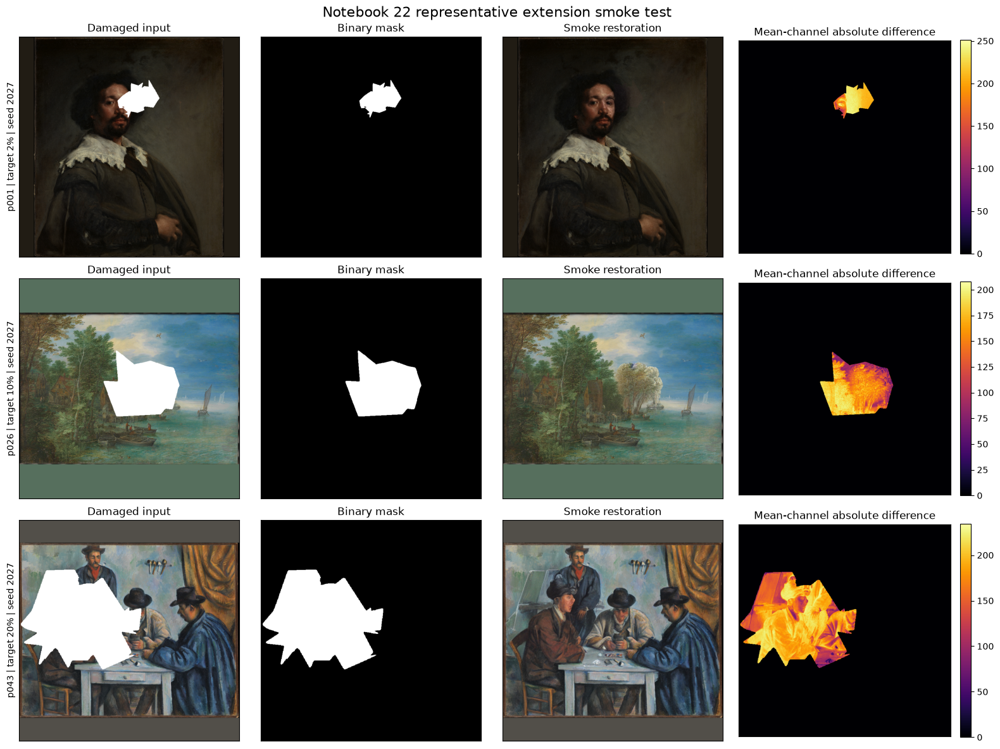

,smoke_label,restored_path,file_exists,width,height,mode,format,maximum_mean_channel_difference,mean_channel_difference
0,low_damage_p001_02pct,work/smoke/low_damage_p001_02pct.png,True,768,768,RGB,PNG,251.000000,3.693350
1,mid_damage_p026_10pct,work/smoke/mid_damage_p026_10pct.png,True,768,768,RGB,PNG,207.666667,10.384316
2,high_damage_p043_20pct,work/smoke/high_damage_p043_20pct.png,True,768,768,RGB,PNG,234.666667,27.830250


,candidate_id,case_id,file_exists,geometry_valid,checksum_matches,outside_mask_changed_pixels,inside_mask_changed_pixels,zero_control_valid,passed,details,smoke_label,painting_id,target_damage_fraction,seed,runtime_seconds
0,smoke__n22__low_damage_p001_02pct,damage_size__p001__loss_large__size_02pct,True,True,True,0,10184,True,True,,low_damage_p001_02pct,p001,0.02,2027,13.749473
1,smoke__n22__mid_damage_p026_10pct,damage_size__p026__loss_large__size_10pct,True,True,True,0,40627,True,True,,mid_damage_p026_10pct,p026,0.10,2027,7.054220
2,smoke__n22__high_damage_p043_20pct,damage_size__p043__loss_large__size_20pct,True,True,True,0,93850,True,True,,high_damage_p043_20pct,p043,0.20,2027,7.654576


Notebook 22 smoke outputs reloaded.
Output audits passed: 3 / 3
Outside-mask changed pixels: [0, 0, 0]
Inside-mask changed pixels: [10184, 40627, 93850]


In [16]:
# ---------------------------------------------------------------------------
# Reload and validate every smoke output
# ---------------------------------------------------------------------------

smoke_output_audit_df = (
    validate_candidate_outputs(
        smoke_results_df,
        project_root=PROJECT_ROOT,
        notebook_output_root=(
            NOTEBOOK_OUTPUT_ROOT
        ),
    )
)

smoke_output_audit_df = (
    smoke_output_audit_df.merge(
        smoke_results_df[
            [
                "candidate_id",
                "smoke_label",
                "painting_id",
                "target_damage_fraction",
                "seed",
                "runtime_seconds",
            ]
        ],
        on="candidate_id",
        how="left",
        validate="one_to_one",
    )
)

smoke_visual_records = []

figure, axes = plt.subplots(
    nrows=len(smoke_results_df),
    ncols=4,
    figsize=(16, 12),
    squeeze=False,
)

for row_index, result in (
    smoke_results_df
    .reset_index(drop=True)
    .iterrows()
):
    candidate = result.to_dict()

    prepared = prepare_inpaint_inputs(
        candidate,
        project_root=PROJECT_ROOT,
    )

    source_array = np.asarray(
        prepared["source_image"],
        dtype=np.uint8,
    )

    binary_mask = np.asarray(
        prepared["binary_mask"],
        dtype=np.uint8,
    )

    restored_path = (
        NOTEBOOK_OUTPUT_ROOT
        / Path(
            str(
                result["restored_path"]
            )
        )
    )

    with Image.open(
        restored_path
    ) as restored_image:
        restored_array = np.asarray(
            restored_image.convert("RGB"),
            dtype=np.uint8,
        )

        restored_size = (
            restored_image.size
        )
        restored_mode = (
            restored_image.mode
        )
        restored_format = (
            restored_image.format
        )

    absolute_difference = np.abs(
        restored_array.astype(np.int16)
        - source_array.astype(np.int16)
    ).mean(axis=2)

    smoke_visual_records.append(
        {
            "smoke_label": (
                result["smoke_label"]
            ),
            "restored_path": (
                result["restored_path"]
            ),
            "file_exists": (
                restored_path.is_file()
            ),
            "width": int(
                restored_size[0]
            ),
            "height": int(
                restored_size[1]
            ),
            "mode": restored_mode,
            "format": restored_format,
            "maximum_mean_channel_difference": float(
                absolute_difference.max()
            ),
            "mean_channel_difference": float(
                absolute_difference.mean()
            ),
        }
    )

    axes[row_index, 0].imshow(
        source_array
    )
    axes[row_index, 0].set_title(
        "Damaged input"
    )

    axes[row_index, 1].imshow(
        binary_mask,
        cmap="gray",
        vmin=0,
        vmax=255,
    )
    axes[row_index, 1].set_title(
        "Binary mask"
    )

    axes[row_index, 2].imshow(
        restored_array
    )
    axes[row_index, 2].set_title(
        "Smoke restoration"
    )

    difference_artist = (
        axes[row_index, 3].imshow(
            absolute_difference,
            cmap="inferno",
            vmin=0,
            vmax=max(
                1.0,
                float(
                    absolute_difference.max()
                ),
            ),
        )
    )

    axes[row_index, 3].set_title(
        "Mean-channel absolute difference"
    )

    row_title = (
        f"{result['painting_id']} | "
        f"target "
        f"{float(result['target_damage_fraction']):.0%} | "
        f"seed {int(result['seed'])}"
    )

    axes[row_index, 0].set_ylabel(
        row_title,
        fontsize=10,
    )

    figure.colorbar(
        difference_artist,
        ax=axes[row_index, 3],
        fraction=0.046,
        pad=0.04,
    )

    for axis in axes[row_index]:
        axis.set_xticks([])
        axis.set_yticks([])

figure.suptitle(
    "Notebook 22 representative extension smoke test",
    fontsize=16,
)

figure.tight_layout()
plt.show()

smoke_visual_audit_df = pd.DataFrame(
    smoke_visual_records
)

display(smoke_visual_audit_df)
display(smoke_output_audit_df)

print("Notebook 22 smoke outputs reloaded.")
print(
    "Output audits passed:",
    int(
        smoke_output_audit_df[
            "passed"
        ].sum()
    ),
    "/",
    len(smoke_output_audit_df),
)
print(
    "Outside-mask changed pixels:",
    smoke_output_audit_df[
        "outside_mask_changed_pixels"
    ].astype(int).tolist(),
)
print(
    "Inside-mask changed pixels:",
    smoke_output_audit_df[
        "inside_mask_changed_pixels"
    ].astype(int).tolist(),
)

In [17]:
# ---------------------------------------------------------------------------
# Idempotent Batch 3 validation assembly
# ---------------------------------------------------------------------------

preserved_validation_checks = tuple(
    check
    for check in VALIDATION.checks
    if check.validation_stage
    != "batch_3_smoke_test"
)

VALIDATION = ValidationCollector()
VALIDATION.extend(
    preserved_validation_checks
)


def add_batch_3_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage=(
            "batch_3_smoke_test"
        ),
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


add_batch_3_check(
    "pipeline_device",
    (
        "The pinned pipeline executes on CUDA "
        "without CPU fallback."
    ),
    "cuda",
    EFFECTIVE_DEVICE,
    EFFECTIVE_DEVICE == "cuda",
)

add_batch_3_check(
    "pipeline_scheduler",
    (
        "The loaded pipeline uses the frozen "
        "DDIM scheduler."
    ),
    "DDIMScheduler",
    pipeline_scheduler_name,
    (
        pipeline_scheduler_name
        == "DDIMScheduler"
    ),
)

add_batch_3_check(
    "pipeline_safety_policy",
    (
        "The safety checker is disabled according "
        "to the frozen research-dataset policy."
    ),
    True,
    PIPELINE_PREFLIGHT[
        "safety_checker_disabled"
    ],
    PIPELINE_PREFLIGHT[
        "safety_checker_disabled"
    ],
)

add_batch_3_check(
    "smoke_case_count",
    (
        "Exactly three representative execution-QA "
        "cases were selected."
    ),
    3,
    len(smoke_specifications_df),
    (
        len(smoke_specifications_df) == 3
        and smoke_specifications_df[
            "case_id"
        ].is_unique
    ),
)

observed_smoke_targets = sorted(
    smoke_specifications_df[
        "target_damage_fraction"
    ].astype(float).tolist()
)

add_batch_3_check(
    "smoke_damage_levels",
    (
        "The smoke design covers the approved low, "
        "intermediate, and high target levels."
    ),
    [0.02, 0.10, 0.20],
    observed_smoke_targets,
    np.allclose(
        observed_smoke_targets,
        [0.02, 0.10, 0.20],
        rtol=0.0,
        atol=1e-12,
    ),
)

observed_smoke_paintings = (
    smoke_specifications_df[
        "painting_id"
    ].astype(str).tolist()
)

add_batch_3_check(
    "smoke_painting_selection",
    (
        "The smoke cases use the declared three "
        "painting trajectories."
    ),
    ["p001", "p026", "p043"],
    observed_smoke_paintings,
    (
        observed_smoke_paintings
        == ["p001", "p026", "p043"]
    ),
)

observed_smoke_seeds = sorted(
    smoke_results_df[
        "seed"
    ].astype(int).unique().tolist()
)

add_batch_3_check(
    "smoke_seed",
    (
        "Every smoke candidate uses the first new "
        "extension seed."
    ),
    [2027],
    observed_smoke_seeds,
    observed_smoke_seeds == [2027],
)

add_batch_3_check(
    "smoke_prompt_contract",
    (
        "Every smoke candidate retains the frozen "
        "generic prompt policy."
    ),
    {
        "prompt_policy_id": (
            POPULATION[
                "prompt_policy_id"
            ]
        ),
        "prompt_variant_id": (
            POPULATION[
                "prompt_variant_id"
            ]
        ),
    },
    {
        "prompt_policy_ids": sorted(
            smoke_results_df[
                "prompt_policy_id"
            ].astype(str).unique().tolist()
        ),
        "prompt_variant_ids": sorted(
            smoke_results_df[
                "prompt_variant_id"
            ].astype(str).unique().tolist()
        ),
    },
    (
        smoke_results_df[
            "prompt_policy_id"
        ].astype(str).eq(
            POPULATION[
                "prompt_policy_id"
            ]
        ).all()
        and smoke_results_df[
            "prompt_variant_id"
        ].astype(str).eq(
            POPULATION[
                "prompt_variant_id"
            ]
        ).all()
    ),
)

add_batch_3_check(
    "smoke_completion",
    (
        "All three smoke candidates completed "
        "successfully."
    ),
    3,
    int(
        smoke_results_df[
            "status"
        ].eq("completed").sum()
    ),
    (
        len(smoke_results_df) == 3
        and smoke_results_df[
            "status"
        ].eq("completed").all()
    ),
    details=(
        smoke_results_df[
            [
                "smoke_label",
                "status",
                "issue",
            ]
        ].to_dict("records")
    ),
)

observed_smoke_actions = {
    str(key): int(value)
    for key, value in (
        smoke_results_df[
            "execution_action"
        ]
        .value_counts()
        .items()
    )
}

add_batch_3_check(
    "smoke_execution_actions",
    (
        "Every nonzero damage-size smoke case uses "
        "Stable Diffusion inference."
    ),
    {
        "stable_diffusion_inpaint": 3,
    },
    observed_smoke_actions,
    (
        observed_smoke_actions
        == {
            "stable_diffusion_inpaint": 3,
        }
    ),
)

add_batch_3_check(
    "smoke_output_contract",
    (
        "Every smoke output passes readability, "
        "geometry, checksum, compositing, and "
        "outside-mask validation."
    ),
    3,
    int(
        smoke_output_audit_df[
            "passed"
        ].sum()
    ),
    (
        len(smoke_output_audit_df) == 3
        and smoke_output_audit_df[
            "passed"
        ].all()
    ),
    details=(
        smoke_output_audit_df
        .to_dict("records")
    ),
)

add_batch_3_check(
    "smoke_inside_mask_change",
    (
        "Every smoke restoration changes at least "
        "one pixel inside its approved mask."
    ),
    "> 0 for all three cases",
    smoke_output_audit_df[
        "inside_mask_changed_pixels"
    ].astype(int).tolist(),
    smoke_output_audit_df[
        "inside_mask_changed_pixels"
    ].astype(int).gt(0).all(),
)

add_batch_3_check(
    "smoke_outside_mask_invariance",
    (
        "Every smoke restoration preserves all "
        "pixels outside its mask exactly."
    ),
    0,
    smoke_output_audit_df[
        "outside_mask_changed_pixels"
    ].astype(int).tolist(),
    smoke_output_audit_df[
        "outside_mask_changed_pixels"
    ].astype(int).eq(0).all(),
)

smoke_paths_owned = bool(
    smoke_results_df[
        "restored_path"
    ]
    .astype(str)
    .str.startswith(
        "work/smoke/"
    )
    .all()
)

add_batch_3_check(
    "smoke_output_ownership",
    (
        "Every smoke image is owned by the "
        "Notebook 22 temporary work directory."
    ),
    True,
    smoke_paths_owned,
    smoke_paths_owned,
)

smoke_png_files = sorted(
    SMOKE_ROOT.glob("*.png")
)

add_batch_3_check(
    "smoke_file_count",
    (
        "Exactly three temporary smoke PNG files "
        "exist."
    ),
    3,
    len(smoke_png_files),
    len(smoke_png_files) == 3,
    details=[
        to_repo_relative(
            path,
            PROJECT_ROOT,
        )
        for path in smoke_png_files
    ],
)

canonical_files_after_batch_3 = [
    path
    for key, path in OUTPUTS.items()
    if key not in {
        "restored_images",
        "uncertainty_images",
    }
    and path.exists()
]

canonical_restoration_files = sorted(
    RESTORED_IMAGE_ROOT.rglob("*.png")
)

canonical_uncertainty_images = sorted(
    UNCERTAINTY_IMAGE_ROOT.rglob("*.png")
)

unexpected_canonical_files = [
    *canonical_files_after_batch_3,
    *canonical_restoration_files,
    *canonical_uncertainty_images,
]

add_batch_3_check(
    "no_canonical_outputs_written",
    (
        "The smoke test wrote no canonical "
        "candidate, metric, map, figure, manifest, "
        "validation, or restoration artifact."
    ),
    0,
    len(unexpected_canonical_files),
    len(unexpected_canonical_files) == 0,
    details=[
        to_repo_relative(
            path,
            PROJECT_ROOT,
        )
        for path in unexpected_canonical_files
    ],
)

batch_3_validation_df = (
    VALIDATION.to_dataframe()
    .loc[
        lambda frame: frame[
            "validation_stage"
        ].eq(
            "batch_3_smoke_test"
        )
    ]
    .reset_index(drop=True)
)

display(
    smoke_results_df[
        [
            "smoke_label",
            "case_id",
            "painting_id",
            "target_damage_fraction",
            "seed",
            "execution_action",
            "runtime_seconds",
            "gpu_peak_memory_bytes",
            "retry_count",
            "attempt_count",
            "status",
            "issue",
        ]
    ]
)

display(smoke_output_audit_df)
display(batch_3_validation_df)

VALIDATION.raise_for_blocking()

print("Notebook 22 Batch 3 summary")
print("---------------------------")
print(
    "Batch 3 checks:",
    len(batch_3_validation_df),
)
print(
    "Cumulative checks:",
    len(VALIDATION.checks),
)
print(
    "Blocking failures:",
    len(
        VALIDATION.blocking_failures
    ),
)
print(
    "Smoke candidates completed:",
    int(
        smoke_results_df[
            "status"
        ].eq("completed").sum()
    ),
)
print(
    "Temporary smoke images:",
    len(smoke_png_files),
)
print(
    "Canonical outputs written:",
    len(unexpected_canonical_files),
)
print(
    "Full "
    f"{EXPECTED_COUNTS['new_candidates']}-candidate "
    "execution started: No"
)
print("Batch 3 completion gate passed.")

,smoke_label,case_id,painting_id,target_damage_fraction,seed,execution_action,runtime_seconds,gpu_peak_memory_bytes,retry_count,attempt_count,status,issue
0,low_damage_p001_02pct,damage_size__p001__loss_large__size_02pct,p001,0.02,2027,stable_diffusion_inpaint,13.749473,2818632192,0,1,completed,
1,mid_damage_p026_10pct,damage_size__p026__loss_large__size_10pct,p026,0.10,2027,stable_diffusion_inpaint,7.054220,2818632192,0,1,completed,
2,high_damage_p043_20pct,damage_size__p043__loss_large__size_20pct,p043,0.20,2027,stable_diffusion_inpaint,7.654576,2818632192,0,1,completed,


,candidate_id,case_id,file_exists,geometry_valid,checksum_matches,outside_mask_changed_pixels,inside_mask_changed_pixels,zero_control_valid,passed,details,smoke_label,painting_id,target_damage_fraction,seed,runtime_seconds
0,smoke__n22__low_damage_p001_02pct,damage_size__p001__loss_large__size_02pct,True,True,True,0,10184,True,True,,low_damage_p001_02pct,p001,0.02,2027,13.749473
1,smoke__n22__mid_damage_p026_10pct,damage_size__p026__loss_large__size_10pct,True,True,True,0,40627,True,True,,mid_damage_p026_10pct,p026,0.10,2027,7.054220
2,smoke__n22__high_damage_p043_20pct,damage_size__p043__loss_large__size_20pct,True,True,True,0,93850,True,True,,high_damage_p043_20pct,p043,0.20,2027,7.654576


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_3_smoke_test,pipeline_device,The pinned pipeline executes on CUDA without C...,blocking,cuda,cuda,True,
1,batch_3_smoke_test,pipeline_scheduler,The loaded pipeline uses the frozen DDIM sched...,blocking,DDIMScheduler,DDIMScheduler,True,
2,batch_3_smoke_test,pipeline_safety_policy,The safety checker is disabled according to th...,blocking,True,True,True,
3,batch_3_smoke_test,smoke_case_count,Exactly three representative execution-QA case...,blocking,3,3,True,
4,batch_3_smoke_test,smoke_damage_levels,"The smoke design covers the approved low, inte...",blocking,"[0.02, 0.1, 0.2]","[0.02, 0.1, 0.2]",True,
5,batch_3_smoke_test,smoke_painting_selection,The smoke cases use the declared three paintin...,blocking,"[""p001"", ""p026"", ""p043""]","[""p001"", ""p026"", ""p043""]",True,
6,batch_3_smoke_test,smoke_seed,Every smoke candidate uses the first new exten...,blocking,[2027],[2027],True,
7,batch_3_smoke_test,smoke_prompt_contract,Every smoke candidate retains the frozen gener...,blocking,"{""prompt_policy_id"": ""sd15_prompt_policy.v3"", ...","{""prompt_policy_ids"": [""sd15_prompt_policy.v3""...",True,
8,batch_3_smoke_test,smoke_completion,All three smoke candidates completed successfu...,blocking,3,3,True,"[{""issue"": """", ""smoke_label"": ""low_damage_p001..."
9,batch_3_smoke_test,smoke_execution_actions,Every nonzero damage-size smoke case uses Stab...,blocking,"{""stable_diffusion_inpaint"": 3}","{""stable_diffusion_inpaint"": 3}",True,


Notebook 22 Batch 3 summary
---------------------------
Batch 3 checks: 16
Cumulative checks: 109
Blocking failures: 0
Smoke candidates completed: 3
Temporary smoke images: 3
Canonical outputs written: 0
Full 735-candidate execution started: No
Batch 3 completion gate passed.


## Batch 4 — Full resumable extension generation

This batch generates the 735 Notebook 22-owned Stable Diffusion candidates required to complete the Controlled-300 damage-size uncertainty population.

It:

- reuses the smoke-validated pipeline when available;
- otherwise reloads the pinned pipeline;
- verifies the exact 735-row execution plan;
- estimates runtime and storage from the smoke test and measured pilot runtime;
- generates seeds `2027`, `2028`, and `2029` for all 245 damage-size cases;
- prints progress every ten candidates;
- checkpoints every five candidates;
- validates checkpoints before reuse;
- preserves the exact declared seed when retrying;
- reloads and audits every generated image;
- combines the 735 new candidates with 245 Notebook 11 anchors;
- verifies all 245 four-seed groups;
- renders three representative complete seed groups.

The generated restoration images are canonical Notebook 22 outputs. The checkpoint remains temporary work evidence. The canonical candidate table, uncertainty metrics, maps, figures, and manifests are written only after their later validation gates.

In [18]:
import shutil

from restoration_eval.damage_size_diffusion_uncertainty import (
    build_complete_uncertainty_worklist,
)

from restoration_eval.restoration_stable_diffusion import (
    load_stable_diffusion_pipeline,
    run_stable_diffusion_candidates,
    validate_candidate_outputs,
)


# ---------------------------------------------------------------------------
# Restore the smoke-validated pipeline if the kernel was restarted
# ---------------------------------------------------------------------------

pipeline_reloaded_for_batch_4 = False

if (
    "stable_diffusion_pipeline"
    not in globals()
    or stable_diffusion_pipeline is None
):
    if not torch.cuda.is_available():
        raise RuntimeError(
            "CUDA is unavailable. Notebook 22 "
            "prohibits silent CPU fallback."
        )

    print(
        "The pipeline is not in memory; loading the "
        "pinned model before full execution."
    )

    pipeline_reload_started = (
        time.perf_counter()
    )

    stable_diffusion_pipeline, EFFECTIVE_DEVICE = (
        load_stable_diffusion_pipeline(
            effective_generation_config
        )
    )

    pipeline_reload_seconds = (
        time.perf_counter()
        - pipeline_reload_started
    )

    pipeline_reloaded_for_batch_4 = True

    print(
        "Pipeline reload seconds:",
        round(
            pipeline_reload_seconds,
            3,
        ),
    )
else:
    print(
        "Reusing the smoke-validated pipeline "
        "already loaded in GPU memory."
    )


# ---------------------------------------------------------------------------
# Runtime and storage estimates
# ---------------------------------------------------------------------------

expected_new_candidates = int(
    EXPECTED_COUNTS["new_candidates"]
)

expected_generated_seeds = sorted(
    int(seed)
    for seed in POPULATION[
        "generated_seeds"
    ]
)

completed_smoke_runtimes = (
    smoke_results_df.loc[
        smoke_results_df[
            "execution_action"
        ].eq(
            "stable_diffusion_inpaint"
        ),
        "runtime_seconds",
    ]
    .astype(float)
    .reset_index(drop=True)
)

if len(completed_smoke_runtimes) < 2:
    raise RuntimeError(
        "At least two completed smoke inferences "
        "are required for the execution estimate."
    )

# Exclude the first inference because it includes
# additional warm-up overhead.
steady_smoke_runtime_seconds = float(
    completed_smoke_runtimes.iloc[1:].median()
)

# The Controlled-50 N22 pilot recorded a 10.775-second
# median across 105 candidates. Use the slower of the
# current warm smoke value and that observed pilot value
# so the planning estimate does not ignore thermal slowdown.
pilot_median_runtime_seconds = 10.775

planning_candidate_runtime_seconds = max(
    steady_smoke_runtime_seconds,
    pilot_median_runtime_seconds,
)

estimated_execution_seconds = (
    planning_candidate_runtime_seconds
    * expected_new_candidates
)

estimated_execution_minutes = (
    estimated_execution_seconds / 60.0
)

smoke_file_sizes = pd.Series(
    [
        (
            NOTEBOOK_OUTPUT_ROOT
            / Path(relative_path)
        ).stat().st_size
        for relative_path in (
            smoke_results_df[
                "restored_path"
            ].astype(str)
        )
    ],
    dtype="int64",
)

estimated_restored_bytes = int(
    smoke_file_sizes.mean()
    * expected_new_candidates
)

disk_usage = shutil.disk_usage(
    NOTEBOOK_OUTPUT_ROOT
)

minimum_free_bytes = max(
    estimated_restored_bytes * 3,
    1024 ** 3,
)

storage_preflight_passed = bool(
    disk_usage.free >= minimum_free_bytes
)


# ---------------------------------------------------------------------------
# Existing resume state
# ---------------------------------------------------------------------------

checkpoint_path = WORK_PATHS[
    "candidate_checkpoint"
]

if checkpoint_path.is_file():
    existing_checkpoint_df = pd.read_csv(
        checkpoint_path,
        low_memory=False,
    )
    existing_checkpoint_rows = len(
        existing_checkpoint_df
    )
else:
    existing_checkpoint_df = pd.DataFrame()
    existing_checkpoint_rows = 0

existing_canonical_images = sorted(
    RESTORED_IMAGE_ROOT.rglob("*.png")
)

plan_fingerprints = sorted(
    extension_candidate_plan_df[
        "configuration_fingerprint"
    ].astype(str).unique().tolist()
)

execution_preflight_df = pd.DataFrame(
    [
        {
            "preflight_item": "effective_device",
            "observed": EFFECTIVE_DEVICE,
            "required": "cuda",
            "passed": EFFECTIVE_DEVICE == "cuda",
        },
        {
            "preflight_item": (
                "extension_candidate_count"
            ),
            "observed": len(
                extension_candidate_plan_df
            ),
            "required": expected_new_candidates,
            "passed": (
                len(
                    extension_candidate_plan_df
                )
                == expected_new_candidates
            ),
        },
        {
            "preflight_item": (
                "unique_candidate_ids"
            ),
            "observed": (
                extension_candidate_plan_df[
                    "candidate_id"
                ].nunique()
            ),
            "required": expected_new_candidates,
            "passed": (
                extension_candidate_plan_df[
                    "candidate_id"
                ].is_unique
                and extension_candidate_plan_df[
                    "candidate_id"
                ].nunique()
                == expected_new_candidates
            ),
        },
        {
            "preflight_item": (
                "unique_output_paths"
            ),
            "observed": (
                extension_candidate_plan_df[
                    "restored_path"
                ].nunique()
            ),
            "required": expected_new_candidates,
            "passed": (
                extension_candidate_plan_df[
                    "restored_path"
                ].is_unique
                and extension_candidate_plan_df[
                    "restored_path"
                ].nunique()
                == expected_new_candidates
            ),
        },
        {
            "preflight_item": (
                "generated_seed_set"
            ),
            "observed": sorted(
                extension_candidate_plan_df[
                    "seed"
                ].astype(int).unique().tolist()
            ),
            "required": expected_generated_seeds,
            "passed": (
                set(
                    extension_candidate_plan_df[
                        "seed"
                    ].astype(int)
                )
                == set(expected_generated_seeds)
            ),
        },
        {
            "preflight_item": (
                "single_configuration_fingerprint"
            ),
            "observed": len(plan_fingerprints),
            "required": 1,
            "passed": len(plan_fingerprints) == 1,
        },
        {
            "preflight_item": "resume_enabled",
            "observed": EXECUTION_POLICY[
                "resume_enabled"
            ],
            "required": True,
            "passed": bool(
                EXECUTION_POLICY[
                    "resume_enabled"
                ]
            ),
        },
        {
            "preflight_item": (
                "progress_interval_candidates"
            ),
            "observed": EXECUTION_POLICY[
                "progress_interval_candidates"
            ],
            "required": 10,
            "passed": (
                int(
                    EXECUTION_POLICY[
                        "progress_interval_candidates"
                    ]
                ) == 10
            ),
        },
        {
            "preflight_item": (
                "checkpoint_interval_candidates"
            ),
            "observed": EXECUTION_POLICY[
                "checkpoint_interval_candidates"
            ],
            "required": 5,
            "passed": (
                int(
                    EXECUTION_POLICY[
                        "checkpoint_interval_candidates"
                    ]
                ) == 5
            ),
        },
        {
            "preflight_item": (
                "available_storage_bytes"
            ),
            "observed": int(disk_usage.free),
            "required": int(minimum_free_bytes),
            "passed": storage_preflight_passed,
        },
    ]
)

display(execution_preflight_df)

if not execution_preflight_df[
    "passed"
].all():
    display(
        execution_preflight_df.loc[
            ~execution_preflight_df[
                "passed"
            ]
        ]
    )

    raise RuntimeError(
        "Notebook 22 full-generation "
        "preflight failed."
    )

print("Notebook 22 execution preflight passed.")
print(
    "Smoke steady-state seconds per candidate:",
    round(
        steady_smoke_runtime_seconds,
        3,
    ),
)
print(
    "Planning seconds per candidate:",
    round(
        planning_candidate_runtime_seconds,
        3,
    ),
)
print(
    "Estimated generation minutes:",
    round(
        estimated_execution_minutes,
        1,
    ),
)
print(
    "Estimated restored-image storage (MiB):",
    round(
        estimated_restored_bytes
        / (1024 ** 2),
        1,
    ),
)
print(
    "Available storage (GiB):",
    round(
        disk_usage.free
        / (1024 ** 3),
        2,
    ),
)
print(
    "Existing checkpoint rows:",
    existing_checkpoint_rows,
)
print(
    "Existing canonical images:",
    len(existing_canonical_images),
)
print(
    "Pipeline reloaded in Batch 4:",
    pipeline_reloaded_for_batch_4,
)

Reusing the smoke-validated pipeline already loaded in GPU memory.


,preflight_item,observed,required,passed
0,effective_device,cuda,cuda,True
1,extension_candidate_count,735,735,True
2,unique_candidate_ids,735,735,True
3,unique_output_paths,735,735,True
4,generated_seed_set,"[2027, 2028, 2029]","[2027, 2028, 2029]",True
5,single_configuration_fingerprint,1,1,True
6,resume_enabled,True,True,True
7,progress_interval_candidates,10,10,True
8,checkpoint_interval_candidates,5,5,True
9,available_storage_bytes,826480771072,1644408150,True


Notebook 22 execution preflight passed.
Smoke steady-state seconds per candidate: 7.354
Planning seconds per candidate: 10.775
Estimated generation minutes: 132.0
Estimated restored-image storage (MiB): 522.7
Available storage (GiB): 769.72
Existing checkpoint rows: 0
Existing canonical images: 0
Pipeline reloaded in Batch 4: False


In [19]:
# ---------------------------------------------------------------------------
# Execute or strictly resume all 105 extension candidates
# ---------------------------------------------------------------------------

FULL_EXECUTION_STARTED_AT_UTC = (
    datetime.now(timezone.utc)
    .isoformat()
    .replace("+00:00", "Z")
)

full_execution_started = (
    time.perf_counter()
)

extension_execution_df = (
    run_stable_diffusion_candidates(
        extension_candidate_plan_df,
        pipeline=stable_diffusion_pipeline,
        device=EFFECTIVE_DEVICE,
        project_root=PROJECT_ROOT,
        notebook_output_root=(
            NOTEBOOK_OUTPUT_ROOT
        ),
        config=(
            effective_generation_config
        ),
        checkpoint_path=(
            checkpoint_path
        ),
        progress_callback=print,
    )
)

full_execution_seconds = (
    time.perf_counter()
    - full_execution_started
)

FULL_EXECUTION_COMPLETED_AT_UTC = (
    datetime.now(timezone.utc)
    .isoformat()
    .replace("+00:00", "Z")
)

extension_completion_validation = (
    validate_extension_candidate_plan(
        extension_execution_df,
        config=extension_config,
        require_completed=True,
    )
)

failed_extension_candidates_df = (
    extension_execution_df.loc[
        ~extension_execution_df[
            "status"
        ].eq("completed")
    ]
    .copy()
)

if not failed_extension_candidates_df.empty:
    display(
        failed_extension_candidates_df[
            [
                "candidate_id",
                "case_id",
                "painting_id",
                "seed",
                "attempt_count",
                "status",
                "issue",
            ]
        ]
    )

    raise RuntimeError(
        "One or more extension candidates failed. "
        "The checkpoint was retained; rerun this "
        "cell to validate and resume."
    )

if not extension_completion_validation[
    "passed"
]:
    raise ValueError(
        "Completed extension candidates violate "
        "the approved schema or population contract: "
        f"{extension_completion_validation}"
    )

execution_action_counts = {
    str(key): int(value)
    for key, value in (
        extension_execution_df[
            "execution_action"
        ]
        .value_counts()
        .items()
    )
}

print("Notebook 22 full generation completed.")
print(
    "Completed candidates:",
    int(
        extension_execution_df[
            "status"
        ].eq("completed").sum()
    ),
)
print(
    "Execution actions:",
    execution_action_counts,
)
print(
    "Runtime minutes:",
    round(
        full_execution_seconds / 60.0,
        2,
    ),
)
print(
    "Median candidate runtime seconds:",
    round(
        float(
            extension_execution_df[
                "runtime_seconds"
            ].astype(float).median()
        ),
        3,
    ),
)
print(
    "Maximum retries observed:",
    int(
        extension_execution_df[
            "retry_count"
        ].astype(int).max()
    ),
)
print(
    "Checkpoint:",
    to_repo_relative(
        checkpoint_path,
        PROJECT_ROOT,
    ),
)

100%|██████████| 30/30 [00:05<00:00,  5.19it/s]


Stable Diffusion candidates: 10/735 | completed=10 | failed=0


100%|██████████| 30/30 [00:06<00:00,  4.96it/s]


Stable Diffusion candidates: 20/735 | completed=20 | failed=0


100%|██████████| 30/30 [00:06<00:00,  4.68it/s]


Stable Diffusion candidates: 30/735 | completed=30 | failed=0


100%|██████████| 30/30 [00:07<00:00,  4.17it/s]


Stable Diffusion candidates: 40/735 | completed=40 | failed=0


100%|██████████| 30/30 [00:07<00:00,  3.84it/s]


Stable Diffusion candidates: 50/735 | completed=50 | failed=0


100%|██████████| 30/30 [00:07<00:00,  4.10it/s]


Stable Diffusion candidates: 60/735 | completed=60 | failed=0


100%|██████████| 30/30 [00:06<00:00,  4.36it/s]


Stable Diffusion candidates: 70/735 | completed=70 | failed=0


100%|██████████| 30/30 [00:06<00:00,  4.37it/s]


Stable Diffusion candidates: 80/735 | completed=80 | failed=0


100%|██████████| 30/30 [00:06<00:00,  4.42it/s]


Stable Diffusion candidates: 90/735 | completed=90 | failed=0


100%|██████████| 30/30 [00:07<00:00,  4.05it/s]


Stable Diffusion candidates: 100/735 | completed=100 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.63it/s]


Stable Diffusion candidates: 110/735 | completed=110 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.65it/s]


Stable Diffusion candidates: 120/735 | completed=120 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.59it/s]


Stable Diffusion candidates: 130/735 | completed=130 | failed=0


100%|██████████| 30/30 [00:07<00:00,  4.09it/s]


Stable Diffusion candidates: 140/735 | completed=140 | failed=0


100%|██████████| 30/30 [00:07<00:00,  3.99it/s]


Stable Diffusion candidates: 150/735 | completed=150 | failed=0


100%|██████████| 30/30 [00:07<00:00,  4.07it/s]


Stable Diffusion candidates: 160/735 | completed=160 | failed=0


100%|██████████| 30/30 [00:06<00:00,  4.37it/s]


Stable Diffusion candidates: 170/735 | completed=170 | failed=0


100%|██████████| 30/30 [00:07<00:00,  3.96it/s]


Stable Diffusion candidates: 180/735 | completed=180 | failed=0


100%|██████████| 30/30 [00:07<00:00,  4.10it/s]


Stable Diffusion candidates: 190/735 | completed=190 | failed=0


100%|██████████| 30/30 [00:07<00:00,  4.00it/s]


Stable Diffusion candidates: 200/735 | completed=200 | failed=0


100%|██████████| 30/30 [00:07<00:00,  3.93it/s]


Stable Diffusion candidates: 210/735 | completed=210 | failed=0


100%|██████████| 30/30 [00:07<00:00,  4.17it/s]


Stable Diffusion candidates: 220/735 | completed=220 | failed=0


100%|██████████| 30/30 [00:07<00:00,  4.07it/s]


Stable Diffusion candidates: 230/735 | completed=230 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.57it/s]


Stable Diffusion candidates: 240/735 | completed=240 | failed=0


100%|██████████| 30/30 [00:07<00:00,  4.01it/s]


Stable Diffusion candidates: 250/735 | completed=250 | failed=0


100%|██████████| 30/30 [00:07<00:00,  3.87it/s]


Stable Diffusion candidates: 260/735 | completed=260 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.72it/s]


Stable Diffusion candidates: 270/735 | completed=270 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.53it/s]


Stable Diffusion candidates: 280/735 | completed=280 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.56it/s]


Stable Diffusion candidates: 290/735 | completed=290 | failed=0


100%|██████████| 30/30 [00:07<00:00,  3.82it/s]


Stable Diffusion candidates: 300/735 | completed=300 | failed=0


100%|██████████| 30/30 [00:07<00:00,  3.93it/s]


Stable Diffusion candidates: 310/735 | completed=310 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.56it/s]


Stable Diffusion candidates: 320/735 | completed=320 | failed=0


100%|██████████| 30/30 [00:07<00:00,  3.92it/s]


Stable Diffusion candidates: 330/735 | completed=330 | failed=0


100%|██████████| 30/30 [00:07<00:00,  3.87it/s]


Stable Diffusion candidates: 340/735 | completed=340 | failed=0


100%|██████████| 30/30 [00:07<00:00,  3.95it/s]


Stable Diffusion candidates: 350/735 | completed=350 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.60it/s]


Stable Diffusion candidates: 360/735 | completed=360 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.67it/s]


Stable Diffusion candidates: 370/735 | completed=370 | failed=0


100%|██████████| 30/30 [00:07<00:00,  3.79it/s]


Stable Diffusion candidates: 380/735 | completed=380 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.53it/s]


Stable Diffusion candidates: 390/735 | completed=390 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.56it/s]


Stable Diffusion candidates: 400/735 | completed=400 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.52it/s]


Stable Diffusion candidates: 410/735 | completed=410 | failed=0


100%|██████████| 30/30 [00:07<00:00,  3.97it/s]


Stable Diffusion candidates: 420/735 | completed=420 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.65it/s]


Stable Diffusion candidates: 430/735 | completed=430 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.56it/s]


Stable Diffusion candidates: 440/735 | completed=440 | failed=0


100%|██████████| 30/30 [00:07<00:00,  3.80it/s]


Stable Diffusion candidates: 450/735 | completed=450 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.58it/s]


Stable Diffusion candidates: 460/735 | completed=460 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.66it/s]


Stable Diffusion candidates: 470/735 | completed=470 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.53it/s]


Stable Diffusion candidates: 480/735 | completed=480 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.72it/s]


Stable Diffusion candidates: 490/735 | completed=490 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.74it/s]


Stable Diffusion candidates: 500/735 | completed=500 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.62it/s]


Stable Diffusion candidates: 510/735 | completed=510 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.48it/s]


Stable Diffusion candidates: 520/735 | completed=520 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.56it/s]


Stable Diffusion candidates: 530/735 | completed=530 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.53it/s]


Stable Diffusion candidates: 540/735 | completed=540 | failed=0


100%|██████████| 30/30 [00:07<00:00,  3.80it/s]


Stable Diffusion candidates: 550/735 | completed=550 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.69it/s]


Stable Diffusion candidates: 560/735 | completed=560 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.55it/s]


Stable Diffusion candidates: 570/735 | completed=570 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.50it/s]


Stable Diffusion candidates: 580/735 | completed=580 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.56it/s]


Stable Diffusion candidates: 590/735 | completed=590 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.56it/s]


Stable Diffusion candidates: 600/735 | completed=600 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.55it/s]


Stable Diffusion candidates: 610/735 | completed=610 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.49it/s]


Stable Diffusion candidates: 620/735 | completed=620 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.55it/s]


Stable Diffusion candidates: 630/735 | completed=630 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.53it/s]


Stable Diffusion candidates: 640/735 | completed=640 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.53it/s]


Stable Diffusion candidates: 650/735 | completed=650 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.50it/s]


Stable Diffusion candidates: 660/735 | completed=660 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.59it/s]


Stable Diffusion candidates: 670/735 | completed=670 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.50it/s]


Stable Diffusion candidates: 680/735 | completed=680 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.48it/s]


Stable Diffusion candidates: 690/735 | completed=690 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.52it/s]


Stable Diffusion candidates: 700/735 | completed=700 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.49it/s]


Stable Diffusion candidates: 710/735 | completed=710 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.53it/s]


Stable Diffusion candidates: 720/735 | completed=720 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.50it/s]


Stable Diffusion candidates: 730/735 | completed=730 | failed=0


100%|██████████| 30/30 [00:08<00:00,  3.53it/s]


Stable Diffusion candidates: 735/735 | completed=735 | failed=0
Notebook 22 full generation completed.
Completed candidates: 735
Execution actions: {'stable_diffusion_inpaint': 735}
Runtime minutes: 107.99
Median candidate runtime seconds: 9.053
Maximum retries observed: 0
Checkpoint: outputs/22_damage_size_diffusion_uncertainty_extension/work/candidate_checkpoint.csv


In [20]:
# ---------------------------------------------------------------------------
# Validate all 105 Notebook 22-owned generated images
# ---------------------------------------------------------------------------

extension_output_audit_df = (
    validate_candidate_outputs(
        extension_execution_df,
        project_root=PROJECT_ROOT,
        notebook_output_root=(
            NOTEBOOK_OUTPUT_ROOT
        ),
    )
)

extension_output_audit_df = (
    extension_output_audit_df.merge(
        extension_execution_df[
            [
                "candidate_id",
                "painting_id",
                "seed",
                "runtime_seconds",
                "retry_count",
                "attempt_count",
                "execution_action",
                "status",
            ]
        ],
        on="candidate_id",
        how="left",
        validate="one_to_one",
    )
    .merge(
        case_fraction_lookup,
        on="case_id",
        how="left",
        validate="many_to_one",
    )
)

extension_image_records = []

for image_index, candidate in enumerate(
    extension_execution_df.itertuples(
        index=False
    ),
    start=1,
):
    restored_path = (
        NOTEBOOK_OUTPUT_ROOT
        / Path(
            str(candidate.restored_path)
        )
    )

    with Image.open(
        restored_path
    ) as image:
        image.load()

        extension_image_records.append(
            {
                "candidate_id": (
                    candidate.candidate_id
                ),
                "case_id": candidate.case_id,
                "painting_id": (
                    candidate.painting_id
                ),
                "seed": int(candidate.seed),
                "file_exists": (
                    restored_path.is_file()
                ),
                "format": image.format,
                "mode": image.mode,
                "width": int(image.width),
                "height": int(image.height),
                "size_bytes": int(
                    restored_path.stat().st_size
                ),
            }
        )

    if (
        image_index % 10 == 0
        or image_index
        == len(extension_execution_df)
    ):
        print(
            "Reloaded generated images:",
            f"{image_index}/"
            f"{len(extension_execution_df)}",
        )

extension_image_file_audit_df = (
    pd.DataFrame(
        extension_image_records
    )
)

complete_uncertainty_worklist_df = (
    build_complete_uncertainty_worklist(
        frozen_anchors_df,
        extension_execution_df,
        damage_size_cases_df,
        geometry_df,
        config=extension_config,
    )
)

complete_seed_coverage = (
    complete_uncertainty_worklist_df
    .groupby("case_id")["seed"]
    .apply(
        lambda values: tuple(
            sorted(
                values.astype(int)
            )
        )
    )
)

combined_files_exist = (
    complete_uncertainty_worklist_df[
        "restored_path"
    ].astype(str).map(
        lambda relative_path: (
            PROJECT_ROOT
            / Path(relative_path)
        ).is_file()
    )
)

print("Notebook 22 generated outputs audited.")
print(
    "Output-contract passes:",
    int(
        extension_output_audit_df[
            "passed"
        ].sum()
    ),
    "/",
    len(extension_output_audit_df),
)
print(
    "Readable RGB PNG files:",
    int(
        (
            extension_image_file_audit_df[
                "format"
            ].eq("PNG")
            & extension_image_file_audit_df[
                "mode"
            ].eq("RGB")
            & extension_image_file_audit_df[
                "width"
            ].eq(768)
            & extension_image_file_audit_df[
                "height"
            ].eq(768)
        ).sum()
    ),
    "/",
    len(extension_image_file_audit_df),
)
print(
    "Combined candidates:",
    len(
        complete_uncertainty_worklist_df
    ),
)
print(
    "Complete four-seed groups:",
    len(complete_seed_coverage),
)
print(
    "Combined restored files found:",
    int(combined_files_exist.sum()),
    "/",
    len(combined_files_exist),
)

Reloaded generated images: 10/735
Reloaded generated images: 20/735
Reloaded generated images: 30/735
Reloaded generated images: 40/735
Reloaded generated images: 50/735
Reloaded generated images: 60/735
Reloaded generated images: 70/735
Reloaded generated images: 80/735
Reloaded generated images: 90/735
Reloaded generated images: 100/735
Reloaded generated images: 110/735
Reloaded generated images: 120/735
Reloaded generated images: 130/735
Reloaded generated images: 140/735
Reloaded generated images: 150/735
Reloaded generated images: 160/735
Reloaded generated images: 170/735
Reloaded generated images: 180/735
Reloaded generated images: 190/735
Reloaded generated images: 200/735
Reloaded generated images: 210/735
Reloaded generated images: 220/735
Reloaded generated images: 230/735
Reloaded generated images: 240/735
Reloaded generated images: 250/735
Reloaded generated images: 260/735
Reloaded generated images: 270/735
Reloaded generated images: 280/735
Reloaded generated images: 29

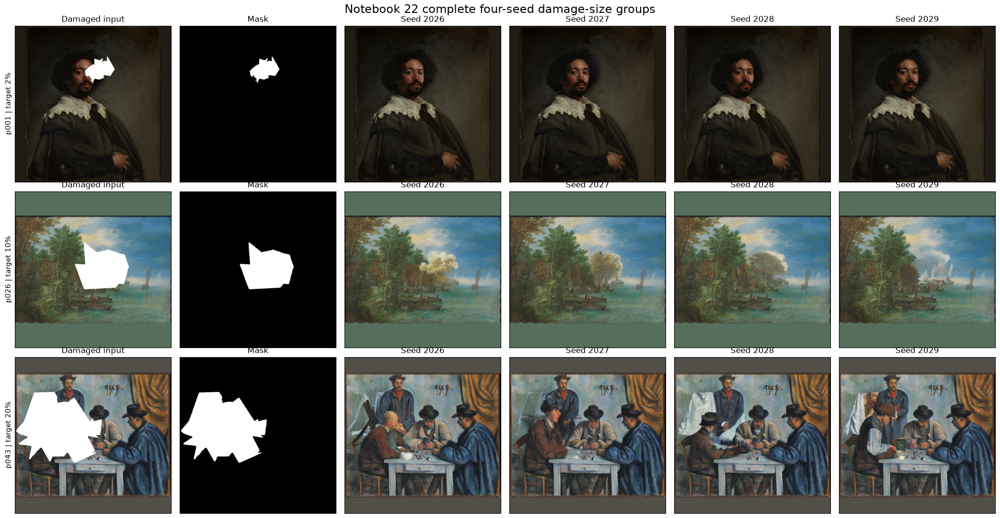

,candidate_id,case_id,painting_id,target_damage_fraction,seed,geometry_valid,checksum_matches,outside_mask_changed_pixels,inside_mask_changed_pixels,passed
0,sd15dsu__eabfb567a4493435,damage_size__p001__loss_large__size_02pct,p001,0.02,2027,True,True,0,10184,True
1,sd15dsu__5ec27a6538f033db,damage_size__p001__loss_large__size_02pct,p001,0.02,2028,True,True,0,10184,True
2,sd15dsu__084cb2679e5e71c6,damage_size__p001__loss_large__size_02pct,p001,0.02,2029,True,True,0,10184,True
3,sd15dsu__9ef12db2a653c462,damage_size__p001__loss_large__size_04pct,p001,0.04,2027,True,True,0,20367,True
4,sd15dsu__031683fe97c570d6,damage_size__p001__loss_large__size_04pct,p001,0.04,2028,True,True,0,20367,True
5,sd15dsu__68a2306103875f6c,damage_size__p001__loss_large__size_04pct,p001,0.04,2029,True,True,0,20367,True
6,sd15dsu__c9683bd024125f0f,damage_size__p001__loss_large__size_06pct,p001,0.06,2027,True,True,0,30551,True
7,sd15dsu__d089641c863da270,damage_size__p001__loss_large__size_06pct,p001,0.06,2028,True,True,0,30551,True
8,sd15dsu__914c41507a08f116,damage_size__p001__loss_large__size_06pct,p001,0.06,2029,True,True,0,30551,True
9,sd15dsu__ed576a5309a59534,damage_size__p001__loss_large__size_08pct,p001,0.08,2027,True,True,0,40735,True


Rendered complete seed groups: 3
The figure is rendered for QA only and is not written as a canonical artifact.


In [21]:
# ---------------------------------------------------------------------------
# Render low-, intermediate-, and high-damage seed groups
# ---------------------------------------------------------------------------

representative_case_ids = (
    smoke_specifications_df[
        "case_id"
    ].astype(str).tolist()
)

figure, axes = plt.subplots(
    nrows=len(representative_case_ids),
    ncols=6,
    figsize=(21, 11),
    squeeze=False,
)

for row_index, case_id in enumerate(
    representative_case_ids
):
    case_matches = (
        damage_size_cases_df.loc[
            damage_size_cases_df[
                "case_id"
            ].astype(str).eq(case_id)
        ]
    )

    if len(case_matches) != 1:
        raise ValueError(
            "Expected one case row for "
            f"{case_id!r}; observed "
            f"{len(case_matches)}."
        )

    case_row = (
        case_matches.iloc[0]
    )

    input_path = (
        PROJECT_ROOT
        / Path(
            str(
                case_row[
                    "input_image_path"
                ]
            )
        )
    )

    mask_path = (
        PROJECT_ROOT
        / Path(
            str(
                case_row[
                    "mask_or_effect_path"
                ]
            )
        )
    )

    with Image.open(
        input_path
    ) as image:
        damaged_array = np.asarray(
            image.convert("RGB"),
            dtype=np.uint8,
        )

    with Image.open(
        mask_path
    ) as image:
        mask_array = np.asarray(
            image.convert("L"),
            dtype=np.uint8,
        )

    axes[row_index, 0].imshow(
        damaged_array
    )
    axes[row_index, 0].set_title(
        "Damaged input"
    )

    axes[row_index, 1].imshow(
        mask_array,
        cmap="gray",
        vmin=0,
        vmax=255,
    )
    axes[row_index, 1].set_title(
        "Mask"
    )

    group_candidates = (
        complete_uncertainty_worklist_df.loc[
            complete_uncertainty_worklist_df[
                "case_id"
            ].astype(str).eq(case_id)
        ]
        .sort_values(
            "seed",
            kind="stable",
        )
        .reset_index(drop=True)
    )

    if len(group_candidates) != 4:
        raise ValueError(
            "Expected four candidates for "
            f"{case_id!r}; observed "
            f"{len(group_candidates)}."
        )

    for candidate_index, candidate in (
        group_candidates.iterrows()
    ):
        restored_path = (
            PROJECT_ROOT
            / Path(
                str(
                    candidate[
                        "restored_path"
                    ]
                )
            )
        )

        with Image.open(
            restored_path
        ) as image:
            restored_array = np.asarray(
                image.convert("RGB"),
                dtype=np.uint8,
            )

        axis = axes[
            row_index,
            candidate_index + 2,
        ]

        axis.imshow(restored_array)
        axis.set_title(
            f"Seed "
            f"{int(candidate['seed'])}"
        )

    row_label = (
        f"{case_row['painting_id']} | "
        f"target "
        f"{float(case_row['target_damage_fraction']):.0%}"
    )

    axes[row_index, 0].set_ylabel(
        row_label,
        fontsize=11,
    )

    for axis in axes[row_index]:
        axis.set_xticks([])
        axis.set_yticks([])

figure.suptitle(
    "Notebook 22 complete four-seed "
    "damage-size groups",
    fontsize=17,
)

figure.tight_layout()
plt.show()

display(
    extension_output_audit_df[
        [
            "candidate_id",
            "case_id",
            "painting_id",
            "target_damage_fraction",
            "seed",
            "geometry_valid",
            "checksum_matches",
            "outside_mask_changed_pixels",
            "inside_mask_changed_pixels",
            "passed",
        ]
    ].head(15)
)

print(
    "Rendered complete seed groups:",
    len(representative_case_ids),
)
print(
    "The figure is rendered for QA only "
    "and is not written as a canonical artifact."
)

In [22]:
# ---------------------------------------------------------------------------
# Idempotent Batch 4 validation assembly
# ---------------------------------------------------------------------------

preserved_validation_checks = tuple(
    check
    for check in VALIDATION.checks
    if check.validation_stage
    != "batch_4_full_generation"
)

VALIDATION = ValidationCollector()
VALIDATION.extend(
    preserved_validation_checks
)


def add_batch_4_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage=(
            "batch_4_full_generation"
        ),
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


expected_new_candidates = int(
    EXPECTED_COUNTS["new_candidates"]
)

expected_total_candidates = int(
    EXPECTED_COUNTS["total_candidates"]
)

expected_groups = int(
    EXPECTED_COUNTS["uncertainty_groups"]
)

expected_pairs = int(
    EXPECTED_COUNTS[
        "unordered_candidate_pairs"
    ]
)

expected_anchor_candidates = int(
    EXPECTED_COUNTS[
        "frozen_anchor_candidates"
    ]
)

expected_generated_seeds = sorted(
    int(seed)
    for seed in POPULATION[
        "generated_seeds"
    ]
)

expected_complete_seeds = tuple(
    int(seed)
    for seed in POPULATION[
        "expected_seeds"
    ]
)

generated_seed_count = len(
    expected_generated_seeds
)

add_batch_4_check(
    "completed_candidate_contract",
    (
        "The completed extension satisfies the "
        "schema and population contract."
    ),
    True,
    extension_completion_validation,
    extension_completion_validation[
        "passed"
    ],
)

add_batch_4_check(
    "completed_candidate_count",
    (
        "Every planned extension candidate "
        "completed."
    ),
    expected_new_candidates,
    int(
        extension_execution_df[
            "status"
        ].eq("completed").sum()
    ),
    (
        len(extension_execution_df)
        == expected_new_candidates
        and extension_execution_df[
            "status"
        ].eq("completed").all()
    ),
)

add_batch_4_check(
    "generated_seed_coverage",
    (
        "Every case has all three approved "
        "generated seeds."
    ),
    expected_generated_seeds,
    sorted(
        extension_execution_df[
            "seed"
        ].astype(int).unique().tolist()
    ),
    (
        set(
            extension_execution_df[
                "seed"
            ].astype(int)
        )
        == set(expected_generated_seeds)
        and extension_execution_df.groupby(
            "case_id"
        )["seed"].nunique().eq(
            generated_seed_count
        ).all()
    ),
)

add_batch_4_check(
    "generated_output_audit",
    (
        "Every generated output passes checksum, "
        "geometry, and compositing validation."
    ),
    expected_new_candidates,
    int(
        extension_output_audit_df[
            "passed"
        ].sum()
    ),
    (
        len(extension_output_audit_df)
        == expected_new_candidates
        and extension_output_audit_df[
            "passed"
        ].all()
    ),
    details=(
        extension_output_audit_df.loc[
            ~extension_output_audit_df[
                "passed"
            ]
        ].to_dict("records")
    ),
)

add_batch_4_check(
    "outside_mask_invariance",
    (
        "Every output preserves all outside-mask "
        "pixels exactly."
    ),
    0,
    sorted(
        extension_output_audit_df[
            "outside_mask_changed_pixels"
        ].astype(int).unique().tolist()
    ),
    extension_output_audit_df[
        "outside_mask_changed_pixels"
    ].astype(int).eq(0).all(),
)

add_batch_4_check(
    "inside_mask_change",
    (
        "Every generated restoration changes pixels "
        "inside its approved nonzero mask."
    ),
    (
        f"> 0 for all "
        f"{expected_new_candidates} candidates"
    ),
    {
        "minimum": int(
            extension_output_audit_df[
                "inside_mask_changed_pixels"
            ].astype(int).min()
        ),
        "maximum": int(
            extension_output_audit_df[
                "inside_mask_changed_pixels"
            ].astype(int).max()
        ),
    },
    extension_output_audit_df[
        "inside_mask_changed_pixels"
    ].astype(int).gt(0).all(),
)

readable_image_contract = (
    extension_image_file_audit_df[
        "file_exists"
    ].eq(True)
    & extension_image_file_audit_df[
        "format"
    ].eq("PNG")
    & extension_image_file_audit_df[
        "mode"
    ].eq("RGB")
    & extension_image_file_audit_df[
        "width"
    ].eq(768)
    & extension_image_file_audit_df[
        "height"
    ].eq(768)
)

add_batch_4_check(
    "readable_image_contract",
    (
        "Every generated image reloads as a "
        "768×768 RGB PNG."
    ),
    expected_new_candidates,
    int(readable_image_contract.sum()),
    (
        len(readable_image_contract)
        == expected_new_candidates
        and readable_image_contract.all()
    ),
)

canonical_restoration_files = sorted(
    RESTORED_IMAGE_ROOT.rglob("*.png")
)

add_batch_4_check(
    "canonical_restoration_file_count",
    (
        "The Notebook 22 canonical restoration "
        "directory contains the exact approved "
        "number of PNG files."
    ),
    expected_new_candidates,
    len(canonical_restoration_files),
    (
        len(canonical_restoration_files)
        == expected_new_candidates
    ),
)

checkpoint_frame = pd.read_csv(
    checkpoint_path,
    low_memory=False,
)

add_batch_4_check(
    "checkpoint_contract",
    (
        "The resumable checkpoint contains the exact "
        "unique completed candidate population."
    ),
    expected_new_candidates,
    {
        "rows": len(checkpoint_frame),
        "unique_candidate_ids": int(
            checkpoint_frame[
                "candidate_id"
            ].nunique()
        ),
        "completed_rows": int(
            checkpoint_frame[
                "status"
            ].astype(str).eq(
                "completed"
            ).sum()
        ),
    },
    (
        len(checkpoint_frame)
        == expected_new_candidates
        and checkpoint_frame[
            "candidate_id"
        ].is_unique
        and checkpoint_frame[
            "status"
        ].astype(str).eq(
            "completed"
        ).all()
    ),
)

four_seed_groups_valid = (
    len(complete_seed_coverage)
    == expected_groups
    and complete_seed_coverage.map(
        lambda values: (
            values
            == expected_complete_seeds
        )
    ).all()
)

seed_coverage_counts_json_safe = {
    ",".join(
        str(seed)
        for seed in seed_tuple
    ): int(count)
    for seed_tuple, count in (
        complete_seed_coverage
        .value_counts()
        .items()
    )
}

add_batch_4_check(
    "complete_uncertainty_population",
    (
        "The anchor and extension candidates form "
        "the approved four-seed uncertainty groups."
    ),
    {
        "candidates": expected_total_candidates,
        "groups": expected_groups,
        "seeds": list(
            expected_complete_seeds
        ),
    },
    {
        "candidates": len(
            complete_uncertainty_worklist_df
        ),
        "groups": len(
            complete_seed_coverage
        ),
        "coverage_counts": (
            seed_coverage_counts_json_safe
        ),
    },
    (
        len(
            complete_uncertainty_worklist_df
        ) == expected_total_candidates
        and four_seed_groups_valid
    ),
)

add_batch_4_check(
    "combined_file_coverage",
    (
        "Every anchor and extension restoration "
        "resolves to a readable file."
    ),
    expected_total_candidates,
    int(combined_files_exist.sum()),
    (
        len(combined_files_exist)
        == expected_total_candidates
        and combined_files_exist.all()
    ),
    details={
        "anchor_candidates": (
            expected_anchor_candidates
        ),
        "extension_candidates": (
            expected_new_candidates
        ),
    },
)

observed_pair_count = int(
    len(complete_seed_coverage)
    * EXPECTED_COUNTS[
        "unordered_pairs_per_group"
    ]
)

add_batch_4_check(
    "unordered_pair_arithmetic",
    (
        "The complete four-seed groups imply the "
        "approved unique unordered-pair count."
    ),
    expected_pairs,
    observed_pair_count,
    observed_pair_count == expected_pairs,
)

maximum_retry_count = int(
    extension_execution_df[
        "retry_count"
    ].astype(int).max()
)

add_batch_4_check(
    "retry_policy",
    (
        "All retry counts remain within the frozen "
        "maximum-retry contract."
    ),
    int(
        GENERATION_CONTRACT[
            "maximum_retries"
        ]
    ),
    maximum_retry_count,
    (
        maximum_retry_count
        <= int(
            GENERATION_CONTRACT[
                "maximum_retries"
            ]
        )
    ),
)

non_image_canonical_files = [
    path
    for key, path in OUTPUTS.items()
    if key not in {
        "restored_images",
        "uncertainty_images",
    }
    and path.exists()
]

add_batch_4_check(
    "deferred_non_image_outputs",
    (
        "Candidate tables, metrics, maps, figures, "
        "manifests, and validation files remain "
        "deferred to later batches."
    ),
    0,
    len(non_image_canonical_files),
    len(non_image_canonical_files) == 0,
    details=[
        to_repo_relative(
            path,
            PROJECT_ROOT,
        )
        for path in non_image_canonical_files
    ],
)

batch_4_validation_df = (
    VALIDATION.to_dataframe()
    .loc[
        lambda frame: frame[
            "validation_stage"
        ].eq(
            "batch_4_full_generation"
        )
    ]
    .reset_index(drop=True)
)

display(
    extension_execution_df[
        [
            "candidate_id",
            "case_id",
            "painting_id",
            "seed",
            "execution_action",
            "runtime_seconds",
            "gpu_peak_memory_bytes",
            "retry_count",
            "attempt_count",
            "status",
            "issue",
        ]
    ].head(15)
)

display(
    extension_image_file_audit_df.head(15)
)

display(batch_4_validation_df)

VALIDATION.raise_for_blocking()

print("Notebook 22 Batch 4 summary")
print("---------------------------")
print(
    "Batch 4 checks:",
    len(batch_4_validation_df),
)
print(
    "Cumulative checks:",
    len(VALIDATION.checks),
)
print(
    "Blocking failures:",
    len(VALIDATION.blocking_failures),
)
print(
    "Completed extension candidates:",
    len(extension_execution_df),
)
print(
    "Canonical restoration images:",
    len(canonical_restoration_files),
)
print(
    "Combined uncertainty candidates:",
    len(
        complete_uncertainty_worklist_df
    ),
)
print(
    "Complete four-seed groups:",
    len(complete_seed_coverage),
)
print(
    "Expected unordered pairs:",
    observed_pair_count,
)
print(
    "Full generation runtime minutes:",
    round(
        full_execution_seconds / 60.0,
        2,
    ),
)
print("Batch 4 completion gate passed.")

,candidate_id,case_id,painting_id,seed,execution_action,runtime_seconds,gpu_peak_memory_bytes,retry_count,attempt_count,status,issue
0,sd15dsu__eabfb567a4493435,damage_size__p001__loss_large__size_02pct,p001,2027,stable_diffusion_inpaint,15.081287,2818632192,0,1,completed,
1,sd15dsu__5ec27a6538f033db,damage_size__p001__loss_large__size_02pct,p001,2028,stable_diffusion_inpaint,13.491438,2818632192,0,1,completed,
2,sd15dsu__084cb2679e5e71c6,damage_size__p001__loss_large__size_02pct,p001,2029,stable_diffusion_inpaint,6.703648,2818632192,0,1,completed,
3,sd15dsu__9ef12db2a653c462,damage_size__p001__loss_large__size_04pct,p001,2027,stable_diffusion_inpaint,7.162932,2818632192,0,1,completed,
4,sd15dsu__031683fe97c570d6,damage_size__p001__loss_large__size_04pct,p001,2028,stable_diffusion_inpaint,6.610313,2818632192,0,1,completed,
5,sd15dsu__68a2306103875f6c,damage_size__p001__loss_large__size_04pct,p001,2029,stable_diffusion_inpaint,6.830815,2818632192,0,1,completed,
6,sd15dsu__c9683bd024125f0f,damage_size__p001__loss_large__size_06pct,p001,2027,stable_diffusion_inpaint,7.000336,2818632192,0,1,completed,
7,sd15dsu__d089641c863da270,damage_size__p001__loss_large__size_06pct,p001,2028,stable_diffusion_inpaint,6.597022,2818632192,0,1,completed,
8,sd15dsu__914c41507a08f116,damage_size__p001__loss_large__size_06pct,p001,2029,stable_diffusion_inpaint,6.799764,2818632192,0,1,completed,
9,sd15dsu__ed576a5309a59534,damage_size__p001__loss_large__size_08pct,p001,2027,stable_diffusion_inpaint,6.788601,2818632192,0,1,completed,


,candidate_id,case_id,painting_id,seed,file_exists,format,mode,width,height,size_bytes
0,sd15dsu__eabfb567a4493435,damage_size__p001__loss_large__size_02pct,p001,2027,True,PNG,RGB,768,768,722524
1,sd15dsu__5ec27a6538f033db,damage_size__p001__loss_large__size_02pct,p001,2028,True,PNG,RGB,768,768,722232
2,sd15dsu__084cb2679e5e71c6,damage_size__p001__loss_large__size_02pct,p001,2029,True,PNG,RGB,768,768,722245
3,sd15dsu__9ef12db2a653c462,damage_size__p001__loss_large__size_04pct,p001,2027,True,PNG,RGB,768,768,720022
4,sd15dsu__031683fe97c570d6,damage_size__p001__loss_large__size_04pct,p001,2028,True,PNG,RGB,768,768,719597
5,sd15dsu__68a2306103875f6c,damage_size__p001__loss_large__size_04pct,p001,2029,True,PNG,RGB,768,768,719648
6,sd15dsu__c9683bd024125f0f,damage_size__p001__loss_large__size_06pct,p001,2027,True,PNG,RGB,768,768,717076
7,sd15dsu__d089641c863da270,damage_size__p001__loss_large__size_06pct,p001,2028,True,PNG,RGB,768,768,719545
8,sd15dsu__914c41507a08f116,damage_size__p001__loss_large__size_06pct,p001,2029,True,PNG,RGB,768,768,717417
9,sd15dsu__ed576a5309a59534,damage_size__p001__loss_large__size_08pct,p001,2027,True,PNG,RGB,768,768,713395


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_4_full_generation,completed_candidate_contract,The completed extension satisfies the schema a...,blocking,True,"{""case_count"": 245, ""passed"": true, ""paths_own...",True,
1,batch_4_full_generation,completed_candidate_count,Every planned extension candidate completed.,blocking,735,735,True,
2,batch_4_full_generation,generated_seed_coverage,Every case has all three approved generated se...,blocking,"[2027, 2028, 2029]","[2027, 2028, 2029]",True,
3,batch_4_full_generation,generated_output_audit,"Every generated output passes checksum, geomet...",blocking,735,735,True,[]
4,batch_4_full_generation,outside_mask_invariance,Every output preserves all outside-mask pixels...,blocking,0,[0],True,
5,batch_4_full_generation,inside_mask_change,Every generated restoration changes pixels ins...,blocking,> 0 for all 735 candidates,"{""maximum"": 117809, ""minimum"": 5437}",True,
6,batch_4_full_generation,readable_image_contract,Every generated image reloads as a 768×768 RGB...,blocking,735,735,True,
7,batch_4_full_generation,canonical_restoration_file_count,The Notebook 22 canonical restoration director...,blocking,735,735,True,
8,batch_4_full_generation,checkpoint_contract,The resumable checkpoint contains the exact un...,blocking,735,"{""completed_rows"": 735, ""rows"": 735, ""unique_c...",True,
9,batch_4_full_generation,complete_uncertainty_population,The anchor and extension candidates form the a...,blocking,"{""candidates"": 980, ""groups"": 245, ""seeds"": [2...","{""candidates"": 980, ""coverage_counts"": {""2026,...",True,


Notebook 22 Batch 4 summary
---------------------------
Batch 4 checks: 14
Cumulative checks: 123
Blocking failures: 0
Completed extension candidates: 735
Canonical restoration images: 735
Combined uncertainty candidates: 980
Complete four-seed groups: 245
Expected unordered pairs: 1470
Full generation runtime minutes: 107.99
Batch 4 completion gate passed.


## Batch 5 — Image-space uncertainty and raw numerical maps

This batch constructs the exact 245-group uncertainty population from the 245 frozen seed-2026 anchors and 735 Notebook 22 extension candidates.

It computes:

- mean per-pixel RGB standard deviation;
- 95th-percentile per-pixel RGB standard deviation;
- pairwise RGB MAE;
- pairwise RGB RMSE.

Pixel evidence is summarized over:

- full image;
- content region;
- masked region;
- mask-bounding-box crop;
- boundary ring;
- outside-mask content.

The batch produces:

- 2,940 group-summary rows;
- 17,640 pairwise RGB rows;
- 20,580 image-space uncertainty rows in total;
- 245 raw mean-channel RGB standard-deviation maps.

Image-space computation is resumable through a Notebook 22-owned work checkpoint. Raw maps are persisted as one compressed canonical NPZ bundle only after their count, shape, finite values, non-negativity, and agreement with the scalar full-image summaries have been validated.

The rendered heatmaps in this batch are notebook-only QA views. The 245 canonical overlay PNGs and their manifest are generated later.

In [23]:
from restoration_eval.damage_size_diffusion_uncertainty import (
    build_uncertainty_adapter_config,
    compute_rgb_std_maps,
    write_uncertainty_map_bundle,
)

from restoration_eval.diffusion_uncertainty import (
    build_uncertainty_pair_plan,
    build_uncertainty_population,
    find_latest_checkpoint,
    run_image_space_uncertainty,
)


# ---------------------------------------------------------------------------
# Notebook 18-compatible computation contract
# ---------------------------------------------------------------------------

expected_total_candidates = int(
    EXPECTED_COUNTS["total_candidates"]
)

expected_uncertainty_groups = int(
    EXPECTED_COUNTS["uncertainty_groups"]
)

expected_unordered_pairs = int(
    EXPECTED_COUNTS[
        "unordered_candidate_pairs"
    ]
)

expected_seeds_per_group = int(
    EXPECTED_COUNTS["seeds_per_group"]
)

uncertainty_adapter_config = (
    build_uncertainty_adapter_config(
        extension_config
    )
)

uncertainty_population_df = (
    build_uncertainty_population(
        complete_uncertainty_worklist_df,
        artworks_df,
        config=uncertainty_adapter_config,
    )
)

uncertainty_pair_plan_df = (
    build_uncertainty_pair_plan(
        uncertainty_population_df
    )
)

uncertainty_group_coverage_df = (
    uncertainty_population_df
    .groupby(
        [
            "uncertainty_group_id",
            "case_id",
            "painting_id",
            "target_damage_fraction",
            "realized_damage_fraction",
        ],
        as_index=False,
        dropna=False,
    )
    .agg(
        candidate_count=(
            "candidate_id",
            "nunique",
        ),
        seed_count=(
            "seed",
            "nunique",
        ),
        minimum_seed=("seed", "min"),
        maximum_seed=("seed", "max"),
        source_owner_count=(
            "source_owner",
            "nunique",
        ),
    )
)

population_preflight_df = pd.DataFrame(
    [
        {
            "preflight_item": "candidate_count",
            "expected": (
                expected_total_candidates
            ),
            "observed": len(
                uncertainty_population_df
            ),
            "passed": (
                len(
                    uncertainty_population_df
                )
                == expected_total_candidates
            ),
        },
        {
            "preflight_item": "group_count",
            "expected": (
                expected_uncertainty_groups
            ),
            "observed": (
                uncertainty_population_df[
                    "uncertainty_group_id"
                ].nunique()
            ),
            "passed": (
                uncertainty_population_df[
                    "uncertainty_group_id"
                ].nunique()
                == expected_uncertainty_groups
            ),
        },
        {
            "preflight_item": "pair_count",
            "expected": (
                expected_unordered_pairs
            ),
            "observed": len(
                uncertainty_pair_plan_df
            ),
            "passed": (
                len(
                    uncertainty_pair_plan_df
                )
                == expected_unordered_pairs
            ),
        },
        {
            "preflight_item": (
                "candidates_per_group"
            ),
            "expected": [
                expected_seeds_per_group
            ],
            "observed": sorted(
                uncertainty_group_coverage_df[
                    "candidate_count"
                ].astype(int).unique().tolist()
            ),
            "passed": (
                uncertainty_group_coverage_df[
                    "candidate_count"
                ]
                .astype(int)
                .eq(
                    expected_seeds_per_group
                )
                .all()
            ),
        },
        {
            "preflight_item": (
                "seeds_per_group"
            ),
            "expected": [
                expected_seeds_per_group
            ],
            "observed": sorted(
                uncertainty_group_coverage_df[
                    "seed_count"
                ].astype(int).unique().tolist()
            ),
            "passed": (
                uncertainty_group_coverage_df[
                    "seed_count"
                ]
                .astype(int)
                .eq(
                    expected_seeds_per_group
                )
                .all()
            ),
        },
        {
            "preflight_item": (
                "pair_seed_order"
            ),
            "expected": "seed_a < seed_b",
            "observed": bool(
                (
                    uncertainty_pair_plan_df[
                        "seed_a"
                    ].astype(int)
                    < uncertainty_pair_plan_df[
                        "seed_b"
                    ].astype(int)
                ).all()
            ),
            "passed": bool(
                (
                    uncertainty_pair_plan_df[
                        "seed_a"
                    ].astype(int)
                    < uncertainty_pair_plan_df[
                        "seed_b"
                    ].astype(int)
                ).all()
            ),
        },
    ]
)

display(population_preflight_df)
display(uncertainty_group_coverage_df)
display(uncertainty_pair_plan_df.head(12))

if not population_preflight_df[
    "passed"
].all():
    raise RuntimeError(
        "Notebook 22 image-space population "
        "preflight failed."
    )

print(
    "Notebook 22 uncertainty population constructed."
)
print(
    "Candidates:",
    len(uncertainty_population_df),
)
print(
    "Groups:",
    uncertainty_population_df[
        "uncertainty_group_id"
    ].nunique(),
)
print(
    "Unordered pairs:",
    len(uncertainty_pair_plan_df),
)
print(
    "Canonical image-space metrics written: No"
)

,preflight_item,expected,observed,passed
0,candidate_count,980,980,True
1,group_count,245,245,True
2,pair_count,1470,1470,True
3,candidates_per_group,[4],[4],True
4,seeds_per_group,[4],[4],True
5,pair_seed_order,seed_a < seed_b,True,True


,uncertainty_group_id,case_id,painting_id,target_damage_fraction,realized_damage_fraction,candidate_count,seed_count,minimum_seed,maximum_seed,source_owner_count
0,ug_055304d3f45086910a,damage_size__p093__loss_large__size_20pct,p093,0.20,0.200000,4,4,2026,2029,2
1,ug_06e8376a14f5652e5f,damage_size__p077__loss_large__size_08pct,p077,0.08,0.080000,4,4,2026,2029,2
2,ug_085ecb7986418be78b,damage_size__p124__loss_large__size_06pct,p124,0.06,0.060000,4,4,2026,2029,2
3,ug_08dfe45990b2b8348b,damage_size__p284__loss_large__size_15pct,p284,0.15,0.150001,4,4,2026,2029,2
4,ug_0abd9e7d04f138c018,damage_size__p198__loss_large__size_06pct,p198,0.06,0.059999,4,4,2026,2029,2
...,...,...,...,...,...,...,...,...,...,...
240,ug_fc7df9fa654214519b,damage_size__p107__loss_large__size_06pct,p107,0.06,0.060000,4,4,2026,2029,2
241,ug_fcb62f6f8dafd3eb4f,damage_size__p001__loss_large__size_20pct,p001,0.20,0.200000,4,4,2026,2029,2
242,ug_fdcde9a424308dad22,damage_size__p140__loss_large__size_20pct,p140,0.20,0.200000,4,4,2026,2029,2
243,ug_fe21c462b1d81d449b,damage_size__p235__loss_large__size_02pct,p235,0.02,0.020001,4,4,2026,2029,2


,uncertainty_group_id,case_id,model_id,painting_id,category,style_or_period,dataset_id,dataset_scope,experiment_id,damage_or_degradation_type,...,execution_role,seed_count,expected_seed_count,seed_coverage_status,candidate_id_a,candidate_id_b,seed_a,seed_b,restored_path_a,restored_path_b
0,ug_055304d3f45086910a,damage_size__p093__loss_large__size_20pct,stable_diffusion_inpainting,p093,abstraction_surrealism,Symbolism / Post-Impressionism,painting_restoration_eval,controlled_300,damage_size_sensitivity,binary_missing_region,...,repeated_seed_uncertainty,4,4,complete,sd15__p00__s2026__7f6d45ab12d6,sd15dsu__fa0e08b8358ecb2b,2026,2027,outputs/11_stable_diffusion_restoration/images...,outputs/22_damage_size_diffusion_uncertainty_e...
1,ug_055304d3f45086910a,damage_size__p093__loss_large__size_20pct,stable_diffusion_inpainting,p093,abstraction_surrealism,Symbolism / Post-Impressionism,painting_restoration_eval,controlled_300,damage_size_sensitivity,binary_missing_region,...,repeated_seed_uncertainty,4,4,complete,sd15__p00__s2026__7f6d45ab12d6,sd15dsu__ca837472fcee7f6f,2026,2028,outputs/11_stable_diffusion_restoration/images...,outputs/22_damage_size_diffusion_uncertainty_e...
2,ug_055304d3f45086910a,damage_size__p093__loss_large__size_20pct,stable_diffusion_inpainting,p093,abstraction_surrealism,Symbolism / Post-Impressionism,painting_restoration_eval,controlled_300,damage_size_sensitivity,binary_missing_region,...,repeated_seed_uncertainty,4,4,complete,sd15__p00__s2026__7f6d45ab12d6,sd15dsu__5f5838293d07a592,2026,2029,outputs/11_stable_diffusion_restoration/images...,outputs/22_damage_size_diffusion_uncertainty_e...
3,ug_055304d3f45086910a,damage_size__p093__loss_large__size_20pct,stable_diffusion_inpainting,p093,abstraction_surrealism,Symbolism / Post-Impressionism,painting_restoration_eval,controlled_300,damage_size_sensitivity,binary_missing_region,...,repeated_seed_uncertainty,4,4,complete,sd15dsu__fa0e08b8358ecb2b,sd15dsu__ca837472fcee7f6f,2027,2028,outputs/22_damage_size_diffusion_uncertainty_e...,outputs/22_damage_size_diffusion_uncertainty_e...
4,ug_055304d3f45086910a,damage_size__p093__loss_large__size_20pct,stable_diffusion_inpainting,p093,abstraction_surrealism,Symbolism / Post-Impressionism,painting_restoration_eval,controlled_300,damage_size_sensitivity,binary_missing_region,...,repeated_seed_uncertainty,4,4,complete,sd15dsu__fa0e08b8358ecb2b,sd15dsu__5f5838293d07a592,2027,2029,outputs/22_damage_size_diffusion_uncertainty_e...,outputs/22_damage_size_diffusion_uncertainty_e...
5,ug_055304d3f45086910a,damage_size__p093__loss_large__size_20pct,stable_diffusion_inpainting,p093,abstraction_surrealism,Symbolism / Post-Impressionism,painting_restoration_eval,controlled_300,damage_size_sensitivity,binary_missing_region,...,repeated_seed_uncertainty,4,4,complete,sd15dsu__ca837472fcee7f6f,sd15dsu__5f5838293d07a592,2028,2029,outputs/22_damage_size_diffusion_uncertainty_e...,outputs/22_damage_size_diffusion_uncertainty_e...
6,ug_06e8376a14f5652e5f,damage_size__p077__loss_large__size_08pct,stable_diffusion_inpainting,p077,abstraction_surrealism,Salon Cubism / Orphism,painting_restoration_eval,controlled_300,damage_size_sensitivity,binary_missing_region,...,repeated_seed_uncertainty,4,4,complete,sd15__p00__s2026__5a73c629abd0,sd15dsu__be8a22f974e24af5,2026,2027,outputs/11_stable_diffusion_restoration/images...,outputs/22_damage_size_diffusion_uncertainty_e...
7,ug_06e8376a14f5652e5f,damage_size__p077__loss_large__size_08pct,stable_diffusion_inpainting,p077,abstraction_surrealism,Salon Cubism / Orphism,painting_restoration_eval,controlled_300,damage_size_sensitivity,binary_missing_region,...,repeated_seed_uncertainty,4,4,complete,sd15__p00__s2026__5a73c629abd0,sd15dsu__a0ea82f58ae0154d,2026,2028,outputs/11_stable_diffusion_restoration/images...,outputs/22_damage_size_diffusion_uncertainty_e...
8,ug_06e8376a14f5652e5f,damage_size__p077__loss_large__size_08pct,stable_diffusion_inpainting,p077,abstraction_surrealism,Salon Cubism / Orphi

Notebook 22 uncertainty population constructed.
Candidates: 980
Groups: 245
Unordered pairs: 1470
Canonical image-space metrics written: No


In [24]:
# ---------------------------------------------------------------------------
# Checkpointed image-space uncertainty
# ---------------------------------------------------------------------------

image_uncertainty_started = (
    time.perf_counter()
)

image_space_metrics_df = (
    run_image_space_uncertainty(
        uncertainty_population_df,
        project_root=PROJECT_ROOT,
        config=uncertainty_adapter_config,
        checkpoint_path=(
            WORK_PATHS[
                "image_metrics_checkpoint"
            ]
        ),
        progress_callback=print,
    )
)

image_uncertainty_seconds = (
    time.perf_counter()
    - image_uncertainty_started
)

image_metric_family_counts = {
    str(key): int(value)
    for key, value in (
        image_space_metrics_df[
            "metric_family"
        ]
        .value_counts()
        .sort_index()
        .items()
    )
}

image_rows_per_group = (
    image_space_metrics_df
    .groupby(
        "uncertainty_group_id"
    )
    .size()
)

image_metric_values = pd.to_numeric(
    image_space_metrics_df["value"],
    errors="coerce",
)

image_checkpoint_resolved = (
    find_latest_checkpoint(
        WORK_PATHS[
            "image_metrics_checkpoint"
        ]
    )
)

print(
    "Image-space uncertainty computation completed."
)
print(
    "Metric rows:",
    len(image_space_metrics_df),
)
print(
    "Metric-family counts:",
    image_metric_family_counts,
)
print(
    "Groups:",
    image_space_metrics_df[
        "uncertainty_group_id"
    ].nunique(),
)
print(
    "Rows per group:",
    sorted(
        image_rows_per_group
        .astype(int)
        .unique()
        .tolist()
    ),
)
print(
    "Finite values:",
    bool(
        image_metric_values.notna().all()
        and np.isfinite(
            image_metric_values
        ).all()
    ),
)
print(
    "Runtime seconds:",
    round(
        image_uncertainty_seconds,
        3,
    ),
)
print(
    "Checkpoint:",
    (
        to_repo_relative(
            image_checkpoint_resolved,
            PROJECT_ROOT,
        )
        if image_checkpoint_resolved
        else "missing"
    ),
)

Image-space uncertainty: 0 complete groups resumed from no checkpoint; 245 pending
Image-space uncertainty: 10/245 groups; latest=ug_10ca3cad0394acc874
Image-space uncertainty: 20/245 groups; latest=ug_1de955f7e0f3d00cf0
Image-space uncertainty: 30/245 groups; latest=ug_2c54cf98d89f7cf175
Image-space uncertainty: 40/245 groups; latest=ug_36a15135013d2e24a4
Image-space uncertainty: 50/245 groups; latest=ug_3f0e124fc08d587aec
Image-space uncertainty: 60/245 groups; latest=ug_44d6750d0a2efebd97
Image-space uncertainty: 70/245 groups; latest=ug_4ebf9bafe49cea4347
Image-space uncertainty: 80/245 groups; latest=ug_5c00feee6f6cc3ae6d
Image-space uncertainty: 90/245 groups; latest=ug_6397f25fccc5a34f4c
Image-space uncertainty: 100/245 groups; latest=ug_6e914f47e6029b16b1
Image-space uncertainty: 110/245 groups; latest=ug_772e6c57f82e916a93
Image-space uncertainty: 120/245 groups; latest=ug_81b1b436111a3d76bf
Image-space uncertainty: 130/245 groups; latest=ug_89c86e22459edf1589
Image-space unce

In [25]:
# ---------------------------------------------------------------------------
# Compute raw numerical uncertainty maps
# ---------------------------------------------------------------------------

raw_map_started = time.perf_counter()

raw_uncertainty_maps = (
    compute_rgb_std_maps(
        uncertainty_population_df,
        project_root=PROJECT_ROOT,
        progress_callback=print,
    )
)

raw_map_seconds = (
    time.perf_counter()
    - raw_map_started
)

raw_map_validation_records = []

for group_id, uncertainty_map in (
    sorted(
        raw_uncertainty_maps.items()
    )
):
    array = np.asarray(
        uncertainty_map,
        dtype=np.float32,
    )

    raw_map_validation_records.append(
        {
            "uncertainty_group_id": (
                str(group_id)
            ),
            "height": int(
                array.shape[0]
            ),
            "width": int(
                array.shape[1]
            ),
            "finite": bool(
                np.isfinite(array).all()
            ),
            "nonnegative": bool(
                (array >= 0.0).all()
            ),
            "map_mean": float(
                array.mean()
            ),
            "map_p95": float(
                np.percentile(
                    array,
                    95,
                )
            ),
            "map_maximum": float(
                array.max()
            ),
        }
    )

raw_map_validation_df = pd.DataFrame(
    raw_map_validation_records
)


# ---------------------------------------------------------------------------
# Compare raw-map summaries with scalar full-image rows
# ---------------------------------------------------------------------------

full_image_scalar_df = (
    image_space_metrics_df.loc[
        image_space_metrics_df[
            "metric_family"
        ].astype(str).eq(
            "pixel_variability"
        )
        & image_space_metrics_df[
            "region_id"
        ].astype(str).eq(
            "full_image"
        )
        & image_space_metrics_df[
            "metric_name"
        ].astype(str).isin(
            {
                "pixel_rgb_std_mean",
                "pixel_rgb_std_p95",
            }
        )
    ]
    .pivot(
        index="uncertainty_group_id",
        columns="metric_name",
        values="value",
    )
    .reset_index()
    .rename(
        columns={
            "pixel_rgb_std_mean": (
                "metric_mean"
            ),
            "pixel_rgb_std_p95": (
                "metric_p95"
            ),
        }
    )
)

raw_map_consistency_df = (
    raw_map_validation_df.merge(
        full_image_scalar_df,
        on="uncertainty_group_id",
        how="outer",
        validate="one_to_one",
        indicator=True,
    )
)

raw_map_consistency_df[
    "mean_matches"
] = np.isclose(
    pd.to_numeric(
        raw_map_consistency_df[
            "map_mean"
        ],
        errors="coerce",
    ),
    pd.to_numeric(
        raw_map_consistency_df[
            "metric_mean"
        ],
        errors="coerce",
    ),
    rtol=1e-6,
    atol=1e-7,
    equal_nan=False,
)

raw_map_consistency_df[
    "p95_matches"
] = np.isclose(
    pd.to_numeric(
        raw_map_consistency_df[
            "map_p95"
        ],
        errors="coerce",
    ),
    pd.to_numeric(
        raw_map_consistency_df[
            "metric_p95"
        ],
        errors="coerce",
    ),
    rtol=1e-6,
    atol=1e-7,
    equal_nan=False,
)

raw_maps_valid_before_write = bool(
    len(raw_map_validation_df) == int(EXPECTED_COUNTS["raw_uncertainty_maps"])
    and raw_map_validation_df[
        "height"
    ].eq(768).all()
    and raw_map_validation_df[
        "width"
    ].eq(768).all()
    and raw_map_validation_df[
        "finite"
    ].eq(True).all()
    and raw_map_validation_df[
        "nonnegative"
    ].eq(True).all()
    and raw_map_consistency_df[
        "_merge"
    ].eq("both").all()
    and raw_map_consistency_df[
        "mean_matches"
    ].all()
    and raw_map_consistency_df[
        "p95_matches"
    ].all()
)

if not raw_maps_valid_before_write:
    display(raw_map_consistency_df)

    raise ValueError(
        "Raw uncertainty maps failed validation "
        "before canonical persistence."
    )


# ---------------------------------------------------------------------------
# Persist and strictly reload the canonical NPZ bundle
# ---------------------------------------------------------------------------

write_uncertainty_map_bundle(
    raw_uncertainty_maps,
    OUTPUTS["uncertainty_maps"],
    config=extension_config,
)

with np.load(
    OUTPUTS["uncertainty_maps"],
    allow_pickle=False,
) as reloaded_map_bundle:
    reloaded_map_keys = sorted(
        reloaded_map_bundle.files
    )

    reloaded_map_validation = {
        key: {
            "shape": tuple(
                int(value)
                for value in (
                    reloaded_map_bundle[
                        key
                    ].shape
                )
            ),
            "dtype": str(
                reloaded_map_bundle[
                    key
                ].dtype
            ),
            "finite": bool(
                np.isfinite(
                    reloaded_map_bundle[
                        key
                    ]
                ).all()
            ),
            "matches_in_memory": bool(
                np.array_equal(
                    reloaded_map_bundle[
                        key
                    ],
                    raw_uncertainty_maps[
                        key
                    ],
                )
            ),
        }
        for key in reloaded_map_keys
    }

reloaded_maps_valid = bool(
    len(reloaded_map_keys) == int(EXPECTED_COUNTS["raw_uncertainty_maps"])
    and reloaded_map_keys
    == sorted(
        raw_uncertainty_maps
    )
    and all(
        record["shape"] == (768, 768)
        and record["dtype"] == "float32"
        and record["finite"]
        and record["matches_in_memory"]
        for record in (
            reloaded_map_validation.values()
        )
    )
)

if not reloaded_maps_valid:
    raise ValueError(
        "The reloaded canonical uncertainty-map "
        "bundle differs from the validated maps."
    )

print("Raw uncertainty maps validated and persisted.")
print(
    "Map count:",
    len(raw_uncertainty_maps),
)
print(
    "Map shapes:",
    sorted(
        {
            tuple(array.shape)
            for array in (
                raw_uncertainty_maps.values()
            )
        }
    ),
)
print(
    "Map-to-scalar mean matches:",
    int(
        raw_map_consistency_df[
            "mean_matches"
        ].sum()
    ),
    "/",
    len(raw_map_consistency_df),
)
print(
    "Map-to-scalar p95 matches:",
    int(
        raw_map_consistency_df[
            "p95_matches"
        ].sum()
    ),
    "/",
    len(raw_map_consistency_df),
)
print(
    "NPZ size (MiB):",
    round(
        OUTPUTS[
            "uncertainty_maps"
        ].stat().st_size
        / (1024 ** 2),
        2,
    ),
)
print(
    "Map computation seconds:",
    round(
        raw_map_seconds,
        3,
    ),
)

RGB uncertainty maps: 10/245 groups
RGB uncertainty maps: 20/245 groups
RGB uncertainty maps: 30/245 groups
RGB uncertainty maps: 40/245 groups
RGB uncertainty maps: 50/245 groups
RGB uncertainty maps: 60/245 groups
RGB uncertainty maps: 70/245 groups
RGB uncertainty maps: 80/245 groups
RGB uncertainty maps: 90/245 groups
RGB uncertainty maps: 100/245 groups
RGB uncertainty maps: 110/245 groups
RGB uncertainty maps: 120/245 groups
RGB uncertainty maps: 130/245 groups
RGB uncertainty maps: 140/245 groups
RGB uncertainty maps: 150/245 groups
RGB uncertainty maps: 160/245 groups
RGB uncertainty maps: 170/245 groups
RGB uncertainty maps: 180/245 groups
RGB uncertainty maps: 190/245 groups
RGB uncertainty maps: 200/245 groups
RGB uncertainty maps: 210/245 groups
RGB uncertainty maps: 220/245 groups
RGB uncertainty maps: 230/245 groups
RGB uncertainty maps: 240/245 groups
RGB uncertainty maps: 245/245 groups
Raw uncertainty maps validated and persisted.
Map count: 245
Map shapes: [(768, 768)

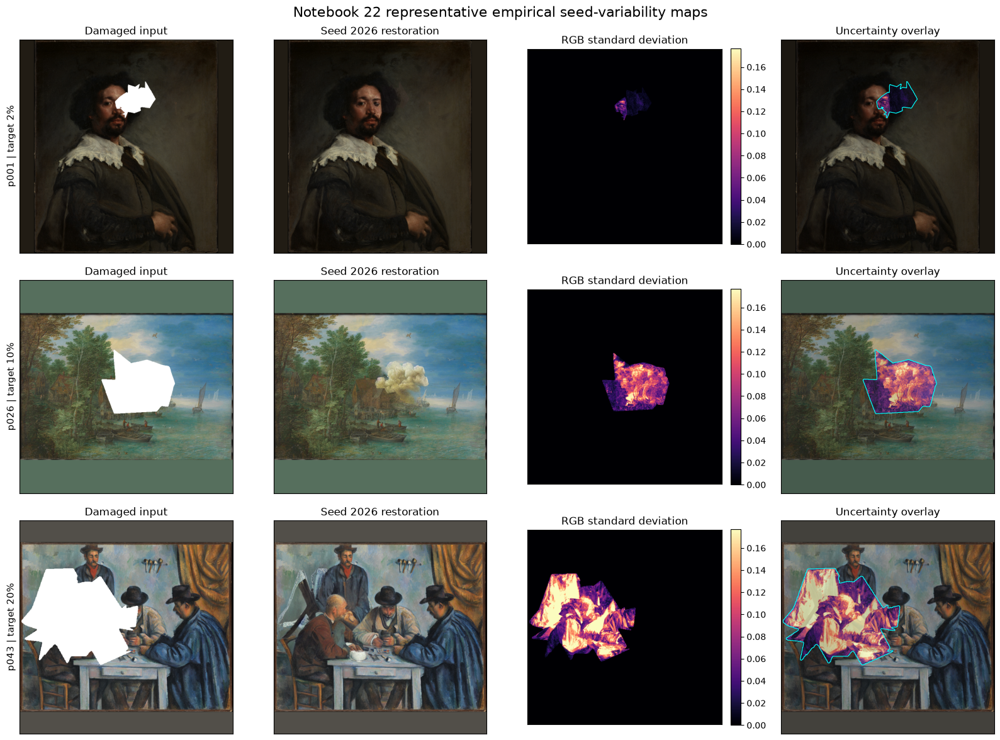

,uncertainty_group_id,map_mean,metric_mean,mean_matches,map_p95,metric_p95,p95_matches,map_maximum
0,ug_055304d3f45086910a,0.011579,0.011579,True,0.088749,0.088749,True,0.271114
1,ug_06e8376a14f5652e5f,0.008697,0.008697,True,0.084141,0.084141,True,0.308105
2,ug_085ecb7986418be78b,0.002947,0.002947,True,0.000000,0.000000,True,0.262873
3,ug_08dfe45990b2b8348b,0.006428,0.006428,True,0.033308,0.033308,True,0.260275
4,ug_0abd9e7d04f138c018,0.001054,0.001054,True,0.000000,0.000000,True,0.105356
5,ug_0e46e31ebd9a258066,0.009552,0.009552,True,0.038303,0.038303,True,0.411960
6,ug_0f7c65780cc919f64b,0.004178,0.004178,True,0.000000,0.000000,True,0.295132
7,ug_0f960683f2040b67be,0.015587,0.015587,True,0.140406,0.140406,True,0.332150
8,ug_10bdde88ba96671f52,0.001627,0.001627,True,0.000000,0.000000,True,0.238758
9,ug_10ca3cad0394acc874,0.006184,0.006184,True,0.046182,0.046182,True,0.232154


Representative maps rendered: 3
Shared display ceiling: 0.177044
Rendered heatmaps are notebook-only QA views.


In [26]:
# ---------------------------------------------------------------------------
# Render representative uncertainty maps without saving
# ---------------------------------------------------------------------------

representative_group_rows = (
    uncertainty_population_df.loc[
        uncertainty_population_df[
            "case_id"
        ].astype(str).isin(
            representative_case_ids
        )
        & uncertainty_population_df[
            "seed"
        ].astype(int).eq(2026)
    ]
    .sort_values(
        [
            "target_damage_fraction",
            "painting_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

if len(representative_group_rows) != 3:
    raise ValueError(
        "Expected three representative seed-2026 "
        "group rows."
    )

map_display_ceiling = float(
    np.percentile(
        np.concatenate(
            [
                array.ravel()
                for array in (
                    raw_uncertainty_maps.values()
                )
            ]
        ),
        99,
    )
)

map_display_ceiling = max(
    map_display_ceiling,
    1e-6,
)

figure, axes = plt.subplots(
    nrows=3,
    ncols=4,
    figsize=(16, 12),
    squeeze=False,
)

for row_index, row in (
    representative_group_rows.iterrows()
):
    input_path = (
        PROJECT_ROOT
        / Path(
            str(
                row[
                    "input_image_path"
                ]
            )
        )
    )

    mask_path = (
        PROJECT_ROOT
        / Path(
            str(
                row[
                    "mask_or_effect_path"
                ]
            )
        )
    )

    anchor_path = (
        PROJECT_ROOT
        / Path(
            str(
                row["restored_path"]
            )
        )
    )

    with Image.open(
        input_path
    ) as image:
        input_array = np.asarray(
            image.convert("RGB"),
            dtype=np.uint8,
        )

    with Image.open(
        mask_path
    ) as image:
        mask_array = np.asarray(
            image.convert("L"),
            dtype=np.uint8,
        )

    with Image.open(
        anchor_path
    ) as image:
        anchor_array = np.asarray(
            image.convert("RGB"),
            dtype=np.uint8,
        )

    group_id = str(
        row["uncertainty_group_id"]
    )

    uncertainty_map = (
        raw_uncertainty_maps[group_id]
    )

    axes[row_index, 0].imshow(
        input_array
    )
    axes[row_index, 0].set_title(
        "Damaged input"
    )

    axes[row_index, 1].imshow(
        anchor_array
    )
    axes[row_index, 1].set_title(
        "Seed 2026 restoration"
    )

    map_artist = axes[
        row_index,
        2,
    ].imshow(
        uncertainty_map,
        cmap="magma",
        vmin=0.0,
        vmax=map_display_ceiling,
    )

    axes[row_index, 2].set_title(
        "RGB standard deviation"
    )

    axes[row_index, 3].imshow(
        anchor_array
    )

    axes[row_index, 3].imshow(
        uncertainty_map,
        cmap="magma",
        vmin=0.0,
        vmax=map_display_ceiling,
        alpha=np.where(
            mask_array >= 128,
            0.72,
            0.18,
        ),
    )

    axes[row_index, 3].contour(
        mask_array >= 128,
        levels=[0.5],
        colors=["cyan"],
        linewidths=0.8,
    )

    axes[row_index, 3].set_title(
        "Uncertainty overlay"
    )

    axes[row_index, 0].set_ylabel(
        (
            f"{row['painting_id']} | "
            f"target "
            f"{float(row['target_damage_fraction']):.0%}"
        ),
        fontsize=11,
    )

    figure.colorbar(
        map_artist,
        ax=axes[row_index, 2],
        fraction=0.046,
        pad=0.04,
    )

    for axis in axes[row_index]:
        axis.set_xticks([])
        axis.set_yticks([])

figure.suptitle(
    "Notebook 22 representative empirical "
    "seed-variability maps",
    fontsize=16,
)

figure.tight_layout()
plt.show()

display(
    raw_map_consistency_df[
        [
            "uncertainty_group_id",
            "map_mean",
            "metric_mean",
            "mean_matches",
            "map_p95",
            "metric_p95",
            "p95_matches",
            "map_maximum",
        ]
    ].head(12)
)

print(
    "Representative maps rendered:",
    len(representative_group_rows),
)
print(
    "Shared display ceiling:",
    round(
        map_display_ceiling,
        6,
    ),
)
print(
    "Rendered heatmaps are notebook-only QA views."
)

In [27]:
# ---------------------------------------------------------------------------
# Idempotent Batch 5 validation assembly
# ---------------------------------------------------------------------------

preserved_validation_checks = tuple(
    check
    for check in VALIDATION.checks
    if check.validation_stage
    != "batch_5_image_space_uncertainty"
)

VALIDATION = ValidationCollector()
VALIDATION.extend(
    preserved_validation_checks
)


def add_batch_5_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage=(
            "batch_5_image_space_uncertainty"
        ),
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


expected_image_metric_rows = int(
    EXPECTED_COUNTS[
        "pixel_group_summary_rows"
    ]
) + int(
    EXPECTED_COUNTS[
        "pixel_pair_rows"
    ]
)

expected_image_family_counts = {
    "pixel_pairwise": int(
        EXPECTED_COUNTS[
            "pixel_pair_rows"
        ]
    ),
    "pixel_variability": int(
        EXPECTED_COUNTS[
            "pixel_group_summary_rows"
        ]
    ),
}

expected_uncertainty_groups = int(
    EXPECTED_COUNTS[
        "uncertainty_groups"
    ]
)

expected_total_candidates = int(
    EXPECTED_COUNTS[
        "total_candidates"
    ]
)

expected_unordered_pairs = int(
    EXPECTED_COUNTS[
        "unordered_candidate_pairs"
    ]
)

expected_raw_maps = int(
    EXPECTED_COUNTS[
        "raw_uncertainty_maps"
    ]
)

expected_rows_per_group = (
    expected_image_metric_rows
    // expected_uncertainty_groups
)


add_batch_5_check(
    "uncertainty_population",
    (
        "The empirical uncertainty population "
        "contains its exact contracted candidates "
        "and groups."
    ),
    {
        "candidates": (
            expected_total_candidates
        ),
        "groups": (
            expected_uncertainty_groups
        ),
    },
    {
        "candidates": len(
            uncertainty_population_df
        ),
        "groups": int(
            uncertainty_population_df[
                "uncertainty_group_id"
            ].nunique()
        ),
    },
    (
        len(
            uncertainty_population_df
        ) == expected_total_candidates
        and uncertainty_population_df[
            "uncertainty_group_id"
        ].nunique()
        == expected_uncertainty_groups
    ),
)

add_batch_5_check(
    "uncertainty_pair_plan",
    (
        "The population contains the exact "
        "contracted number of unique unordered "
        "seed pairs."
    ),
    expected_unordered_pairs,
    len(uncertainty_pair_plan_df),
    (
        len(
            uncertainty_pair_plan_df
        ) == expected_unordered_pairs
        and not uncertainty_pair_plan_df.duplicated(
            [
                "uncertainty_group_id",
                "candidate_id_a",
                "candidate_id_b",
            ]
        ).any()
    ),
)

add_batch_5_check(
    "image_metric_rows",
    (
        "Image-space uncertainty contains its "
        "exact contracted row count."
    ),
    expected_image_metric_rows,
    len(image_space_metrics_df),
    (
        len(image_space_metrics_df)
        == expected_image_metric_rows
    ),
)

add_batch_5_check(
    "image_metric_family_counts",
    (
        "Pixel variability and pairwise RGB "
        "families have their exact contracted "
        "row counts."
    ),
    expected_image_family_counts,
    image_metric_family_counts,
    (
        image_metric_family_counts
        == expected_image_family_counts
    ),
)

add_batch_5_check(
    "image_rows_per_group",
    (
        "Every uncertainty group contributes "
        "the contracted number of image-space "
        "metric rows."
    ),
    [expected_rows_per_group],
    sorted(
        image_rows_per_group
        .astype(int)
        .unique()
        .tolist()
    ),
    (
        len(
            image_rows_per_group
        ) == expected_uncertainty_groups
        and image_rows_per_group.eq(
            expected_rows_per_group
        ).all()
    ),
)

observed_pixel_regions = sorted(
    image_space_metrics_df[
        "region_id"
    ].astype(str).unique().tolist()
)

add_batch_5_check(
    "pixel_region_coverage",
    (
        "Image-space metrics cover all six "
        "approved pixel regions."
    ),
    sorted(
        REGION_POLICY[
            "pixel_regions"
        ]
    ),
    observed_pixel_regions,
    (
        observed_pixel_regions
        == sorted(
            REGION_POLICY[
                "pixel_regions"
            ]
        )
    ),
)

pair_metric_rows = (
    image_space_metrics_df.loc[
        image_space_metrics_df[
            "observation_level"
        ].astype(str).eq(
            "candidate_pair"
        )
    ]
)

add_batch_5_check(
    "pair_ordering",
    (
        "Every pairwise row retains strict "
        "seed_a < seed_b ordering."
    ),
    True,
    bool(
        (
            pair_metric_rows[
                "seed_a"
            ].astype(int)
            < pair_metric_rows[
                "seed_b"
            ].astype(int)
        ).all()
    ),
    bool(
        (
            pair_metric_rows[
                "seed_a"
            ].astype(int)
            < pair_metric_rows[
                "seed_b"
            ].astype(int)
        ).all()
    ),
)

add_batch_5_check(
    "finite_image_metrics",
    (
        "Every image-space metric value is "
        "numeric and finite."
    ),
    True,
    bool(
        image_metric_values.notna().all()
        and np.isfinite(
            image_metric_values
        ).all()
    ),
    bool(
        image_metric_values.notna().all()
        and np.isfinite(
            image_metric_values
        ).all()
    ),
)

add_batch_5_check(
    "unique_image_metric_ids",
    (
        "Every image-space uncertainty row "
        "has a unique deterministic metric "
        "identifier."
    ),
    0,
    int(
        image_space_metrics_df[
            "uncertainty_metric_id"
        ].duplicated().sum()
    ),
    not image_space_metrics_df[
        "uncertainty_metric_id"
    ].duplicated().any(),
)

add_batch_5_check(
    "image_metric_statuses",
    (
        "All image-space metric rows "
        "completed successfully."
    ),
    ["ok"],
    sorted(
        image_space_metrics_df[
            "status"
        ].astype(str).unique().tolist()
    ),
    image_space_metrics_df[
        "status"
    ].astype(str).eq("ok").all(),
)

add_batch_5_check(
    "combined_index_absent",
    (
        "No image-space row is labelled as "
        "a combined uncertainty index."
    ),
    0,
    int(
        image_space_metrics_df[
            "is_combined_index"
        ].astype(bool).sum()
    ),
    not image_space_metrics_df[
        "is_combined_index"
    ].astype(bool).any(),
)

if image_checkpoint_resolved is None:
    raise FileNotFoundError(
        "The image-space checkpoint is missing."
    )

checkpoint_frame = pd.read_csv(
    image_checkpoint_resolved,
    low_memory=False,
)

add_batch_5_check(
    "image_checkpoint",
    (
        "The resumable image-space checkpoint "
        "contains every contracted metric row."
    ),
    expected_image_metric_rows,
    len(checkpoint_frame),
    (
        len(
            checkpoint_frame
        ) == expected_image_metric_rows
        and checkpoint_frame[
            "uncertainty_metric_id"
        ].is_unique
    ),
)

add_batch_5_check(
    "raw_map_contract",
    (
        "The exact contracted number of finite, "
        "nonnegative 768×768 raw uncertainty "
        "maps was computed."
    ),
    expected_raw_maps,
    {
        "maps": len(
            raw_map_validation_df
        ),
        "valid_shapes": int(
            (
                raw_map_validation_df[
                    "height"
                ].eq(768)
                & raw_map_validation_df[
                    "width"
                ].eq(768)
            ).sum()
        ),
        "finite_maps": int(
            raw_map_validation_df[
                "finite"
            ].sum()
        ),
        "nonnegative_maps": int(
            raw_map_validation_df[
                "nonnegative"
            ].sum()
        ),
    },
    (
        raw_maps_valid_before_write
        and len(
            raw_map_validation_df
        ) == expected_raw_maps
    ),
)

add_batch_5_check(
    "map_scalar_consistency",
    (
        "Every raw map reproduces its "
        "full-image mean and p95 scalar "
        "summaries."
    ),
    expected_raw_maps,
    {
        "mean_matches": int(
            raw_map_consistency_df[
                "mean_matches"
            ].sum()
        ),
        "p95_matches": int(
            raw_map_consistency_df[
                "p95_matches"
            ].sum()
        ),
    },
    (
        len(
            raw_map_consistency_df
        ) == expected_raw_maps
        and raw_map_consistency_df[
            "mean_matches"
        ].all()
        and raw_map_consistency_df[
            "p95_matches"
        ].all()
    ),
)

add_batch_5_check(
    "canonical_map_bundle",
    (
        "The canonical NPZ bundle reloads "
        "with every map unchanged."
    ),
    expected_raw_maps,
    len(reloaded_map_keys),
    (
        OUTPUTS[
            "uncertainty_maps"
        ].is_file()
        and len(
            reloaded_map_keys
        ) == expected_raw_maps
        and reloaded_maps_valid
    ),
)

premature_batch_5_outputs = [
    OUTPUTS[key]
    for key in (
        "candidates",
        "damage_size_uncertainty",
        "summary_figure",
        "map_manifest",
        "run_manifest",
        "artifacts",
        "validation",
    )
    if OUTPUTS[key].exists()
]

add_batch_5_check(
    "deferred_outputs",
    (
        "Candidate tables, combined metrics, "
        "figures, overlay manifests, run "
        "manifests, artifacts, and validation "
        "files remain deferred."
    ),
    0,
    len(
        premature_batch_5_outputs
    ),
    not premature_batch_5_outputs,
    details=[
        to_repo_relative(
            path,
            PROJECT_ROOT,
        )
        for path in (
            premature_batch_5_outputs
        )
    ],
)

batch_5_validation_df = (
    VALIDATION.to_dataframe()
    .loc[
        lambda frame: frame[
            "validation_stage"
        ].eq(
            "batch_5_image_space_uncertainty"
        )
    ]
    .reset_index(drop=True)
)

display(
    image_space_metrics_df.head(15)
)

display(raw_map_validation_df)
display(batch_5_validation_df)

VALIDATION.raise_for_blocking()

print("Notebook 22 Batch 5 summary")
print("---------------------------")
print(
    "Batch 5 checks:",
    len(batch_5_validation_df),
)
print(
    "Cumulative checks:",
    len(VALIDATION.checks),
)
print(
    "Blocking failures:",
    len(
        VALIDATION.blocking_failures
    ),
)
print(
    "Image-space metric rows:",
    len(image_space_metrics_df),
)
print(
    "Raw uncertainty maps:",
    len(raw_uncertainty_maps),
)
print(
    "Canonical map bundle:",
    to_repo_relative(
        OUTPUTS[
            "uncertainty_maps"
        ],
        PROJECT_ROOT,
    ),
)
print(
    "Image-space runtime seconds:",
    round(
        image_uncertainty_seconds,
        3,
    ),
)
print("Batch 5 completion gate passed.")

,uncertainty_metric_id,uncertainty_group_id,observation_level,case_id,model_id,painting_id,category,style_or_period,dataset_id,dataset_scope,...,region_id,summary_statistic,value,value_unit,metric_version,region_policy_version,evidence_role,is_combined_index,status,issue
0,um_f014dc96f65dfaeab684,ug_055304d3f45086910a,candidate_pair,damage_size__p093__loss_large__size_20pct,stable_diffusion_inpainting,p093,abstraction_surrealism,Symbolism / Post-Impressionism,painting_restoration_eval,controlled_300,...,boundary_ring,pair_value,0.020547,normalized_rgb_0_1,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
1,um_fa69a293eb9928c48375,ug_055304d3f45086910a,candidate_pair,damage_size__p093__loss_large__size_20pct,stable_diffusion_inpainting,p093,abstraction_surrealism,Symbolism / Post-Impressionism,painting_restoration_eval,controlled_300,...,boundary_ring,pair_value,0.019380,normalized_rgb_0_1,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
2,um_d6864e3e4c4670036763,ug_055304d3f45086910a,candidate_pair,damage_size__p093__loss_large__size_20pct,stable_diffusion_inpainting,p093,abstraction_surrealism,Symbolism / Post-Impressionism,painting_restoration_eval,controlled_300,...,boundary_ring,pair_value,0.018695,normalized_rgb_0_1,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
3,um_a72659f9e1f6f32a0479,ug_055304d3f45086910a,candidate_pair,damage_size__p093__loss_large__size_20pct,stable_diffusion_inpainting,p093,abstraction_surrealism,Symbolism / Post-Impressionism,painting_restoration_eval,controlled_300,...,boundary_ring,pair_value,0.021103,normalized_rgb_0_1,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
4,um_3717a6bdc5ca417adaa1,ug_055304d3f45086910a,candidate_pair,damage_size__p093__loss_large__size_20pct,stable_diffusion_inpainting,p093,abstraction_surrealism,Symbolism / Post-Impressionism,painting_restoration_eval,controlled_300,...,boundary_ring,pair_value,0.020288,normalized_rgb_0_1,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
5,um_b2c0b7e7e3227f3573bb,ug_055304d3f45086910a,candidate_pair,damage_size__p093__loss_large__size_20pct,stable_diffusion_inpainting,p093,abstraction_surrealism,Symbolism / Post-Impressionism,painting_restoration_eval,controlled_300,...,boundary_ring,pair_value,0.017994,normalized_rgb_0_1,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
6,um_aed1f3146c59dc1ab6c3,ug_055304d3f45086910a,candidate_pair,damage_size__p093__loss_large__size_20pct,stable_diffusion_inpainting,p093,abstraction_surrealism,Symbolism / Post-Impressionism,painting_restoration_eval,controlled_300,...,content_region,pair_value,0.017471,normalized_rgb_0_1,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
7,um_9fabfaaa523c91164eb0,ug_055304d3f45086910a,candidate_pair,damage_size__p093__loss_large__size_20pct,stable_diffusion_inpainting,p093,abstraction_surrealism,Symbolism / Post-Impressionism,painting_restoration_eval,controlled_300,...,content_region,pair_value,0.023951,normalized_rgb_0_1,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
8,um_005225121cf0674fccbc,ug_055304d3f45086910a,candidate_pair,damage_size__p093__loss_large__size_20pct,stable_diffusion_inpainting,p093,abstraction_surrealism,Symbolism / Post-Impressionism,painting_restoration_eval,controlled_300,...,content_region,pair_value,0.019792,normalized_rgb_0_1,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
9,um_30625243ae2a58388e58,ug_055304d3f45086910a,candidate_pair,damage_size__p093__loss_large__size_20pct,stable_diffusion_inpainting,p093,abstraction_surrealism,Symbolism / Post-Impressionism,painting_restoration_eval,controlled_300,...,content_region

,uncertainty_group_id,height,width,finite,nonnegative,map_mean,map_p95,map_maximum
0,ug_055304d3f45086910a,768,768,True,True,0.011579,0.088749,0.271114
1,ug_06e8376a14f5652e5f,768,768,True,True,0.008697,0.084141,0.308105
2,ug_085ecb7986418be78b,768,768,True,True,0.002947,0.000000,0.262873
3,ug_08dfe45990b2b8348b,768,768,True,True,0.006428,0.033308,0.260275
4,ug_0abd9e7d04f138c018,768,768,True,True,0.001054,0.000000,0.105356
...,...,...,...,...,...,...,...,...
240,ug_fc7df9fa654214519b,768,768,True,True,0.004758,0.007880,0.332778
241,ug_fcb62f6f8dafd3eb4f,768,768,True,True,0.008245,0.049473,0.264267
242,ug_fdcde9a424308dad22,768,768,True,True,0.010297,0.074305,0.294990
243,ug_fe21c462b1d81d449b,768,768,True,True,0.001126,0.000000,0.228647


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_5_image_space_uncertainty,uncertainty_population,The empirical uncertainty population contains ...,blocking,"{""candidates"": 980, ""groups"": 245}","{""candidates"": 980, ""groups"": 245}",True,
1,batch_5_image_space_uncertainty,uncertainty_pair_plan,The population contains the exact contracted n...,blocking,1470,1470,True,
2,batch_5_image_space_uncertainty,image_metric_rows,Image-space uncertainty contains its exact con...,blocking,20580,20580,True,
3,batch_5_image_space_uncertainty,image_metric_family_counts,Pixel variability and pairwise RGB families ha...,blocking,"{""pixel_pairwise"": 17640, ""pixel_variability"":...","{""pixel_pairwise"": 17640, ""pixel_variability"":...",True,
4,batch_5_image_space_uncertainty,image_rows_per_group,Every uncertainty group contributes the contra...,blocking,[84],[84],True,
5,batch_5_image_space_uncertainty,pixel_region_coverage,Image-space metrics cover all six approved pix...,blocking,"[""boundary_ring"", ""content_region"", ""full_imag...","[""boundary_ring"", ""content_region"", ""full_imag...",True,
6,batch_5_image_space_uncertainty,pair_ordering,Every pairwise row retains strict seed_a < see...,blocking,True,True,True,
7,batch_5_image_space_uncertainty,finite_image_metrics,Every image-space metric value is numeric and ...,blocking,True,True,True,
8,batch_5_image_space_uncertainty,unique_image_metric_ids,Every image-space uncertainty row has a unique...,blocking,0,0,True,
9,batch_5_image_space_uncertainty,image_metric_statuses,All image-space metric rows completed successf...,blocking,"[""ok""]","[""ok""]",True,


Notebook 22 Batch 5 summary
---------------------------
Batch 5 checks: 16
Cumulative checks: 139
Blocking failures: 0
Image-space metric rows: 20580
Raw uncertainty maps: 245
Canonical map bundle: outputs/22_damage_size_diffusion_uncertainty_extension/data/uncertainty_maps.npz
Image-space runtime seconds: 381.754
Batch 5 completion gate passed.


## Batch 6 — Pairwise LPIPS uncertainty

This batch computes learned perceptual variability between all unordered seed pairs in the 245 damage-size uncertainty groups.

It uses the validated Notebook 14 LPIPS contract:

- AlexNet LPIPS network;
- LPIPS version `0.1`;
- deterministic execution;
- aspect-preserving bicubic resizing;
- maximum side length of 256 pixels;
- minimum side length of 64 pixels;
- neutral padding;
- `content_region` and `mask_bbox_crop` only.

Each four-seed group contains six unique unordered pairs. Each pair is evaluated over two approved contiguous regions, producing:

- 12 LPIPS rows per group;
- 2,940 pairwise LPIPS rows in total;
- 1,470 unique candidate pairs.

The Stable Diffusion pipeline is released before loading LPIPS because restoration inference is complete. Computation is resumable through a Notebook 22-owned checkpoint.

LPIPS remains a general-purpose learned perceptual-distance proxy. It is not a conservation-specific judgment or calibrated confidence measure.

In [28]:
import gc

from restoration_eval.diffusion_uncertainty import (
    run_lpips_pairwise_uncertainty,
)

from restoration_eval.metrics_lpips import (
    load_configured_lpips_model,
    load_lpips_config,
    validate_lpips_runtime_dependencies,
)


# ---------------------------------------------------------------------------
# Release the completed restoration pipeline
# ---------------------------------------------------------------------------

stable_diffusion_pipeline_released = False

if (
    "stable_diffusion_pipeline" in globals()
    and stable_diffusion_pipeline is not None
):
    stable_diffusion_pipeline = None
    stable_diffusion_pipeline_released = True

gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()


# ---------------------------------------------------------------------------
# Load the approved Notebook 14 LPIPS contract
# ---------------------------------------------------------------------------

LPIPS_CONFIG_DOCUMENT = (
    load_lpips_config(
        INPUTS["lpips_config_path"]
    )
)

lpips_dependency_df = (
    validate_lpips_runtime_dependencies()
)

missing_lpips_dependencies = (
    lpips_dependency_df.loc[
        ~lpips_dependency_df[
            "installed"
        ].astype(bool),
        "dependency",
    ]
    .astype(str)
    .tolist()
)

if missing_lpips_dependencies:
    raise RuntimeError(
        "Missing LPIPS dependencies: "
        f"{missing_lpips_dependencies}"
    )

lpips_model_reused = bool(
    "LPIPS_MODEL" in globals()
    and LPIPS_MODEL is not None
    and "LPIPS_DEVICE" in globals()
    and "LPIPS_PROVENANCE" in globals()
)

if lpips_model_reused:
    print(
        "Reusing the configured LPIPS model "
        "already present in memory."
    )
    lpips_model_load_seconds = 0.0
else:
    lpips_model_load_started = (
        time.perf_counter()
    )

    (
        LPIPS_MODEL,
        LPIPS_DEVICE,
        LPIPS_PROVENANCE,
    ) = load_configured_lpips_model(
        LPIPS_CONFIG_DOCUMENT
    )

    lpips_model_load_seconds = (
        time.perf_counter()
        - lpips_model_load_started
    )

lpips_runtime_df = pd.DataFrame(
    [
        {
            "runtime_field": key,
            "observed_value": value,
        }
        for key, value in {
            **LPIPS_PROVENANCE,
            "model_reused": (
                lpips_model_reused
            ),
            "model_load_seconds": float(
                lpips_model_load_seconds
            ),
            "stable_diffusion_pipeline_released": (
                stable_diffusion_pipeline_released
            ),
        }.items()
    ]
)

display(lpips_dependency_df)
display(lpips_runtime_df)

print("LPIPS runtime is ready.")
print(
    "Network:",
    LPIPS_PROVENANCE["network"],
)
print(
    "LPIPS version:",
    LPIPS_PROVENANCE[
        "lpips_version"
    ],
)
print(
    "Device:",
    LPIPS_DEVICE,
)
print(
    "Model load seconds:",
    round(
        lpips_model_load_seconds,
        3,
    ),
)
print(
    "Stable Diffusion pipeline released:",
    stable_diffusion_pipeline_released,
)

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\lpips\weights\v0.1\alex.pth


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\lpips\lpips.py:107: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.load_state_dict(torch.load(mode

,dependency,version,installed,status
0,lpips,0.1.4,True,passed
1,torch,2.5.1+cu121,True,passed
2,torchvision,0.20.1+cu121,True,passed
3,numpy,1.26.4,True,passed
4,pandas,2.3.3,True,passed
5,Pillow,9.5.0,True,passed


,runtime_field,observed_value
0,network,alex
1,lpips_version,0.1
2,lpips_package_version,0.1.4
3,torch_version,2.5.1+cu121
4,device,cuda
5,cuda_device_name,NVIDIA GeForce RTX 3060 Laptop GPU
6,python_version,3.12.6
7,model_reused,False
8,model_load_seconds,1.648434
9,stable_diffusion_pipeline_released,True


LPIPS runtime is ready.
Network: alex
LPIPS version: 0.1
Device: cuda
Model load seconds: 1.648
Stable Diffusion pipeline released: True


In [29]:
# ---------------------------------------------------------------------------
# Compute all pairwise LPIPS uncertainty rows
# ---------------------------------------------------------------------------

lpips_uncertainty_started = (
    time.perf_counter()
)

lpips_uncertainty_metrics_df = (
    run_lpips_pairwise_uncertainty(
        uncertainty_population_df,
        model=LPIPS_MODEL,
        device=LPIPS_DEVICE,
        project_root=PROJECT_ROOT,
        config=uncertainty_adapter_config,
        lpips_config=LPIPS_CONFIG_DOCUMENT,
        checkpoint_path=(
            WORK_PATHS[
                "lpips_metrics_checkpoint"
            ]
        ),
        progress_callback=print,
    )
)

lpips_uncertainty_seconds = (
    time.perf_counter()
    - lpips_uncertainty_started
)

lpips_checkpoint_resolved = (
    find_latest_checkpoint(
        WORK_PATHS[
            "lpips_metrics_checkpoint"
        ]
    )
)

lpips_metric_values = pd.to_numeric(
    lpips_uncertainty_metrics_df[
        "value"
    ],
    errors="coerce",
)

lpips_rows_per_group = (
    lpips_uncertainty_metrics_df
    .groupby(
        "uncertainty_group_id"
    )
    .size()
)

lpips_region_counts = {
    str(key): int(value)
    for key, value in (
        lpips_uncertainty_metrics_df[
            "region_id"
        ]
        .value_counts()
        .sort_index()
        .items()
    )
}

lpips_unique_pair_count = (
    lpips_uncertainty_metrics_df[
        [
            "uncertainty_group_id",
            "candidate_id_a",
            "candidate_id_b",
        ]
    ]
    .drop_duplicates()
    .shape[0]
)

print(
    "Pairwise LPIPS uncertainty completed."
)
print(
    "Rows:",
    len(lpips_uncertainty_metrics_df),
)
print(
    "Groups:",
    lpips_uncertainty_metrics_df[
        "uncertainty_group_id"
    ].nunique(),
)
print(
    "Unique candidate pairs:",
    lpips_unique_pair_count,
)
print(
    "Rows per group:",
    sorted(
        lpips_rows_per_group
        .astype(int)
        .unique()
        .tolist()
    ),
)
print(
    "Region counts:",
    lpips_region_counts,
)
print(
    "Finite values:",
    bool(
        lpips_metric_values.notna().all()
        and np.isfinite(
            lpips_metric_values
        ).all()
    ),
)
print(
    "Runtime seconds:",
    round(
        lpips_uncertainty_seconds,
        3,
    ),
)
print(
    "Checkpoint:",
    (
        to_repo_relative(
            lpips_checkpoint_resolved,
            PROJECT_ROOT,
        )
        if lpips_checkpoint_resolved
        else "missing"
    ),
)

Pairwise LPIPS uncertainty: 0 complete groups resumed from no checkpoint; 245 pending
Pairwise LPIPS uncertainty: 10/245 groups; latest=ug_10ca3cad0394acc874
Pairwise LPIPS uncertainty: 20/245 groups; latest=ug_1de955f7e0f3d00cf0
Pairwise LPIPS uncertainty: 30/245 groups; latest=ug_2c54cf98d89f7cf175
Pairwise LPIPS uncertainty: 40/245 groups; latest=ug_36a15135013d2e24a4
Pairwise LPIPS uncertainty: 50/245 groups; latest=ug_3f0e124fc08d587aec
Pairwise LPIPS uncertainty: 60/245 groups; latest=ug_44d6750d0a2efebd97
Pairwise LPIPS uncertainty: 70/245 groups; latest=ug_4ebf9bafe49cea4347
Pairwise LPIPS uncertainty: 80/245 groups; latest=ug_5c00feee6f6cc3ae6d
Pairwise LPIPS uncertainty: 90/245 groups; latest=ug_6397f25fccc5a34f4c
Pairwise LPIPS uncertainty: 100/245 groups; latest=ug_6e914f47e6029b16b1
Pairwise LPIPS uncertainty: 110/245 groups; latest=ug_772e6c57f82e916a93
Pairwise LPIPS uncertainty: 120/245 groups; latest=ug_81b1b436111a3d76bf
Pairwise LPIPS uncertainty: 130/245 groups; lat

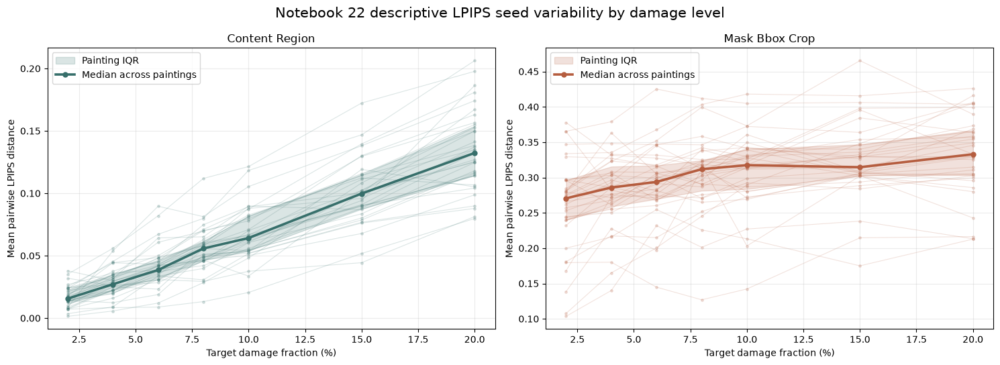

,target_damage_fraction,region_id,pair_count,mean_lpips,median_lpips,minimum_lpips,maximum_lpips,p95_lpips
0,0.02,content_region,210,0.016887,0.015110,0.000803,0.049565,0.035711
1,0.04,content_region,210,0.028453,0.027045,0.002672,0.075767,0.051987
2,0.06,content_region,210,0.041292,0.039673,0.005424,0.109216,0.078972
3,0.08,content_region,210,0.054960,0.053786,0.008242,0.124735,0.089770
4,0.10,content_region,210,0.068091,0.064871,0.014669,0.144773,0.113752
5,0.15,content_region,210,0.101246,0.097078,0.035128,0.207315,0.147017
6,0.20,content_region,210,0.134107,0.131737,0.064075,0.229355,0.199483
7,0.02,mask_bbox_crop,210,0.260408,0.266736,0.082264,0.449266,0.367017
8,0.04,mask_bbox_crop,210,0.280371,0.281813,0.125078,0.390264,0.374237
9,0.06,mask_bbox_crop,210,0.291220,0.290882,0.119700,0.466587,0.377160


,target_damage_fraction,region_id,painting_count,median_painting_lpips,q25_painting_lpips,q75_painting_lpips
0,0.02,content_region,35,0.015634,0.011597,0.022934
1,0.04,content_region,35,0.027146,0.022036,0.034615
2,0.06,content_region,35,0.038585,0.032327,0.046571
3,0.08,content_region,35,0.055777,0.046234,0.061777
4,0.10,content_region,35,0.064181,0.053919,0.081576
5,0.15,content_region,35,0.099778,0.087489,0.114735
6,0.20,content_region,35,0.132328,0.114237,0.153963
7,0.02,mask_bbox_crop,35,0.270532,0.239619,0.296056
8,0.04,mask_bbox_crop,35,0.285767,0.258877,0.315424
9,0.06,mask_bbox_crop,35,0.293760,0.269637,0.317008


,painting_id,target_damage_fraction,region_id,mean_pairwise_lpips,median_pairwise_lpips,pair_count
0,p001,0.02,content_region,0.003516,0.003329,6
1,p001,0.02,mask_bbox_crop,0.103540,0.100465,6
2,p001,0.04,content_region,0.009091,0.009357,6
3,p001,0.04,mask_bbox_crop,0.140042,0.138687,6
4,p001,0.06,content_region,0.033794,0.035867,6
5,p001,0.06,mask_bbox_crop,0.231826,0.220159,6
6,p001,0.08,content_region,0.030678,0.030669,6
7,p001,0.08,mask_bbox_crop,0.201267,0.202756,6
8,p001,0.10,content_region,0.051770,0.052842,6
9,p001,0.10,mask_bbox_crop,0.227068,0.229073,6


LPIPS descriptive QA assembled.
Damage levels: [0.02, 0.04, 0.06, 0.08, 0.1, 0.15, 0.2]
Painting trajectories: 35
Aggregate trajectory rows: 14
The faint lines show individual paintings; the strong line and band show the painting-level median and interquartile range.
The trajectories are descriptive repeated observations, not independent category effects.


In [30]:
# ---------------------------------------------------------------------------
# Damage-level and trajectory summaries
# ---------------------------------------------------------------------------

lpips_damage_summary_df = (
    lpips_uncertainty_metrics_df
    .groupby(
        [
            "target_damage_fraction",
            "region_id",
        ],
        as_index=False,
        dropna=False,
    )
    .agg(
        pair_count=("value", "size"),
        mean_lpips=("value", "mean"),
        median_lpips=("value", "median"),
        minimum_lpips=("value", "min"),
        maximum_lpips=("value", "max"),
        p95_lpips=(
            "value",
            lambda values: float(
                np.percentile(
                    values,
                    95,
                )
            ),
        ),
    )
    .sort_values(
        [
            "region_id",
            "target_damage_fraction",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

lpips_trajectory_df = (
    lpips_uncertainty_metrics_df
    .groupby(
        [
            "painting_id",
            "target_damage_fraction",
            "region_id",
        ],
        as_index=False,
        dropna=False,
    )
    .agg(
        mean_pairwise_lpips=(
            "value",
            "mean",
        ),
        median_pairwise_lpips=(
            "value",
            "median",
        ),
        pair_count=("value", "size"),
    )
)

lpips_aggregate_trajectory_df = (
    lpips_trajectory_df
    .groupby(
        [
            "target_damage_fraction",
            "region_id",
        ],
        as_index=False,
        dropna=False,
    )
    .agg(
        painting_count=(
            "painting_id",
            "nunique",
        ),
        median_painting_lpips=(
            "mean_pairwise_lpips",
            "median",
        ),
        q25_painting_lpips=(
            "mean_pairwise_lpips",
            lambda values: float(
                np.quantile(
                    values,
                    0.25,
                )
            ),
        ),
        q75_painting_lpips=(
            "mean_pairwise_lpips",
            lambda values: float(
                np.quantile(
                    values,
                    0.75,
                )
            ),
        ),
    )
    .sort_values(
        [
            "region_id",
            "target_damage_fraction",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

figure, axes = plt.subplots(
    nrows=1,
    ncols=2,
    figsize=(15, 5.5),
    squeeze=False,
)

region_colours = {
    "content_region": "#376f6b",
    "mask_bbox_crop": "#b55d3f",
}

for axis_index, region_id in enumerate(
    [
        "content_region",
        "mask_bbox_crop",
    ]
):
    axis = axes[0, axis_index]

    region_trajectory_df = (
        lpips_trajectory_df.loc[
            lpips_trajectory_df[
                "region_id"
            ].astype(str).eq(region_id)
        ]
    )

    for _, painting_frame in (
        region_trajectory_df.groupby(
            "painting_id",
            sort=True,
        )
    ):
        painting_frame = (
            painting_frame.sort_values(
                "target_damage_fraction",
                kind="stable",
            )
        )

        axis.plot(
            painting_frame[
                "target_damage_fraction"
            ].astype(float)
            * 100.0,
            painting_frame[
                "mean_pairwise_lpips"
            ].astype(float),
            color=region_colours[region_id],
            marker="o",
            markersize=2.5,
            linewidth=0.8,
            alpha=0.18,
            zorder=1,
        )

    aggregate_frame = (
        lpips_aggregate_trajectory_df.loc[
            lpips_aggregate_trajectory_df[
                "region_id"
            ].astype(str).eq(region_id)
        ]
        .sort_values(
            "target_damage_fraction",
            kind="stable",
        )
    )

    damage_percent = (
        aggregate_frame[
            "target_damage_fraction"
        ].astype(float)
        * 100.0
    )

    axis.fill_between(
        damage_percent,
        aggregate_frame[
            "q25_painting_lpips"
        ].astype(float),
        aggregate_frame[
            "q75_painting_lpips"
        ].astype(float),
        color=region_colours[region_id],
        alpha=0.18,
        label="Painting IQR",
        zorder=2,
    )

    axis.plot(
        damage_percent,
        aggregate_frame[
            "median_painting_lpips"
        ].astype(float),
        color=region_colours[region_id],
        marker="o",
        markersize=5,
        linewidth=2.6,
        label="Median across paintings",
        zorder=3,
    )

    axis.set_title(
        region_id.replace("_", " ").title()
    )
    axis.set_xlabel(
        "Target damage fraction (%)"
    )
    axis.set_ylabel(
        "Mean pairwise LPIPS distance"
    )
    axis.grid(
        alpha=0.25
    )
    axis.legend(
        loc="best",
        frameon=True,
    )

figure.suptitle(
    "Notebook 22 descriptive LPIPS "
    "seed variability by damage level",
    fontsize=15,
)

figure.tight_layout()
plt.show()

display(lpips_damage_summary_df)
display(lpips_aggregate_trajectory_df)
display(lpips_trajectory_df.head(20))

print("LPIPS descriptive QA assembled.")
print(
    "Damage levels:",
    sorted(
        lpips_damage_summary_df[
            "target_damage_fraction"
        ].astype(float).unique().tolist()
    ),
)
print(
    "Painting trajectories:",
    lpips_trajectory_df[
        "painting_id"
    ].nunique(),
)
print(
    "Aggregate trajectory rows:",
    len(
        lpips_aggregate_trajectory_df
    ),
)
print(
    "The faint lines show individual paintings; "
    "the strong line and band show the painting-level "
    "median and interquartile range."
)
print(
    "The trajectories are descriptive repeated "
    "observations, not independent category effects."
)

In [32]:
# ---------------------------------------------------------------------------
# Idempotent Batch 6 validation assembly
# ---------------------------------------------------------------------------

preserved_validation_checks = tuple(
    check
    for check in VALIDATION.checks
    if check.validation_stage
    != "batch_6_lpips_uncertainty"
)

VALIDATION = ValidationCollector()
VALIDATION.extend(
    preserved_validation_checks
)


def add_batch_6_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage=(
            "batch_6_lpips_uncertainty"
        ),
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


expected_lpips_rows = int(
    EXPECTED_COUNTS[
        "lpips_pair_rows"
    ]
)

expected_lpips_groups = int(
    EXPECTED_COUNTS[
        "uncertainty_groups"
    ]
)

expected_lpips_pairs = int(
    EXPECTED_COUNTS[
        "unordered_candidate_pairs"
    ]
)

expected_lpips_rows_per_group = (
    expected_lpips_rows
    // expected_lpips_groups
)

expected_lpips_region_counts = {
    region_id: expected_lpips_pairs
    for region_id in sorted(
        REGION_POLICY[
            "learned_metric_regions"
        ]
    )
}


add_batch_6_check(
    "lpips_dependencies",
    (
        "Every required LPIPS runtime dependency "
        "is installed."
    ),
    [],
    missing_lpips_dependencies,
    not missing_lpips_dependencies,
)

add_batch_6_check(
    "lpips_model_contract",
    (
        "The configured AlexNet LPIPS 0.1 model "
        "was loaded."
    ),
    {
        "network": "alex",
        "lpips_version": "0.1",
    },
    {
        "network": (
            LPIPS_PROVENANCE["network"]
        ),
        "lpips_version": (
            LPIPS_PROVENANCE[
                "lpips_version"
            ]
        ),
        "device": LPIPS_DEVICE,
    },
    (
        LPIPS_PROVENANCE[
            "network"
        ] == "alex"
        and LPIPS_PROVENANCE[
            "lpips_version"
        ] == "0.1"
    ),
)

expected_lpips_device = (
    "cuda"
    if torch.cuda.is_available()
    else "cpu"
)

add_batch_6_check(
    "lpips_device",
    (
        "LPIPS uses CUDA when available and "
        "otherwise the explicitly permitted "
        "CPU fallback."
    ),
    expected_lpips_device,
    LPIPS_DEVICE,
    (
        LPIPS_DEVICE
        == expected_lpips_device
    ),
)

add_batch_6_check(
    "lpips_row_count",
    (
        "Pairwise LPIPS uncertainty contains "
        "its exact contracted row count."
    ),
    expected_lpips_rows,
    len(lpips_uncertainty_metrics_df),
    (
        len(
            lpips_uncertainty_metrics_df
        ) == expected_lpips_rows
    ),
)

add_batch_6_check(
    "lpips_group_coverage",
    (
        "LPIPS covers every contracted "
        "uncertainty group."
    ),
    expected_lpips_groups,
    int(
        lpips_uncertainty_metrics_df[
            "uncertainty_group_id"
        ].nunique()
    ),
    (
        lpips_uncertainty_metrics_df[
            "uncertainty_group_id"
        ].nunique()
        == expected_lpips_groups
    ),
)

add_batch_6_check(
    "lpips_rows_per_group",
    (
        "Every four-seed group contributes "
        "the contracted number of LPIPS rows."
    ),
    [expected_lpips_rows_per_group],
    sorted(
        lpips_rows_per_group
        .astype(int)
        .unique()
        .tolist()
    ),
    (
        len(
            lpips_rows_per_group
        ) == expected_lpips_groups
        and lpips_rows_per_group.eq(
            expected_lpips_rows_per_group
        ).all()
    ),
)

add_batch_6_check(
    "lpips_unique_pair_count",
    (
        "LPIPS contains the exact contracted "
        "number of unique unordered candidate "
        "pairs."
    ),
    expected_lpips_pairs,
    lpips_unique_pair_count,
    (
        lpips_unique_pair_count
        == expected_lpips_pairs
    ),
)

add_batch_6_check(
    "lpips_region_counts",
    (
        "Both approved contiguous LPIPS regions "
        "contain every candidate pair."
    ),
    expected_lpips_region_counts,
    lpips_region_counts,
    (
        lpips_region_counts
        == expected_lpips_region_counts
    ),
)

add_batch_6_check(
    "lpips_metric_identity",
    (
        "Every row uses the declared perceptual "
        "pairwise metric identity."
    ),
    {
        "metric_family": [
            "perceptual_pairwise"
        ],
        "metric_name": [
            "pairwise_lpips_distance"
        ],
        "observation_level": [
            "candidate_pair"
        ],
    },
    {
        "metric_family": sorted(
            lpips_uncertainty_metrics_df[
                "metric_family"
            ].astype(str).unique().tolist()
        ),
        "metric_name": sorted(
            lpips_uncertainty_metrics_df[
                "metric_name"
            ].astype(str).unique().tolist()
        ),
        "observation_level": sorted(
            lpips_uncertainty_metrics_df[
                "observation_level"
            ].astype(str).unique().tolist()
        ),
    },
    (
        lpips_uncertainty_metrics_df[
            "metric_family"
        ].astype(str).eq(
            "perceptual_pairwise"
        ).all()
        and lpips_uncertainty_metrics_df[
            "metric_name"
        ].astype(str).eq(
            "pairwise_lpips_distance"
        ).all()
        and lpips_uncertainty_metrics_df[
            "observation_level"
        ].astype(str).eq(
            "candidate_pair"
        ).all()
    ),
)

pair_order_valid = bool(
    (
        lpips_uncertainty_metrics_df[
            "seed_a"
        ].astype(int)
        < lpips_uncertainty_metrics_df[
            "seed_b"
        ].astype(int)
    ).all()
)

add_batch_6_check(
    "lpips_pair_order",
    (
        "Every LPIPS pair retains strict "
        "seed_a < seed_b ordering."
    ),
    True,
    pair_order_valid,
    pair_order_valid,
)

finite_lpips_values = bool(
    lpips_metric_values.notna().all()
    and np.isfinite(
        lpips_metric_values
    ).all()
)

add_batch_6_check(
    "finite_lpips_values",
    (
        "Every LPIPS distance is numeric "
        "and finite."
    ),
    True,
    finite_lpips_values,
    finite_lpips_values,
)

materially_negative_lpips_count = int(
    (
        lpips_metric_values
        < -1e-6
    ).sum()
)

add_batch_6_check(
    "lpips_distance_range",
    (
        "No LPIPS distance is materially "
        "negative."
    ),
    0,
    materially_negative_lpips_count,
    materially_negative_lpips_count == 0,
)

add_batch_6_check(
    "unique_lpips_metric_ids",
    (
        "Every LPIPS row has a unique "
        "deterministic metric identifier."
    ),
    0,
    int(
        lpips_uncertainty_metrics_df[
            "uncertainty_metric_id"
        ].duplicated().sum()
    ),
    not lpips_uncertainty_metrics_df[
        "uncertainty_metric_id"
    ].duplicated().any(),
)

add_batch_6_check(
    "lpips_statuses",
    (
        "All LPIPS metric rows completed "
        "successfully."
    ),
    ["ok"],
    sorted(
        lpips_uncertainty_metrics_df[
            "status"
        ].astype(str).unique().tolist()
    ),
    lpips_uncertainty_metrics_df[
        "status"
    ].astype(str).eq("ok").all(),
)

add_batch_6_check(
    "lpips_combined_index_absent",
    (
        "LPIPS remains a separate transparent "
        "component rather than a combined index."
    ),
    0,
    int(
        lpips_uncertainty_metrics_df[
            "is_combined_index"
        ].astype(bool).sum()
    ),
    not lpips_uncertainty_metrics_df[
        "is_combined_index"
    ].astype(bool).any(),
)

if lpips_checkpoint_resolved is None:
    raise FileNotFoundError(
        "The LPIPS checkpoint is missing."
    )

lpips_checkpoint_frame = pd.read_csv(
    lpips_checkpoint_resolved,
    low_memory=False,
)

add_batch_6_check(
    "lpips_checkpoint",
    (
        "The resumable LPIPS checkpoint "
        "contains every unique metric row."
    ),
    expected_lpips_rows,
    {
        "rows": len(
            lpips_checkpoint_frame
        ),
        "unique_metric_ids": int(
            lpips_checkpoint_frame[
                "uncertainty_metric_id"
            ].nunique()
        ),
    },
    (
        len(
            lpips_checkpoint_frame
        ) == expected_lpips_rows
        and lpips_checkpoint_frame[
            "uncertainty_metric_id"
        ].is_unique
    ),
)

premature_batch_6_outputs = [
    OUTPUTS[key]
    for key in (
        "candidates",
        "damage_size_uncertainty",
        "summary_figure",
        "map_manifest",
        "run_manifest",
        "artifacts",
        "validation",
    )
    if OUTPUTS[key].exists()
]

add_batch_6_check(
    "deferred_outputs",
    (
        "The canonical candidate table, combined "
        "metrics, figures, manifests, and "
        "validation table remain deferred."
    ),
    0,
    len(
        premature_batch_6_outputs
    ),
    not premature_batch_6_outputs,
    details=[
        to_repo_relative(
            path,
            PROJECT_ROOT,
        )
        for path in (
            premature_batch_6_outputs
        )
    ],
)

batch_6_validation_df = (
    VALIDATION.to_dataframe()
    .loc[
        lambda frame: frame[
            "validation_stage"
        ].eq(
            "batch_6_lpips_uncertainty"
        )
    ]
    .reset_index(drop=True)
)

display(
    lpips_uncertainty_metrics_df.head(15)
)
display(lpips_damage_summary_df)
display(lpips_aggregate_trajectory_df)
display(batch_6_validation_df)

VALIDATION.raise_for_blocking()

print("Notebook 22 Batch 6 summary")
print("---------------------------")
print(
    "Batch 6 checks:",
    len(batch_6_validation_df),
)
print(
    "Cumulative checks:",
    len(VALIDATION.checks),
)
print(
    "Blocking failures:",
    len(
        VALIDATION.blocking_failures
    ),
)
print(
    "LPIPS metric rows:",
    len(lpips_uncertainty_metrics_df),
)
print(
    "Unique candidate pairs:",
    lpips_unique_pair_count,
)
print(
    "LPIPS runtime seconds:",
    round(
        lpips_uncertainty_seconds,
        3,
    ),
)
print(
    "Canonical LPIPS table written separately:",
    False,
)
print("Batch 6 completion gate passed.")

,uncertainty_metric_id,uncertainty_group_id,observation_level,case_id,model_id,painting_id,category,style_or_period,dataset_id,dataset_scope,...,region_id,summary_statistic,value,value_unit,metric_version,region_policy_version,evidence_role,is_combined_index,status,issue
0,um_ec9de48112dbec94b226,ug_055304d3f45086910a,candidate_pair,damage_size__p093__loss_large__size_20pct,stable_diffusion_inpainting,p093,abstraction_surrealism,Symbolism / Post-Impressionism,painting_restoration_eval,controlled_300,...,content_region,pair_value,0.092936,lpips_distance,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
1,um_92a4ca9d875ceba5324e,ug_055304d3f45086910a,candidate_pair,damage_size__p093__loss_large__size_20pct,stable_diffusion_inpainting,p093,abstraction_surrealism,Symbolism / Post-Impressionism,painting_restoration_eval,controlled_300,...,content_region,pair_value,0.149145,lpips_distance,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
2,um_257669f2190ed8610c18,ug_055304d3f45086910a,candidate_pair,damage_size__p093__loss_large__size_20pct,stable_diffusion_inpainting,p093,abstraction_surrealism,Symbolism / Post-Impressionism,painting_restoration_eval,controlled_300,...,content_region,pair_value,0.102122,lpips_distance,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
3,um_f2befc3bb8dacacfed57,ug_055304d3f45086910a,candidate_pair,damage_size__p093__loss_large__size_20pct,stable_diffusion_inpainting,p093,abstraction_surrealism,Symbolism / Post-Impressionism,painting_restoration_eval,controlled_300,...,content_region,pair_value,0.140215,lpips_distance,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
4,um_4726599e96dc72c7ecd4,ug_055304d3f45086910a,candidate_pair,damage_size__p093__loss_large__size_20pct,stable_diffusion_inpainting,p093,abstraction_surrealism,Symbolism / Post-Impressionism,painting_restoration_eval,controlled_300,...,content_region,pair_value,0.091311,lpips_distance,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
5,um_143989d6d4d3c0dc4fbf,ug_055304d3f45086910a,candidate_pair,damage_size__p093__loss_large__size_20pct,stable_diffusion_inpainting,p093,abstraction_surrealism,Symbolism / Post-Impressionism,painting_restoration_eval,controlled_300,...,content_region,pair_value,0.132333,lpips_distance,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
6,um_ab4d39b8adbd9178ce15,ug_055304d3f45086910a,candidate_pair,damage_size__p093__loss_large__size_20pct,stable_diffusion_inpainting,p093,abstraction_surrealism,Symbolism / Post-Impressionism,painting_restoration_eval,controlled_300,...,mask_bbox_crop,pair_value,0.263757,lpips_distance,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
7,um_afb7eb151123c5bb2635,ug_055304d3f45086910a,candidate_pair,damage_size__p093__loss_large__size_20pct,stable_diffusion_inpainting,p093,abstraction_surrealism,Symbolism / Post-Impressionism,painting_restoration_eval,controlled_300,...,mask_bbox_crop,pair_value,0.385170,lpips_distance,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
8,um_4751d66229574e0ecce9,ug_055304d3f45086910a,candidate_pair,damage_size__p093__loss_large__size_20pct,stable_diffusion_inpainting,p093,abstraction_surrealism,Symbolism / Post-Impressionism,painting_restoration_eval,controlled_300,...,mask_bbox_crop,pair_value,0.288899,lpips_distance,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
9,um_76c3e5ec6fec7139ba55,ug_055304d3f45086910a,candidate_pair,damage_size__p093__loss_large__size_20pct,stable_diffusion_inpainting,p093,abstraction_surrealism,Symbolism / Post-Impressionism,painting_restoration_eval,controlled_300,...,mask_bbox_crop,pair_value,0.334641,lpips_dis

,target_damage_fraction,region_id,pair_count,mean_lpips,median_lpips,minimum_lpips,maximum_lpips,p95_lpips
0,0.02,content_region,210,0.016887,0.015110,0.000803,0.049565,0.035711
1,0.04,content_region,210,0.028453,0.027045,0.002672,0.075767,0.051987
2,0.06,content_region,210,0.041292,0.039673,0.005424,0.109216,0.078972
3,0.08,content_region,210,0.054960,0.053786,0.008242,0.124735,0.089770
4,0.10,content_region,210,0.068091,0.064871,0.014669,0.144773,0.113752
5,0.15,content_region,210,0.101246,0.097078,0.035128,0.207315,0.147017
6,0.20,content_region,210,0.134107,0.131737,0.064075,0.229355,0.199483
7,0.02,mask_bbox_crop,210,0.260408,0.266736,0.082264,0.449266,0.367017
8,0.04,mask_bbox_crop,210,0.280371,0.281813,0.125078,0.390264,0.374237
9,0.06,mask_bbox_crop,210,0.291220,0.290882,0.119700,0.466587,0.377160


,target_damage_fraction,region_id,painting_count,median_painting_lpips,q25_painting_lpips,q75_painting_lpips
0,0.02,content_region,35,0.015634,0.011597,0.022934
1,0.04,content_region,35,0.027146,0.022036,0.034615
2,0.06,content_region,35,0.038585,0.032327,0.046571
3,0.08,content_region,35,0.055777,0.046234,0.061777
4,0.10,content_region,35,0.064181,0.053919,0.081576
5,0.15,content_region,35,0.099778,0.087489,0.114735
6,0.20,content_region,35,0.132328,0.114237,0.153963
7,0.02,mask_bbox_crop,35,0.270532,0.239619,0.296056
8,0.04,mask_bbox_crop,35,0.285767,0.258877,0.315424
9,0.06,mask_bbox_crop,35,0.293760,0.269637,0.317008


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_6_lpips_uncertainty,lpips_dependencies,Every required LPIPS runtime dependency is ins...,blocking,[],[],True,
1,batch_6_lpips_uncertainty,lpips_model_contract,The configured AlexNet LPIPS 0.1 model was loa...,blocking,"{""lpips_version"": ""0.1"", ""network"": ""alex""}","{""device"": ""cuda"", ""lpips_version"": ""0.1"", ""ne...",True,
2,batch_6_lpips_uncertainty,lpips_device,LPIPS uses CUDA when available and otherwise t...,blocking,cuda,cuda,True,
3,batch_6_lpips_uncertainty,lpips_row_count,Pairwise LPIPS uncertainty contains its exact ...,blocking,2940,2940,True,
4,batch_6_lpips_uncertainty,lpips_group_coverage,LPIPS covers every contracted uncertainty group.,blocking,245,245,True,
5,batch_6_lpips_uncertainty,lpips_rows_per_group,Every four-seed group contributes the contract...,blocking,[12],[12],True,
6,batch_6_lpips_uncertainty,lpips_unique_pair_count,LPIPS contains the exact contracted number of ...,blocking,1470,1470,True,
7,batch_6_lpips_uncertainty,lpips_region_counts,Both approved contiguous LPIPS regions contain...,blocking,"{""content_region"": 1470, ""mask_bbox_crop"": 1470}","{""content_region"": 1470, ""mask_bbox_crop"": 1470}",True,
8,batch_6_lpips_uncertainty,lpips_metric_identity,Every row uses the declared perceptual pairwis...,blocking,"{""metric_family"": [""perceptual_pairwise""], ""me...","{""metric_family"": [""perceptual_pairwise""], ""me...",True,
9,batch_6_lpips_uncertainty,lpips_pair_order,Every LPIPS pair retains strict seed_a < seed_...,blocking,True,True,True,


Notebook 22 Batch 6 summary
---------------------------
Batch 6 checks: 17
Cumulative checks: 156
Blocking failures: 0
LPIPS metric rows: 2940
Unique candidate pairs: 1470
LPIPS runtime seconds: 150.973
Canonical LPIPS table written separately: False
Batch 6 completion gate passed.


## Batch 7 — CLIP and DINOv2 feature-space uncertainty

This batch measures feature-space variation between the four Stable Diffusion seeds in every damage-size uncertainty group.

It reuses the validated Notebook 15 embeddings for the 245 frozen seed-2026 anchors and extracts only the missing Notebook 22 embeddings for seeds `2027`, `2028`, and `2029`.

The exact extraction scope is:

- 735 Notebook 22 candidates;
- two approved contiguous regions per candidate;
- two feature encoders;
- 1,470 new CLIP embeddings;
- 1,470 new DINOv2 embeddings;
- 2,940 new embeddings in total.

After combining these with the 980 reusable frozen-anchor embedding records, the batch computes:

- 2,940 pairwise CLIP cosine-distance rows;
- 2,940 pairwise DINOv2 cosine-distance rows;
- 5,880 feature-space uncertainty rows in total.

Extraction is resumable through one Notebook 22-owned manifest checkpoint and two fixed-shape NumPy matrix checkpoints. Progress is printed throughout the extraction.

CLIP and DINOv2 distances remain separate diagnostic proxies. They are not combined into a confidence, quality, or trustworthiness score.

In [33]:
from copy import deepcopy
import gc

from restoration_eval.damage_size_diffusion_uncertainty import (
    build_extension_restored_embedding_plan,
    combine_anchor_and_extension_embeddings,
)

from restoration_eval.diffusion_uncertainty import (
    compute_feature_pairwise_uncertainty,
)

from restoration_eval.metrics_feature_similarity import (
    FEATURE_EMBEDDING_MANIFEST_COLUMNS,
    FEATURE_MODEL_IDS,
    configure_feature_determinism,
    encode_feature_batch,
    extract_feature_model_embeddings,
    feature_model_specs,
    load_configured_feature_models,
    load_feature_embedding_bundle,
    load_feature_similarity_config,
    load_latest_embedding_checkpoint,
    resolve_feature_device,
    validate_feature_similarity_runtime_dependencies,
    write_embedding_checkpoint_manifest,
)


# ---------------------------------------------------------------------------
# Release LPIPS before loading the feature encoders
# ---------------------------------------------------------------------------

lpips_model_released = False

if (
    "LPIPS_MODEL" in globals()
    and LPIPS_MODEL is not None
):
    LPIPS_MODEL = None
    lpips_model_released = True

gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()


# ---------------------------------------------------------------------------
# Load the frozen Notebook 15 feature contract
# ---------------------------------------------------------------------------

feature_similarity_config = (
    load_feature_similarity_config(
        INPUTS[
            "feature_similarity_config_path"
        ]
    )
)

feature_execution_config = deepcopy(
    feature_similarity_config
)

feature_execution_settings = (
    feature_execution_config[
        "feature_similarity"
    ]["execution"]
)

feature_execution_settings[
    "progress_interval_embeddings"
] = int(
    EXECUTION_POLICY[
        "progress_interval_embeddings"
    ]
)

feature_execution_settings[
    "checkpoint_interval_embeddings"
] = int(
    EXECUTION_POLICY[
        "checkpoint_interval_embeddings"
    ]
)

feature_execution_settings[
    "initial_batch_size"
] = 10

feature_execution_settings[
    "oom_batch_size_backoff"
] = [
    8,
    4,
    1,
]

feature_dependency_df = (
    validate_feature_similarity_runtime_dependencies()
)

missing_feature_dependencies = (
    feature_dependency_df.loc[
        ~feature_dependency_df[
            "installed"
        ].astype(bool),
        "component",
    ]
    .astype(str)
    .tolist()
)

if missing_feature_dependencies:
    raise RuntimeError(
        "Missing feature dependencies: "
        f"{missing_feature_dependencies}"
    )

feature_specs = feature_model_specs(
    feature_execution_config
)

feature_model_ids = tuple(
    feature_specs.keys()
)

if feature_model_ids != tuple(
    FEATURE_MODEL_IDS
):
    raise ValueError(
        "The feature-model order does not match "
        "the approved Notebook 15 contract."
    )


# ---------------------------------------------------------------------------
# Derive the Controlled-300 embedding contract
# ---------------------------------------------------------------------------

expected_extension_candidate_count = int(
    EXPECTED_COUNTS[
        "new_candidates"
    ]
)

expected_anchor_candidate_count = int(
    EXPECTED_COUNTS[
        "frozen_anchor_candidates"
    ]
)

expected_learned_regions = tuple(
    REGION_POLICY[
        "learned_metric_regions"
    ]
)

expected_extension_embeddings_per_model = (
    expected_extension_candidate_count
    * len(expected_learned_regions)
)

expected_extension_embedding_rows = (
    expected_extension_embeddings_per_model
    * len(feature_model_ids)
)

expected_anchor_embedding_rows = (
    expected_anchor_candidate_count
    * len(expected_learned_regions)
    * len(feature_model_ids)
)

expected_combined_embedding_rows = (
    expected_extension_embedding_rows
    + expected_anchor_embedding_rows
)

expected_extension_embedding_counts = {
    feature_model_id: (
        expected_extension_embeddings_per_model
    )
    for feature_model_id in feature_model_ids
}


# ---------------------------------------------------------------------------
# Build the extension-only embedding plan
# ---------------------------------------------------------------------------

extension_embedding_plan_df = (
    build_extension_restored_embedding_plan(
        complete_uncertainty_worklist_df,
        project_root=PROJECT_ROOT,
        feature_config=(
            feature_execution_config
        ),
    )
)

extension_embedding_plan_counts = {
    str(key): int(value)
    for key, value in (
        extension_embedding_plan_df[
            "feature_model_id"
        ]
        .value_counts()
        .sort_index()
        .items()
    )
}

extension_embedding_source_files_exist = (
    extension_embedding_plan_df[
        "source_path"
    ].map(
        lambda value: (
            PROJECT_ROOT / str(value)
        ).is_file()
    )
)

plan_key_columns = [
    "representative_candidate_id",
    "region_id",
    "feature_model_id",
]

extension_array_index_valid = all(
    np.array_equal(
        group.sort_values(
            "array_index",
            kind="stable",
        )["array_index"].astype(int).to_numpy(),
        np.arange(len(group)),
    )
    for _, group in (
        extension_embedding_plan_df.groupby(
            "feature_model_id",
            sort=True,
        )
    )
)

feature_plan_preflight_df = pd.DataFrame(
    [
        {
            "preflight_item": "embedding_rows",
            "expected": (
                expected_extension_embedding_rows
            ),
            "observed": len(
                extension_embedding_plan_df
            ),
            "passed": (
                len(
                    extension_embedding_plan_df
                )
                == expected_extension_embedding_rows
            ),
        },
        {
            "preflight_item": "rows_per_model",
            "expected": (
                expected_extension_embedding_counts
            ),
            "observed": (
                extension_embedding_plan_counts
            ),
            "passed": (
                extension_embedding_plan_counts
                == expected_extension_embedding_counts
            ),
        },
        {
            "preflight_item": "restored_role_only",
            "expected": ["restored"],
            "observed": sorted(
                extension_embedding_plan_df[
                    "image_role"
                ].astype(str).unique().tolist()
            ),
            "passed": (
                extension_embedding_plan_df[
                    "image_role"
                ].astype(str).eq(
                    "restored"
                ).all()
            ),
        },
        {
            "preflight_item": "unique_embedding_ids",
            "expected": 0,
            "observed": int(
                extension_embedding_plan_df[
                    "embedding_id"
                ].duplicated().sum()
            ),
            "passed": (
                extension_embedding_plan_df[
                    "embedding_id"
                ].is_unique
            ),
        },
        {
            "preflight_item": (
                "unique_candidate_region_model_keys"
            ),
            "expected": 0,
            "observed": int(
                extension_embedding_plan_df[
                    plan_key_columns
                ].duplicated().sum()
            ),
            "passed": (
                not extension_embedding_plan_df[
                    plan_key_columns
                ].duplicated().any()
            ),
        },
        {
            "preflight_item": (
                "contiguous_array_indices"
            ),
            "expected": True,
            "observed": bool(
                extension_array_index_valid
            ),
            "passed": bool(
                extension_array_index_valid
            ),
        },
        {
            "preflight_item": "source_files_exist",
            "expected": (
                expected_extension_embedding_rows
            ),
            "observed": int(
                extension_embedding_source_files_exist.sum()
            ),
            "passed": (
                int(
                    extension_embedding_source_files_exist.sum()
                )
                == expected_extension_embedding_rows
                and extension_embedding_source_files_exist.all()
            ),
        },
    ]
)

display(feature_dependency_df)
display(feature_plan_preflight_df)
display(
    extension_embedding_plan_df[
        [
            "embedding_id",
            "feature_model_id",
            "image_role",
            "representative_candidate_id",
            "region_id",
            "array_name",
            "array_index",
            "source_path",
        ]
    ].head(15)
)

if not feature_plan_preflight_df[
    "passed"
].all():
    raise RuntimeError(
        "Notebook 22 feature embedding "
        "preflight failed."
    )


# ---------------------------------------------------------------------------
# Load the pinned encoders
# ---------------------------------------------------------------------------

feature_device = resolve_feature_device(
    feature_execution_config
)

configure_feature_determinism(
    feature_execution_config
)

if feature_device == "cuda":
    torch.cuda.empty_cache()
    torch.cuda.reset_peak_memory_stats()

feature_model_load_started = (
    time.perf_counter()
)

feature_model_bundles = (
    load_configured_feature_models(
        feature_execution_config,
        device=feature_device,
        local_only=True,
    )
)

feature_model_load_seconds = (
    time.perf_counter()
    - feature_model_load_started
)

loaded_feature_model_records = []

for feature_model_id in feature_model_ids:
    bundle = feature_model_bundles[
        feature_model_id
    ]

    spec = bundle["spec"]
    model = bundle["model"]

    try:
        observed_device = str(
            next(model.parameters()).device
        )
    except StopIteration:
        observed_device = "no_parameters"

    loaded_feature_model_records.append(
        {
            "feature_model_id": (
                feature_model_id
            ),
            "model_name": spec.model_name,
            "model_revision": (
                spec.model_revision
            ),
            "model_checksum": (
                spec.model_checksum
            ),
            "embedding_dimension": (
                spec.embedding_dimension
            ),
            "preprocessing_id": (
                spec.preprocessing_id
            ),
            "configured_device": (
                feature_device
            ),
            "observed_device": (
                observed_device
            ),
            "training_mode": bool(
                model.training
            ),
        }
    )

loaded_feature_models_df = pd.DataFrame(
    loaded_feature_model_records
)

display(loaded_feature_models_df)

print("Notebook 22 feature runtime is ready.")
print(
    "Extension embedding rows:",
    len(extension_embedding_plan_df),
)
print(
    "Expected extension embedding rows:",
    expected_extension_embedding_rows,
)
print(
    "Rows per model:",
    extension_embedding_plan_counts,
)
print(
    "Resolved device:",
    feature_device,
)
print(
    "Feature-model load seconds:",
    round(
        feature_model_load_seconds,
        3,
    ),
)
print(
    "LPIPS model released:",
    lpips_model_released,
)
print("Canonical feature metrics written: No")

,component,module,version,required,installed,passed
0,torch,torch,2.5.1+cu121,True,True,True
1,torchvision,torchvision,0.20.1+cu121,True,True,True
2,transformers,transformers,4.48.3,True,True,True
3,PyYAML,yaml,6.0.3,True,True,True
4,Pillow,PIL,9.5.0,True,True,True


,preflight_item,expected,observed,passed
0,embedding_rows,2940,2940,True
1,rows_per_model,"{'clip_vit_b32': 1470, 'dinov2_vits14': 1470}","{'clip_vit_b32': 1470, 'dinov2_vits14': 1470}",True
2,restored_role_only,[restored],[restored],True
3,unique_embedding_ids,0,0,True
4,unique_candidate_region_model_keys,0,0,True
5,contiguous_array_indices,True,True,True
6,source_files_exist,2940,2940,True


,embedding_id,feature_model_id,image_role,representative_candidate_id,region_id,array_name,array_index,source_path
0,fe__002d46fd262751ce27e6,clip_vit_b32,restored,sd15dsu__eabfb567a4493435,content_region,clip_extension_embeddings,0,outputs/22_damage_size_diffusion_uncertainty_e...
1,fe__fd9959cd3766895ce5f4,clip_vit_b32,restored,sd15dsu__eabfb567a4493435,mask_bbox_crop,clip_extension_embeddings,1,outputs/22_damage_size_diffusion_uncertainty_e...
2,fe__0fbdaf44fa481c08de11,clip_vit_b32,restored,sd15dsu__5ec27a6538f033db,content_region,clip_extension_embeddings,2,outputs/22_damage_size_diffusion_uncertainty_e...
3,fe__446ddf376408a198234a,clip_vit_b32,restored,sd15dsu__5ec27a6538f033db,mask_bbox_crop,clip_extension_embeddings,3,outputs/22_damage_size_diffusion_uncertainty_e...
4,fe__2c7ca57e5284b3cfed52,clip_vit_b32,restored,sd15dsu__084cb2679e5e71c6,content_region,clip_extension_embeddings,4,outputs/22_damage_size_diffusion_uncertainty_e...
5,fe__d96ebf3705f8cb9f6dcd,clip_vit_b32,restored,sd15dsu__084cb2679e5e71c6,mask_bbox_crop,clip_extension_embeddings,5,outputs/22_damage_size_diffusion_uncertainty_e...
6,fe__08e3e2c585fa1e888c85,clip_vit_b32,restored,sd15dsu__9ef12db2a653c462,content_region,clip_extension_embeddings,6,outputs/22_damage_size_diffusion_uncertainty_e...
7,fe__4b97e08226466e84842a,clip_vit_b32,restored,sd15dsu__9ef12db2a653c462,mask_bbox_crop,clip_extension_embeddings,7,outputs/22_damage_size_diffusion_uncertainty_e...
8,fe__258c90848da2da56a66f,clip_vit_b32,restored,sd15dsu__031683fe97c570d6,content_region,clip_extension_embeddings,8,outputs/22_damage_size_diffusion_uncertainty_e...
9,fe__8267cc7423faa9d1b2ae,clip_vit_b32,restored,sd15dsu__031683fe97c570d6,mask_bbox_crop,clip_extension_embeddings,9,outputs/22_damage_size_diffusion_uncertainty_e...


C:\Users\rahul\.cache\torch\hub\facebookresearch_dinov2_main\dinov2\layers\swiglu_ffn.py:51: UserWarning: xFormers is not available (SwiGLU)
  warnings.warn("xFormers is not available (SwiGLU)")
C:\Users\rahul\.cache\torch\hub\facebookresearch_dinov2_main\dinov2\layers\attention.py:33: UserWarning: xFormers is not available (Attention)
  warnings.warn("xFormers is not available (Attention)")
C:\Users\rahul\.cache\torch\hub\facebookresearch_dinov2_main\dinov2\layers\block.py:40: UserWarning: xFormers is not available (Block)
  warnings.warn("xFormers is not available (Block)")


,feature_model_id,model_name,model_revision,model_checksum,embedding_dimension,preprocessing_id,configured_device,observed_device,training_mode
0,clip_vit_b32,openai/clip-vit-base-patch32,3d74acf9a28c67741b2f4f2ea7635f0aaf6f0268,a63082132ba4f97a80bea76823f544493bffa8082296d6...,512,clip_processor_native_224.v1,cuda,cuda:0,False
1,dinov2_vits14,dinov2_vits14,facebookresearch_dinov2_main_published_checkpoint,b938bf1bc15cd2ec0feacfe3a1bb553fe8ea9ca46a7e1d...,384,dinov2_official_eval_224.v1,cuda,cuda:0,False


Notebook 22 feature runtime is ready.
Extension embedding rows: 2940
Expected extension embedding rows: 2940
Rows per model: {'clip_vit_b32': 1470, 'dinov2_vits14': 1470}
Resolved device: cuda
Feature-model load seconds: 4.903
LPIPS model released: True
Canonical feature metrics written: No


In [34]:
# ---------------------------------------------------------------------------
# Notebook-owned matrix paths
# ---------------------------------------------------------------------------

FEATURE_MATRIX_PATHS = {
    "clip_vit_b32": (
        FEATURE_MATRIX_ROOT
        / "clip_extension_embeddings.npy"
    ),
    "dinov2_vits14": (
        FEATURE_MATRIX_ROOT
        / "dinov2_extension_embeddings.npy"
    ),
}

for matrix_path in (
    FEATURE_MATRIX_PATHS.values()
):
    require_notebook_output_path(
        matrix_path,
        NOTEBOOK_STEM,
        PROJECT_ROOT,
    )


# ---------------------------------------------------------------------------
# Combined resumable manifest writer
# ---------------------------------------------------------------------------

feature_model_order = {
    feature_model_id: position
    for position, feature_model_id
    in enumerate(feature_model_ids)
}

feature_checkpoint_write_events = []


def write_combined_feature_checkpoint(
    current_model_id,
    current_manifest_df,
):
    (
        latest_checkpoint_df,
        latest_checkpoint_path,
    ) = load_latest_embedding_checkpoint(
        WORK_PATHS[
            "feature_manifest_checkpoint"
        ]
    )

    retained_checkpoint_df = (
        latest_checkpoint_df.loc[
            ~latest_checkpoint_df[
                "feature_model_id"
            ].astype(str).eq(
                current_model_id
            )
        ]
    )

    combined_checkpoint_df = pd.concat(
        [
            retained_checkpoint_df,
            current_manifest_df,
        ],
        ignore_index=True,
    )

    combined_checkpoint_df = (
        combined_checkpoint_df.loc[
            combined_checkpoint_df[
                "feature_model_id"
            ].astype(str).isin(
                feature_model_ids
            )
        ]
        .copy()
    )

    combined_checkpoint_df[
        "_model_order"
    ] = combined_checkpoint_df[
        "feature_model_id"
    ].map(feature_model_order)

    combined_checkpoint_df = (
        combined_checkpoint_df
        .sort_values(
            [
                "_model_order",
                "array_index",
            ],
            kind="stable",
        )
        .drop(columns="_model_order")
        .reset_index(drop=True)
    )

    write_result = (
        write_embedding_checkpoint_manifest(
            combined_checkpoint_df,
            WORK_PATHS[
                "feature_manifest_checkpoint"
            ],
        )
    )

    feature_checkpoint_write_events.append(
        {
            "feature_model_id": (
                current_model_id
            ),
            "manifest_rows": len(
                combined_checkpoint_df
            ),
            "completed_rows": int(
                combined_checkpoint_df[
                    "status"
                ].astype(str).eq(
                    "ok"
                ).sum()
            ),
            "write_status": (
                write_result["status"]
            ),
            "written_path": str(
                write_result["path"]
            ),
            "attempts": int(
                write_result["attempts"]
            ),
            "previous_checkpoint_path": (
                str(
                    latest_checkpoint_path
                )
                if latest_checkpoint_path
                is not None
                else ""
            ),
        }
    )

    if write_result[
        "status"
    ] != "canonical":
        print(
            "Feature checkpoint recovery file used:",
            write_result["path"],
        )

    return write_result


# ---------------------------------------------------------------------------
# Extract only the 2940 Notebook 22 embeddings
# ---------------------------------------------------------------------------

if feature_device == "cuda":
    torch.cuda.empty_cache()
    torch.cuda.reset_peak_memory_stats()

feature_extraction_started = (
    time.perf_counter()
)

extension_embedding_results = {}
extension_embedding_manifest_frames = []
extension_embedding_arrays = {}
extension_embedding_summary_records = []

for feature_model_id in feature_model_ids:
    bundle = feature_model_bundles[
        feature_model_id
    ]

    spec = bundle["spec"]

    (
        prior_feature_manifest_df,
        prior_feature_manifest_path,
    ) = load_latest_embedding_checkpoint(
        WORK_PATHS[
            "feature_manifest_checkpoint"
        ]
    )

    def encode_batch(
        images,
        model_bundle=bundle,
    ):
        return encode_feature_batch(
            images,
            model_bundle,
            device=feature_device,
        )

    def checkpoint_callback(
        manifest_df,
        matrix,
        current_model_id=feature_model_id,
    ):
        return write_combined_feature_checkpoint(
            current_model_id,
            manifest_df,
        )

    print()
    print(
        "Starting or resuming feature model:",
        feature_model_id,
    )
    print(
        "Prior checkpoint:",
        (
            to_repo_relative(
                prior_feature_manifest_path,
                PROJECT_ROOT,
            )
            if prior_feature_manifest_path
            is not None
            else "none"
        ),
    )
    print(
        "Matrix path:",
        to_repo_relative(
            FEATURE_MATRIX_PATHS[
                feature_model_id
            ],
            PROJECT_ROOT,
        ),
    )

    result = extract_feature_model_embeddings(
        extension_embedding_plan_df,
        spec=spec,
        encode_batch=encode_batch,
        project_root=PROJECT_ROOT,
        config=feature_execution_config,
        matrix_path=(
            FEATURE_MATRIX_PATHS[
                feature_model_id
            ]
        ),
        prior_manifest=(
            prior_feature_manifest_df
        ),
        progress_callback=print,
        checkpoint_callback=(
            checkpoint_callback
        ),
    )

    extension_embedding_results[
        feature_model_id
    ] = result

    extension_embedding_manifest_frames.append(
        result.manifest
    )

    result_array_names = (
        result.manifest[
            "array_name"
        ].astype(str).unique().tolist()
    )

    if len(result_array_names) != 1:
        raise ValueError(
            f"{feature_model_id} produced unexpected "
            f"array names: {result_array_names}"
        )

    extension_array_name = (
        result_array_names[0]
    )

    extension_embedding_arrays[
        extension_array_name
    ] = result.matrix

    extension_embedding_summary_records.append(
        dict(result.summary)
    )

    print(
        "Completed model:",
        feature_model_id,
    )
    print(
        "Completed embeddings:",
        result.summary[
            "completed_count"
        ],
    )
    print(
        "Reused embeddings:",
        result.summary[
            "reused_count"
        ],
    )
    print(
        "New embeddings:",
        result.summary[
            "new_count"
        ],
    )
    print(
        "Runtime seconds:",
        round(
            result.summary[
                "runtime_seconds"
            ],
            3,
        ),
    )


# ---------------------------------------------------------------------------
# Normalize and persist the final work checkpoint
# ---------------------------------------------------------------------------

extension_embedding_manifest_df = (
    pd.concat(
        extension_embedding_manifest_frames,
        ignore_index=True,
    )
)

extension_embedding_manifest_df[
    "_model_order"
] = (
    extension_embedding_manifest_df[
        "feature_model_id"
    ].map(feature_model_order)
)

extension_embedding_manifest_df = (
    extension_embedding_manifest_df
    .sort_values(
        [
            "_model_order",
            "array_index",
        ],
        kind="stable",
    )
    .drop(columns="_model_order")
    .reset_index(drop=True)
)

final_feature_checkpoint_write = (
    write_embedding_checkpoint_manifest(
        extension_embedding_manifest_df,
        WORK_PATHS[
            "feature_manifest_checkpoint"
        ],
    )
)

extension_embedding_summary_df = (
    pd.DataFrame(
        extension_embedding_summary_records
    )
)

feature_extraction_seconds = (
    time.perf_counter()
    - feature_extraction_started
)

feature_checkpoint_manifest_df, (
    feature_checkpoint_resolved
) = load_latest_embedding_checkpoint(
    WORK_PATHS[
        "feature_manifest_checkpoint"
    ]
)

if feature_device == "cuda":
    feature_extraction_gpu_peak_bytes = int(
        torch.cuda.max_memory_allocated()
    )
else:
    feature_extraction_gpu_peak_bytes = 0

display(extension_embedding_summary_df)
display(
    pd.DataFrame(
        feature_checkpoint_write_events
    )
)

print("Extension feature extraction completed.")
print(
    "Manifest rows:",
    len(extension_embedding_manifest_df),
)
print(
    "Completed rows:",
    int(
        extension_embedding_manifest_df[
            "status"
        ].astype(str).eq("ok").sum()
    ),
)
print(
    "Error rows:",
    int(
        extension_embedding_manifest_df[
            "status"
        ].astype(str).eq(
            "error"
        ).sum()
    ),
)
print(
    "Extraction seconds:",
    round(
        feature_extraction_seconds,
        3,
    ),
)
print(
    "CUDA peak memory bytes:",
    feature_extraction_gpu_peak_bytes,
)
print(
    "Final checkpoint status:",
    final_feature_checkpoint_write[
        "status"
    ],
)
print(
    "Final checkpoint:",
    to_repo_relative(
        feature_checkpoint_resolved,
        PROJECT_ROOT,
    ),
)


Starting or resuming feature model: clip_vit_b32
Prior checkpoint: none
Matrix path: outputs/22_damage_size_diffusion_uncertainty_extension/work/feature_embedding_matrices/clip_extension_embeddings.npy


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:208.)
  return F.linear(input, self.weight, self.bias)
D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algo

clip_vit_b32: 100/1470 embeddings (6.8%), elapsed=7.6s, throughput=13.16 new embeddings/s, batch_size=10, reused=0, failures=0, latest=fe__b20adeeb754a51840e1c


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:208.)
  return F.linear(input, self.weight, self.bias)
D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algo

clip_vit_b32: 200/1470 embeddings (13.6%), elapsed=14.6s, throughput=13.68 new embeddings/s, batch_size=10, reused=0, failures=0, latest=fe__19787dec5ac52658dd19


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:208.)
  return F.linear(input, self.weight, self.bias)
D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algo

clip_vit_b32: 300/1470 embeddings (20.4%), elapsed=21.4s, throughput=14.02 new embeddings/s, batch_size=10, reused=0, failures=0, latest=fe__3ea383e9fcb56463f4bd


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:208.)
  return F.linear(input, self.weight, self.bias)
D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algo

clip_vit_b32: 400/1470 embeddings (27.2%), elapsed=28.7s, throughput=13.93 new embeddings/s, batch_size=10, reused=0, failures=0, latest=fe__bda5f0974d06a9903dae


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:208.)
  return F.linear(input, self.weight, self.bias)
D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algo

clip_vit_b32: 500/1470 embeddings (34.0%), elapsed=34.8s, throughput=14.38 new embeddings/s, batch_size=10, reused=0, failures=0, latest=fe__f7d5b795d054ef37c0f9


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:208.)
  return F.linear(input, self.weight, self.bias)
D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algo

clip_vit_b32: 600/1470 embeddings (40.8%), elapsed=40.8s, throughput=14.69 new embeddings/s, batch_size=10, reused=0, failures=0, latest=fe__d031b2da036582a76d37


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:208.)
  return F.linear(input, self.weight, self.bias)
D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algo

clip_vit_b32: 700/1470 embeddings (47.6%), elapsed=46.5s, throughput=15.07 new embeddings/s, batch_size=10, reused=0, failures=0, latest=fe__339483ebde70df084189


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:208.)
  return F.linear(input, self.weight, self.bias)
D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algo

clip_vit_b32: 800/1470 embeddings (54.4%), elapsed=52.7s, throughput=15.18 new embeddings/s, batch_size=10, reused=0, failures=0, latest=fe__4de0434f8b5417e1e6e0


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:208.)
  return F.linear(input, self.weight, self.bias)
D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algo

clip_vit_b32: 900/1470 embeddings (61.2%), elapsed=59.0s, throughput=15.25 new embeddings/s, batch_size=10, reused=0, failures=0, latest=fe__cbe446613ee2c149f736


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:208.)
  return F.linear(input, self.weight, self.bias)
D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algo

clip_vit_b32: 1000/1470 embeddings (68.0%), elapsed=65.5s, throughput=15.26 new embeddings/s, batch_size=10, reused=0, failures=0, latest=fe__5f39522feb1cb94b69e8


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:208.)
  return F.linear(input, self.weight, self.bias)
D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algo

clip_vit_b32: 1100/1470 embeddings (74.8%), elapsed=72.4s, throughput=15.20 new embeddings/s, batch_size=10, reused=0, failures=0, latest=fe__70de3111e5dbd353dfde


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:208.)
  return F.linear(input, self.weight, self.bias)
D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algo

clip_vit_b32: 1200/1470 embeddings (81.6%), elapsed=78.4s, throughput=15.30 new embeddings/s, batch_size=10, reused=0, failures=0, latest=fe__04132ff8dec11068c310


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:208.)
  return F.linear(input, self.weight, self.bias)
D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algo

clip_vit_b32: 1300/1470 embeddings (88.4%), elapsed=84.9s, throughput=15.32 new embeddings/s, batch_size=10, reused=0, failures=0, latest=fe__10b782c77f388ea7781d


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:208.)
  return F.linear(input, self.weight, self.bias)
D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algo

clip_vit_b32: 1400/1470 embeddings (95.2%), elapsed=91.8s, throughput=15.25 new embeddings/s, batch_size=10, reused=0, failures=0, latest=fe__d058ebd46ea947d39d53


D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:208.)
  return F.linear(input, self.weight, self.bias)
D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\torch\nn\modules\linear.py:125: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algo

clip_vit_b32: 1470/1470 embeddings (100.0%), elapsed=96.7s, throughput=15.20 new embeddings/s, batch_size=10, reused=0, failures=0, latest=fe__f8b16d9cf7ec582044de
Completed model: clip_vit_b32
Completed embeddings: 1470
Reused embeddings: 0
New embeddings: 1470
Runtime seconds: 96.703

Starting or resuming feature model: dinov2_vits14
Prior checkpoint: outputs/22_damage_size_diffusion_uncertainty_extension/work/feature_embedding_checkpoint.csv
Matrix path: outputs/22_damage_size_diffusion_uncertainty_extension/work/feature_embedding_matrices/dinov2_extension_embeddings.npy
dinov2_vits14: 100/1470 embeddings (6.8%), elapsed=7.0s, throughput=14.36 new embeddings/s, batch_size=10, reused=0, failures=0, latest=fe__dc237b886f09acabaa6c
dinov2_vits14: 200/1470 embeddings (13.6%), elapsed=12.6s, throughput=15.85 new embeddings/s, batch_size=10, reused=0, failures=0, latest=fe__833aefca1202338563aa
dinov2_vits14: 300/1470 embeddings (20.4%), elapsed=18.5s, throughput=16.22 new embeddings/s, b

,feature_model_id,embedding_count,completed_count,error_count,reused_count,new_count,final_batch_size,runtime_seconds
0,clip_vit_b32,1470,1470,0,0,1470,10,96.702786
1,dinov2_vits14,1470,1470,0,0,1470,10,84.860880


,feature_model_id,manifest_rows,completed_rows,write_status,written_path,attempts,previous_checkpoint_path
0,clip_vit_b32,1470,100,canonical,D:\Masters\FH\Thesis\painting-restoration-eval...,1,
1,clip_vit_b32,1470,200,canonical,D:\Masters\FH\Thesis\painting-restoration-eval...,1,D:\Masters\FH\Thesis\painting-restoration-eval...
2,clip_vit_b32,1470,300,canonical,D:\Masters\FH\Thesis\painting-restoration-eval...,1,D:\Masters\FH\Thesis\painting-restoration-eval...
3,clip_vit_b32,1470,400,canonical,D:\Masters\FH\Thesis\painting-restoration-eval...,1,D:\Masters\FH\Thesis\painting-restoration-eval...
4,clip_vit_b32,1470,500,canonical,D:\Masters\FH\Thesis\painting-restoration-eval...,1,D:\Masters\FH\Thesis\painting-restoration-eval...
5,clip_vit_b32,1470,600,canonical,D:\Masters\FH\Thesis\painting-restoration-eval...,1,D:\Masters\FH\Thesis\painting-restoration-eval...
6,clip_vit_b32,1470,700,canonical,D:\Masters\FH\Thesis\painting-restoration-eval...,1,D:\Masters\FH\Thesis\painting-restoration-eval...
7,clip_vit_b32,1470,800,canonical,D:\Masters\FH\Thesis\painting-restoration-eval...,1,D:\Masters\FH\Thesis\painting-restoration-eval...
8,clip_vit_b32,1470,900,canonical,D:\Masters\FH\Thesis\painting-restoration-eval...,1,D:\Masters\FH\Thesis\painting-restoration-eval...
9,clip_vit_b32,1470,1000,canonical,D:\Masters\FH\Thesis\painting-restoration-eval...,1,D:\Masters\FH\Thesis\painting-restoration-eval...


Extension feature extraction completed.
Manifest rows: 2940
Completed rows: 2940
Error rows: 0
Extraction seconds: 181.807
CUDA peak memory bytes: 757770752
Final checkpoint status: canonical
Final checkpoint: outputs/22_damage_size_diffusion_uncertainty_extension/work/feature_embedding_checkpoint.csv


Feature uncertainty: 10/245 groups; latest=ug_10ca3cad0394acc874
Feature uncertainty: 20/245 groups; latest=ug_1de955f7e0f3d00cf0
Feature uncertainty: 30/245 groups; latest=ug_2c54cf98d89f7cf175
Feature uncertainty: 40/245 groups; latest=ug_36a15135013d2e24a4
Feature uncertainty: 50/245 groups; latest=ug_3f0e124fc08d587aec
Feature uncertainty: 60/245 groups; latest=ug_44d6750d0a2efebd97
Feature uncertainty: 70/245 groups; latest=ug_4ebf9bafe49cea4347
Feature uncertainty: 80/245 groups; latest=ug_5c00feee6f6cc3ae6d
Feature uncertainty: 90/245 groups; latest=ug_6397f25fccc5a34f4c
Feature uncertainty: 100/245 groups; latest=ug_6e914f47e6029b16b1
Feature uncertainty: 110/245 groups; latest=ug_772e6c57f82e916a93
Feature uncertainty: 120/245 groups; latest=ug_81b1b436111a3d76bf
Feature uncertainty: 130/245 groups; latest=ug_89c86e22459edf1589
Feature uncertainty: 140/245 groups; latest=ug_911fb1366759f7a398
Feature uncertainty: 150/245 groups; latest=ug_98e0e9d200460c49de
Feature uncertainty

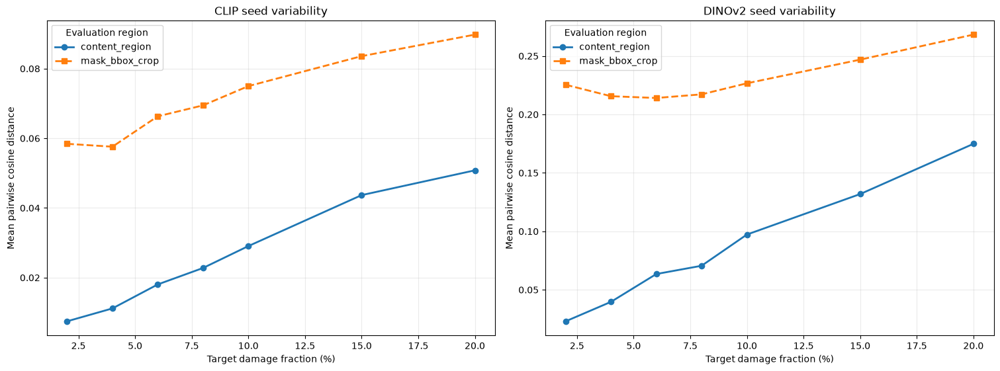

,target_damage_fraction,metric_name,region_id,pair_count,mean_distance,median_distance,minimum_distance,maximum_distance,p95_distance
0,0.02,pairwise_clip_cosine_distance,content_region,210,0.007464,0.003616,0.000374,0.084173,0.030067
1,0.04,pairwise_clip_cosine_distance,content_region,210,0.011159,0.006701,0.000898,0.106775,0.032227
2,0.06,pairwise_clip_cosine_distance,content_region,210,0.018044,0.009194,0.002004,0.112620,0.060803
3,0.08,pairwise_clip_cosine_distance,content_region,210,0.022768,0.013201,0.002546,0.153407,0.075717
4,0.10,pairwise_clip_cosine_distance,content_region,210,0.029056,0.016734,0.003214,0.143260,0.089661
5,0.15,pairwise_clip_cosine_distance,content_region,210,0.043689,0.028476,0.004989,0.175295,0.124174
6,0.20,pairwise_clip_cosine_distance,content_region,210,0.050804,0.035996,0.008231,0.240162,0.146026
7,0.02,pairwise_clip_cosine_distance,mask_bbox_crop,210,0.058419,0.050858,0.008629,0.215506,0.122848
8,0.04,pairwise_clip_cosine_distance,mask_bbox_crop,210,0.057592,0.050015,0.008215,0.185871,0.127364
9,0.06,pairwise_clip_cosine_distance,mask_bbox_crop,210,0.066318,0.055542,0.010228,0.210722,0.147710


,painting_id,target_damage_fraction,metric_name,region_id,mean_pairwise_distance,pair_count
0,p001,0.02,pairwise_clip_cosine_distance,content_region,0.003703,6
1,p001,0.02,pairwise_clip_cosine_distance,mask_bbox_crop,0.048708,6
2,p001,0.02,pairwise_dinov2_cosine_distance,content_region,0.001279,6
3,p001,0.02,pairwise_dinov2_cosine_distance,mask_bbox_crop,0.078626,6
4,p001,0.04,pairwise_clip_cosine_distance,content_region,0.012849,6
5,p001,0.04,pairwise_clip_cosine_distance,mask_bbox_crop,0.058662,6
6,p001,0.04,pairwise_dinov2_cosine_distance,content_region,0.004672,6
7,p001,0.04,pairwise_dinov2_cosine_distance,mask_bbox_crop,0.100160,6
8,p001,0.06,pairwise_clip_cosine_distance,content_region,0.043300,6
9,p001,0.06,pairwise_clip_cosine_distance,mask_bbox_crop,0.100801,6


Feature-space uncertainty completed.
Combined embedding rows: 3920
Frozen-anchor embedding rows: 980
Extension embedding rows: 2940
Feature uncertainty rows: 5880
Unique candidate pairs: 1470
Rows per group: [24]
Metric-name counts: {'pairwise_clip_cosine_distance': 2940, 'pairwise_dinov2_cosine_distance': 2940}
Region counts: {'content_region': 2940, 'mask_bbox_crop': 2940}
Finite values: True
Runtime seconds: 2.28


In [35]:
# ---------------------------------------------------------------------------
# Load frozen Notebook 15 embedding evidence
# ---------------------------------------------------------------------------

frozen_embedding_manifest_df = pd.read_csv(
    INPUTS[
        "feature_embedding_manifest_path"
    ],
    low_memory=False,
)

frozen_embedding_arrays = (
    load_feature_embedding_bundle(
        INPUTS[
            "feature_embeddings_path"
        ]
    )
)


# ---------------------------------------------------------------------------
# Combine frozen anchors with extension-owned embeddings
# ---------------------------------------------------------------------------

(
    combined_embedding_manifest_df,
    combined_embedding_arrays,
) = combine_anchor_and_extension_embeddings(
    uncertainty_population_df,
    frozen_embedding_manifest_df,
    frozen_embedding_arrays,
    [
        extension_embedding_manifest_df,
    ],
    extension_embedding_arrays,
    config=extension_config,
)

anchor_candidate_ids = set(
    uncertainty_population_df.loc[
        pd.to_numeric(
            uncertainty_population_df[
                "seed"
            ],
            errors="raise",
        ).eq(
            int(
                FROZEN_BOUNDARY[
                    "anchor_seed"
                ]
            )
        ),
        "candidate_id",
    ].astype(str)
)

combined_anchor_embedding_count = int(
    combined_embedding_manifest_df[
        "representative_candidate_id"
    ].astype(str).isin(
        anchor_candidate_ids
    ).sum()
)

combined_extension_embedding_count = (
    len(combined_embedding_manifest_df)
    - combined_anchor_embedding_count
)


# ---------------------------------------------------------------------------
# Compute all feature-space candidate-pair distances
# ---------------------------------------------------------------------------

feature_uncertainty_started = (
    time.perf_counter()
)

feature_uncertainty_metrics_df = (
    compute_feature_pairwise_uncertainty(
        uncertainty_population_df,
        embedding_manifest=(
            combined_embedding_manifest_df
        ),
        embedding_arrays=(
            combined_embedding_arrays
        ),
        config=uncertainty_adapter_config,
        progress_callback=print,
    )
)

feature_uncertainty_seconds = (
    time.perf_counter()
    - feature_uncertainty_started
)

feature_metric_values = pd.to_numeric(
    feature_uncertainty_metrics_df[
        "value"
    ],
    errors="coerce",
)

feature_rows_per_group = (
    feature_uncertainty_metrics_df
    .groupby(
        "uncertainty_group_id"
    )
    .size()
)

feature_metric_name_counts = {
    str(key): int(value)
    for key, value in (
        feature_uncertainty_metrics_df[
            "metric_name"
        ]
        .value_counts()
        .sort_index()
        .items()
    )
}

feature_region_counts = {
    str(key): int(value)
    for key, value in (
        feature_uncertainty_metrics_df[
            "region_id"
        ]
        .value_counts()
        .sort_index()
        .items()
    )
}

feature_unique_pair_count = (
    feature_uncertainty_metrics_df[
        [
            "uncertainty_group_id",
            "candidate_id_a",
            "candidate_id_b",
        ]
    ]
    .drop_duplicates()
    .shape[0]
)


# ---------------------------------------------------------------------------
# Descriptive damage-level QA
# ---------------------------------------------------------------------------

feature_damage_summary_df = (
    feature_uncertainty_metrics_df
    .groupby(
        [
            "target_damage_fraction",
            "metric_name",
            "region_id",
        ],
        as_index=False,
        dropna=False,
    )
    .agg(
        pair_count=("value", "size"),
        mean_distance=("value", "mean"),
        median_distance=("value", "median"),
        minimum_distance=("value", "min"),
        maximum_distance=("value", "max"),
        p95_distance=(
            "value",
            lambda values: float(
                np.percentile(values, 95)
            ),
        ),
    )
    .sort_values(
        [
            "metric_name",
            "region_id",
            "target_damage_fraction",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

feature_trajectory_summary_df = (
    feature_uncertainty_metrics_df
    .groupby(
        [
            "painting_id",
            "target_damage_fraction",
            "metric_name",
            "region_id",
        ],
        as_index=False,
        dropna=False,
    )
    .agg(
        mean_pairwise_distance=(
            "value",
            "mean",
        ),
        pair_count=("value", "size"),
    )
)

figure, axes = plt.subplots(
    1,
    2,
    figsize=(15, 5.5),
    constrained_layout=True,
)

metric_panel_order = [
    "pairwise_clip_cosine_distance",
    "pairwise_dinov2_cosine_distance",
]

metric_panel_titles = {
    "pairwise_clip_cosine_distance": (
        "CLIP seed variability"
    ),
    "pairwise_dinov2_cosine_distance": (
        "DINOv2 seed variability"
    ),
}

region_styles = {
    "content_region": {
        "marker": "o",
        "linestyle": "-",
    },
    "mask_bbox_crop": {
        "marker": "s",
        "linestyle": "--",
    },
}

for axis, metric_name in zip(
    axes,
    metric_panel_order,
):
    selected = (
        feature_damage_summary_df.loc[
            feature_damage_summary_df[
                "metric_name"
            ].eq(metric_name)
        ]
    )

    for region_id, style in (
        region_styles.items()
    ):
        line = (
            selected.loc[
                selected[
                    "region_id"
                ].eq(region_id)
            ]
            .sort_values(
                "target_damage_fraction"
            )
        )

        axis.plot(
            line[
                "target_damage_fraction"
            ] * 100.0,
            line["mean_distance"],
            label=region_id,
            linewidth=2.0,
            markersize=6,
            **style,
        )

    axis.set_title(
        metric_panel_titles[
            metric_name
        ]
    )
    axis.set_xlabel(
        "Target damage fraction (%)"
    )
    axis.set_ylabel(
        "Mean pairwise cosine distance"
    )
    axis.grid(
        alpha=0.25
    )
    axis.legend(
        title="Evaluation region"
    )

plt.show()

display(feature_damage_summary_df)
display(
    feature_trajectory_summary_df.head(20)
)

print("Feature-space uncertainty completed.")
print(
    "Combined embedding rows:",
    len(combined_embedding_manifest_df),
)
print(
    "Frozen-anchor embedding rows:",
    combined_anchor_embedding_count,
)
print(
    "Extension embedding rows:",
    combined_extension_embedding_count,
)
print(
    "Feature uncertainty rows:",
    len(feature_uncertainty_metrics_df),
)
print(
    "Unique candidate pairs:",
    feature_unique_pair_count,
)
print(
    "Rows per group:",
    sorted(
        feature_rows_per_group
        .astype(int)
        .unique()
        .tolist()
    ),
)
print(
    "Metric-name counts:",
    feature_metric_name_counts,
)
print(
    "Region counts:",
    feature_region_counts,
)
print(
    "Finite values:",
    bool(
        feature_metric_values.notna().all()
        and np.isfinite(
            feature_metric_values
        ).all()
    ),
)
print(
    "Runtime seconds:",
    round(
        feature_uncertainty_seconds,
        3,
    ),
)

In [36]:
# ---------------------------------------------------------------------------
# Idempotent Batch 7 validation assembly
# ---------------------------------------------------------------------------

preserved_validation_checks = tuple(
    check
    for check in VALIDATION.checks
    if check.validation_stage
    != "batch_7_feature_uncertainty"
)

VALIDATION = ValidationCollector()
VALIDATION.extend(
    preserved_validation_checks
)


def add_batch_7_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage=(
            "batch_7_feature_uncertainty"
        ),
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


expected_feature_metric_rows = int(
    EXPECTED_COUNTS[
        "feature_pair_rows"
    ]
)

expected_feature_groups = int(
    EXPECTED_COUNTS[
        "uncertainty_groups"
    ]
)

expected_feature_pairs = int(
    EXPECTED_COUNTS[
        "unordered_candidate_pairs"
    ]
)

expected_feature_rows_per_group = (
    expected_feature_metric_rows
    // expected_feature_groups
)

expected_feature_rows_per_metric = (
    expected_feature_metric_rows
    // len(feature_model_ids)
)

expected_feature_rows_per_region = (
    expected_feature_metric_rows
    // len(expected_learned_regions)
)

expected_extension_matrix_shapes = {
    "clip_extension_embeddings": [
        expected_extension_embeddings_per_model,
        int(
            feature_specs[
                "clip_vit_b32"
            ].embedding_dimension
        ),
    ],
    "dinov2_extension_embeddings": [
        expected_extension_embeddings_per_model,
        int(
            feature_specs[
                "dinov2_vits14"
            ].embedding_dimension
        ),
    ],
}

expected_feature_metric_counts = {
    "pairwise_clip_cosine_distance": (
        expected_feature_rows_per_metric
    ),
    "pairwise_dinov2_cosine_distance": (
        expected_feature_rows_per_metric
    ),
}

expected_feature_region_counts = {
    region_id: expected_feature_rows_per_region
    for region_id in sorted(
        expected_learned_regions
    )
}


add_batch_7_check(
    "feature_dependencies",
    (
        "Every required feature-extraction "
        "dependency is installed."
    ),
    "all installed",
    {
        str(row.component): bool(
            row.installed
        )
        for row in (
            feature_dependency_df.itertuples(
                index=False
            )
        )
    },
    feature_dependency_df[
        "installed"
    ].astype(bool).all(),
)

add_batch_7_check(
    "feature_model_contract",
    (
        "The loaded feature models match the "
        "approved CLIP and DINOv2 contract."
    ),
    list(FEATURE_MODEL_IDS),
    loaded_feature_models_df[
        "feature_model_id"
    ].astype(str).tolist(),
    (
        loaded_feature_models_df[
            "feature_model_id"
        ].astype(str).tolist()
        == list(FEATURE_MODEL_IDS)
        and not loaded_feature_models_df[
            "training_mode"
        ].astype(bool).any()
    ),
)

add_batch_7_check(
    "extension_embedding_plan",
    (
        "The extension plan contains the exact "
        "contracted number of unique restored-image "
        "embeddings."
    ),
    expected_extension_embedding_rows,
    len(extension_embedding_plan_df),
    (
        len(
            extension_embedding_plan_df
        ) == expected_extension_embedding_rows
        and extension_embedding_plan_df[
            "embedding_id"
        ].is_unique
        and not extension_embedding_plan_df[
            plan_key_columns
        ].duplicated().any()
    ),
)

add_batch_7_check(
    "extension_embeddings_per_model",
    (
        "Each encoder contributes the contracted "
        "number of extension embedding records."
    ),
    expected_extension_embedding_counts,
    extension_embedding_plan_counts,
    (
        extension_embedding_plan_counts
        == expected_extension_embedding_counts
    ),
)

add_batch_7_check(
    "extension_embedding_statuses",
    (
        "All extension embeddings completed "
        "successfully."
    ),
    {
        "ok": (
            expected_extension_embedding_rows
        ),
        "error": 0,
    },
    {
        "ok": int(
            extension_embedding_manifest_df[
                "status"
            ].astype(str).eq("ok").sum()
        ),
        "error": int(
            extension_embedding_manifest_df[
                "status"
            ].astype(str).eq(
                "error"
            ).sum()
        ),
    },
    (
        len(
            extension_embedding_manifest_df
        ) == expected_extension_embedding_rows
        and extension_embedding_manifest_df[
            "status"
        ].astype(str).eq("ok").all()
    ),
)

extension_matrix_shapes = {
    str(array_name): [
        int(value)
        for value in matrix.shape
    ]
    for array_name, matrix in (
        extension_embedding_arrays.items()
    )
}

add_batch_7_check(
    "extension_matrix_shapes",
    (
        "The two extension matrices have the "
        "exact row and embedding dimensions."
    ),
    expected_extension_matrix_shapes,
    extension_matrix_shapes,
    (
        extension_matrix_shapes
        == expected_extension_matrix_shapes
    ),
)

extension_arrays_finite = all(
    np.isfinite(
        np.asarray(matrix)
    ).all()
    for matrix in (
        extension_embedding_arrays.values()
    )
)

add_batch_7_check(
    "finite_extension_embeddings",
    (
        "Every extension embedding component "
        "is numeric and finite."
    ),
    True,
    bool(extension_arrays_finite),
    bool(extension_arrays_finite),
)

maximum_norm_error = max(
    float(
        np.max(
            np.abs(
                np.linalg.norm(
                    np.asarray(
                        matrix,
                        dtype=np.float32,
                    ),
                    axis=1,
                )
                - 1.0
            )
        )
    )
    for matrix in (
        extension_embedding_arrays.values()
    )
)

add_batch_7_check(
    "normalized_extension_embeddings",
    (
        "Every extension embedding remains "
        "L2-normalized within tolerance."
    ),
    "<= 0.0001",
    maximum_norm_error,
    maximum_norm_error <= 0.0001,
)

add_batch_7_check(
    "feature_checkpoint",
    (
        "The resumable feature manifest checkpoint "
        "contains every unique completed row."
    ),
    expected_extension_embedding_rows,
    {
        "rows": len(
            feature_checkpoint_manifest_df
        ),
        "unique_embedding_ids": int(
            feature_checkpoint_manifest_df[
                "embedding_id"
            ].nunique()
        ),
        "completed_rows": int(
            feature_checkpoint_manifest_df[
                "status"
            ].astype(str).eq("ok").sum()
        ),
    },
    (
        feature_checkpoint_resolved
        is not None
        and len(
            feature_checkpoint_manifest_df
        ) == expected_extension_embedding_rows
        and feature_checkpoint_manifest_df[
            "embedding_id"
        ].is_unique
        and feature_checkpoint_manifest_df[
            "status"
        ].astype(str).eq("ok").all()
    ),
)

combined_embedding_key_columns = [
    "representative_candidate_id",
    "region_id",
    "feature_model_id",
]

add_batch_7_check(
    "combined_embedding_population",
    (
        "Frozen and extension evidence combine "
        "into the exact contracted number of unique "
        "candidate-region-model records."
    ),
    {
        "total": (
            expected_combined_embedding_rows
        ),
        "frozen_anchor": (
            expected_anchor_embedding_rows
        ),
        "extension": (
            expected_extension_embedding_rows
        ),
    },
    {
        "total": len(
            combined_embedding_manifest_df
        ),
        "frozen_anchor": (
            combined_anchor_embedding_count
        ),
        "extension": (
            combined_extension_embedding_count
        ),
    },
    (
        len(
            combined_embedding_manifest_df
        ) == expected_combined_embedding_rows
        and combined_anchor_embedding_count
        == expected_anchor_embedding_rows
        and combined_extension_embedding_count
        == expected_extension_embedding_rows
        and not combined_embedding_manifest_df[
            combined_embedding_key_columns
        ].duplicated().any()
    ),
)

add_batch_7_check(
    "feature_metric_row_count",
    (
        "Feature uncertainty contains its exact "
        "contracted candidate-pair row count."
    ),
    expected_feature_metric_rows,
    len(feature_uncertainty_metrics_df),
    (
        len(
            feature_uncertainty_metrics_df
        ) == expected_feature_metric_rows
    ),
)

add_batch_7_check(
    "feature_group_coverage",
    (
        "Feature uncertainty covers every "
        "damage-size uncertainty group."
    ),
    expected_feature_groups,
    int(
        feature_uncertainty_metrics_df[
            "uncertainty_group_id"
        ].nunique()
    ),
    (
        feature_uncertainty_metrics_df[
            "uncertainty_group_id"
        ].nunique()
        == expected_feature_groups
    ),
)

add_batch_7_check(
    "feature_rows_per_group",
    (
        "Each group contributes six pairs across "
        "two regions and two feature models."
    ),
    [expected_feature_rows_per_group],
    sorted(
        feature_rows_per_group
        .astype(int)
        .unique()
        .tolist()
    ),
    (
        len(
            feature_rows_per_group
        ) == expected_feature_groups
        and feature_rows_per_group.eq(
            expected_feature_rows_per_group
        ).all()
    ),
)

add_batch_7_check(
    "feature_unique_pair_count",
    (
        "Feature evidence contains the exact "
        "contracted number of unique unordered "
        "candidate pairs."
    ),
    expected_feature_pairs,
    feature_unique_pair_count,
    (
        feature_unique_pair_count
        == expected_feature_pairs
    ),
)

add_batch_7_check(
    "feature_metric_counts",
    (
        "CLIP and DINOv2 each contribute their "
        "contracted pairwise-distance rows."
    ),
    expected_feature_metric_counts,
    feature_metric_name_counts,
    (
        feature_metric_name_counts
        == expected_feature_metric_counts
    ),
)

add_batch_7_check(
    "feature_region_counts",
    (
        "Both approved feature regions contribute "
        "their contracted metric rows."
    ),
    expected_feature_region_counts,
    feature_region_counts,
    (
        feature_region_counts
        == expected_feature_region_counts
    ),
)

feature_pair_order_valid = bool(
    (
        feature_uncertainty_metrics_df[
            "seed_a"
        ].astype(int)
        < feature_uncertainty_metrics_df[
            "seed_b"
        ].astype(int)
    ).all()
)

add_batch_7_check(
    "feature_pair_order",
    (
        "Every feature pair retains strict "
        "seed_a < seed_b ordering."
    ),
    True,
    feature_pair_order_valid,
    feature_pair_order_valid,
)

finite_feature_values = bool(
    feature_metric_values.notna().all()
    and np.isfinite(
        feature_metric_values
    ).all()
)

add_batch_7_check(
    "finite_feature_values",
    (
        "Every feature cosine distance is "
        "numeric and finite."
    ),
    True,
    finite_feature_values,
    finite_feature_values,
)

feature_values_in_range = bool(
    (
        feature_metric_values
        >= -1e-6
    ).all()
    and (
        feature_metric_values
        <= 2.000001
    ).all()
)

add_batch_7_check(
    "feature_distance_range",
    (
        "All cosine distances remain within "
        "their numerically tolerant theoretical "
        "range."
    ),
    "[-0.000001, 2.000001]",
    {
        "minimum": float(
            feature_metric_values.min()
        ),
        "maximum": float(
            feature_metric_values.max()
        ),
    },
    feature_values_in_range,
)

add_batch_7_check(
    "unique_feature_metric_ids",
    (
        "Every feature uncertainty row has a "
        "unique deterministic metric identifier."
    ),
    0,
    int(
        feature_uncertainty_metrics_df[
            "uncertainty_metric_id"
        ].duplicated().sum()
    ),
    feature_uncertainty_metrics_df[
        "uncertainty_metric_id"
    ].is_unique,
)

add_batch_7_check(
    "feature_metric_identity",
    (
        "All rows remain transparent feature-pair "
        "uncertainty evidence."
    ),
    {
        "observation_level": [
            "candidate_pair",
        ],
        "metric_family": [
            "feature_pairwise",
        ],
        "status": [
            "ok",
        ],
    },
    {
        "observation_level": sorted(
            feature_uncertainty_metrics_df[
                "observation_level"
            ].astype(str).unique().tolist()
        ),
        "metric_family": sorted(
            feature_uncertainty_metrics_df[
                "metric_family"
            ].astype(str).unique().tolist()
        ),
        "status": sorted(
            feature_uncertainty_metrics_df[
                "status"
            ].astype(str).unique().tolist()
        ),
    },
    (
        feature_uncertainty_metrics_df[
            "observation_level"
        ].astype(str).eq(
            "candidate_pair"
        ).all()
        and feature_uncertainty_metrics_df[
            "metric_family"
        ].astype(str).eq(
            "feature_pairwise"
        ).all()
        and feature_uncertainty_metrics_df[
            "status"
        ].astype(str).eq("ok").all()
    ),
)

add_batch_7_check(
    "feature_combined_index_absent",
    (
        "CLIP and DINOv2 remain separate "
        "components rather than a combined "
        "uncertainty index."
    ),
    0,
    int(
        feature_uncertainty_metrics_df[
            "is_combined_index"
        ].astype(bool).sum()
    ),
    not feature_uncertainty_metrics_df[
        "is_combined_index"
    ].astype(bool).any(),
)

premature_batch_7_outputs = [
    OUTPUTS[key]
    for key in (
        "candidates",
        "damage_size_uncertainty",
        "summary_figure",
        "map_manifest",
        "run_manifest",
        "artifacts",
        "validation",
    )
    if OUTPUTS[key].exists()
]

add_batch_7_check(
    "deferred_outputs",
    (
        "Combined metrics, candidate tables, "
        "figures, manifests, and validation "
        "remain deferred."
    ),
    0,
    len(premature_batch_7_outputs),
    not premature_batch_7_outputs,
    details=[
        to_repo_relative(
            path,
            PROJECT_ROOT,
        )
        for path in (
            premature_batch_7_outputs
        )
    ],
)

batch_7_validation_df = (
    VALIDATION.to_dataframe()
    .loc[
        lambda frame: frame[
            "validation_stage"
        ].eq(
            "batch_7_feature_uncertainty"
        )
    ]
    .reset_index(drop=True)
)

display(
    feature_uncertainty_metrics_df.head(15)
)
display(feature_damage_summary_df)
display(batch_7_validation_df)

VALIDATION.raise_for_blocking()

print("Notebook 22 Batch 7 summary")
print("---------------------------")
print(
    "Batch 7 checks:",
    len(batch_7_validation_df),
)
print(
    "Cumulative checks:",
    len(VALIDATION.checks),
)
print(
    "Blocking failures:",
    len(
        VALIDATION.blocking_failures
    ),
)
print(
    "Extension embedding rows:",
    len(extension_embedding_manifest_df),
)
print(
    "Combined embedding rows:",
    len(combined_embedding_manifest_df),
)
print(
    "Feature uncertainty rows:",
    len(feature_uncertainty_metrics_df),
)
print(
    "Unique candidate pairs:",
    feature_unique_pair_count,
)
print(
    "Feature extraction seconds:",
    round(
        feature_extraction_seconds,
        3,
    ),
)
print(
    "Feature-distance seconds:",
    round(
        feature_uncertainty_seconds,
        3,
    ),
)
print(
    "Canonical feature table written separately:",
    False,
)
print("Batch 7 completion gate passed.")

,uncertainty_metric_id,uncertainty_group_id,observation_level,case_id,model_id,painting_id,category,style_or_period,dataset_id,dataset_scope,...,region_id,summary_statistic,value,value_unit,metric_version,region_policy_version,evidence_role,is_combined_index,status,issue
0,um_d990f544d9275a33d3b5,ug_055304d3f45086910a,candidate_pair,damage_size__p093__loss_large__size_20pct,stable_diffusion_inpainting,p093,abstraction_surrealism,Symbolism / Post-Impressionism,painting_restoration_eval,controlled_300,...,content_region,pair_value,0.038295,cosine_distance,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
1,um_224533cc7b77f0b4ab54,ug_055304d3f45086910a,candidate_pair,damage_size__p093__loss_large__size_20pct,stable_diffusion_inpainting,p093,abstraction_surrealism,Symbolism / Post-Impressionism,painting_restoration_eval,controlled_300,...,content_region,pair_value,0.074275,cosine_distance,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
2,um_73c07ba9eff177018306,ug_055304d3f45086910a,candidate_pair,damage_size__p093__loss_large__size_20pct,stable_diffusion_inpainting,p093,abstraction_surrealism,Symbolism / Post-Impressionism,painting_restoration_eval,controlled_300,...,mask_bbox_crop,pair_value,0.067365,cosine_distance,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
3,um_ab33f9363b179bc6a4a7,ug_055304d3f45086910a,candidate_pair,damage_size__p093__loss_large__size_20pct,stable_diffusion_inpainting,p093,abstraction_surrealism,Symbolism / Post-Impressionism,painting_restoration_eval,controlled_300,...,mask_bbox_crop,pair_value,0.113710,cosine_distance,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
4,um_00ad8c666fccaf277fd1,ug_055304d3f45086910a,candidate_pair,damage_size__p093__loss_large__size_20pct,stable_diffusion_inpainting,p093,abstraction_surrealism,Symbolism / Post-Impressionism,painting_restoration_eval,controlled_300,...,content_region,pair_value,0.055120,cosine_distance,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
5,um_353aa876667becc96b7e,ug_055304d3f45086910a,candidate_pair,damage_size__p093__loss_large__size_20pct,stable_diffusion_inpainting,p093,abstraction_surrealism,Symbolism / Post-Impressionism,painting_restoration_eval,controlled_300,...,content_region,pair_value,0.145591,cosine_distance,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
6,um_58ebed3a063cf19329ea,ug_055304d3f45086910a,candidate_pair,damage_size__p093__loss_large__size_20pct,stable_diffusion_inpainting,p093,abstraction_surrealism,Symbolism / Post-Impressionism,painting_restoration_eval,controlled_300,...,mask_bbox_crop,pair_value,0.139137,cosine_distance,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
7,um_bfbccfd5b3e8984f7164,ug_055304d3f45086910a,candidate_pair,damage_size__p093__loss_large__size_20pct,stable_diffusion_inpainting,p093,abstraction_surrealism,Symbolism / Post-Impressionism,painting_restoration_eval,controlled_300,...,mask_bbox_crop,pair_value,0.234253,cosine_distance,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
8,um_5f7b1d2cb55196b8e496,ug_055304d3f45086910a,candidate_pair,damage_size__p093__loss_large__size_20pct,stable_diffusion_inpainting,p093,abstraction_surrealism,Symbolism / Post-Impressionism,painting_restoration_eval,controlled_300,...,content_region,pair_value,0.060470,cosine_distance,empirical_seed_uncertainty.v1,evaluation_region_policy.v1,empirical_uncertainty_proxy,False,ok,
9,um_bfc3a227836fbd4390c7,ug_055304d3f45086910a,candidate_pair,damage_size__p093__loss_large__size_20pct,stable_diffusion_inpainting,p093,abstraction_surrealism,Symbolism / Post-Impressionism,painting_restoration_eval,controlled_300,...,content_region,pair_value,0.038050,

,target_damage_fraction,metric_name,region_id,pair_count,mean_distance,median_distance,minimum_distance,maximum_distance,p95_distance
0,0.02,pairwise_clip_cosine_distance,content_region,210,0.007464,0.003616,0.000374,0.084173,0.030067
1,0.04,pairwise_clip_cosine_distance,content_region,210,0.011159,0.006701,0.000898,0.106775,0.032227
2,0.06,pairwise_clip_cosine_distance,content_region,210,0.018044,0.009194,0.002004,0.112620,0.060803
3,0.08,pairwise_clip_cosine_distance,content_region,210,0.022768,0.013201,0.002546,0.153407,0.075717
4,0.10,pairwise_clip_cosine_distance,content_region,210,0.029056,0.016734,0.003214,0.143260,0.089661
5,0.15,pairwise_clip_cosine_distance,content_region,210,0.043689,0.028476,0.004989,0.175295,0.124174
6,0.20,pairwise_clip_cosine_distance,content_region,210,0.050804,0.035996,0.008231,0.240162,0.146026
7,0.02,pairwise_clip_cosine_distance,mask_bbox_crop,210,0.058419,0.050858,0.008629,0.215506,0.122848
8,0.04,pairwise_clip_cosine_distance,mask_bbox_crop,210,0.057592,0.050015,0.008215,0.185871,0.127364
9,0.06,pairwise_clip_cosine_distance,mask_bbox_crop,210,0.066318,0.055542,0.010228,0.210722,0.147710


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_7_feature_uncertainty,feature_dependencies,Every required feature-extraction dependency i...,blocking,all installed,"{""Pillow"": true, ""PyYAML"": true, ""torch"": true...",True,
1,batch_7_feature_uncertainty,feature_model_contract,The loaded feature models match the approved C...,blocking,"[""clip_vit_b32"", ""dinov2_vits14""]","[""clip_vit_b32"", ""dinov2_vits14""]",True,
2,batch_7_feature_uncertainty,extension_embedding_plan,The extension plan contains the exact contract...,blocking,2940,2940,True,
3,batch_7_feature_uncertainty,extension_embeddings_per_model,Each encoder contributes the contracted number...,blocking,"{""clip_vit_b32"": 1470, ""dinov2_vits14"": 1470}","{""clip_vit_b32"": 1470, ""dinov2_vits14"": 1470}",True,
4,batch_7_feature_uncertainty,extension_embedding_statuses,All extension embeddings completed successfully.,blocking,"{""error"": 0, ""ok"": 2940}","{""error"": 0, ""ok"": 2940}",True,
5,batch_7_feature_uncertainty,extension_matrix_shapes,The two extension matrices have the exact row ...,blocking,"{""clip_extension_embeddings"": [1470, 512], ""di...","{""clip_extension_embeddings"": [1470, 512], ""di...",True,
6,batch_7_feature_uncertainty,finite_extension_embeddings,Every extension embedding component is numeric...,blocking,True,True,True,
7,batch_7_feature_uncertainty,normalized_extension_embeddings,Every extension embedding remains L2-normalize...,blocking,<= 0.0001,1.1920928955078125e-07,True,
8,batch_7_feature_uncertainty,feature_checkpoint,The resumable feature manifest checkpoint cont...,blocking,2940,"{""completed_rows"": 2940, ""rows"": 2940, ""unique...",True,
9,batch_7_feature_uncertainty,combined_embedding_population,Frozen and extension evidence combine into the...,blocking,"{""extension"": 2940, ""frozen_anchor"": 980, ""tot...","{""extension"": 2940, ""frozen_anchor"": 980, ""tot...",True,


Notebook 22 Batch 7 summary
---------------------------
Batch 7 checks: 23
Cumulative checks: 179
Blocking failures: 0
Extension embedding rows: 2940
Combined embedding rows: 3920
Feature uncertainty rows: 5880
Unique candidate pairs: 1470
Feature extraction seconds: 181.807
Feature-distance seconds: 2.28
Canonical feature table written separately: False
Batch 7 completion gate passed.


## Batch 8 — Frozen-anchor evidence and consolidated metric contract

This batch joins validated upstream evidence for the frozen seed-2026 candidate in every damage-size uncertainty group.

Each of the 245 anchors contributes 16 reference measurements covering:

- classical reference error and similarity;
- LPIPS;
- CLIP and DINOv2 feature similarity;
- spatial error and pixel-level improvement;
- texture consistency;
- colour consistency;
- boundary-seam consistency;
- semantic and structural diagnostic proxies.

This produces exactly 3,920 frozen-anchor reference rows.

The measurements describe only the existing Notebook 11 seed-2026 candidate. They are not assigned to seeds `2027`, `2028`, or `2029`, because those candidates were not evaluated by the frozen upstream notebooks.

The batch then combines:

- 20,580 image-space uncertainty rows;
- 2,940 LPIPS uncertainty rows;
- 5,880 CLIP/DINOv2 uncertainty rows;
- 3,920 frozen-anchor reference rows.

The resulting in-memory canonical metric population contains exactly 33,320 transparent long-form rows. No combined uncertainty or trustworthiness score is created, and no canonical metric CSV is written until the persistence batch.

In [38]:
from restoration_eval.damage_size_diffusion_uncertainty import (
    DIFFUSION_UNCERTAINTY_COLUMNS,
    build_anchor_reference_rows,
    validate_extension_metrics,
)


# ---------------------------------------------------------------------------
# Load the six frozen upstream metric sources
# ---------------------------------------------------------------------------

reference_source_tables = {
    "classical": pd.read_csv(
        INPUTS["classical_metrics_path"],
        low_memory=False,
    ),
    "lpips": pd.read_csv(
        INPUTS["lpips_metrics_path"],
        low_memory=False,
    ),
    "feature": pd.read_csv(
        INPUTS["feature_metrics_path"],
        low_memory=False,
    ),
    "spatial": pd.read_csv(
        INPUTS["spatial_diagnostics_path"],
        low_memory=False,
    ),
    "local_consistency": pd.read_csv(
        INPUTS["local_consistency_path"],
        low_memory=False,
    ),
    "semantic": pd.read_csv(
        INPUTS["semantic_structural_path"],
        low_memory=False,
    ),
}

anchor_candidate_ids = set(
    uncertainty_population_df.loc[
        pd.to_numeric(
            uncertainty_population_df["seed"],
            errors="raise",
        ).eq(
            int(
                FROZEN_BOUNDARY["anchor_seed"]
            )
        ),
        "candidate_id",
    ].astype(str)
)

reference_source_audit_records = []

for source_name, source_df in (
    reference_source_tables.items()
):
    if "candidate_id" not in source_df.columns:
        raise KeyError(
            f"Reference source {source_name} "
            "does not contain candidate_id."
        )

    anchor_source_rows = source_df.loc[
        source_df["candidate_id"]
        .astype(str)
        .isin(anchor_candidate_ids)
    ]

    if "status" in anchor_source_rows.columns:
        successful_anchor_source_rows = int(
            anchor_source_rows[
                "status"
            ].astype(str).eq("ok").sum()
        )
        failed_anchor_source_rows = int(
            (
                ~anchor_source_rows[
                    "status"
                ].astype(str).eq("ok")
            ).sum()
        )
    else:
        successful_anchor_source_rows = len(
            anchor_source_rows
        )
        failed_anchor_source_rows = 0

    reference_source_audit_records.append(
        {
            "source_name": source_name,
            "total_source_rows": len(
                source_df
            ),
            "anchor_rows": len(
                anchor_source_rows
            ),
            "anchor_candidates": int(
                anchor_source_rows[
                    "candidate_id"
                ].astype(str).nunique()
            ),
            "successful_anchor_rows": (
                successful_anchor_source_rows
            ),
            "failed_anchor_rows": (
                failed_anchor_source_rows
            ),
            "required_anchor_candidates": int(EXPECTED_COUNTS["frozen_anchor_candidates"]),
            "candidate_coverage_passed": (
                anchor_source_rows[
                    "candidate_id"
                ].astype(str).nunique()
                == int(EXPECTED_COUNTS["frozen_anchor_candidates"])
            ),
        }
    )

reference_source_audit_df = pd.DataFrame(
    reference_source_audit_records
)


# ---------------------------------------------------------------------------
# Normalize the 16 reference specifications
# ---------------------------------------------------------------------------

reference_specification_df = pd.DataFrame(
    [
        {
            "metric_name": str(
                specification["alias"]
            ),
            "source_name": str(
                specification["source"]
            ),
            "metric_family": str(
                specification[
                    "metric_family"
                ]
            ),
            "region_id": str(
                specification
                .get("filters", {})
                .get(
                    "region_id",
                    "not_applicable",
                )
            ),
            "source_value_column": str(
                specification[
                    "value_column"
                ]
            ),
            "value_unit": str(
                specification["value_unit"]
            ),
            "filters": json.dumps(
                specification.get(
                    "filters",
                    {},
                ),
                sort_keys=True,
            ),
        }
        for specification in (
            REFERENCE_POLICY[
                "specifications"
            ]
        )
    ]
)

if reference_specification_df[
    "metric_name"
].duplicated().any():
    raise ValueError(
        "Frozen reference aliases must be unique."
    )


# ---------------------------------------------------------------------------
# Construct the contracted normalized reference rows
# ---------------------------------------------------------------------------

anchor_reference_metrics_df = (
    build_anchor_reference_rows(
        uncertainty_population_df,
        reference_source_tables,
        config=extension_config,
    )
)

anchor_reference_values = pd.to_numeric(
    anchor_reference_metrics_df["value"],
    errors="coerce",
)

reference_alias_counts = {
    str(key): int(value)
    for key, value in (
        anchor_reference_metrics_df[
            "metric_name"
        ]
        .value_counts()
        .sort_index()
        .items()
    )
}

reference_family_counts = {
    str(key): int(value)
    for key, value in (
        anchor_reference_metrics_df[
            "metric_family"
        ]
        .value_counts()
        .sort_index()
        .items()
    )
}

reference_alias_summary_df = (
    anchor_reference_metrics_df
    .groupby(
        [
            "metric_family",
            "metric_name",
            "region_id",
            "value_unit",
        ],
        as_index=False,
        dropna=False,
    )
    .agg(
        row_count=("value", "size"),
        painting_count=(
            "painting_id",
            "nunique",
        ),
        group_count=(
            "uncertainty_group_id",
            "nunique",
        ),
        minimum_value=("value", "min"),
        median_value=("value", "median"),
        mean_value=("value", "mean"),
        maximum_value=("value", "max"),
    )
    .merge(
        reference_specification_df[
            [
                "metric_name",
                "source_name",
                "source_value_column",
                "filters",
            ]
        ],
        on="metric_name",
        how="left",
        validate="one_to_one",
    )
    .sort_values(
        [
            "metric_family",
            "metric_name",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

display(reference_source_audit_df)
display(reference_specification_df)
display(reference_alias_summary_df)
display(anchor_reference_metrics_df.head(16))

print("Frozen-anchor reference evidence assembled.")
print(
    "Reference specifications:",
    len(reference_specification_df),
)
print(
    "Reference rows:",
    len(anchor_reference_metrics_df),
)
print(
    "Reference groups:",
    anchor_reference_metrics_df[
        "uncertainty_group_id"
    ].nunique(),
)
print(
    "Rows per group:",
    sorted(
        anchor_reference_metrics_df
        .groupby(
            "uncertainty_group_id"
        )
        .size()
        .astype(int)
        .unique()
        .tolist()
    ),
)
print(
    "Reference-family counts:",
    reference_family_counts,
)
print(
    "Finite values:",
    bool(
        anchor_reference_values.notna().all()
        and np.isfinite(
            anchor_reference_values
        ).all()
    ),
)
print("Frozen upstream files modified: No")

,source_name,total_source_rows,anchor_rows,anchor_candidates,successful_anchor_rows,failed_anchor_rows,required_anchor_candidates,candidate_coverage_passed
0,classical,477753,7350,245,7350,0,245,True
1,lpips,31608,490,245,490,0,245,True
2,feature,63216,980,245,980,0,245,True
3,spatial,143247,2205,245,2205,0,245,True
4,local_consistency,2060667,32095,245,31458,637,245,True
5,semantic,447312,6860,245,6860,0,245,True


,metric_name,source_name,metric_family,region_id,source_value_column,value_unit,filters
0,reference_mae_masked,classical,classical_reference,masked_region,restored_value,normalized_absolute_error,"{""metric_name"": ""mae"", ""region_id"": ""masked_re..."
1,reference_psnr_content,classical,classical_reference,content_region,restored_value,decibel,"{""metric_name"": ""psnr"", ""region_id"": ""content_..."
2,reference_ssim_crop,classical,classical_reference,mask_bbox_crop,restored_value,ssim,"{""metric_name"": ""ssim"", ""region_id"": ""mask_bbo..."
3,reference_lpips_crop,lpips,perceptual_reference,mask_bbox_crop,restored_value,lpips_distance,"{""metric_name"": ""lpips"", ""region_id"": ""mask_bb..."
4,reference_clip_crop,feature,feature_reference,mask_bbox_crop,restored_value,cosine_similarity,"{""metric_name"": ""clip_cosine_similarity"", ""reg..."
5,reference_dino_crop,feature,feature_reference,mask_bbox_crop,restored_value,cosine_similarity,"{""metric_name"": ""dinov2_cosine_similarity"", ""r..."
6,spatial_restored_error_p95_masked,spatial,spatial_reference,masked_region,restored_error_p95,normalized_rgb_error,"{""region_id"": ""masked_region""}"
7,spatial_improved_fraction_masked,spatial,spatial_reference,masked_region,improved_pixel_fraction,fraction,"{""region_id"": ""masked_region""}"
8,spatial_worsened_fraction_masked,spatial,spatial_reference,masked_region,worsened_pixel_fraction,fraction,"{""region_id"": ""masked_region""}"
9,texture_error_p95_crop,local_consistency,local_consistency_reference,mask_bbox_crop,restored_value,normalized_error,"{""metric_name"": ""local_texture_error_p95"", ""re..."


,metric_family,metric_name,region_id,value_unit,row_count,painting_count,group_count,minimum_value,median_value,mean_value,maximum_value,source_name,source_value_column,filters
0,classical_reference,reference_mae_masked,masked_region,normalized_absolute_error,245,35,245,3.862106,27.999787,29.732905,72.947073,classical,restored_value,"{""metric_name"": ""mae"", ""region_id"": ""masked_re..."
1,classical_reference,reference_psnr_content,content_region,decibel,245,35,245,15.792829,27.392346,27.945965,50.818564,classical,restored_value,"{""metric_name"": ""psnr"", ""region_id"": ""content_..."
2,classical_reference,reference_ssim_crop,mask_bbox_crop,ssim,245,35,245,0.414589,0.636322,0.646642,0.897926,classical,restored_value,"{""metric_name"": ""ssim"", ""region_id"": ""mask_bbo..."
3,feature_reference,reference_clip_crop,mask_bbox_crop,cosine_similarity,245,35,245,0.722105,0.916431,0.905529,0.978639,feature,restored_value,"{""metric_name"": ""clip_cosine_similarity"", ""reg..."
4,feature_reference,reference_dino_crop,mask_bbox_crop,cosine_similarity,245,35,245,0.282410,0.713629,0.688271,0.939541,feature,restored_value,"{""metric_name"": ""dinov2_cosine_similarity"", ""r..."
5,local_consistency_reference,colour_delta_e_masked,masked_region,CIEDE2000,245,35,245,3.057916,12.504801,13.168606,28.770205,local_consistency,restored_value,"{""metric_name"": ""delta_e_ciede2000_mean"", ""reg..."
6,local_consistency_reference,seam_gradient_mismatch,boundary_ring,normalized_error,245,35,245,0.002409,0.014702,0.015414,0.036088,local_consistency,restored_value,"{""metric_name"": ""boundary_gradient_mismatch"", ..."
7,local_consistency_reference,seam_ssim_error,boundary_ring,ssim_error,245,35,245,0.099146,0.365086,0.356276,0.637861,local_consistency,restored_value,"{""metric_name"": ""boundary_local_ssim_map_error..."
8,local_consistency_reference,texture_error_p95_crop,mask_bbox_crop,normalized_error,245,35,245,0.475274,2.228400,3.309184,19.750321,local_consistency,restored_value,"{""metric_name"": ""local_texture_error_p95"", ""re..."
9,perceptual_reference,reference_lpips_crop,mask_bbox_crop,lpips_distance,245,35,245,0.145501,0.340446,0.339286,0.578043,lpips,restored_value,"{""metric_name"": ""lpips"", ""region_id"": ""mask_bb..."


,uncertainty_metric_id,uncertainty_group_id,observation_level,case_id,model_id,painting_id,category,style_or_period,dataset_id,dataset_scope,...,region_id,summary_statistic,value,value_unit,metric_version,region_policy_version,evidence_role,is_combined_index,status,issue
0,um_8acd009099ce0ac41c1d,ug_5eb8fa6dd0f403f946,seed_reference,damage_size__p001__loss_large__size_02pct,stable_diffusion_inpainting,p001,portrait_figure,Baroque,painting_restoration_eval,controlled_300,...,masked_region,value,9.970149,normalized_absolute_error,damage_size_empirical_seed_uncertainty.v1,evaluation_region_policy.v1,frozen_anchor_reference,False,ok,
1,um_151040eb5969ec56c601,ug_5eb8fa6dd0f403f946,seed_reference,damage_size__p001__loss_large__size_02pct,stable_diffusion_inpainting,p001,portrait_figure,Baroque,painting_restoration_eval,controlled_300,...,content_region,value,40.462090,decibel,damage_size_empirical_seed_uncertainty.v1,evaluation_region_policy.v1,frozen_anchor_reference,False,ok,
2,um_9adac377f12fc9ff9922,ug_5eb8fa6dd0f403f946,seed_reference,damage_size__p001__loss_large__size_02pct,stable_diffusion_inpainting,p001,portrait_figure,Baroque,painting_restoration_eval,controlled_300,...,mask_bbox_crop,value,0.859198,ssim,damage_size_empirical_seed_uncertainty.v1,evaluation_region_policy.v1,frozen_anchor_reference,False,ok,
3,um_fa6e87031863532a6c44,ug_5eb8fa6dd0f403f946,seed_reference,damage_size__p001__loss_large__size_02pct,stable_diffusion_inpainting,p001,portrait_figure,Baroque,painting_restoration_eval,controlled_300,...,mask_bbox_crop,value,0.865792,cosine_similarity,damage_size_empirical_seed_uncertainty.v1,evaluation_region_policy.v1,frozen_anchor_reference,False,ok,
4,um_105c705ed9311e80ce80,ug_5eb8fa6dd0f403f946,seed_reference,damage_size__p001__loss_large__size_02pct,stable_diffusion_inpainting,p001,portrait_figure,Baroque,painting_restoration_eval,controlled_300,...,mask_bbox_crop,value,0.875609,cosine_similarity,damage_size_empirical_seed_uncertainty.v1,evaluation_region_policy.v1,frozen_anchor_reference,False,ok,
5,um_7c00e809a19c8e7d196a,ug_5eb8fa6dd0f403f946,seed_reference,damage_size__p001__loss_large__size_02pct,stable_diffusion_inpainting,p001,portrait_figure,Baroque,painting_restoration_eval,controlled_300,...,masked_region,value,5.028550,CIEDE2000,damage_size_empirical_seed_uncertainty.v1,evaluation_region_policy.v1,frozen_anchor_reference,False,ok,
6,um_967fdf788f2de5eb6c40,ug_5eb8fa6dd0f403f946,seed_reference,damage_size__p001__loss_large__size_02pct,stable_diffusion_inpainting,p001,portrait_figure,Baroque,painting_restoration_eval,controlled_300,...,boundary_ring,value,0.008591,normalized_error,damage_size_empirical_seed_uncertainty.v1,evaluation_region_policy.v1,frozen_anchor_reference,False,ok,
7,um_80a34e5dbd059339daed,ug_5eb8fa6dd0f403f946,seed_reference,damage_size__p001__loss_large__size_02pct,stable_diffusion_inpainting,p001,portrait_figure,Baroque,painting_restoration_eval,controlled_300,...,boundary_ring,value,0.235821,ssim_error,damage_size_empirical_seed_uncertainty.v1,evaluation_region_policy.v1,frozen_anchor_reference,False,ok,
8,um_98d835c491241a4ec356,ug_5eb8fa6dd0f403f946,seed_reference,damage_size__p001__loss_large__size_02pct,stable_diffusion_inpainting,p001,portrait_figure,Baroque,painting_restoration_eval,controlled_300,...,mask_bbox_crop,value,0.918114,normalized_error,damage_size_empirical_seed_uncertainty.v1,evaluation_region_policy.v1,frozen_anchor_reference,False,ok,
9,um_5872616457aecf840486,ug_5eb8fa6dd0f403f946,seed_reference,damage_size__p001__loss_large__size_02pct,stable_diffusion_inpainting,p001,portrait_figure,Baroque,painting_restoration_eval,controlled_300,...,mask_bbox_crop,value,0.168177,lpips_distance,damage_size_empirical_seed_uncertainty.v1,evaluation_region_policy.v1,frozen_anchor_reference,False,ok,


Frozen-anchor reference evidence assembled.
Reference specifications: 16
Reference rows: 3920
Reference groups: 245
Rows per group: [16]
Reference-family counts: {'classical_reference': 735, 'feature_reference': 490, 'local_consistency_reference': 980, 'perceptual_reference': 245, 'semantic_reference': 735, 'spatial_reference': 735}
Finite values: True
Frozen upstream files modified: No


In [39]:
# ---------------------------------------------------------------------------
# Assemble the complete canonical metric population in memory
# ---------------------------------------------------------------------------

damage_size_uncertainty_metrics_df = (
    pd.concat(
        [
            image_space_metrics_df,
            lpips_uncertainty_metrics_df,
            feature_uncertainty_metrics_df,
            anchor_reference_metrics_df,
        ],
        ignore_index=True,
    )
    .loc[
        :,
        DIFFUSION_UNCERTAINTY_COLUMNS,
    ]
    .sort_values(
        [
            "painting_id",
            "target_damage_fraction",
            "uncertainty_group_id",
            "observation_level",
            "metric_family",
            "metric_name",
            "region_id",
            "seed",
            "seed_a",
            "seed_b",
        ],
        kind="stable",
        na_position="last",
    )
    .reset_index(drop=True)
)

complete_metric_validation = (
    validate_extension_metrics(
        damage_size_uncertainty_metrics_df,
        uncertainty_population_df,
        config=extension_config,
    )
)

complete_metric_values = pd.to_numeric(
    damage_size_uncertainty_metrics_df[
        "value"
    ],
    errors="coerce",
)

complete_metric_family_counts = {
    str(key): int(value)
    for key, value in (
        damage_size_uncertainty_metrics_df[
            "metric_family"
        ]
        .value_counts()
        .sort_index()
        .items()
    )
}

complete_observation_level_counts = {
    str(key): int(value)
    for key, value in (
        damage_size_uncertainty_metrics_df[
            "observation_level"
        ]
        .value_counts()
        .sort_index()
        .items()
    )
}

complete_evidence_role_counts = {
    str(key): int(value)
    for key, value in (
        damage_size_uncertainty_metrics_df[
            "evidence_role"
        ]
        .value_counts()
        .sort_index()
        .items()
    )
}


# ---------------------------------------------------------------------------
# Build a group-level descriptive view without replacing raw evidence
# ---------------------------------------------------------------------------

group_summary_rows_df = (
    damage_size_uncertainty_metrics_df.loc[
        damage_size_uncertainty_metrics_df[
            "observation_level"
        ].astype(str).eq(
            "group_summary"
        )
    ]
    .copy()
)

pairwise_group_summary_df = (
    damage_size_uncertainty_metrics_df.loc[
        damage_size_uncertainty_metrics_df[
            "observation_level"
        ].astype(str).eq(
            "candidate_pair"
        )
    ]
    .groupby(
        [
            "uncertainty_group_id",
            "case_id",
            "painting_id",
            "category",
            "style_or_period",
            "target_damage_fraction",
            "realized_damage_fraction",
            "metric_family",
            "metric_name",
            "region_id",
            "value_unit",
        ],
        as_index=False,
        dropna=False,
    )
    .agg(
        pair_count=("value", "size"),
        mean_pairwise_value=(
            "value",
            "mean",
        ),
        median_pairwise_value=(
            "value",
            "median",
        ),
        minimum_pairwise_value=(
            "value",
            "min",
        ),
        maximum_pairwise_value=(
            "value",
            "max",
        ),
    )
)

damage_level_pairwise_summary_df = (
    pairwise_group_summary_df
    .groupby(
        [
            "target_damage_fraction",
            "metric_family",
            "metric_name",
            "region_id",
            "value_unit",
        ],
        as_index=False,
        dropna=False,
    )
    .agg(
        group_count=(
            "uncertainty_group_id",
            "nunique",
        ),
        painting_count=(
            "painting_id",
            "nunique",
        ),
        mean_of_group_means=(
            "mean_pairwise_value",
            "mean",
        ),
        median_of_group_means=(
            "mean_pairwise_value",
            "median",
        ),
        minimum_group_mean=(
            "mean_pairwise_value",
            "min",
        ),
        maximum_group_mean=(
            "mean_pairwise_value",
            "max",
        ),
    )
    .sort_values(
        [
            "metric_family",
            "metric_name",
            "region_id",
            "target_damage_fraction",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)


# ---------------------------------------------------------------------------
# Compact cross-family group review
# ---------------------------------------------------------------------------

review_metric_contract = [
    {
        "metric_name": "pixel_rgb_std_mean",
        "region_id": "masked_region",
        "review_label": "masked_rgb_std",
    },
    {
        "metric_name": "pairwise_rgb_mae",
        "region_id": "masked_region",
        "review_label": "masked_pairwise_rgb_mae",
    },
    {
        "metric_name": "pairwise_lpips_distance",
        "region_id": "mask_bbox_crop",
        "review_label": "crop_pairwise_lpips",
    },
    {
        "metric_name": "pairwise_clip_cosine_distance",
        "region_id": "mask_bbox_crop",
        "review_label": "crop_pairwise_clip",
    },
    {
        "metric_name": "pairwise_dinov2_cosine_distance",
        "region_id": "mask_bbox_crop",
        "review_label": "crop_pairwise_dinov2",
    },
]

cross_family_review_frames = []

for item in review_metric_contract:
    selected = (
        damage_size_uncertainty_metrics_df.loc[
            damage_size_uncertainty_metrics_df[
                "metric_name"
            ].astype(str).eq(
                item["metric_name"]
            )
            & damage_size_uncertainty_metrics_df[
                "region_id"
            ].astype(str).eq(
                item["region_id"]
            )
        ]
    )

    summarized = (
        selected
        .groupby(
            [
                "uncertainty_group_id",
                "painting_id",
                "target_damage_fraction",
            ],
            as_index=False,
            dropna=False,
        )
        .agg(value=("value", "mean"))
        .rename(
            columns={
                "value": item[
                    "review_label"
                ],
            }
        )
    )

    cross_family_review_frames.append(
        summarized
    )

cross_family_group_review_df = (
    cross_family_review_frames[0]
)

for frame in (
    cross_family_review_frames[1:]
):
    cross_family_group_review_df = (
        cross_family_group_review_df.merge(
            frame,
            on=[
                "uncertainty_group_id",
                "painting_id",
                "target_damage_fraction",
            ],
            how="inner",
            validate="one_to_one",
        )
    )

cross_family_group_review_df = (
    cross_family_group_review_df
    .sort_values(
        [
            "painting_id",
            "target_damage_fraction",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

display(
    pd.DataFrame(
        [
            complete_metric_validation
        ]
    )
)
display(
    pd.DataFrame(
        [
            {
                "metric_family": key,
                "row_count": value,
            }
            for key, value in (
                complete_metric_family_counts.items()
            )
        ]
    )
)
display(
    damage_level_pairwise_summary_df.head(30)
)
display(cross_family_group_review_df)

print("Complete metric population assembled in memory.")
print(
    "Total metric rows:",
    len(
        damage_size_uncertainty_metrics_df
    ),
)
print(
    "Metric families:",
    len(
        complete_metric_family_counts
    ),
)
print(
    "Observation levels:",
    complete_observation_level_counts,
)
print(
    "Evidence roles:",
    complete_evidence_role_counts,
)
print(
    "Group-summary rows:",
    len(group_summary_rows_df),
)
print(
    "Pairwise group summaries:",
    len(pairwise_group_summary_df),
)
print(
    "Cross-family review groups:",
    len(cross_family_group_review_df),
)
print(
    "Complete metric contract passed:",
    complete_metric_validation[
        "passed"
    ],
)
print("Canonical metric CSV written: No")

,schema_version,missing_columns,row_count,group_count,candidate_count,family_counts,expected_family_counts,family_counts_match,all_values_finite,pair_order_ok,combined_index_absent,passed
0,damage_size_diffusion_uncertainty.v1,[],33320,245,980,"{'classical_reference': 735, 'feature_pairwise...","{'pixel_variability': 2940, 'pixel_pairwise': ...",True,True,True,True,True


,metric_family,row_count
0,classical_reference,735
1,feature_pairwise,5880
2,feature_reference,490
3,local_consistency_reference,980
4,perceptual_pairwise,2940
5,perceptual_reference,245
6,pixel_pairwise,17640
7,pixel_variability,2940
8,semantic_reference,735
9,spatial_reference,735


,target_damage_fraction,metric_family,metric_name,region_id,value_unit,group_count,painting_count,mean_of_group_means,median_of_group_means,minimum_group_mean,maximum_group_mean
0,0.02,feature_pairwise,pairwise_clip_cosine_distance,content_region,cosine_distance,35,35,0.007464,0.003962,0.000734,0.052974
1,0.04,feature_pairwise,pairwise_clip_cosine_distance,content_region,cosine_distance,35,35,0.011159,0.007075,0.001576,0.062265
2,0.06,feature_pairwise,pairwise_clip_cosine_distance,content_region,cosine_distance,35,35,0.018044,0.010945,0.002465,0.065227
3,0.08,feature_pairwise,pairwise_clip_cosine_distance,content_region,cosine_distance,35,35,0.022768,0.014575,0.003232,0.112775
4,0.10,feature_pairwise,pairwise_clip_cosine_distance,content_region,cosine_distance,35,35,0.029056,0.019336,0.004296,0.095083
5,0.15,feature_pairwise,pairwise_clip_cosine_distance,content_region,cosine_distance,35,35,0.043689,0.032004,0.009747,0.123045
6,0.20,feature_pairwise,pairwise_clip_cosine_distance,content_region,cosine_distance,35,35,0.050804,0.035546,0.014387,0.168173
7,0.02,feature_pairwise,pairwise_clip_cosine_distance,mask_bbox_crop,cosine_distance,35,35,0.058419,0.055689,0.019071,0.167903
8,0.04,feature_pairwise,pairwise_clip_cosine_distance,mask_bbox_crop,cosine_distance,35,35,0.057592,0.055852,0.016359,0.131879
9,0.06,feature_pairwise,pairwise_clip_cosine_distance,mask_bbox_crop,cosine_distance,35,35,0.066318,0.064609,0.023276,0.132329


,uncertainty_group_id,painting_id,target_damage_fraction,masked_rgb_std,masked_pairwise_rgb_mae,crop_pairwise_lpips,crop_pairwise_clip,crop_pairwise_dinov2
0,ug_5eb8fa6dd0f403f946,p001,0.02,0.020414,0.028772,0.103540,0.048708,0.078626
1,ug_85f6b553f2dc767b93,p001,0.04,0.024804,0.034957,0.140042,0.058662,0.100160
2,ug_b7a2f6d66493890bb7,p001,0.06,0.035197,0.049310,0.231826,0.100801,0.180657
3,ug_680f877973906df942,p001,0.08,0.043138,0.060836,0.201267,0.107790,0.127058
4,ug_222809607d0a0bbf88,p001,0.10,0.045730,0.064124,0.227068,0.092620,0.133738
...,...,...,...,...,...,...,...,...
240,ug_81b1b436111a3d76bf,p294,0.06,0.095910,0.135776,0.307184,0.064609,0.227404
241,ug_84df746a8a47e29228,p294,0.08,0.100721,0.140708,0.310386,0.113569,0.164072
242,ug_606d0ae5962f671505,p294,0.10,0.108852,0.152460,0.331378,0.039650,0.204255
243,ug_af7ac2897c8ec5ae54,p294,0.15,0.112137,0.156095,0.345636,0.071969,0.182343


Complete metric population assembled in memory.
Total metric rows: 33320
Metric families: 10
Observation levels: {'candidate_pair': 26460, 'group_summary': 2940, 'seed_reference': 3920}
Evidence roles: {'empirical_uncertainty_proxy': 29400, 'frozen_anchor_reference': 3920}
Group-summary rows: 2940
Pairwise group summaries: 4410
Cross-family review groups: 245
Complete metric contract passed: True
Canonical metric CSV written: No


In [40]:
# ---------------------------------------------------------------------------
# Idempotent Batch 8 validation assembly
# ---------------------------------------------------------------------------

preserved_validation_checks = tuple(
    check
    for check in VALIDATION.checks
    if check.validation_stage
    != "batch_8_reference_and_consolidation"
)

VALIDATION = ValidationCollector()
VALIDATION.extend(
    preserved_validation_checks
)


def add_batch_8_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage=(
            "batch_8_reference_and_consolidation"
        ),
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


expected_anchor_count = int(
    EXPECTED_COUNTS[
        "frozen_anchor_candidates"
    ]
)

expected_reference_specifications = int(
    EXPECTED_COUNTS[
        "reference_specifications"
    ]
)

expected_reference_rows = int(
    EXPECTED_COUNTS[
        "anchor_reference_rows"
    ]
)

expected_total_metric_rows = int(
    EXPECTED_COUNTS[
        "total_metric_rows"
    ]
)

expected_uncertainty_only_rows = int(
    EXPECTED_COUNTS[
        "uncertainty_only_metric_rows"
    ]
)

expected_uncertainty_groups = int(
    EXPECTED_COUNTS[
        "uncertainty_groups"
    ]
)

expected_paintings = int(
    EXPECTED_COUNTS[
        "paintings"
    ]
)

expected_observation_level_counts = {
    "candidate_pair": (
        int(
            EXPECTED_COUNTS[
                "pixel_pair_rows"
            ]
        )
        + int(
            EXPECTED_COUNTS[
                "lpips_pair_rows"
            ]
        )
        + int(
            EXPECTED_COUNTS[
                "feature_pair_rows"
            ]
        )
    ),
    "group_summary": int(
        EXPECTED_COUNTS[
            "pixel_group_summary_rows"
        ]
    ),
    "seed_reference": (
        expected_reference_rows
    ),
}

expected_reference_family_counts = {
    str(family_name): int(
        specification_count
        * expected_anchor_count
    )
    for family_name, specification_count in (
        reference_specification_df[
            "metric_family"
        ]
        .value_counts()
        .sort_index()
        .items()
    )
}


source_candidate_coverage = {
    str(row.source_name): int(
        row.anchor_candidates
    )
    for row in (
        reference_source_audit_df.itertuples(
            index=False
        )
    )
}

add_batch_8_check(
    "reference_source_coverage",
    (
        "Every frozen metric source contains "
        "all required seed-2026 anchor candidates."
    ),
    {
        source_name: expected_anchor_count
        for source_name in sorted(
            reference_source_tables
        )
    },
    source_candidate_coverage,
    (
        reference_source_audit_df[
            "candidate_coverage_passed"
        ].astype(bool).all()
        and all(
            count == expected_anchor_count
            for count in (
                source_candidate_coverage.values()
            )
        )
    ),
)

add_batch_8_check(
    "reference_specification_count",
    (
        "The frozen evidence contract contains "
        "its exact unique specification count."
    ),
    expected_reference_specifications,
    len(reference_specification_df),
    (
        len(
            reference_specification_df
        ) == expected_reference_specifications
        and reference_specification_df[
            "metric_name"
        ].is_unique
    ),
)

add_batch_8_check(
    "reference_row_count",
    (
        "Every anchor contributes every declared "
        "reference specification."
    ),
    expected_reference_rows,
    len(anchor_reference_metrics_df),
    (
        len(
            anchor_reference_metrics_df
        ) == expected_reference_rows
    ),
)

reference_rows_per_group = (
    anchor_reference_metrics_df
    .groupby(
        "uncertainty_group_id"
    )
    .size()
)

add_batch_8_check(
    "reference_rows_per_group",
    (
        "Every uncertainty group contains exactly "
        "one value for every reference "
        "specification."
    ),
    [expected_reference_specifications],
    sorted(
        reference_rows_per_group
        .astype(int)
        .unique()
        .tolist()
    ),
    (
        len(
            reference_rows_per_group
        ) == expected_uncertainty_groups
        and reference_rows_per_group.eq(
            expected_reference_specifications
        ).all()
    ),
)

alias_coverage_valid = bool(
    len(
        reference_alias_counts
    ) == expected_reference_specifications
    and all(
        count == expected_anchor_count
        for count in (
            reference_alias_counts.values()
        )
    )
)

add_batch_8_check(
    "reference_alias_coverage",
    (
        "Every declared reference alias occurs "
        "once for each anchor."
    ),
    {
        "aliases": (
            expected_reference_specifications
        ),
        "rows_per_alias": (
            expected_anchor_count
        ),
    },
    {
        "aliases": len(
            reference_alias_counts
        ),
        "row_counts": sorted(
            set(
                reference_alias_counts.values()
            )
        ),
    },
    alias_coverage_valid,
)

add_batch_8_check(
    "reference_anchor_identity",
    (
        "All reference rows belong only to the "
        "frozen seed-2026 anchors."
    ),
    {
        "seed": [2026],
        "candidate_count": (
            expected_anchor_count
        ),
    },
    {
        "seeds": sorted(
            anchor_reference_metrics_df[
                "seed"
            ].astype(int).unique().tolist()
        ),
        "candidate_count": int(
            anchor_reference_metrics_df[
                "candidate_id"
            ].astype(str).nunique()
        ),
    },
    (
        set(
            anchor_reference_metrics_df[
                "seed"
            ].astype(int)
        ) == {2026}
        and set(
            anchor_reference_metrics_df[
                "candidate_id"
            ].astype(str)
        ) == anchor_candidate_ids
        and len(
            anchor_candidate_ids
        ) == expected_anchor_count
    ),
)

add_batch_8_check(
    "reference_evidence_role",
    (
        "Every joined reference value is "
        "explicitly labelled as frozen-anchor "
        "evidence."
    ),
    ["frozen_anchor_reference"],
    sorted(
        anchor_reference_metrics_df[
            "evidence_role"
        ].astype(str).unique().tolist()
    ),
    anchor_reference_metrics_df[
        "evidence_role"
    ].astype(str).eq(
        "frozen_anchor_reference"
    ).all(),
)

finite_reference_values = bool(
    anchor_reference_values.notna().all()
    and np.isfinite(
        anchor_reference_values
    ).all()
)

add_batch_8_check(
    "finite_reference_values",
    (
        "Every frozen-anchor reference value "
        "is numeric and finite."
    ),
    True,
    finite_reference_values,
    finite_reference_values,
)

add_batch_8_check(
    "unique_reference_metric_ids",
    (
        "Every normalized reference row has a "
        "unique deterministic metric identifier."
    ),
    0,
    int(
        anchor_reference_metrics_df[
            "uncertainty_metric_id"
        ].duplicated().sum()
    ),
    anchor_reference_metrics_df[
        "uncertainty_metric_id"
    ].is_unique,
)

add_batch_8_check(
    "reference_family_counts",
    (
        "Reference evidence has the exact "
        "declared family distribution."
    ),
    expected_reference_family_counts,
    reference_family_counts,
    (
        reference_family_counts
        == expected_reference_family_counts
    ),
)

add_batch_8_check(
    "complete_metric_contract",
    (
        "The complete long-form metric "
        "population passes the Notebook 22 "
        "helper contract."
    ),
    True,
    complete_metric_validation,
    complete_metric_validation[
        "passed"
    ],
)

add_batch_8_check(
    "complete_metric_row_count",
    (
        "The complete in-memory metric "
        "population contains its exact "
        "contracted row count."
    ),
    expected_total_metric_rows,
    len(
        damage_size_uncertainty_metrics_df
    ),
    (
        len(
            damage_size_uncertainty_metrics_df
        ) == expected_total_metric_rows
    ),
)

add_batch_8_check(
    "observation_level_counts",
    (
        "Group, pairwise, and seed-reference "
        "rows have their exact expected counts."
    ),
    expected_observation_level_counts,
    complete_observation_level_counts,
    (
        complete_observation_level_counts
        == expected_observation_level_counts
    ),
)

add_batch_8_check(
    "complete_metric_family_counts",
    (
        "Every uncertainty and reference family "
        "matches its exact row contract."
    ),
    complete_metric_validation[
        "expected_family_counts"
    ],
    complete_metric_family_counts,
    (
        complete_metric_validation[
            "family_counts_match"
        ]
    ),
)

finite_complete_metric_values = bool(
    complete_metric_values.notna().all()
    and np.isfinite(
        complete_metric_values
    ).all()
)

add_batch_8_check(
    "finite_complete_metric_values",
    (
        "All consolidated metric values are "
        "numeric and finite."
    ),
    True,
    finite_complete_metric_values,
    finite_complete_metric_values,
)

add_batch_8_check(
    "unique_complete_metric_ids",
    (
        "All consolidated metric identifiers "
        "remain unique."
    ),
    0,
    int(
        damage_size_uncertainty_metrics_df[
            "uncertainty_metric_id"
        ].duplicated().sum()
    ),
    damage_size_uncertainty_metrics_df[
        "uncertainty_metric_id"
    ].is_unique,
)

add_batch_8_check(
    "complete_group_coverage",
    (
        "The consolidated evidence covers every "
        "uncertainty group."
    ),
    expected_uncertainty_groups,
    int(
        damage_size_uncertainty_metrics_df[
            "uncertainty_group_id"
        ].nunique()
    ),
    (
        damage_size_uncertainty_metrics_df[
            "uncertainty_group_id"
        ].nunique()
        == expected_uncertainty_groups
    ),
)

add_batch_8_check(
    "combined_index_absent",
    (
        "No uncertainty or reference row is "
        "marked as a combined index."
    ),
    0,
    int(
        damage_size_uncertainty_metrics_df[
            "is_combined_index"
        ].astype(bool).sum()
    ),
    not damage_size_uncertainty_metrics_df[
        "is_combined_index"
    ].astype(bool).any(),
)

add_batch_8_check(
    "cross_family_review_population",
    (
        "The compact cross-family review retains "
        "one row for every damage-size group."
    ),
    expected_uncertainty_groups,
    len(cross_family_group_review_df),
    (
        len(
            cross_family_group_review_df
        ) == expected_uncertainty_groups
        and cross_family_group_review_df[
            "uncertainty_group_id"
        ].is_unique
        and cross_family_group_review_df[
            "painting_id"
        ].nunique() == expected_paintings
    ),
)

observed_uncertainty_only_rows = (
    len(image_space_metrics_df)
    + len(
        lpips_uncertainty_metrics_df
    )
    + len(
        feature_uncertainty_metrics_df
    )
)

add_batch_8_check(
    "uncertainty_only_row_count",
    (
        "The three uncertainty families contain "
        "their exact combined row count."
    ),
    expected_uncertainty_only_rows,
    observed_uncertainty_only_rows,
    (
        observed_uncertainty_only_rows
        == expected_uncertainty_only_rows
    ),
)

premature_batch_8_outputs = [
    OUTPUTS[key]
    for key in (
        "candidates",
        "damage_size_uncertainty",
        "summary_figure",
        "map_manifest",
        "run_manifest",
        "artifacts",
        "validation",
    )
    if OUTPUTS[key].exists()
]

add_batch_8_check(
    "deferred_outputs",
    (
        "Canonical tables, figures, manifests, "
        "and validation remain deferred."
    ),
    0,
    len(premature_batch_8_outputs),
    not premature_batch_8_outputs,
    details=[
        to_repo_relative(
            path,
            PROJECT_ROOT,
        )
        for path in (
            premature_batch_8_outputs
        )
    ],
)

batch_8_validation_df = (
    VALIDATION.to_dataframe()
    .loc[
        lambda frame: frame[
            "validation_stage"
        ].eq(
            "batch_8_reference_and_consolidation"
        )
    ]
    .reset_index(drop=True)
)

display(reference_alias_summary_df)
display(
    damage_size_uncertainty_metrics_df[
        [
            "uncertainty_group_id",
            "observation_level",
            "metric_family",
            "metric_name",
            "region_id",
            "candidate_id",
            "seed",
            "seed_a",
            "seed_b",
            "value",
            "value_unit",
            "evidence_role",
            "status",
        ]
    ].head(20)
)
display(batch_8_validation_df)

VALIDATION.raise_for_blocking()

print("Notebook 22 Batch 8 summary")
print("---------------------------")
print(
    "Batch 8 checks:",
    len(batch_8_validation_df),
)
print(
    "Cumulative checks:",
    len(VALIDATION.checks),
)
print(
    "Blocking failures:",
    len(
        VALIDATION.blocking_failures
    ),
)
print(
    "Frozen reference rows:",
    len(anchor_reference_metrics_df),
)
print(
    "Uncertainty-only rows:",
    observed_uncertainty_only_rows,
)
print(
    "Complete metric rows:",
    len(
        damage_size_uncertainty_metrics_df
    ),
)
print(
    "Complete metric contract passed:",
    complete_metric_validation[
        "passed"
    ],
)
print(
    "Canonical metric CSV written:",
    False,
)
print("Batch 8 completion gate passed.")

,metric_family,metric_name,region_id,value_unit,row_count,painting_count,group_count,minimum_value,median_value,mean_value,maximum_value,source_name,source_value_column,filters
0,classical_reference,reference_mae_masked,masked_region,normalized_absolute_error,245,35,245,3.862106,27.999787,29.732905,72.947073,classical,restored_value,"{""metric_name"": ""mae"", ""region_id"": ""masked_re..."
1,classical_reference,reference_psnr_content,content_region,decibel,245,35,245,15.792829,27.392346,27.945965,50.818564,classical,restored_value,"{""metric_name"": ""psnr"", ""region_id"": ""content_..."
2,classical_reference,reference_ssim_crop,mask_bbox_crop,ssim,245,35,245,0.414589,0.636322,0.646642,0.897926,classical,restored_value,"{""metric_name"": ""ssim"", ""region_id"": ""mask_bbo..."
3,feature_reference,reference_clip_crop,mask_bbox_crop,cosine_similarity,245,35,245,0.722105,0.916431,0.905529,0.978639,feature,restored_value,"{""metric_name"": ""clip_cosine_similarity"", ""reg..."
4,feature_reference,reference_dino_crop,mask_bbox_crop,cosine_similarity,245,35,245,0.282410,0.713629,0.688271,0.939541,feature,restored_value,"{""metric_name"": ""dinov2_cosine_similarity"", ""r..."
5,local_consistency_reference,colour_delta_e_masked,masked_region,CIEDE2000,245,35,245,3.057916,12.504801,13.168606,28.770205,local_consistency,restored_value,"{""metric_name"": ""delta_e_ciede2000_mean"", ""reg..."
6,local_consistency_reference,seam_gradient_mismatch,boundary_ring,normalized_error,245,35,245,0.002409,0.014702,0.015414,0.036088,local_consistency,restored_value,"{""metric_name"": ""boundary_gradient_mismatch"", ..."
7,local_consistency_reference,seam_ssim_error,boundary_ring,ssim_error,245,35,245,0.099146,0.365086,0.356276,0.637861,local_consistency,restored_value,"{""metric_name"": ""boundary_local_ssim_map_error..."
8,local_consistency_reference,texture_error_p95_crop,mask_bbox_crop,normalized_error,245,35,245,0.475274,2.228400,3.309184,19.750321,local_consistency,restored_value,"{""metric_name"": ""local_texture_error_p95"", ""re..."
9,perceptual_reference,reference_lpips_crop,mask_bbox_crop,lpips_distance,245,35,245,0.145501,0.340446,0.339286,0.578043,lpips,restored_value,"{""metric_name"": ""lpips"", ""region_id"": ""mask_bb..."


,uncertainty_group_id,observation_level,metric_family,metric_name,region_id,candidate_id,seed,seed_a,seed_b,value,value_unit,evidence_role,status
0,ug_5eb8fa6dd0f403f946,candidate_pair,feature_pairwise,pairwise_clip_cosine_distance,content_region,,NaN,2026.0,2027.0,0.004693,cosine_distance,empirical_uncertainty_proxy,ok
1,ug_5eb8fa6dd0f403f946,candidate_pair,feature_pairwise,pairwise_clip_cosine_distance,content_region,,NaN,2026.0,2028.0,0.001676,cosine_distance,empirical_uncertainty_proxy,ok
2,ug_5eb8fa6dd0f403f946,candidate_pair,feature_pairwise,pairwise_clip_cosine_distance,content_region,,NaN,2026.0,2029.0,0.004390,cosine_distance,empirical_uncertainty_proxy,ok
3,ug_5eb8fa6dd0f403f946,candidate_pair,feature_pairwise,pairwise_clip_cosine_distance,content_region,,NaN,2027.0,2028.0,0.002744,cosine_distance,empirical_uncertainty_proxy,ok
4,ug_5eb8fa6dd0f403f946,candidate_pair,feature_pairwise,pairwise_clip_cosine_distance,content_region,,NaN,2027.0,2029.0,0.004287,cosine_distance,empirical_uncertainty_proxy,ok
5,ug_5eb8fa6dd0f403f946,candidate_pair,feature_pairwise,pairwise_clip_cosine_distance,content_region,,NaN,2028.0,2029.0,0.004425,cosine_distance,empirical_uncertainty_proxy,ok
6,ug_5eb8fa6dd0f403f946,candidate_pair,feature_pairwise,pairwise_clip_cosine_distance,mask_bbox_crop,,NaN,2026.0,2027.0,0.038224,cosine_distance,empirical_uncertainty_proxy,ok
7,ug_5eb8fa6dd0f403f946,candidate_pair,feature_pairwise,pairwise_clip_cosine_distance,mask_bbox_crop,,NaN,2026.0,2028.0,0.063004,cosine_distance,empirical_uncertainty_proxy,ok
8,ug_5eb8fa6dd0f403f946,candidate_pair,feature_pairwise,pairwise_clip_cosine_distance,mask_bbox_crop,,NaN,2026.0,2029.0,0.050894,cosine_distance,empirical_uncertainty_proxy,ok
9,ug_5eb8fa6dd0f403f946,candidate_pair,feature_pairwise,pairwise_clip_cosine_distance,mask_bbox_crop,,NaN,2027.0,2028.0,0.045768,cosine_distance,empirical_uncertainty_proxy,ok


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_8_reference_and_consolidation,reference_source_coverage,Every frozen metric source contains all requir...,blocking,"{""classical"": 245, ""feature"": 245, ""local_cons...","{""classical"": 245, ""feature"": 245, ""local_cons...",True,
1,batch_8_reference_and_consolidation,reference_specification_count,The frozen evidence contract contains its exac...,blocking,16,16,True,
2,batch_8_reference_and_consolidation,reference_row_count,Every anchor contributes every declared refere...,blocking,3920,3920,True,
3,batch_8_reference_and_consolidation,reference_rows_per_group,Every uncertainty group contains exactly one v...,blocking,[16],[16],True,
4,batch_8_reference_and_consolidation,reference_alias_coverage,Every declared reference alias occurs once for...,blocking,"{""aliases"": 16, ""rows_per_alias"": 245}","{""aliases"": 16, ""row_counts"": [245]}",True,
5,batch_8_reference_and_consolidation,reference_anchor_identity,All reference rows belong only to the frozen s...,blocking,"{""candidate_count"": 245, ""seed"": [2026]}","{""candidate_count"": 245, ""seeds"": [2026]}",True,
6,batch_8_reference_and_consolidation,reference_evidence_role,Every joined reference value is explicitly lab...,blocking,"[""frozen_anchor_reference""]","[""frozen_anchor_reference""]",True,
7,batch_8_reference_and_consolidation,finite_reference_values,Every frozen-anchor reference value is numeric...,blocking,True,True,True,
8,batch_8_reference_and_consolidation,unique_reference_metric_ids,Every normalized reference row has a unique de...,blocking,0,0,True,
9,batch_8_reference_and_consolidation,reference_family_counts,Reference evidence has the exact declared fami...,blocking,"{""classical_reference"": 735, ""feature_referenc...","{""classical_reference"": 735, ""feature_referenc...",True,


Notebook 22 Batch 8 summary
---------------------------
Batch 8 checks: 21
Cumulative checks: 200
Blocking failures: 0
Frozen reference rows: 3920
Uncertainty-only rows: 29400
Complete metric rows: 33320
Complete metric contract passed: True
Canonical metric CSV written: False
Batch 8 completion gate passed.


## Batch 9 — Uncertainty overlays and summary figure

This batch converts the validated numerical uncertainty maps into readable visual evidence.

It generates one canonical three-panel overlay for every uncertainty group:

1. damaged input;
2. mean restoration across seeds `2026`–`2029`;
3. mean-channel RGB seed-standard-deviation heatmap.

All 245 numerical maps remain available in the canonical NPZ bundle. The PNG overlays are explanatory views and do not replace the underlying float32 arrays.

The batch also generates the canonical four-panel summary figure for:

- masked-region mean RGB seed variability;
- masked-region pairwise RGB RMSE;
- mask-crop pairwise LPIPS;
- mask-crop pairwise DINOv2 cosine distance.

Each panel retains all 35 painting trajectories as faint contextual lines and emphasizes the painting-level median and interquartile range. These trajectories are descriptive repeated observations. They must not be interpreted as independently estimated visual-category effects.

In [41]:
from IPython.display import Image as NotebookImage
from PIL import Image as PILImage

from restoration_eval.damage_size_diffusion_uncertainty import (
    MAP_IMAGE_COLUMNS,
    render_uncertainty_extension_summary,
    render_uncertainty_overlays,
)


# ---------------------------------------------------------------------------
# Reload the validated canonical numerical maps
# ---------------------------------------------------------------------------

with np.load(
    OUTPUTS["uncertainty_maps"],
    allow_pickle=False,
) as map_bundle:
    persisted_uncertainty_maps = {
        str(key): np.asarray(
            map_bundle[key],
            dtype=np.float32,
        )
        for key in map_bundle.files
    }

expected_uncertainty_group_ids = set(
    uncertainty_population_df[
        "uncertainty_group_id"
    ].astype(str)
)

if (
    set(persisted_uncertainty_maps)
    != expected_uncertainty_group_ids
):
    raise ValueError(
        "The persisted numerical map keys do not "
        "match the contracted uncertainty groups."
    )


# ---------------------------------------------------------------------------
# Render one readable overlay per uncertainty group
# ---------------------------------------------------------------------------

overlay_render_started = (
    time.perf_counter()
)

map_image_manifest_df = (
    render_uncertainty_overlays(
        uncertainty_population_df,
        persisted_uncertainty_maps,
        project_root=PROJECT_ROOT,
        output_root=NOTEBOOK_OUTPUT_ROOT,
        config=extension_config,
        progress_callback=print,
    )
)

overlay_render_seconds = (
    time.perf_counter()
    - overlay_render_started
)


# ---------------------------------------------------------------------------
# Render the canonical trajectory summary
# ---------------------------------------------------------------------------

summary_figure_started = (
    time.perf_counter()
)

render_uncertainty_extension_summary(
    damage_size_uncertainty_metrics_df,
    OUTPUTS["summary_figure"],
)

summary_figure_seconds = (
    time.perf_counter()
    - summary_figure_started
)


# ---------------------------------------------------------------------------
# Independent file audit
# ---------------------------------------------------------------------------

overlay_file_audit_records = []

for row in map_image_manifest_df.itertuples(
    index=False
):
    overlay_path = (
        NOTEBOOK_OUTPUT_ROOT
        / str(row.relative_path)
    )

    file_exists = overlay_path.is_file()

    if file_exists:
        with PILImage.open(
            overlay_path
        ) as image:
            observed_format = (
                image.format or ""
            )
            observed_mode = image.mode
            observed_width = int(
                image.width
            )
            observed_height = int(
                image.height
            )

        observed_sha256 = sha256_file(
            overlay_path
        )
        observed_size_bytes = int(
            overlay_path.stat().st_size
        )
    else:
        observed_format = ""
        observed_mode = ""
        observed_width = 0
        observed_height = 0
        observed_sha256 = ""
        observed_size_bytes = 0

    overlay_file_audit_records.append(
        {
            "map_image_id": (
                row.map_image_id
            ),
            "uncertainty_group_id": (
                row.uncertainty_group_id
            ),
            "relative_path": (
                row.relative_path
            ),
            "file_exists": file_exists,
            "format": observed_format,
            "mode": observed_mode,
            "width": observed_width,
            "height": observed_height,
            "size_bytes": (
                observed_size_bytes
            ),
            "sha256_matches": (
                observed_sha256
                == str(row.sha256)
            ),
            "size_matches": (
                observed_size_bytes
                == int(row.size_bytes)
            ),
            "geometry_matches": (
                observed_width
                == int(row.width)
                and observed_height
                == int(row.height)
            ),
            "passed": bool(
                file_exists
                and observed_format == "PNG"
                and observed_width > 0
                and observed_height > 0
                and observed_sha256
                == str(row.sha256)
                and observed_size_bytes
                == int(row.size_bytes)
                and observed_width
                == int(row.width)
                and observed_height
                == int(row.height)
            ),
        }
    )

overlay_file_audit_df = pd.DataFrame(
    overlay_file_audit_records
)

with PILImage.open(
    OUTPUTS["summary_figure"]
) as summary_image:
    summary_figure_audit = {
        "format": (
            summary_image.format or ""
        ),
        "mode": summary_image.mode,
        "width": int(
            summary_image.width
        ),
        "height": int(
            summary_image.height
        ),
        "size_bytes": int(
            OUTPUTS[
                "summary_figure"
            ].stat().st_size
        ),
        "sha256": sha256_file(
            OUTPUTS["summary_figure"]
        ),
    }

print("Notebook 22 visual artifacts rendered.")
print(
    "Overlay rows:",
    len(map_image_manifest_df),
)
print(
    "Overlay files passed:",
    int(
        overlay_file_audit_df[
            "passed"
        ].sum()
    ),
)
print(
    "Overlay runtime seconds:",
    round(
        overlay_render_seconds,
        3,
    ),
)
print(
    "Summary runtime seconds:",
    round(
        summary_figure_seconds,
        3,
    ),
)
print(
    "Summary figure:",
    summary_figure_audit,
)
print(
    "Map manifest CSV written:",
    OUTPUTS["map_manifest"].exists(),
)

Uncertainty overlays: 10/245 groups
Uncertainty overlays: 20/245 groups
Uncertainty overlays: 30/245 groups
Uncertainty overlays: 40/245 groups
Uncertainty overlays: 50/245 groups
Uncertainty overlays: 60/245 groups
Uncertainty overlays: 70/245 groups
Uncertainty overlays: 80/245 groups
Uncertainty overlays: 90/245 groups
Uncertainty overlays: 100/245 groups
Uncertainty overlays: 110/245 groups
Uncertainty overlays: 120/245 groups
Uncertainty overlays: 130/245 groups
Uncertainty overlays: 140/245 groups
Uncertainty overlays: 150/245 groups
Uncertainty overlays: 160/245 groups
Uncertainty overlays: 170/245 groups
Uncertainty overlays: 180/245 groups
Uncertainty overlays: 190/245 groups
Uncertainty overlays: 200/245 groups
Uncertainty overlays: 210/245 groups
Uncertainty overlays: 220/245 groups
Uncertainty overlays: 230/245 groups
Uncertainty overlays: 240/245 groups
Uncertainty overlays: 245/245 groups
Notebook 22 visual artifacts rendered.
Overlay rows: 245
Overlay files passed: 245
O

,review_role,painting_id,case_id,target_damage_fraction,realized_damage_fraction,uncertainty_group_id,relative_path,width,height,size_bytes,status
0,low_damage_portrait,p001,damage_size__p001__loss_large__size_02pct,0.02,0.020001,ug_5eb8fa6dd0f403f946,images/uncertainty/ug_5eb8fa6dd0f403f946.png,2359,826,1368551,passed
1,middle_damage_architecture,p026,damage_size__p026__loss_large__size_10pct,0.10,0.100000,ug_a4cdd8dd1a74e9c968,images/uncertainty/ug_a4cdd8dd1a74e9c968.png,2359,830,1487024,passed
2,high_damage_texture,p043,damage_size__p043__loss_large__size_20pct,0.20,0.200001,ug_ab17e7ed2de36b1436,images/uncertainty/ug_ab17e7ed2de36b1436.png,2359,830,1560119,passed


Canonical four-panel trajectory summary


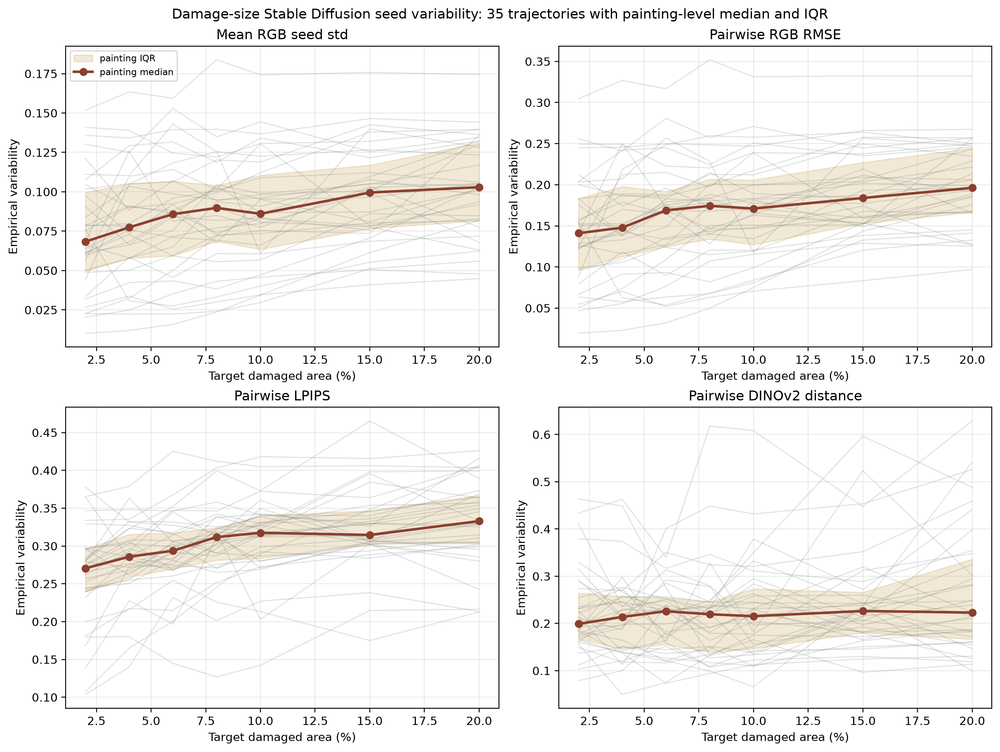


low_damage_portrait — p001 — 2% target damage


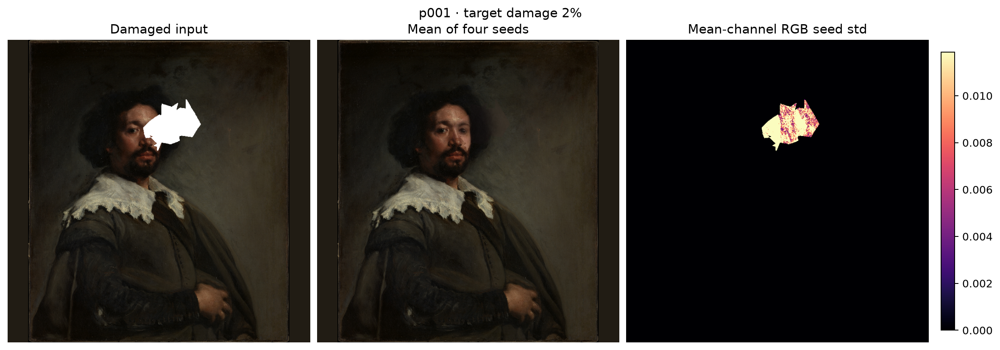


middle_damage_architecture — p026 — 10% target damage


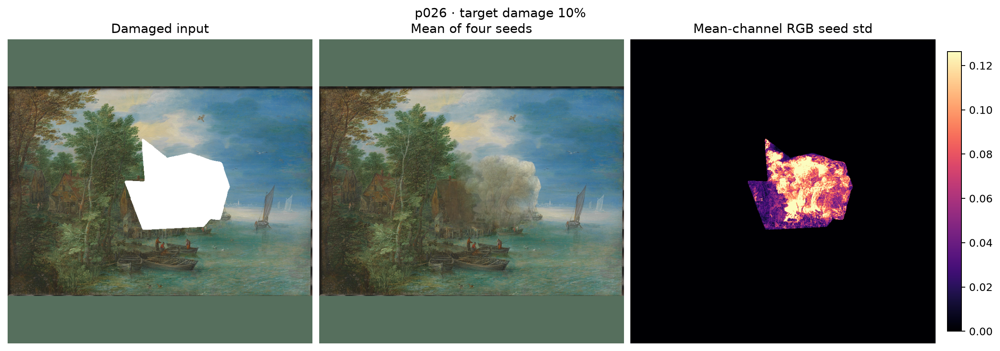


high_damage_texture — p043 — 20% target damage


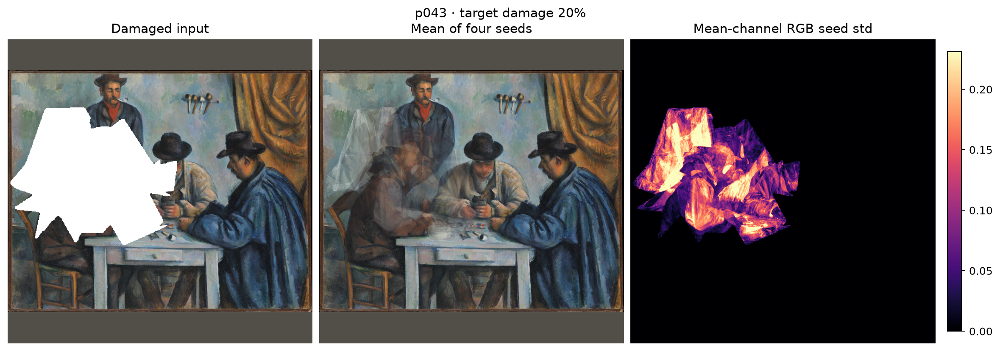

Displayed representative overlays: 3
All canonical overlays retained: 245


In [42]:
# ---------------------------------------------------------------------------
# Select low, middle, and high damage examples for notebook QA
# ---------------------------------------------------------------------------

representative_overlay_contract = [
    {
        "painting_id": "p001",
        "target_damage_fraction": 0.02,
        "review_role": (
            "low_damage_portrait"
        ),
    },
    {
        "painting_id": "p026",
        "target_damage_fraction": 0.10,
        "review_role": (
            "middle_damage_architecture"
        ),
    },
    {
        "painting_id": "p043",
        "target_damage_fraction": 0.20,
        "review_role": (
            "high_damage_texture"
        ),
    },
]

representative_overlay_frames = []

for selection in (
    representative_overlay_contract
):
    selected = (
        map_image_manifest_df.loc[
            map_image_manifest_df[
                "painting_id"
            ].astype(str).eq(
                selection["painting_id"]
            )
            & np.isclose(
                pd.to_numeric(
                    map_image_manifest_df[
                        "target_damage_fraction"
                    ],
                    errors="raise",
                ),
                float(
                    selection[
                        "target_damage_fraction"
                    ]
                ),
                rtol=0.0,
                atol=1e-12,
            )
        ]
        .copy()
    )

    if len(selected) != 1:
        raise ValueError(
            "Representative overlay selection "
            f"returned {len(selected)} rows: "
            f"{selection}"
        )

    selected["review_role"] = (
        selection["review_role"]
    )

    representative_overlay_frames.append(
        selected
    )

representative_overlay_df = (
    pd.concat(
        representative_overlay_frames,
        ignore_index=True,
    )
)

display(
    representative_overlay_df[
        [
            "review_role",
            "painting_id",
            "case_id",
            "target_damage_fraction",
            "realized_damage_fraction",
            "uncertainty_group_id",
            "relative_path",
            "width",
            "height",
            "size_bytes",
            "status",
        ]
    ]
)

print("Canonical four-panel trajectory summary")
display(
    NotebookImage(
        filename=str(
            OUTPUTS["summary_figure"]
        )
    )
)

for row in (
    representative_overlay_df.itertuples(
        index=False
    )
):
    print()
    print(
        row.review_role,
        "—",
        row.painting_id,
        f"— {100 * float(row.target_damage_fraction):.0f}% target damage",
    )

    display(
        NotebookImage(
            filename=str(
                NOTEBOOK_OUTPUT_ROOT
                / str(row.relative_path)
            )
        )
    )

print(
    "Displayed representative overlays:",
    len(representative_overlay_df),
)
print(
    "All canonical overlays retained:",
    len(map_image_manifest_df),
)

In [43]:
# ---------------------------------------------------------------------------
# Idempotent Batch 9 validation assembly
# ---------------------------------------------------------------------------

preserved_validation_checks = tuple(
    check
    for check in VALIDATION.checks
    if check.validation_stage
    != "batch_9_visualization"
)

VALIDATION = ValidationCollector()
VALIDATION.extend(
    preserved_validation_checks
)


def add_batch_9_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage=(
            "batch_9_visualization"
        ),
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


expected_map_count = int(
    EXPECTED_COUNTS[
        "raw_uncertainty_maps"
    ]
)

expected_overlay_count = int(
    EXPECTED_COUNTS[
        "uncertainty_overlay_images"
    ]
)

expected_group_count = int(
    EXPECTED_COUNTS[
        "uncertainty_groups"
    ]
)

expected_painting_count = int(
    EXPECTED_COUNTS[
        "paintings"
    ]
)


add_batch_9_check(
    "persisted_map_key_contract",
    (
        "The canonical NPZ contains exactly one "
        "numerical map per uncertainty group."
    ),
    expected_map_count,
    len(persisted_uncertainty_maps),
    (
        len(
            persisted_uncertainty_maps
        ) == expected_map_count
        and set(
            persisted_uncertainty_maps
        )
        == expected_uncertainty_group_ids
    ),
)

persisted_map_contract_passed = all(
    (
        np.asarray(array).shape
        == (768, 768)
        and np.asarray(array).dtype
        == np.float32
        and np.isfinite(
            np.asarray(array)
        ).all()
        and (
            np.asarray(array) >= 0.0
        ).all()
    )
    for array in (
        persisted_uncertainty_maps.values()
    )
)

add_batch_9_check(
    "persisted_map_array_contract",
    (
        "Every numerical map is finite, "
        "nonnegative, float32, and 768×768."
    ),
    True,
    bool(
        persisted_map_contract_passed
    ),
    bool(
        persisted_map_contract_passed
    ),
)

add_batch_9_check(
    "map_manifest_schema",
    (
        "The in-memory overlay manifest has "
        "the exact approved column contract."
    ),
    list(MAP_IMAGE_COLUMNS),
    list(
        map_image_manifest_df.columns
    ),
    (
        list(
            map_image_manifest_df.columns
        )
        == list(MAP_IMAGE_COLUMNS)
    ),
)

add_batch_9_check(
    "overlay_row_count",
    (
        "Exactly one readable overlay was "
        "rendered for every uncertainty group."
    ),
    expected_overlay_count,
    len(map_image_manifest_df),
    (
        len(
            map_image_manifest_df
        ) == expected_overlay_count
        and map_image_manifest_df[
            "uncertainty_group_id"
        ].nunique() == expected_group_count
    ),
)

add_batch_9_check(
    "unique_overlay_identifiers",
    (
        "Overlay identifiers, group identifiers, "
        "paths, and checksums are unique."
    ),
    0,
    {
        "duplicate_map_image_ids": int(
            map_image_manifest_df[
                "map_image_id"
            ].duplicated().sum()
        ),
        "duplicate_group_ids": int(
            map_image_manifest_df[
                "uncertainty_group_id"
            ].duplicated().sum()
        ),
        "duplicate_paths": int(
            map_image_manifest_df[
                "relative_path"
            ].duplicated().sum()
        ),
        "duplicate_checksums": int(
            map_image_manifest_df[
                "sha256"
            ].duplicated().sum()
        ),
    },
    (
        map_image_manifest_df[
            "map_image_id"
        ].is_unique
        and map_image_manifest_df[
            "uncertainty_group_id"
        ].is_unique
        and map_image_manifest_df[
            "relative_path"
        ].is_unique
        and map_image_manifest_df[
            "sha256"
        ].is_unique
    ),
)

add_batch_9_check(
    "overlay_file_audit",
    (
        "Every overlay reloads with matching "
        "geometry, size, and SHA-256."
    ),
    expected_overlay_count,
    int(
        overlay_file_audit_df[
            "passed"
        ].sum()
    ),
    (
        len(
            overlay_file_audit_df
        ) == expected_overlay_count
        and overlay_file_audit_df[
            "passed"
        ].all()
    ),
    details=(
        overlay_file_audit_df.loc[
            ~overlay_file_audit_df[
                "passed"
            ]
        ].to_dict("records")
    ),
)

overlay_status_counts = {
    str(key): int(value)
    for key, value in (
        map_image_manifest_df[
            "status"
        ]
        .value_counts()
        .sort_index()
        .items()
    )
}

expected_overlay_status_counts = {
    "passed": expected_overlay_count,
}

add_batch_9_check(
    "overlay_statuses",
    (
        "All overlay manifest rows have passed "
        "renderer status."
    ),
    expected_overlay_status_counts,
    overlay_status_counts,
    (
        overlay_status_counts
        == expected_overlay_status_counts
    ),
)

add_batch_9_check(
    "overlay_metric_identity",
    (
        "Every overlay visualizes the declared "
        "mean-channel RGB seed-standard-deviation "
        "map."
    ),
    [
        "mean_channel_rgb_seed_standard_deviation",
    ],
    sorted(
        map_image_manifest_df[
            "map_metric_name"
        ].astype(str).unique().tolist()
    ),
    map_image_manifest_df[
        "map_metric_name"
    ].astype(str).eq(
        "mean_channel_rgb_seed_standard_deviation"
    ).all(),
)

overlay_paths_owned = all(
    (
        NOTEBOOK_OUTPUT_ROOT
        / str(relative_path)
    ).resolve().is_relative_to(
        NOTEBOOK_OUTPUT_ROOT.resolve()
    )
    for relative_path in (
        map_image_manifest_df[
            "relative_path"
        ].astype(str)
    )
)

add_batch_9_check(
    "overlay_path_ownership",
    (
        "Every rendered overlay remains under "
        "the Notebook 22 output root."
    ),
    True,
    bool(overlay_paths_owned),
    bool(overlay_paths_owned),
)

canonical_overlay_files = sorted(
    UNCERTAINTY_IMAGE_ROOT.glob(
        "*.png"
    )
)

expected_overlay_paths = {
    (
        NOTEBOOK_OUTPUT_ROOT
        / str(relative_path)
    ).resolve()
    for relative_path in (
        map_image_manifest_df[
            "relative_path"
        ].astype(str)
    )
}

observed_overlay_paths = {
    path.resolve()
    for path in (
        canonical_overlay_files
    )
}

add_batch_9_check(
    "canonical_overlay_directory",
    (
        "The canonical overlay directory contains "
        "exactly the manifested PNG files."
    ),
    expected_overlay_count,
    len(canonical_overlay_files),
    (
        len(
            canonical_overlay_files
        ) == expected_overlay_count
        and observed_overlay_paths
        == expected_overlay_paths
    ),
)

summary_figure_valid = bool(
    OUTPUTS["summary_figure"].is_file()
    and summary_figure_audit[
        "format"
    ] == "PNG"
    and summary_figure_audit[
        "width"
    ] > 0
    and summary_figure_audit[
        "height"
    ] > 0
    and summary_figure_audit[
        "size_bytes"
    ] > 0
    and len(
        summary_figure_audit[
            "sha256"
        ]
    ) == 64
)

add_batch_9_check(
    "summary_figure_contract",
    (
        "The canonical summary is a nonempty, "
        "readable PNG with a SHA-256 digest."
    ),
    True,
    summary_figure_audit,
    summary_figure_valid,
)

summary_panel_contract = [
    (
        "pixel_rgb_std_mean",
        "masked_region",
    ),
    (
        "pairwise_rgb_rmse",
        "masked_region",
    ),
    (
        "pairwise_lpips_distance",
        "mask_bbox_crop",
    ),
    (
        "pairwise_dinov2_cosine_distance",
        "mask_bbox_crop",
    ),
]

summary_panel_coverage = {}

for metric_name, region_id in (
    summary_panel_contract
):
    selected = (
        damage_size_uncertainty_metrics_df.loc[
            damage_size_uncertainty_metrics_df[
                "metric_name"
            ].astype(str).eq(
                metric_name
            )
            & damage_size_uncertainty_metrics_df[
                "region_id"
            ].astype(str).eq(
                region_id
            )
        ]
    )

    panel_key = (
        f"{metric_name}|{region_id}"
    )

    summary_panel_coverage[
        panel_key
    ] = {
        "rows": int(len(selected)),
        "groups": int(
            selected[
                "uncertainty_group_id"
            ].nunique()
        ),
        "paintings": int(
            selected[
                "painting_id"
            ].nunique()
        ),
    }

summary_panels_valid = all(
    values["groups"] == expected_group_count
    and values["paintings"]
    == expected_painting_count
    and values["rows"] > 0
    for values in (
        summary_panel_coverage.values()
    )
)

add_batch_9_check(
    "summary_panel_evidence",
    (
        "Every summary panel covers all groups "
        "and painting trajectories."
    ),
    {
        "groups_per_panel": (
            expected_group_count
        ),
        "paintings_per_panel": (
            expected_painting_count
        ),
    },
    summary_panel_coverage,
    summary_panels_valid,
)

add_batch_9_check(
    "representative_overlay_review",
    (
        "Low-, middle-, and high-damage overlays "
        "were rendered in the notebook for review."
    ),
    3,
    len(representative_overlay_df),
    (
        len(
            representative_overlay_df
        ) == 3
        and representative_overlay_df[
            "uncertainty_group_id"
        ].is_unique
    ),
)

add_batch_9_check(
    "painting_not_category_trajectories",
    (
        "The canonical summary retains painting "
        "trajectories and does not present "
        "category-effect estimates."
    ),
    {
        "painting_trajectories": (
            expected_painting_count
        ),
        "category_effect_rows": 0,
    },
    {
        "painting_trajectories": int(
            uncertainty_population_df[
                "painting_id"
            ].nunique()
        ),
        "category_effect_rows": 0,
    },
    (
        uncertainty_population_df[
            "painting_id"
        ].nunique()
        == expected_painting_count
    ),
)

add_batch_9_check(
    "map_manifest_persistence_deferred",
    (
        "The in-memory map manifest has not yet "
        "been written before final persistence "
        "validation."
    ),
    False,
    OUTPUTS["map_manifest"].exists(),
    not OUTPUTS["map_manifest"].exists(),
)

premature_batch_9_outputs = [
    OUTPUTS[key]
    for key in (
        "candidates",
        "damage_size_uncertainty",
        "run_manifest",
        "artifacts",
        "validation",
    )
    if OUTPUTS[key].exists()
]

add_batch_9_check(
    "remaining_outputs_deferred",
    (
        "Canonical tables and final manifests "
        "remain deferred to the persistence batch."
    ),
    0,
    len(premature_batch_9_outputs),
    not premature_batch_9_outputs,
    details=[
        to_repo_relative(
            path,
            PROJECT_ROOT,
        )
        for path in (
            premature_batch_9_outputs
        )
    ],
)

batch_9_validation_df = (
    VALIDATION.to_dataframe()
    .loc[
        lambda frame: frame[
            "validation_stage"
        ].eq(
            "batch_9_visualization"
        )
    ]
    .reset_index(drop=True)
)

display(overlay_file_audit_df.head(12))
display(batch_9_validation_df)

VALIDATION.raise_for_blocking()

print("Notebook 22 Batch 9 summary")
print("---------------------------")
print(
    "Batch 9 checks:",
    len(batch_9_validation_df),
)
print(
    "Cumulative checks:",
    len(VALIDATION.checks),
)
print(
    "Blocking failures:",
    len(
        VALIDATION.blocking_failures
    ),
)
print(
    "Numerical maps:",
    len(persisted_uncertainty_maps),
)
print(
    "Canonical overlay images:",
    len(canonical_overlay_files),
)
print(
    "Representative overlays displayed:",
    len(representative_overlay_df),
)
print(
    "Summary figure:",
    to_repo_relative(
        OUTPUTS["summary_figure"],
        PROJECT_ROOT,
    ),
)
print("Batch 9 completion gate passed.")

,map_image_id,uncertainty_group_id,relative_path,file_exists,format,mode,width,height,size_bytes,sha256_matches,size_matches,geometry_matches,passed
0,dsm_e69b0ec922d51db08406,ug_055304d3f45086910a,images/uncertainty/ug_055304d3f45086910a.png,True,PNG,RGBA,2359,830,1924228,True,True,True,True
1,dsm_747a48814e60341b86bd,ug_06e8376a14f5652e5f,images/uncertainty/ug_06e8376a14f5652e5f.png,True,PNG,RGBA,2359,826,1793898,True,True,True,True
2,dsm_bfeacf96c27ec2524d36,ug_085ecb7986418be78b,images/uncertainty/ug_085ecb7986418be78b.png,True,PNG,RGBA,2359,830,976002,True,True,True,True
3,dsm_59538080c40e7318c468,ug_08dfe45990b2b8348b,images/uncertainty/ug_08dfe45990b2b8348b.png,True,PNG,RGBA,2359,830,1419413,True,True,True,True
4,dsm_8a66d501a8ce0c8f464a,ug_0abd9e7d04f138c018,images/uncertainty/ug_0abd9e7d04f138c018.png,True,PNG,RGBA,2359,826,1187572,True,True,True,True
5,dsm_95504a2ce41f03b269fe,ug_0e46e31ebd9a258066,images/uncertainty/ug_0e46e31ebd9a258066.png,True,PNG,RGBA,2359,830,1871145,True,True,True,True
6,dsm_332ec494405bcbf83d1b,ug_0f7c65780cc919f64b,images/uncertainty/ug_0f7c65780cc919f64b.png,True,PNG,RGBA,2359,830,1810894,True,True,True,True
7,dsm_6d401fde59b35bf2006d,ug_0f960683f2040b67be,images/uncertainty/ug_0f960683f2040b67be.png,True,PNG,RGBA,2359,830,1655939,True,True,True,True
8,dsm_4721af15636222a1b81f,ug_10bdde88ba96671f52,images/uncertainty/ug_10bdde88ba96671f52.png,True,PNG,RGBA,2359,830,848296,True,True,True,True
9,dsm_e19b654238ac3f746d90,ug_10ca3cad0394acc874,images/uncertainty/ug_10ca3cad0394acc874.png,True,PNG,RGBA,2359,830,1221319,True,True,True,True


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_9_visualization,persisted_map_key_contract,The canonical NPZ contains exactly one numeric...,blocking,245,245,True,
1,batch_9_visualization,persisted_map_array_contract,"Every numerical map is finite, nonnegative, fl...",blocking,True,True,True,
2,batch_9_visualization,map_manifest_schema,The in-memory overlay manifest has the exact a...,blocking,"[""map_image_id"", ""uncertainty_group_id"", ""case...","[""map_image_id"", ""uncertainty_group_id"", ""case...",True,
3,batch_9_visualization,overlay_row_count,Exactly one readable overlay was rendered for ...,blocking,245,245,True,
4,batch_9_visualization,unique_overlay_identifiers,"Overlay identifiers, group identifiers, paths,...",blocking,0,"{""duplicate_checksums"": 0, ""duplicate_group_id...",True,
5,batch_9_visualization,overlay_file_audit,"Every overlay reloads with matching geometry, ...",blocking,245,245,True,[]
6,batch_9_visualization,overlay_statuses,All overlay manifest rows have passed renderer...,blocking,"{""passed"": 245}","{""passed"": 245}",True,
7,batch_9_visualization,overlay_metric_identity,Every overlay visualizes the declared mean-cha...,blocking,"[""mean_channel_rgb_seed_standard_deviation""]","[""mean_channel_rgb_seed_standard_deviation""]",True,
8,batch_9_visualization,overlay_path_ownership,Every rendered overlay remains under the Noteb...,blocking,True,True,True,
9,batch_9_visualization,canonical_overlay_directory,The canonical overlay directory contains exact...,blocking,245,245,True,


Notebook 22 Batch 9 summary
---------------------------
Batch 9 checks: 16
Cumulative checks: 216
Blocking failures: 0
Numerical maps: 245
Canonical overlay images: 245
Representative overlays displayed: 3
Summary figure: outputs/22_damage_size_diffusion_uncertainty_extension/figures/uncertainty_extension_summary.png
Batch 9 completion gate passed.


## Batch 10 — Canonical persistence, manifests, and final completion

This final batch persists and independently reloads the complete Notebook 22 evidence package.

It writes:

- the 735 Notebook 22-owned extension candidates;
- the complete 33,320-row uncertainty and frozen-reference metric table;
- the 245-row uncertainty-overlay manifest;
- consolidated validation evidence;
- the normalized artifact manifest;
- the universal run manifest;
- the global project-path registry handoff.

The batch verifies all canonical tables, 245 numerical maps, 735 restoration images, 245 uncertainty overlays, the summary figure, roadmap responsibilities, frozen-anchor checksums, file ownership, and artifact checksums.

Temporary checkpoints are removed only after the canonical candidate, metric, map, image, and figure artifacts have passed validation.

In [44]:
import gc
import shutil
import time

from restoration_eval.damage_size_diffusion_uncertainty import (
    atomic_write_csv,
)

from restoration_eval.manifests import (
    MANIFESTS_MODULE_VERSION,
    artifact_records_dataframe,
    build_artifact_record,
    build_run_manifest,
    sha256_path,
    write_artifact_manifest,
    write_run_manifest,
)

from restoration_eval.paths import (
    upsert_project_path_artifacts,
    validate_project_paths_registry,
    write_project_paths_registry,
)

from restoration_eval.schemas import (
    ARTIFACT_MANIFEST_SCHEMA,
    SCHEMAS_MODULE_VERSION,
    STABLE_DIFFUSION_CANDIDATE_COLUMNS,
    VALIDATION_CHECKS_SCHEMA,
    validate_dataframe,
)


# ---------------------------------------------------------------------------
# Windows-safe retry wrapper for final metadata files
# ---------------------------------------------------------------------------

def call_with_permission_retry(
    function,
    *args,
    attempts=10,
    retry_delay_seconds=0.25,
    **kwargs,
):
    last_error = None

    for attempt in range(
        1,
        int(attempts) + 1,
    ):
        try:
            result = function(
                *args,
                **kwargs,
            )

            return {
                "result": result,
                "attempts": attempt,
            }

        except PermissionError as error:
            last_error = error
            gc.collect()

            if attempt < attempts:
                time.sleep(
                    float(
                        retry_delay_seconds
                    )
                    * attempt
                )

    raise PermissionError(
        "Operation remained locked after "
        f"{attempts} attempts: {last_error}"
    )


# ---------------------------------------------------------------------------
# Normalize canonical tables
# ---------------------------------------------------------------------------

canonical_candidates_df = (
    extension_execution_df.loc[
        :,
        STABLE_DIFFUSION_CANDIDATE_COLUMNS,
    ]
    .sort_values(
        [
            "painting_id",
            "case_id",
            "seed",
            "candidate_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

canonical_metrics_df = (
    damage_size_uncertainty_metrics_df.loc[
        :,
        DIFFUSION_UNCERTAINTY_COLUMNS,
    ]
    .sort_values(
        [
            "painting_id",
            "target_damage_fraction",
            "uncertainty_group_id",
            "observation_level",
            "metric_family",
            "metric_name",
            "region_id",
            "seed",
            "seed_a",
            "seed_b",
        ],
        kind="stable",
        na_position="last",
    )
    .reset_index(drop=True)
)

canonical_map_manifest_df = (
    map_image_manifest_df.loc[
        :,
        MAP_IMAGE_COLUMNS,
    ]
    .sort_values(
        [
            "painting_id",
            "target_damage_fraction",
            "uncertainty_group_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)


# ---------------------------------------------------------------------------
# Persist the three canonical tables atomically
# ---------------------------------------------------------------------------

atomic_write_csv(
    canonical_candidates_df,
    OUTPUTS["candidates"],
    config=extension_config,
)

atomic_write_csv(
    canonical_metrics_df,
    OUTPUTS[
        "damage_size_uncertainty"
    ],
    config=extension_config,
)

atomic_write_csv(
    canonical_map_manifest_df,
    OUTPUTS["map_manifest"],
    config=extension_config,
)


# ---------------------------------------------------------------------------
# Independent reload
# ---------------------------------------------------------------------------

reloaded_candidates_df = pd.read_csv(
    OUTPUTS["candidates"],
    low_memory=False,
)

reloaded_metrics_df = pd.read_csv(
    OUTPUTS[
        "damage_size_uncertainty"
    ],
    low_memory=False,
)

reloaded_map_manifest_df = pd.read_csv(
    OUTPUTS["map_manifest"],
    keep_default_na=False,
)

reloaded_candidate_validation = (
    validate_extension_candidate_plan(
        reloaded_candidates_df,
        config=extension_config,
        require_completed=True,
    )
)

reloaded_metric_validation = (
    validate_extension_metrics(
        reloaded_metrics_df,
        uncertainty_population_df,
        config=extension_config,
    )
)

with np.load(
    OUTPUTS["uncertainty_maps"],
    allow_pickle=False,
) as bundle:
    final_reloaded_maps = {
        str(key): np.asarray(
            bundle[key],
            dtype=np.float32,
        )
        for key in bundle.files
    }

print("Canonical scientific outputs persisted and reloaded.")
print(
    "Candidate rows:",
    len(reloaded_candidates_df),
)
print(
    "Metric rows:",
    len(reloaded_metrics_df),
)
print(
    "Map-manifest rows:",
    len(reloaded_map_manifest_df),
)
print(
    "Numerical maps:",
    len(final_reloaded_maps),
)
print(
    "Candidate contract passed:",
    reloaded_candidate_validation[
        "passed"
    ],
)
print(
    "Metric contract passed:",
    reloaded_metric_validation[
        "passed"
    ],
)

Canonical scientific outputs persisted and reloaded.
Candidate rows: 735
Metric rows: 33320
Map-manifest rows: 245
Numerical maps: 245
Candidate contract passed: True
Metric contract passed: True


In [45]:
# ---------------------------------------------------------------------------
# Explicit Notebook 22 roadmap traceability
# ---------------------------------------------------------------------------

final_expected_case_count = int(
    EXPECTED_COUNTS["cases"]
)

final_expected_painting_count = int(
    EXPECTED_COUNTS["paintings"]
)

final_expected_anchor_count = int(
    EXPECTED_COUNTS[
        "frozen_anchor_candidates"
    ]
)

final_expected_new_candidates = int(
    EXPECTED_COUNTS["new_candidates"]
)

final_expected_total_candidates = int(
    EXPECTED_COUNTS["total_candidates"]
)

final_expected_group_count = int(
    EXPECTED_COUNTS[
        "uncertainty_groups"
    ]
)

final_expected_pair_count = int(
    EXPECTED_COUNTS[
        "unordered_candidate_pairs"
    ]
)

final_expected_metric_rows = int(
    EXPECTED_COUNTS[
        "total_metric_rows"
    ]
)

final_expected_reference_rows = int(
    EXPECTED_COUNTS[
        "anchor_reference_rows"
    ]
)

final_expected_map_count = int(
    EXPECTED_COUNTS[
        "raw_uncertainty_maps"
    ]
)

final_expected_overlay_count = int(
    EXPECTED_COUNTS[
        "uncertainty_overlay_images"
    ]
)

final_expected_levels = int(
    EXPECTED_COUNTS[
        "damage_levels_per_painting"
    ]
)

final_expected_artifact_records = 8

final_expected_premetadata_files = (
    final_expected_new_candidates
    + final_expected_overlay_count
    + 5
)

final_expected_canonical_files = (
    final_expected_new_candidates
    + final_expected_overlay_count
    + 8
)


roadmap_traceability_records = [
    {
        "requirement_id": "N22-R01",
        "roadmap_requirement": (
            "Keep Notebooks 01–21 frozen and "
            "reference all Notebook 11 seed-2026 "
            "damage-size anchors."
        ),
        "implementation_evidence": (
            f"{final_expected_anchor_count} "
            "checksum-verified frozen references "
            "remain owned by Notebook 11."
        ),
        "passed": (
            len(
                frozen_anchors_df
            ) == final_expected_anchor_count
            and frozen_anchors_df[
                "seed"
            ].astype(int).eq(2026).all()
            and not bool(
                FROZEN_BOUNDARY[
                    "may_write_frozen_outputs"
                ]
            )
        ),
    },
    {
        "requirement_id": "N22-R02",
        "roadmap_requirement": (
            "Generate only seeds 2027–2029 for "
            "all governed damage-size cases."
        ),
        "implementation_evidence": (
            f"The canonical candidate table contains "
            f"{final_expected_new_candidates} "
            "Notebook 22-owned completed candidates."
        ),
        "passed": (
            len(
                reloaded_candidates_df
            ) == final_expected_new_candidates
            and set(
                reloaded_candidates_df[
                    "seed"
                ].astype(int)
            )
            == {
                2027,
                2028,
                2029,
            }
        ),
    },
    {
        "requirement_id": "N22-R03",
        "roadmap_requirement": (
            "Construct every uncertainty group "
            "with seeds 2026, 2027, 2028, and 2029."
        ),
        "implementation_evidence": (
            "The combined population contains "
            f"{final_expected_total_candidates} "
            "candidates, "
            f"{final_expected_group_count} groups, "
            f"and {final_expected_pair_count} "
            "unordered seed pairs."
        ),
        "passed": (
            len(
                uncertainty_population_df
            ) == final_expected_total_candidates
            and uncertainty_population_df[
                "uncertainty_group_id"
            ].nunique()
            == final_expected_group_count
            and len(
                uncertainty_pair_plan_df
            ) == final_expected_pair_count
        ),
    },
    {
        "requirement_id": "N22-R04",
        "roadmap_requirement": (
            "Retain the frozen Stable Diffusion "
            "model, prompt, scheduler, resolution, "
            "and compositing contract."
        ),
        "implementation_evidence": (
            "All inherited generation fields "
            "matched their seed-2026 anchor values "
            "before execution."
        ),
        "passed": (
            extension_contract_comparison_df[
                "all_inherited_fields_match"
            ].astype(bool).all()
        ),
    },
    {
        "requirement_id": "N22-R05",
        "roadmap_requirement": (
            "Support checksum-aware resume, bounded "
            "retries, progress output, and "
            "Windows-safe checkpoints."
        ),
        "implementation_evidence": (
            f"All {final_expected_new_candidates} "
            "candidates completed under the "
            "resumable execution contract with no "
            "failed output audit."
        ),
        "passed": (
            len(
                extension_execution_df
            ) == final_expected_new_candidates
            and extension_execution_df[
                "status"
            ].astype(str).eq(
                "completed"
            ).all()
            and extension_output_audit_df[
                "passed"
            ].astype(bool).all()
        ),
    },
    {
        "requirement_id": "N22-R06",
        "roadmap_requirement": (
            "Validate image dimensions, "
            "readability, checksums, compositing, "
            "and outside-mask invariance."
        ),
        "implementation_evidence": (
            "Every extension image passed the "
            "independent 768×768 RGB PNG and "
            "pixel-invariance audit."
        ),
        "passed": (
            len(
                extension_output_audit_df
            ) == final_expected_new_candidates
            and extension_output_audit_df[
                "passed"
            ].astype(bool).all()
            and extension_output_audit_df[
                "outside_mask_changed_pixels"
            ].astype(int).eq(0).all()
        ),
    },
    {
        "requirement_id": "N22-R07",
        "roadmap_requirement": (
            "Compute transparent RGB, LPIPS, CLIP, "
            "and DINOv2 uncertainty without a "
            "combined score."
        ),
        "implementation_evidence": (
            "The canonical metric table contains "
            "all four declared uncertainty families "
            "as separate rows."
        ),
        "passed": (
            reloaded_metric_validation[
                "passed"
            ]
            and len(
                reloaded_metrics_df
            ) == final_expected_metric_rows
            and not reloaded_metrics_df[
                "is_combined_index"
            ].astype(bool).any()
        ),
    },
    {
        "requirement_id": "N22-R08",
        "roadmap_requirement": (
            "Apply the six pixel regions and two "
            "approved contiguous learned-metric "
            "regions."
        ),
        "implementation_evidence": (
            "Image-space evidence covers six "
            "regions; LPIPS, CLIP, and DINOv2 "
            "cover content and mask crop."
        ),
        "passed": (
            set(
                image_space_metrics_df[
                    "region_id"
                ].astype(str)
            )
            == set(
                REGION_POLICY[
                    "pixel_regions"
                ]
            )
            and set(
                lpips_uncertainty_metrics_df[
                    "region_id"
                ].astype(str)
            )
            == set(
                REGION_POLICY[
                    "learned_metric_regions"
                ]
            )
            and set(
                feature_uncertainty_metrics_df[
                    "region_id"
                ].astype(str)
            )
            == set(
                REGION_POLICY[
                    "learned_metric_regions"
                ]
            )
        ),
    },
    {
        "requirement_id": "N22-R09",
        "roadmap_requirement": (
            "Retain numerical uncertainty maps "
            "and readable overlays."
        ),
        "implementation_evidence": (
            f"The output contains "
            f"{final_expected_map_count} float32 "
            f"maps and "
            f"{final_expected_overlay_count} "
            "checksum-verified PNG overlays."
        ),
        "passed": (
            len(
                final_reloaded_maps
            ) == final_expected_map_count
            and len(
                reloaded_map_manifest_df
            ) == final_expected_overlay_count
            and overlay_file_audit_df[
                "passed"
            ].astype(bool).all()
        ),
    },
    {
        "requirement_id": "N22-R10",
        "roadmap_requirement": (
            "Join validated primary-candidate "
            "reference, perceptual, feature, "
            "texture, colour, seam, spatial, and "
            "semantic evidence."
        ),
        "implementation_evidence": (
            "Sixteen frozen-reference "
            f"specifications produce "
            f"{final_expected_reference_rows} "
            "finite seed-2026 evidence rows."
        ),
        "passed": (
            len(
                anchor_reference_metrics_df
            ) == final_expected_reference_rows
            and anchor_reference_values.notna().all()
            and np.isfinite(
                anchor_reference_values
            ).all()
        ),
    },
    {
        "requirement_id": "N22-R11",
        "roadmap_requirement": (
            "Treat damage levels as nested "
            "observations within painting "
            "trajectories."
        ),
        "implementation_evidence": (
            "The canonical summary retains "
            f"{final_expected_painting_count} "
            "painting trajectories, their pooled "
            "median and IQR, and no category-effect "
            "estimate."
        ),
        "passed": (
            uncertainty_population_df[
                "painting_id"
            ].nunique()
            == final_expected_painting_count
            and uncertainty_population_df
            .groupby(
                "painting_id"
            )[
                "target_damage_fraction"
            ]
            .nunique()
            .eq(
                final_expected_levels
            )
            .all()
            and not bool(
                EVIDENCE_POLICY[
                    "category_effect_permitted"
                ]
            )
            and not bool(
                EVIDENCE_POLICY[
                    "style_effect_permitted"
                ]
            )
        ),
    },
    {
        "requirement_id": "N22-R12",
        "roadmap_requirement": (
            "State that seed variability is not "
            "calibrated confidence or restoration "
            "correctness."
        ),
        "implementation_evidence": (
            "The notebook header and configuration "
            "retain the approved interpretation "
            "and limitation statements."
        ),
        "passed": (
            EVIDENCE_POLICY[
                "interpretation"
            ]
            == (
                "empirical_seed_variability_proxy_"
                "not_calibrated_confidence"
            )
            and not bool(
                EVIDENCE_POLICY[
                    "low_uncertainty_proves_correctness"
                ]
            )
        ),
    },
]

requirement_traceability_df = pd.DataFrame(
    roadmap_traceability_records
)

traceability_failures_df = (
    requirement_traceability_df.loc[
        ~requirement_traceability_df[
            "passed"
        ].astype(bool)
    ]
    .copy()
)

display(requirement_traceability_df)

print("Notebook 22 roadmap traceability assembled.")
print(
    "Roadmap responsibilities:",
    len(requirement_traceability_df),
)
print(
    "Traceability failures:",
    len(traceability_failures_df),
)

,requirement_id,roadmap_requirement,implementation_evidence,passed
0,N22-R01,Keep Notebooks 01–21 frozen and reference all ...,245 checksum-verified frozen references remain...,True
1,N22-R02,Generate only seeds 2027–2029 for all governed...,The canonical candidate table contains 735 Not...,True
2,N22-R03,Construct every uncertainty group with seeds 2...,The combined population contains 980 candidate...,True
3,N22-R04,"Retain the frozen Stable Diffusion model, prom...",All inherited generation fields matched their ...,True
4,N22-R05,"Support checksum-aware resume, bounded retries...",All 735 candidates completed under the resumab...,True
5,N22-R06,"Validate image dimensions, readability, checks...",Every extension image passed the independent 7...,True
6,N22-R07,"Compute transparent RGB, LPIPS, CLIP, and DINO...",The canonical metric table contains all four d...,True
7,N22-R08,Apply the six pixel regions and two approved c...,Image-space evidence covers six regions; LPIPS...,True
8,N22-R09,Retain numerical uncertainty maps and readable...,The output contains 245 float32 maps and 245 c...,True
9,N22-R10,"Join validated primary-candidate reference, pe...",Sixteen frozen-reference specifications produc...,True


Notebook 22 roadmap traceability assembled.
Roadmap responsibilities: 12
Traceability failures: 0


In [46]:
# ---------------------------------------------------------------------------
# Release objects that may retain work-file handles
# ---------------------------------------------------------------------------

feature_model_bundles = None
extension_embedding_results = None
extension_embedding_arrays = None
combined_embedding_arrays = None
frozen_embedding_arrays = None
result = None
bundle = None
encode_batch = None

gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()


# ---------------------------------------------------------------------------
# Remove only the explicitly resolved Notebook 22 work directory
# ---------------------------------------------------------------------------

WORK_ROOT = (
    NOTEBOOK_OUTPUT_ROOT / "work"
).resolve()

if (
    not WORK_ROOT.is_relative_to(
        NOTEBOOK_OUTPUT_ROOT.resolve()
    )
    or WORK_ROOT.name != "work"
):
    raise RuntimeError(
        "Refusing unsafe work-directory cleanup."
    )

work_cleanup_attempts = 0
work_cleanup_error = ""

if WORK_ROOT.exists():
    for attempt in range(1, 9):
        work_cleanup_attempts = attempt

        try:
            shutil.rmtree(WORK_ROOT)
            work_cleanup_error = ""
            break

        except PermissionError as error:
            work_cleanup_error = (
                f"{type(error).__name__}: {error}"
            )
            gc.collect()

            if torch.cuda.is_available():
                torch.cuda.empty_cache()

            if attempt < 8:
                time.sleep(
                    0.25 * attempt
                )

if WORK_ROOT.exists():
    raise PermissionError(
        "Notebook 22 work-directory cleanup "
        f"failed: {work_cleanup_error}"
    )


# ---------------------------------------------------------------------------
# Independent final file collections
# ---------------------------------------------------------------------------

final_restoration_files = sorted(
    RESTORED_IMAGE_ROOT.rglob("*.png")
)

final_overlay_files = sorted(
    UNCERTAINTY_IMAGE_ROOT.glob("*.png")
)

frozen_anchor_final_df = (
    select_frozen_damage_size_anchors(
        damage_size_cases_df,
        stable_diffusion_candidates_df,
        config=extension_config,
        project_root=PROJECT_ROOT,
        verify_files=True,
    )
)

expected_premetadata_files = {
    path.resolve()
    for path in (
        final_restoration_files
        + final_overlay_files
        + [
            OUTPUTS["candidates"],
            OUTPUTS["uncertainty_maps"],
            OUTPUTS[
                "damage_size_uncertainty"
            ],
            OUTPUTS["summary_figure"],
            OUTPUTS["map_manifest"],
        ]
    )
}

observed_premetadata_files = {
    path.resolve()
    for path in (
        NOTEBOOK_OUTPUT_ROOT.rglob("*")
    )
    if path.is_file()
}

premetadata_temporary_files = [
    path
    for path in (
        observed_premetadata_files
    )
    if (
        ".tmp" in path.name
        or path.suffix.lower()
        in {
            ".part",
            ".partial",
        }
    )
]


# ---------------------------------------------------------------------------
# Idempotent Batch 10 validation assembly
# ---------------------------------------------------------------------------

preserved_validation_checks = tuple(
    check
    for check in VALIDATION.checks
    if check.validation_stage
    != "batch_10_final_persistence"
)

VALIDATION = ValidationCollector()
VALIDATION.extend(
    preserved_validation_checks
)


def add_batch_10_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage=(
            "batch_10_final_persistence"
        ),
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


prior_validation_df = (
    VALIDATION.to_dataframe()
)

prior_failed_checks = (
    prior_validation_df.loc[
        ~prior_validation_df[
            "passed"
        ].astype(bool)
    ]
)

add_batch_10_check(
    "prior_batch_validation",
    (
        "Every validation check from Batches 1–9 "
        "passed before final persistence."
    ),
    0,
    len(prior_failed_checks),
    prior_failed_checks.empty,
    details=(
        prior_failed_checks[
            [
                "validation_stage",
                "check_id",
                "severity",
            ]
        ].to_dict("records")
    ),
)

add_batch_10_check(
    "roadmap_traceability",
    (
        "Every declared Notebook 22 roadmap "
        "responsibility is implemented."
    ),
    0,
    len(traceability_failures_df),
    traceability_failures_df.empty,
    details=(
        traceability_failures_df.to_dict(
            "records"
        )
    ),
)

add_batch_10_check(
    "persisted_candidate_contract",
    (
        "The reloaded candidate table passes the "
        "completed extension contract."
    ),
    True,
    reloaded_candidate_validation,
    reloaded_candidate_validation[
        "passed"
    ],
)

add_batch_10_check(
    "persisted_metric_contract",
    (
        "The reloaded metric table passes the "
        "complete evidence contract."
    ),
    True,
    reloaded_metric_validation,
    reloaded_metric_validation[
        "passed"
    ],
)

add_batch_10_check(
    "persisted_map_manifest_contract",
    (
        "The reloaded map manifest has one unique "
        "row per group and the approved columns."
    ),
    {
        "rows": (
            final_expected_overlay_count
        ),
        "columns": list(
            MAP_IMAGE_COLUMNS
        ),
    },
    {
        "rows": len(
            reloaded_map_manifest_df
        ),
        "columns": list(
            reloaded_map_manifest_df.columns
        ),
    },
    (
        len(
            reloaded_map_manifest_df
        ) == final_expected_overlay_count
        and list(
            reloaded_map_manifest_df.columns
        )
        == list(MAP_IMAGE_COLUMNS)
        and reloaded_map_manifest_df[
            "map_image_id"
        ].is_unique
        and reloaded_map_manifest_df[
            "uncertainty_group_id"
        ].is_unique
    ),
)

final_map_arrays_valid = all(
    (
        array.shape == (768, 768)
        and array.dtype == np.float32
        and np.isfinite(array).all()
        and (array >= 0.0).all()
    )
    for array in (
        final_reloaded_maps.values()
    )
)

add_batch_10_check(
    "persisted_numerical_maps",
    (
        "The canonical NPZ contains the contracted "
        "finite, nonnegative 768×768 float32 maps."
    ),
    final_expected_map_count,
    len(final_reloaded_maps),
    (
        len(
            final_reloaded_maps
        ) == final_expected_map_count
        and set(final_reloaded_maps)
        == expected_uncertainty_group_ids
        and final_map_arrays_valid
    ),
)

add_batch_10_check(
    "restoration_image_contract",
    (
        "Exactly the contracted Notebook 22-owned "
        "restoration images remain after persistence."
    ),
    final_expected_new_candidates,
    len(final_restoration_files),
    (
        len(
            final_restoration_files
        ) == final_expected_new_candidates
        and extension_output_audit_df[
            "passed"
        ].astype(bool).all()
    ),
)

add_batch_10_check(
    "overlay_image_contract",
    (
        "Exactly the contracted checksum-verified "
        "uncertainty overlays remain."
    ),
    final_expected_overlay_count,
    len(final_overlay_files),
    (
        len(
            final_overlay_files
        ) == final_expected_overlay_count
        and overlay_file_audit_df[
            "passed"
        ].astype(bool).all()
    ),
)

add_batch_10_check(
    "summary_figure_contract",
    (
        "The canonical four-panel summary figure "
        "remains readable and checksum-addressable."
    ),
    True,
    summary_figure_audit,
    (
        OUTPUTS[
            "summary_figure"
        ].is_file()
        and summary_figure_audit[
            "format"
        ] == "PNG"
        and summary_figure_audit[
            "size_bytes"
        ] > 0
        and len(
            summary_figure_audit[
                "sha256"
            ]
        ) == 64
    ),
)

add_batch_10_check(
    "frozen_anchor_reverification",
    (
        "Every frozen Notebook 11 anchor still "
        "resolves with its original checksum."
    ),
    final_expected_anchor_count,
    len(frozen_anchor_final_df),
    (
        len(
            frozen_anchor_final_df
        ) == final_expected_anchor_count
    ),
)

add_batch_10_check(
    "extension_path_ownership",
    (
        "Every persisted extension candidate path "
        "is owned by Notebook 22."
    ),
    "images/restored/*",
    sorted(
        reloaded_candidates_df[
            "restored_path"
        ].astype(str)
        .str.split("/")
        .str[:2]
        .str.join("/")
        .unique()
        .tolist()
    ),
    reloaded_candidates_df[
        "restored_path"
    ].astype(str).str.startswith(
        "images/restored/"
    ).all(),
)

add_batch_10_check(
    "complete_metric_row_count",
    (
        "The canonical metric table contains its "
        "exact contracted number of rows."
    ),
    final_expected_metric_rows,
    len(reloaded_metrics_df),
    (
        len(
            reloaded_metrics_df
        ) == final_expected_metric_rows
    ),
)

add_batch_10_check(
    "transparent_metric_policy",
    (
        "No canonical metric row is a combined "
        "uncertainty or trustworthiness index."
    ),
    0,
    int(
        reloaded_metrics_df[
            "is_combined_index"
        ].astype(bool).sum()
    ),
    not reloaded_metrics_df[
        "is_combined_index"
    ].astype(bool).any(),
)

expected_seed_tuple = tuple(
    sorted(
        int(value)
        for value in (
            POPULATION[
                "expected_seeds"
            ]
        )
    )
)

group_seed_contract = (
    uncertainty_population_df
    .groupby(
        "uncertainty_group_id"
    )["seed"]
    .apply(
        lambda values: tuple(
            sorted(
                values.astype(int)
            )
        )
        == expected_seed_tuple
    )
)

add_batch_10_check(
    "exact_seed_group_contract",
    (
        "Every group retains its exact contracted "
        "four-seed population."
    ),
    list(expected_seed_tuple),
    {
        "groups": int(
            uncertainty_population_df[
                "uncertainty_group_id"
            ].nunique()
        ),
        "invalid_groups": int(
            (
                ~group_seed_contract
            ).sum()
        ),
    },
    (
        uncertainty_population_df[
            "uncertainty_group_id"
        ].nunique()
        == final_expected_group_count
        and group_seed_contract.all()
    ),
)

add_batch_10_check(
    "painting_trajectory_scope",
    (
        "The design contains the contracted "
        "painting trajectories with seven nested "
        "levels each."
    ),
    {
        "paintings": (
            final_expected_painting_count
        ),
        "levels_per_painting": (
            final_expected_levels
        ),
    },
    {
        "paintings": int(
            uncertainty_population_df[
                "painting_id"
            ].nunique()
        ),
        "levels": sorted(
            uncertainty_population_df
            .groupby(
                "painting_id"
            )[
                "target_damage_fraction"
            ]
            .nunique()
            .astype(int)
            .unique()
            .tolist()
        ),
    },
    (
        uncertainty_population_df[
            "painting_id"
        ].nunique()
        == final_expected_painting_count
        and uncertainty_population_df
        .groupby(
            "painting_id"
        )[
            "target_damage_fraction"
        ]
        .nunique()
        .eq(
            final_expected_levels
        )
        .all()
    ),
)

add_batch_10_check(
    "category_effect_prohibited",
    (
        "The descriptive trajectory summary does "
        "not claim an independently estimated "
        "category or style effect."
    ),
    {
        "category_effect_permitted": False,
        "style_effect_permitted": False,
    },
    {
        "category_effect_permitted": bool(
            EVIDENCE_POLICY[
                "category_effect_permitted"
            ]
        ),
        "style_effect_permitted": bool(
            EVIDENCE_POLICY[
                "style_effect_permitted"
            ]
        ),
    },
    (
        not bool(
            EVIDENCE_POLICY[
                "category_effect_permitted"
            ]
        )
        and not bool(
            EVIDENCE_POLICY[
                "style_effect_permitted"
            ]
        )
    ),
)

add_batch_10_check(
    "premetadata_file_contract",
    (
        "Before final metadata, the output root "
        "contains exactly the declared scientific "
        "files."
    ),
    final_expected_premetadata_files,
    len(observed_premetadata_files),
    (
        observed_premetadata_files
        == expected_premetadata_files
        and len(
            observed_premetadata_files
        ) == final_expected_premetadata_files
    ),
    details={
        "unexpected": sorted(
            path.relative_to(
                NOTEBOOK_OUTPUT_ROOT
            ).as_posix()
            for path in (
                observed_premetadata_files
                - expected_premetadata_files
            )
        ),
        "missing": sorted(
            path.relative_to(
                NOTEBOOK_OUTPUT_ROOT
            ).as_posix()
            for path in (
                expected_premetadata_files
                - observed_premetadata_files
            )
        ),
    },
)

add_batch_10_check(
    "temporary_files_absent",
    (
        "No temporary or partial files remain "
        "under the Notebook 22 output root."
    ),
    0,
    len(premetadata_temporary_files),
    not premetadata_temporary_files,
    details=[
        path.relative_to(
            NOTEBOOK_OUTPUT_ROOT
        ).as_posix()
        for path in (
            premetadata_temporary_files
        )
    ],
)

add_batch_10_check(
    "work_directory_removed",
    (
        "The Notebook 22 work directory was "
        "removed only after canonical evidence "
        "validation."
    ),
    False,
    WORK_ROOT.exists(),
    not WORK_ROOT.exists(),
    details={
        "cleanup_attempts": int(
            work_cleanup_attempts
        ),
        "cleanup_error": (
            work_cleanup_error
        ),
    },
)

add_batch_10_check(
    "standalone_report_not_required",
    (
        "Notebook 22 correctly omits a standalone "
        "HTML or Markdown report."
    ),
    0,
    len(
        list(
            NOTEBOOK_OUTPUT_ROOT.glob(
                "reports/*"
            )
        )
    ),
    not any(
        NOTEBOOK_OUTPUT_ROOT.glob(
            "reports/*"
        )
    ),
)

batch_10_validation_df = (
    VALIDATION.to_dataframe()
    .loc[
        lambda frame: frame[
            "validation_stage"
        ].eq(
            "batch_10_final_persistence"
        )
    ]
    .reset_index(drop=True)
)

display(batch_10_validation_df)

VALIDATION.raise_for_blocking()


# ---------------------------------------------------------------------------
# Persist and independently reload validation evidence
# ---------------------------------------------------------------------------

validation_write_result = (
    call_with_permission_retry(
        VALIDATION.write_csv,
        OUTPUTS["validation"],
    )
)

persisted_validation_df = pd.read_csv(
    OUTPUTS["validation"],
    keep_default_na=False,
)

persisted_validation_schema = (
    validate_dataframe(
        persisted_validation_df,
        VALIDATION_CHECKS_SCHEMA,
        allow_extra_columns=False,
    )
)

if not persisted_validation_schema.passed:
    raise RuntimeError(
        "Persisted validation table violates "
        "validation_checks.v1."
    )

persisted_passed_values = (
    persisted_validation_df[
        "passed"
    ]
    .astype(str)
    .str.strip()
    .str.lower()
    .eq("true")
)

persisted_blocking_failures = int(
    (
        ~persisted_passed_values
        & persisted_validation_df[
            "severity"
        ].astype(str).eq(
            "blocking"
        )
    ).sum()
)

if persisted_blocking_failures:
    raise RuntimeError(
        "Persisted validation contains "
        "blocking failures."
    )

print("Notebook 22 consolidated validation persisted.")
print(
    "Batch 10 checks:",
    len(batch_10_validation_df),
)
print(
    "Total validation rows:",
    len(persisted_validation_df),
)
print(
    "Blocking failures:",
    persisted_blocking_failures,
)
print(
    "Validation write attempts:",
    validation_write_result[
        "attempts"
    ],
)

,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_10_final_persistence,prior_batch_validation,Every validation check from Batches 1–9 passed...,blocking,0,0,True,[]
1,batch_10_final_persistence,roadmap_traceability,Every declared Notebook 22 roadmap responsibil...,blocking,0,0,True,[]
2,batch_10_final_persistence,persisted_candidate_contract,The reloaded candidate table passes the comple...,blocking,True,"{""case_count"": 245, ""passed"": true, ""paths_own...",True,
3,batch_10_final_persistence,persisted_metric_contract,The reloaded metric table passes the complete ...,blocking,True,"{""all_values_finite"": true, ""candidate_count"":...",True,
4,batch_10_final_persistence,persisted_map_manifest_contract,The reloaded map manifest has one unique row p...,blocking,"{""columns"": [""map_image_id"", ""uncertainty_grou...","{""columns"": [""map_image_id"", ""uncertainty_grou...",True,
5,batch_10_final_persistence,persisted_numerical_maps,The canonical NPZ contains the contracted fini...,blocking,245,245,True,
6,batch_10_final_persistence,restoration_image_contract,Exactly the contracted Notebook 22-owned resto...,blocking,735,735,True,
7,batch_10_final_persistence,overlay_image_contract,Exactly the contracted checksum-verified uncer...,blocking,245,245,True,
8,batch_10_final_persistence,summary_figure_contract,The canonical four-panel summary figure remain...,blocking,True,"{""format"": ""PNG"", ""height"": 1823, ""mode"": ""RGB...",True,
9,batch_10_final_persistence,frozen_anchor_reverification,Every frozen Notebook 11 anchor still resolves...,blocking,245,245,True,


Notebook 22 consolidated validation persisted.
Batch 10 checks: 20
Total validation rows: 236
Blocking failures: 0
Validation write attempts: 1


In [47]:
# ---------------------------------------------------------------------------
# Normalized non-self-referential artifact manifest
# ---------------------------------------------------------------------------

artifact_specifications = [
    {
        "artifact_key": (
            "damage_size_diffusion_uncertainty."
            "candidates"
        ),
        "path": OUTPUTS["candidates"],
        "artifact_type": (
            "stable_diffusion_candidate_table"
        ),
        "artifact_role": (
            "notebook_22_extension_candidates"
        ),
        "schema_version": (
            EXTENSION_CONFIG[
                "candidates_schema_version"
            ]
        ),
        "row_count": (
            final_expected_new_candidates
        ),
    },
    {
        "artifact_key": (
            "damage_size_diffusion_uncertainty."
            "maps"
        ),
        "path": OUTPUTS[
            "uncertainty_maps"
        ],
        "artifact_type": (
            "compressed_numerical_map_bundle"
        ),
        "artifact_role": (
            "raw_seed_variability_maps"
        ),
        "schema_version": (
            "damage_size_uncertainty_maps.v1"
        ),
        "row_count": (
            final_expected_map_count
        ),
    },
    {
        "artifact_key": (
            "damage_size_diffusion_uncertainty."
            "metrics"
        ),
        "path": OUTPUTS[
            "damage_size_uncertainty"
        ],
        "artifact_type": (
            "normalized_uncertainty_metric_table"
        ),
        "artifact_role": (
            "damage_size_seed_variability_evidence"
        ),
        "schema_version": (
            METRICS_SCHEMA_VERSION
        ),
        "row_count": (
            final_expected_metric_rows
        ),
    },
    {
        "artifact_key": (
            "damage_size_diffusion_uncertainty."
            "restored_images"
        ),
        "path": OUTPUTS[
            "restored_images"
        ],
        "artifact_type": (
            "restoration_image_directory"
        ),
        "artifact_role": (
            "notebook_22_generated_candidates"
        ),
        "schema_version": (
            "damage_size_extension_images.v1"
        ),
        "row_count": (
            final_expected_new_candidates
        ),
    },
    {
        "artifact_key": (
            "damage_size_diffusion_uncertainty."
            "overlays"
        ),
        "path": OUTPUTS[
            "uncertainty_images"
        ],
        "artifact_type": (
            "uncertainty_overlay_directory"
        ),
        "artifact_role": (
            "readable_spatial_uncertainty_evidence"
        ),
        "schema_version": (
            MAP_MANIFEST_SCHEMA_VERSION
        ),
        "row_count": (
            final_expected_overlay_count
        ),
    },
    {
        "artifact_key": (
            "damage_size_diffusion_uncertainty."
            "summary_figure"
        ),
        "path": OUTPUTS[
            "summary_figure"
        ],
        "artifact_type": (
            "analytical_figure"
        ),
        "artifact_role": (
            "painting_trajectory_uncertainty_summary"
        ),
        "schema_version": (
            "damage_size_uncertainty_summary_figure.v1"
        ),
        "row_count": None,
    },
    {
        "artifact_key": (
            "damage_size_diffusion_uncertainty."
            "map_manifest"
        ),
        "path": OUTPUTS[
            "map_manifest"
        ],
        "artifact_type": (
            "uncertainty_map_image_manifest"
        ),
        "artifact_role": (
            "overlay_provenance_and_file_audit"
        ),
        "schema_version": (
            MAP_MANIFEST_SCHEMA_VERSION
        ),
        "row_count": (
            final_expected_overlay_count
        ),
    },
    {
        "artifact_key": (
            "validation."
            "22_damage_size_diffusion_uncertainty_extension"
        ),
        "path": OUTPUTS["validation"],
        "artifact_type": (
            "validation_table"
        ),
        "artifact_role": (
            "validation_evidence"
        ),
        "schema_version": (
            VALIDATION_CHECKS_SCHEMA.version
        ),
        "row_count": len(
            persisted_validation_df
        ),
    },
]

final_artifact_records = [
    build_artifact_record(
        artifact_key=specification[
            "artifact_key"
        ],
        producer_notebook=NOTEBOOK_STEM,
        path=specification["path"],
        artifact_type=specification[
            "artifact_type"
        ],
        artifact_role=specification[
            "artifact_role"
        ],
        schema_version=specification[
            "schema_version"
        ],
        dataset_scope="controlled_300",
        experiment_id=(
            POPULATION["experiment_id"]
        ),
        validation_status="passed",
        row_count=specification[
            "row_count"
        ],
        project_root=PROJECT_ROOT,
    )
    for specification in (
        artifact_specifications
    )
]

final_artifacts_df = (
    artifact_records_dataframe(
        final_artifact_records
    )
)

if (
    len(
        final_artifacts_df
    ) != final_expected_artifact_records
):
    raise RuntimeError(
        "Notebook 22 must register exactly "
        f"{final_expected_artifact_records} "
        "non-self-referential artifacts."
    )

artifact_write_result = (
    call_with_permission_retry(
        write_artifact_manifest,
        OUTPUTS["artifacts"],
        final_artifact_records,
    )
)

persisted_artifacts_df = pd.read_csv(
    OUTPUTS["artifacts"],
    keep_default_na=False,
)

persisted_artifact_schema = (
    validate_dataframe(
        persisted_artifacts_df,
        ARTIFACT_MANIFEST_SCHEMA,
        allow_extra_columns=False,
    )
)

if not persisted_artifact_schema.passed:
    raise RuntimeError(
        "Persisted artifact manifest violates "
        "artifact_manifest.v1."
    )


# ---------------------------------------------------------------------------
# Universal run manifest
# ---------------------------------------------------------------------------

helper_paths = {
    "damage_size_diffusion_uncertainty": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "damage_size_diffusion_uncertainty.py"
    ),
    "restoration_stable_diffusion": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "restoration_stable_diffusion.py"
    ),
    "diffusion_uncertainty": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "diffusion_uncertainty.py"
    ),
    "metrics_feature_similarity": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "metrics_feature_similarity.py"
    ),
    "metrics_lpips": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "metrics_lpips.py"
    ),
    "regions": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "regions.py"
    ),
    "schemas": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "schemas.py"
    ),
    "paths": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "paths.py"
    ),
    "manifests": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "manifests.py"
    ),
    "validation": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "validation.py"
    ),
}

current_helper_checksums = {
    key: sha256_path(path)
    for key, path in (
        helper_paths.items()
    )
}

configuration_paths = [
    EXTENSION_CONFIG_PATH,
    BASE_GENERATION_CONFIG_PATH,
    INPUTS[
        "diffusion_uncertainty_config_path"
    ],
    INPUTS["lpips_config_path"],
    INPUTS[
        "feature_similarity_config_path"
    ],
    INPUTS["evidence_coverage_path"],
    INPUTS["evidence_audit_path"],
    INPUTS["roadmap_path"],
    INPUTS[
        "implementation_guidelines_path"
    ],
]

configuration_checksums = {
    to_repo_relative(
        path,
        PROJECT_ROOT,
    ): sha256_path(path)
    for path in configuration_paths
}

manifest_input_records = [
    {
        "input_key": str(
            row.input_key
        ),
        "producer": str(
            row.producer
        ),
        "relative_path": str(
            row.relative_path
        ),
        "required": bool(
            row.required
        ),
        "size_bytes": (
            None
            if pd.isna(row.size_bytes)
            else int(row.size_bytes)
        ),
    }
    for row in (
        input_contract_df.itertuples(
            index=False
        )
    )
]

manifest_output_records = [
    {
        "artifact_key": str(
            row.artifact_key
        ),
        "relative_path": str(
            row.relative_path
        ),
        "artifact_type": str(
            row.artifact_type
        ),
    }
    for row in (
        output_contract_df.itertuples(
            index=False
        )
    )
]

upstream_run_ids = {
    str(notebook_id): str(
        manifest.get(
            "run_id",
            "",
        )
    )
    for notebook_id, manifest in (
        upstream_manifests.items()
    )
}

NOTEBOOK_COMPLETED_AT_UTC = (
    datetime.now(timezone.utc)
    .isoformat()
    .replace("+00:00", "Z")
)

manifest_expected_counts = {
    **dict(EXPECTED_COUNTS),
    "canonical_artifact_records": (
        final_expected_artifact_records
    ),
    "canonical_file_count": (
        final_expected_canonical_files
    ),
}

manifest_observed_counts = {
    "damage_size_cases": int(
        damage_size_cases_df[
            "case_id"
        ].nunique()
    ),
    "painting_trajectories": int(
        uncertainty_population_df[
            "painting_id"
        ].nunique()
    ),
    "damage_levels_per_painting": int(
        uncertainty_population_df
        .groupby(
            "painting_id"
        )[
            "target_damage_fraction"
        ]
        .nunique()
        .min()
    ),
    "frozen_anchor_candidates": int(
        len(frozen_anchor_final_df)
    ),
    "new_candidates": int(
        len(reloaded_candidates_df)
    ),
    "total_uncertainty_candidates": int(
        len(uncertainty_population_df)
    ),
    "uncertainty_groups": int(
        uncertainty_population_df[
            "uncertainty_group_id"
        ].nunique()
    ),
    "unordered_candidate_pairs": int(
        len(uncertainty_pair_plan_df)
    ),
    "metric_rows": int(
        len(reloaded_metrics_df)
    ),
    "raw_uncertainty_maps": int(
        len(final_reloaded_maps)
    ),
    "uncertainty_overlay_images": int(
        len(final_overlay_files)
    ),
    "restoration_images": int(
        len(final_restoration_files)
    ),
    "artifact_record_count": int(
        len(persisted_artifacts_df)
    ),
    "validation_row_count": int(
        len(persisted_validation_df)
    ),
    "canonical_file_count": (
        final_expected_canonical_files
    ),
    "temporary_work_file_count": 0,
}

final_run_manifest = build_run_manifest(
    notebook_id=NOTEBOOK_ID,
    notebook_name=NOTEBOOK_STEM,
    origin=NOTEBOOK_ORIGIN,
    run_status="completed",
    started_at_utc=(
        NOTEBOOK_STARTED_AT_UTC
    ),
    completed_at_utc=(
        NOTEBOOK_COMPLETED_AT_UTC
    ),
    inventory_run_id=str(
        inventory_run[
            "inventory_run_id"
        ]
    ),
    dataset_versions={
        "extension_config_version": str(
            extension_config[
                "config_version"
            ]
        ),
        "base_generation_config_version": str(
            base_generation_config.get(
                "config_version",
                "",
            )
        ),
        "upstream_run_ids": (
            upstream_run_ids
        ),
    },
    configuration_paths=[
        to_repo_relative(
            path,
            PROJECT_ROOT,
        )
        for path in (
            configuration_paths
        )
    ],
    configuration_checksums_by_path=(
        configuration_checksums
    ),
    helper_versions={
        "damage_size_diffusion_uncertainty": (
            MODULE_VERSION
        ),
        "restoration_stable_diffusion": (
            RESTORATION_GENERATOR_VERSION
        ),
        "schemas": (
            SCHEMAS_MODULE_VERSION
        ),
        "paths": PATHS_MODULE_VERSION,
        "manifests": (
            MANIFESTS_MODULE_VERSION
        ),
        "validation": (
            VALIDATION_MODULE_VERSION
        ),
    },
    inputs=manifest_input_records,
    outputs=manifest_output_records,
    expected_counts=(
        manifest_expected_counts
    ),
    observed_counts=(
        manifest_observed_counts
    ),
    validation_summary=(
        VALIDATION.summary()
    ),
    known_limitations=list(
        EXTENSION_CONFIG[
            "known_limitations"
        ]
    ),
    project_root=PROJECT_ROOT,
    package_names=(
        "numpy",
        "pandas",
        "Pillow",
        "matplotlib",
        "PyYAML",
        "torch",
        "torchvision",
        "transformers",
        "lpips",
        "diffusers",
    ),
    hardware={
        "restoration_device": str(
            extension_runtime[
                "device"
            ]
            if "extension_runtime"
            in globals()
            else GENERATION_CONTRACT[
                "requested_device"
            ]
        ),
        "feature_device": str(
            feature_device
        ),
        "lpips_device": str(
            LPIPS_DEVICE
        ),
        "cuda_available": bool(
            torch.cuda.is_available()
        ),
        "cuda_device_name": (
            torch.cuda.get_device_name(0)
            if torch.cuda.is_available()
            else ""
        ),
    },
)

final_run_manifest.update(
    {
        "validation_status": "passed",
        "refactor_status": "refactored",
        "completion_gate_passed": True,
        "frozen_notebook_range": (
            FROZEN_BOUNDARY[
                "frozen_notebook_range"
            ]
        ),
        "frozen_anchor_owner_notebook_id": (
            FROZEN_BOUNDARY[
                "anchor_owner_notebook_id"
            ]
        ),
        "frozen_anchor_seed": int(
            FROZEN_BOUNDARY[
                "anchor_seed"
            ]
        ),
        "generated_seeds": [
            int(value)
            for value in (
                POPULATION[
                    "generated_seeds"
                ]
            )
        ],
        "complete_seed_set": [
            int(value)
            for value in (
                POPULATION[
                    "expected_seeds"
                ]
            )
        ],
        "helper_checksums": dict(
            current_helper_checksums
        ),
        "output_checksums": {
            str(record["artifact_key"]): str(
                record["checksum"]
            )
            for record in (
                final_artifact_records
            )
        },
        "artifact_manifest_checksum": (
            sha256_path(
                OUTPUTS["artifacts"]
            )
        ),
        "uncertainty_interpretation": (
            EVIDENCE_POLICY[
                "interpretation"
            ]
        ),
        "uncertainty_is_calibrated_confidence": False,
        "combined_uncertainty_index_retained": False,
        "category_effect_estimated": False,
        "style_effect_estimated": False,
        "roadmap_requirement_count": int(
            len(requirement_traceability_df)
        ),
        "roadmap_traceability_failures": int(
            len(traceability_failures_df)
        ),
    }
)

run_manifest_write_result = (
    call_with_permission_retry(
        write_run_manifest,
        OUTPUTS["run_manifest"],
        final_run_manifest,
    )
)


# ---------------------------------------------------------------------------
# Global project-path registry handoff
# ---------------------------------------------------------------------------

latest_project_paths_registry = (
    load_project_paths_registry(
        PROJECT_ROOT
    )
)

updated_project_paths_registry = (
    upsert_project_path_artifacts(
        latest_project_paths_registry,
        final_artifact_records,
    )
)

registry_errors = (
    validate_project_paths_registry(
        updated_project_paths_registry
    )
)

if registry_errors:
    raise RuntimeError(
        "Proposed project-path registry is invalid: "
        + "; ".join(registry_errors)
    )

registry_write_result = (
    call_with_permission_retry(
        write_project_paths_registry,
        updated_project_paths_registry,
        PROJECT_ROOT,
    )
)

display(persisted_artifacts_df)

print("Notebook 22 final metadata persisted.")
print(
    "Artifact records:",
    len(persisted_artifacts_df),
)
print(
    "Artifact-manifest write attempts:",
    artifact_write_result[
        "attempts"
    ],
)
print(
    "Run-manifest write attempts:",
    run_manifest_write_result[
        "attempts"
    ],
)
print(
    "Registry write attempts:",
    registry_write_result[
        "attempts"
    ],
)
print(
    "Run status:",
    final_run_manifest[
        "run_status"
    ],
)
print(
    "Completion gate:",
    final_run_manifest[
        "completion_gate_passed"
    ],
)

,artifact_id,artifact_key,producer_notebook,artifact_type,artifact_role,relative_path,format,dataset_scope,experiment_id,schema_version,row_count,file_count,size_bytes,checksum,validation_status
0,artifact_e7c907d4241e822c0245,damage_size_diffusion_uncertainty.candidates,22_damage_size_diffusion_uncertainty_extension,stable_diffusion_candidate_table,notebook_22_extension_candidates,outputs/22_damage_size_diffusion_uncertainty_e...,csv,controlled_300,damage_size_sensitivity,stable_diffusion_candidates.v1,735,1,1296446,efe6834351053781bfb8e283fbd5efa35a4fa5c13c48a0...,passed
1,artifact_6ac5313cbf4514121b0a,damage_size_diffusion_uncertainty.maps,22_damage_size_diffusion_uncertainty_extension,compressed_numerical_map_bundle,raw_seed_variability_maps,outputs/22_damage_size_diffusion_uncertainty_e...,npz,controlled_300,damage_size_sensitivity,damage_size_uncertainty_maps.v1,245,1,37454788,04719c33d404cc2f52ea1f5c7c2d4b347e7aebd4c1df64...,passed
2,artifact_264d94c0ccfaaa07886e,damage_size_diffusion_uncertainty.metrics,22_damage_size_diffusion_uncertainty_extension,normalized_uncertainty_metric_table,damage_size_seed_variability_evidence,outputs/22_damage_size_diffusion_uncertainty_e...,csv,controlled_300,damage_size_sensitivity,damage_size_diffusion_uncertainty.v1,33320,1,21924012,e386491f50166fa64d105e375a67994bbeb01c2a9214b6...,passed
3,artifact_7f6f34d5c1dca2344c4b,damage_size_diffusion_uncertainty.restored_images,22_damage_size_diffusion_uncertainty_extension,restoration_image_directory,notebook_22_generated_candidates,outputs/22_damage_size_diffusion_uncertainty_e...,directory,controlled_300,damage_size_sensitivity,damage_size_extension_images.v1,735,735,524773278,7770086394e03fc73aad7924b766936b4206cf02b73c81...,passed
4,artifact_d4d7f1a54af527422da0,damage_size_diffusion_uncertainty.overlays,22_damage_size_diffusion_uncertainty_extension,uncertainty_overlay_directory,readable_spatial_uncertainty_evidence,outputs/22_damage_size_diffusion_uncertainty_e...,directory,controlled_300,damage_size_sensitivity,damage_size_uncertainty_map_images.v1,245,245,346302123,ff707314b8096568b318c52871cffe342a3e440277f5c6...,passed
5,artifact_a2731733f15efe664260,damage_size_diffusion_uncertainty.summary_figure,22_damage_size_diffusion_uncertainty_extension,analytical_figure,painting_trajectory_uncertainty_summary,outputs/22_damage_size_diffusion_uncertainty_e...,png,controlled_300,damage_size_sensitivity,damage_size_uncertainty_summary_figure.v1,,1,1040274,decaf1775670ebb59632306d4494484f6f6447db42cfc8...,passed
6,artifact_a633ece4ec4f054b742f,damage_size_diffusion_uncertainty.map_manifest,22_damage_size_diffusion_uncertainty_extension,uncertainty_map_image_manifest,overlay_provenance_and_file_audit,outputs/22_damage_size_diffusion_uncertainty_e...,csv,controlled_300,damage_size_sensitivity,damage_size_uncertainty_map_images.v1,245,1,86686,f8bc2116590a9ba17000d20fb8f2f68d6f9e23914d8ce4...,passed
7,artifact_de3035ec51f6c9b85f72,validation.22_damage_size_diffusion_uncertaint...,22_damage_size_diffusion_uncertainty_extension,validation_table,validation_evidence,outputs/22_damage_size_diffusion_uncertainty_e...,csv,controlled_300,damage_size_sensitivity,validation_checks.v1,236,1,56954,eba456b9ea32690ff53a91bed5d4e49227106f1ba40077...,passed


Notebook 22 final metadata persisted.
Artifact records: 8
Artifact-manifest write attempts: 1
Run-manifest write attempts: 1
Registry write attempts: 1
Run status: completed
Completion gate: True


In [48]:
# ---------------------------------------------------------------------------
# Independent final reload
# ---------------------------------------------------------------------------

final_candidates_df = pd.read_csv(
    OUTPUTS["candidates"],
    low_memory=False,
)

final_metrics_df = pd.read_csv(
    OUTPUTS[
        "damage_size_uncertainty"
    ],
    low_memory=False,
)

final_map_manifest_df = pd.read_csv(
    OUTPUTS["map_manifest"],
    keep_default_na=False,
)

final_validation_df = pd.read_csv(
    OUTPUTS["validation"],
    keep_default_na=False,
)

final_artifacts_df = pd.read_csv(
    OUTPUTS["artifacts"],
    keep_default_na=False,
)

with OUTPUTS["run_manifest"].open(
    "r",
    encoding="utf-8",
) as handle:
    final_reloaded_run_manifest = (
        json.load(handle)
    )

with np.load(
    OUTPUTS["uncertainty_maps"],
    allow_pickle=False,
) as bundle:
    final_map_bundle = {
        str(key): np.asarray(
            bundle[key],
            dtype=np.float32,
        )
        for key in bundle.files
    }

final_project_paths_registry = (
    load_project_paths_registry(
        PROJECT_ROOT
    )
)


# ---------------------------------------------------------------------------
# Independent schemas and contracts
# ---------------------------------------------------------------------------

final_candidate_contract = (
    validate_extension_candidate_plan(
        final_candidates_df,
        config=extension_config,
        require_completed=True,
    )
)

final_metric_contract = (
    validate_extension_metrics(
        final_metrics_df,
        uncertainty_population_df,
        config=extension_config,
    )
)

final_validation_schema = (
    validate_dataframe(
        final_validation_df,
        VALIDATION_CHECKS_SCHEMA,
        allow_extra_columns=False,
    )
)

final_artifact_schema = (
    validate_dataframe(
        final_artifacts_df,
        ARTIFACT_MANIFEST_SCHEMA,
        allow_extra_columns=False,
    )
)

final_registry_errors = (
    validate_project_paths_registry(
        final_project_paths_registry
    )
)

final_registry_records = {
    str(record["artifact_key"]): record
    for record in (
        final_project_paths_registry[
            "artifacts"
        ]
    )
}


# ---------------------------------------------------------------------------
# Artifact and registry checksum audit
# ---------------------------------------------------------------------------

artifact_checksum_failures = []
registry_record_failures = []

for artifact_number, record in enumerate(
    final_artifacts_df.to_dict(
        "records"
    ),
    start=1,
):
    artifact_path = resolve_repo_path(
        record["relative_path"],
        PROJECT_ROOT,
        must_exist=True,
    )

    observed_checksum = sha256_path(
        artifact_path
    )

    if (
        observed_checksum
        != str(record["checksum"])
    ):
        artifact_checksum_failures.append(
            str(record["artifact_key"])
        )

    registry_record = (
        final_registry_records.get(
            str(record["artifact_key"])
        )
    )

    if (
        registry_record is None
        or str(
            registry_record[
                "relative_path"
            ]
        )
        != str(record["relative_path"])
        or str(
            registry_record[
                "checksum"
            ]
        )
        != str(record["checksum"])
        or str(
            registry_record[
                "validation_status"
            ]
        )
        != "passed"
    ):
        registry_record_failures.append(
            str(record["artifact_key"])
        )

    print(
        "Artifact audit:",
        f"{artifact_number}/"
        f"{len(final_artifacts_df)}",
    )


# ---------------------------------------------------------------------------
# Exact final file ownership
# ---------------------------------------------------------------------------

expected_final_owned_files = {
    path.resolve()
    for path in (
        final_restoration_files
        + final_overlay_files
        + [
            OUTPUTS["candidates"],
            OUTPUTS[
                "uncertainty_maps"
            ],
            OUTPUTS[
                "damage_size_uncertainty"
            ],
            OUTPUTS["summary_figure"],
            OUTPUTS["map_manifest"],
            OUTPUTS["validation"],
            OUTPUTS["artifacts"],
            OUTPUTS["run_manifest"],
        ]
    )
}

observed_final_owned_files = {
    path.resolve()
    for path in (
        NOTEBOOK_OUTPUT_ROOT.rglob("*")
    )
    if path.is_file()
}

final_temporary_files = [
    path
    for path in (
        observed_final_owned_files
    )
    if (
        ".tmp" in path.name
        or path.suffix.lower()
        in {
            ".part",
            ".partial",
        }
    )
]

final_passed_values = (
    final_validation_df[
        "passed"
    ]
    .astype(str)
    .str.strip()
    .str.lower()
    .eq("true")
)

final_blocking_failures = int(
    (
        ~final_passed_values
        & final_validation_df[
            "severity"
        ].astype(str).eq(
            "blocking"
        )
    ).sum()
)

final_warning_failures = int(
    (
        ~final_passed_values
        & final_validation_df[
            "severity"
        ].astype(str).eq(
            "warning"
        )
    ).sum()
)


# ---------------------------------------------------------------------------
# Final completion assertions
# ---------------------------------------------------------------------------

final_failures = []

if not final_candidate_contract[
    "passed"
]:
    final_failures.append(
        "candidate contract"
    )

if not final_metric_contract[
    "passed"
]:
    final_failures.append(
        "metric contract"
    )

if not final_validation_schema.passed:
    final_failures.append(
        "validation schema"
    )

if not final_artifact_schema.passed:
    final_failures.append(
        "artifact schema"
    )

if (
    len(
        final_map_manifest_df
    ) != final_expected_overlay_count
):
    final_failures.append(
        "map-manifest row count"
    )

if (
    set(final_map_bundle)
    != expected_uncertainty_group_ids
    or len(
        final_map_bundle
    ) != final_expected_map_count
):
    final_failures.append(
        "numerical map bundle"
    )

if (
    len(
        final_artifacts_df
    ) != final_expected_artifact_records
):
    final_failures.append(
        "artifact record count"
    )

if (
    observed_final_owned_files
    != expected_final_owned_files
    or len(
        observed_final_owned_files
    ) != final_expected_canonical_files
):
    final_failures.append(
        "canonical output contract"
    )

if WORK_ROOT.exists():
    final_failures.append(
        "temporary work directory"
    )

if final_temporary_files:
    final_failures.append(
        "temporary files"
    )

if final_blocking_failures:
    final_failures.append(
        "blocking validation failures"
    )

if final_warning_failures:
    final_failures.append(
        "warning validation failures"
    )

if artifact_checksum_failures:
    final_failures.append(
        "artifact checksums"
    )

if registry_record_failures:
    final_failures.append(
        "project-path registry records"
    )

if final_registry_errors:
    final_failures.append(
        "project-path registry schema"
    )

if not traceability_failures_df.empty:
    final_failures.append(
        "roadmap traceability"
    )

if (
    final_reloaded_run_manifest[
        "run_status"
    ] != "completed"
    or final_reloaded_run_manifest[
        "validation_status"
    ] != "passed"
    or final_reloaded_run_manifest[
        "refactor_status"
    ] != "refactored"
    or not final_reloaded_run_manifest[
        "completion_gate_passed"
    ]
):
    final_failures.append(
        "run-manifest completion status"
    )

if (
    int(
        final_reloaded_run_manifest[
            "validation_summary"
        ]["check_count"]
    )
    != len(final_validation_df)
):
    final_failures.append(
        "run-manifest validation count"
    )

if (
    final_reloaded_run_manifest[
        "artifact_manifest_checksum"
    ]
    != sha256_path(
        OUTPUTS["artifacts"]
    )
):
    final_failures.append(
        "run-manifest artifact checksum"
    )

for record in (
    final_artifacts_df.to_dict(
        "records"
    )
):
    artifact_key = str(
        record["artifact_key"]
    )

    expected_checksum = (
        final_reloaded_run_manifest[
            "output_checksums"
        ].get(artifact_key)
    )

    if (
        expected_checksum
        != str(record["checksum"])
    ):
        final_failures.append(
            "run-manifest output checksum: "
            + artifact_key
        )

if final_failures:
    raise RuntimeError(
        "Notebook 22 final completion assertion "
        "failed: "
        + ", ".join(
            final_failures
        )
    )


# ---------------------------------------------------------------------------
# Final human-readable handoff
# ---------------------------------------------------------------------------

final_validation_stage_summary_df = (
    final_validation_df
    .groupby(
        "validation_stage",
        as_index=False,
    )
    .agg(
        checks=("check_id", "size"),
        passed=(
            "passed",
            lambda values: int(
                values.astype(str)
                .str.strip()
                .str.lower()
                .eq("true")
                .sum()
            ),
        ),
    )
)

registered_notebook_22_artifacts_df = (
    pd.DataFrame(
        [
            final_registry_records[
                artifact_key
            ]
            for artifact_key in (
                final_artifacts_df[
                    "artifact_key"
                ].astype(str)
            )
        ]
    )
)

display(
    final_validation_stage_summary_df
)
display(requirement_traceability_df)
display(final_artifacts_df)
display(
    registered_notebook_22_artifacts_df
)

print("Notebook 22 final completion summary")
print("------------------------------------")
print(
    "Candidate rows:",
    len(final_candidates_df),
)
print(
    "Metric rows:",
    len(final_metrics_df),
)
print(
    "Numerical uncertainty maps:",
    len(final_map_bundle),
)
print(
    "Restoration images:",
    len(final_restoration_files),
)
print(
    "Uncertainty overlays:",
    len(final_overlay_files),
)
print(
    "Artifact records:",
    len(final_artifacts_df),
)
print(
    "Validation rows:",
    len(final_validation_df),
)
print(
    "Blocking failures:",
    final_blocking_failures,
)
print(
    "Warning failures:",
    final_warning_failures,
)
print(
    "Canonical files:",
    len(
        observed_final_owned_files
    ),
)
print(
    "Roadmap responsibilities passed:",
    int(
        requirement_traceability_df[
            "passed"
        ].astype(bool).sum()
    ),
    "/",
    len(requirement_traceability_df),
)
print(
    "Run status:",
    final_reloaded_run_manifest[
        "run_status"
    ],
)
print(
    "Validation status:",
    final_reloaded_run_manifest[
        "validation_status"
    ],
)
print(
    "Completion gate passed:",
    final_reloaded_run_manifest[
        "completion_gate_passed"
    ],
)
print(
    "Dataset scope:",
    final_artifacts_df[
        "dataset_scope"
    ].astype(str).unique().tolist(),
)
print(
    "Work directory exists:",
    WORK_ROOT.exists(),
)
print("Notebook 22 is complete.")

Artifact audit: 1/8
Artifact audit: 2/8
Artifact audit: 3/8
Artifact audit: 4/8
Artifact audit: 5/8
Artifact audit: 6/8
Artifact audit: 7/8
Artifact audit: 8/8


,validation_stage,checks,passed
0,batch_10_final_persistence,20,20
1,batch_1_preflight,67,67
2,batch_2_input_loading,26,26
3,batch_3_smoke_test,16,16
4,batch_4_full_generation,14,14
5,batch_5_image_space_uncertainty,16,16
6,batch_6_lpips_uncertainty,17,17
7,batch_7_feature_uncertainty,23,23
8,batch_8_reference_and_consolidation,21,21
9,batch_9_visualization,16,16


,requirement_id,roadmap_requirement,implementation_evidence,passed
0,N22-R01,Keep Notebooks 01–21 frozen and reference all ...,245 checksum-verified frozen references remain...,True
1,N22-R02,Generate only seeds 2027–2029 for all governed...,The canonical candidate table contains 735 Not...,True
2,N22-R03,Construct every uncertainty group with seeds 2...,The combined population contains 980 candidate...,True
3,N22-R04,"Retain the frozen Stable Diffusion model, prom...",All inherited generation fields matched their ...,True
4,N22-R05,"Support checksum-aware resume, bounded retries...",All 735 candidates completed under the resumab...,True
5,N22-R06,"Validate image dimensions, readability, checks...",Every extension image passed the independent 7...,True
6,N22-R07,"Compute transparent RGB, LPIPS, CLIP, and DINO...",The canonical metric table contains all four d...,True
7,N22-R08,Apply the six pixel regions and two approved c...,Image-space evidence covers six regions; LPIPS...,True
8,N22-R09,Retain numerical uncertainty maps and readable...,The output contains 245 float32 maps and 245 c...,True
9,N22-R10,"Join validated primary-candidate reference, pe...",Sixteen frozen-reference specifications produc...,True


,artifact_id,artifact_key,producer_notebook,artifact_type,artifact_role,relative_path,format,dataset_scope,experiment_id,schema_version,row_count,file_count,size_bytes,checksum,validation_status
0,artifact_e7c907d4241e822c0245,damage_size_diffusion_uncertainty.candidates,22_damage_size_diffusion_uncertainty_extension,stable_diffusion_candidate_table,notebook_22_extension_candidates,outputs/22_damage_size_diffusion_uncertainty_e...,csv,controlled_300,damage_size_sensitivity,stable_diffusion_candidates.v1,735,1,1296446,efe6834351053781bfb8e283fbd5efa35a4fa5c13c48a0...,passed
1,artifact_6ac5313cbf4514121b0a,damage_size_diffusion_uncertainty.maps,22_damage_size_diffusion_uncertainty_extension,compressed_numerical_map_bundle,raw_seed_variability_maps,outputs/22_damage_size_diffusion_uncertainty_e...,npz,controlled_300,damage_size_sensitivity,damage_size_uncertainty_maps.v1,245,1,37454788,04719c33d404cc2f52ea1f5c7c2d4b347e7aebd4c1df64...,passed
2,artifact_264d94c0ccfaaa07886e,damage_size_diffusion_uncertainty.metrics,22_damage_size_diffusion_uncertainty_extension,normalized_uncertainty_metric_table,damage_size_seed_variability_evidence,outputs/22_damage_size_diffusion_uncertainty_e...,csv,controlled_300,damage_size_sensitivity,damage_size_diffusion_uncertainty.v1,33320,1,21924012,e386491f50166fa64d105e375a67994bbeb01c2a9214b6...,passed
3,artifact_7f6f34d5c1dca2344c4b,damage_size_diffusion_uncertainty.restored_images,22_damage_size_diffusion_uncertainty_extension,restoration_image_directory,notebook_22_generated_candidates,outputs/22_damage_size_diffusion_uncertainty_e...,directory,controlled_300,damage_size_sensitivity,damage_size_extension_images.v1,735,735,524773278,7770086394e03fc73aad7924b766936b4206cf02b73c81...,passed
4,artifact_d4d7f1a54af527422da0,damage_size_diffusion_uncertainty.overlays,22_damage_size_diffusion_uncertainty_extension,uncertainty_overlay_directory,readable_spatial_uncertainty_evidence,outputs/22_damage_size_diffusion_uncertainty_e...,directory,controlled_300,damage_size_sensitivity,damage_size_uncertainty_map_images.v1,245,245,346302123,ff707314b8096568b318c52871cffe342a3e440277f5c6...,passed
5,artifact_a2731733f15efe664260,damage_size_diffusion_uncertainty.summary_figure,22_damage_size_diffusion_uncertainty_extension,analytical_figure,painting_trajectory_uncertainty_summary,outputs/22_damage_size_diffusion_uncertainty_e...,png,controlled_300,damage_size_sensitivity,damage_size_uncertainty_summary_figure.v1,,1,1040274,decaf1775670ebb59632306d4494484f6f6447db42cfc8...,passed
6,artifact_a633ece4ec4f054b742f,damage_size_diffusion_uncertainty.map_manifest,22_damage_size_diffusion_uncertainty_extension,uncertainty_map_image_manifest,overlay_provenance_and_file_audit,outputs/22_damage_size_diffusion_uncertainty_e...,csv,controlled_300,damage_size_sensitivity,damage_size_uncertainty_map_images.v1,245,1,86686,f8bc2116590a9ba17000d20fb8f2f68d6f9e23914d8ce4...,passed
7,artifact_de3035ec51f6c9b85f72,validation.22_damage_size_diffusion_uncertaint...,22_damage_size_diffusion_uncertainty_extension,validation_table,validation_evidence,outputs/22_damage_size_diffusion_uncertainty_e...,csv,controlled_300,damage_size_sensitivity,validation_checks.v1,236,1,56954,eba456b9ea32690ff53a91bed5d4e49227106f1ba40077...,passed


,artifact_key,producer_notebook,relative_path,artifact_type,artifact_role,schema_version,dataset_scope,experiment_scope,validation_status,row_count,file_count,checksum
0,damage_size_diffusion_uncertainty.candidates,22_damage_size_diffusion_uncertainty_extension,outputs/22_damage_size_diffusion_uncertainty_e...,stable_diffusion_candidate_table,notebook_22_extension_candidates,stable_diffusion_candidates.v1,controlled_300,damage_size_sensitivity,passed,735,1,efe6834351053781bfb8e283fbd5efa35a4fa5c13c48a0...
1,damage_size_diffusion_uncertainty.maps,22_damage_size_diffusion_uncertainty_extension,outputs/22_damage_size_diffusion_uncertainty_e...,compressed_numerical_map_bundle,raw_seed_variability_maps,damage_size_uncertainty_maps.v1,controlled_300,damage_size_sensitivity,passed,245,1,04719c33d404cc2f52ea1f5c7c2d4b347e7aebd4c1df64...
2,damage_size_diffusion_uncertainty.metrics,22_damage_size_diffusion_uncertainty_extension,outputs/22_damage_size_diffusion_uncertainty_e...,normalized_uncertainty_metric_table,damage_size_seed_variability_evidence,damage_size_diffusion_uncertainty.v1,controlled_300,damage_size_sensitivity,passed,33320,1,e386491f50166fa64d105e375a67994bbeb01c2a9214b6...
3,damage_size_diffusion_uncertainty.restored_images,22_damage_size_diffusion_uncertainty_extension,outputs/22_damage_size_diffusion_uncertainty_e...,restoration_image_directory,notebook_22_generated_candidates,damage_size_extension_images.v1,controlled_300,damage_size_sensitivity,passed,735,735,7770086394e03fc73aad7924b766936b4206cf02b73c81...
4,damage_size_diffusion_uncertainty.overlays,22_damage_size_diffusion_uncertainty_extension,outputs/22_damage_size_diffusion_uncertainty_e...,uncertainty_overlay_directory,readable_spatial_uncertainty_evidence,damage_size_uncertainty_map_images.v1,controlled_300,damage_size_sensitivity,passed,245,245,ff707314b8096568b318c52871cffe342a3e440277f5c6...
5,damage_size_diffusion_uncertainty.summary_figure,22_damage_size_diffusion_uncertainty_extension,outputs/22_damage_size_diffusion_uncertainty_e...,analytical_figure,painting_trajectory_uncertainty_summary,damage_size_uncertainty_summary_figure.v1,controlled_300,damage_size_sensitivity,passed,,1,decaf1775670ebb59632306d4494484f6f6447db42cfc8...
6,damage_size_diffusion_uncertainty.map_manifest,22_damage_size_diffusion_uncertainty_extension,outputs/22_damage_size_diffusion_uncertainty_e...,uncertainty_map_image_manifest,overlay_provenance_and_file_audit,damage_size_uncertainty_map_images.v1,controlled_300,damage_size_sensitivity,passed,245,1,f8bc2116590a9ba17000d20fb8f2f68d6f9e23914d8ce4...
7,validation.22_damage_size_diffusion_uncertaint...,22_damage_size_diffusion_uncertainty_extension,outputs/22_damage_size_diffusion_uncertainty_e...,validation_table,validation_evidence,validation_checks.v1,controlled_300,damage_size_sensitivity,passed,236,1,eba456b9ea32690ff53a91bed5d4e49227106f1ba40077...


Notebook 22 final completion summary
------------------------------------
Candidate rows: 735
Metric rows: 33320
Numerical uncertainty maps: 245
Restoration images: 735
Uncertainty overlays: 245
Artifact records: 8
Validation rows: 236
Blocking failures: 0
Warning failures: 0
Canonical files: 988
Roadmap responsibilities passed: 12 / 12
Run status: completed
Validation status: passed
Completion gate passed: True
Dataset scope: ['controlled_300']
Work directory exists: False
Notebook 22 is complete.
